# Temat testów
Czy istnieje istotna statystycznie różnica w ocenie trudności zadania w zależności od cech osobowościowych z ankiety?

In [1]:
import pandas as pd

from functions.tests.categorical_only import two_categorical_variable_test
from functions.tests.posthoc import posthocNemenyi_test
from functions.set_preparations import prepare_row
from functions.plots import plot_heatmap
from functions.others import choose_dominant_kind

In [2]:
df_answers = pd.read_csv('/Users/martasolarz/Studies/Thesis/Master_thesis/prepare_datasets/sets/correctness.csv')

df_quest = pd.read_csv(
    '/Users/martasolarz/Studies/Thesis/data/survey.csv',
).fillna('NO_VAL')

df_quest = df_quest[df_quest.ID != 6]  # odrzucony uczestnik ze względu na metryki eye trackingowe

In [3]:
# zagregowane kolumny - podział na tych co pisali i nie pisali danej matury oraz agregacja typów uczenia poznawczego (wybór dominującego):
df_quest['MAT'] = df_quest['MAT_roz'].apply(lambda x: x if x == 'NO_VAL' else 'VAL')
df_quest['POL'] = df_quest['JP_roz'].apply(lambda x: x if x == 'NO_VAL' else 'VAL')
df_quest['HIST'] = df_quest['HIST_roz'].apply(lambda x: x if x == 'NO_VAL' else 'VAL')
df_quest['Typ_uczenia'] = df_quest.apply(choose_dominant_kind, axis=1)
df_quest['Kierunek_studiów'] = df_quest['Kierunek_studiów'].apply(lambda x: 'MISMaP Geografia' if x == 'Geografia, w ramach studiów międzyobszarowych' else x)

df_quest.head()

,ID,Płeć,Rok_urodzenia,Kierunek_studiów,Rok_studiów,Specjalność,Wady_wzroku,Daltonizm,Ilość_snu,JP_podst,...,Rank_map,Rank_txt,Rank_plt,Rank_tab,Data,Godzina,MAT,POL,HIST,Typ_uczenia
0,1,M,2002,MISMaP Geografia,2,SPOŁ-EKO,0,1,6,90 - 100%,...,3,4,1,2,2023-05-24,11:44:20,VAL,VAL,NO_VAL,Kinestetyk
1,2,M,2003,Gospodarka przestrzenna,1,NO_VAL,1,1,<6,50 - 69%,...,2,3,1,4,2023-05-24,12:21:03,VAL,VAL,NO_VAL,Brak dominującego
2,3,M,2001,Geografia,3,GEOINF,0,1,8,50 - 69%,...,1,4,3,2,2023-05-24,12:41:09,VAL,NO_VAL,NO_VAL,Wzrokowiec
3,4,K,2000,Geografia,3,GEOINF,0,1,8,50 - 69%,...,2,4,3,1,2023-05-24,13:15:20,NO_VAL,VAL,NO_VAL,Brak dominującego
4,5,K,2002,Geografia,3,GEOINF,0,1,7,50 - 69%,...,2,4,1,3,2023-05-24,13:35:17,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec


In [4]:
df_merge = df_answers.merge(df_quest, on='ID').set_index('ID')
df_merge.tail()

,1a_trud,1b_trud,2a_trud,2b_trud,3a_trud,3b_trud,Trud_all,Corr_all,1a_corr,1b_corr,...,Rank_map,Rank_txt,Rank_plt,Rank_tab,Data,Godzina,MAT,POL,HIST,Typ_uczenia
ID,,,,,,,,,,,,,,,,,,,,,
42,2,1,2,1,2,2,10,5,1,1,...,2,4,1,3,2023-06-07,11:42:55,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec
43,1,2,2,2,3,3,13,5,1,1,...,2,3,1,2,2023-06-07,13:04:51,NO_VAL,NO_VAL,NO_VAL,Brak dominującego
44,1,1,3,1,2,3,11,3,1,1,...,2,1,2,1,2023-06-07,14:13:38,VAL,NO_VAL,NO_VAL,Brak dominującego
45,2,1,2,2,2,2,11,3,1,1,...,2,4,3,1,2023-06-07,14:27:37,VAL,NO_VAL,NO_VAL,Słuchowiec
46,1,3,2,2,2,3,13,4,0,1,...,1,3,3,3,2023-06-07,15:19:52,NO_VAL,NO_VAL,NO_VAL,Brak dominującego


Przygotowanie data setów dla wszystkich testowanych przypadków:

Trudność vs dane osobowe

In [5]:
# zsumowany wynik wszystkie grafiki
df_wynik = df_merge.copy()
df_wynik.rename(columns={'Corr_all': 'corr', 'Trud_all': 'diff'}, inplace=True)

# zsumowany wynik - grafiki A
df_sumA = df_merge.copy()
df_sumA.rename(columns={'SumCorr_a': 'corr', 'SumTrud_a': 'diff'}, inplace=True)

# zsumowany wynik - grafiki B
df_sumB = df_merge.copy()
df_sumB.rename(columns={'SumCorr_b': 'corr', 'SumTrud_b': 'diff'}, inplace=True)

# zsumowany wynik - grafiki 1
df_sum1 = df_merge.copy()
df_sum1.rename(columns={'SumCorr_1': 'corr', 'SumTrud_1': 'diff'}, inplace=True)

# zsumowany wynik - grafiki 2
df_sum2 = df_merge.copy()
df_sum2.rename(columns={'SumCorr_2': 'corr', 'SumTrud_2': 'diff'}, inplace=True)

# zsumowany wynik - grafiki 3
df_sum3 = df_merge.copy()
df_sum3.rename(columns={'SumCorr_3': 'corr', 'SumTrud_3': 'diff'}, inplace=True)
df_sum3

,1a_trud,1b_trud,2a_trud,2b_trud,3a_trud,3b_trud,Trud_all,Corr_all,1a_corr,1b_corr,...,Rank_map,Rank_txt,Rank_plt,Rank_tab,Data,Godzina,MAT,POL,HIST,Typ_uczenia
ID,,,,,,,,,,,,,,,,,,,,,
1,3,1,4,3,4,4,19,4,1,1,...,3,4,1,2,2023-05-24,11:44:20,VAL,VAL,NO_VAL,Kinestetyk
2,1,2,3,1,2,4,13,5,1,1,...,2,3,1,4,2023-05-24,12:21:03,VAL,VAL,NO_VAL,Brak dominującego
3,2,1,3,1,1,1,9,4,1,1,...,1,4,3,2,2023-05-24,12:41:09,VAL,NO_VAL,NO_VAL,Wzrokowiec
4,3,2,2,1,3,5,16,5,1,1,...,2,4,3,1,2023-05-24,13:15:20,NO_VAL,VAL,NO_VAL,Brak dominującego
5,4,2,3,2,3,3,17,6,1,1,...,2,4,1,3,2023-05-24,13:35:17,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec
7,2,2,2,1,4,3,14,6,1,1,...,2,4,1,3,2023-05-25,13:46:15,VAL,NO_VAL,VAL,Brak dominującego
11,2,1,3,2,1,2,11,2,1,0,...,1,4,1,3,2023-05-25,14:12:48,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec
12,1,1,3,3,2,2,12,2,1,1,...,1,4,2,3,2023-05-25,14:47:58,VAL,NO_VAL,NO_VAL,Brak dominującego
13,2,4,2,1,1,3,13,5,1,1,...,1,4,2,3,2023-05-25,15:13:03,VAL,NO_VAL,NO_VAL,Wzrokowiec


In [6]:
# utworzenie kolekcji
# wszystkie grafiki
df_collAll = pd.concat([df_quest] * 6, ignore_index=True)
df_collAll["diff"] = prepare_row(df_answers.filter(regex='.*_trud$'))
df_collAll["corr"] = prepare_row(df_answers.filter(regex='.*_corr$'))

# grafiki A
df_collA = pd.concat([df_quest] * 3, ignore_index=True)
df_collA["diff"] = prepare_row(df_answers.filter(regex='.*a_trud$'))
df_collA["corr"] = prepare_row(df_answers.filter(regex='.*a_corr$'))

# grafiki B
df_collB = pd.concat([df_quest] * 3, ignore_index=True)
df_collB["diff"] = prepare_row(df_answers.filter(regex='.*b_trud$'))
df_collB["corr"] = prepare_row(df_answers.filter(regex='.*b_corr$'))

# grafiki 1
df_coll1 = pd.concat([df_quest] * 2, ignore_index=True)
df_coll1["diff"] = prepare_row(df_answers.filter(regex='1.*_trud$'))
df_coll1["corr"] = prepare_row(df_answers.filter(regex='1.*_corr$'))

# grafiki 2
df_coll2 = pd.concat([df_quest] * 2, ignore_index=True)
df_coll2["diff"] = prepare_row(df_answers.filter(regex='2.*_trud$'))
df_coll2["corr"] = prepare_row(df_answers.filter(regex='2.*_corr$'))

# grafiki 3
df_coll3 = pd.concat([df_quest] * 2, ignore_index=True)
df_coll3["diff"] = prepare_row(df_answers.filter(regex='3.*_trud$'))
df_coll3["corr"] = prepare_row(df_answers.filter(regex='3.*_corr$'))

### Testy

**H0:** Nie ma istotnej statystycznie zależności między trudnością zadania a wartością cechy X.

**H1:** Istnieje istotna statystycznie zależność między trudnością zadania a wartością cechy X.

**Poziom istotności:** $\alpha=0.05$

In [7]:
ALPHA = 0.05

In [8]:
df_quest.columns

Index(['ID', 'Płeć', 'Rok_urodzenia', 'Kierunek_studiów', 'Rok_studiów',
       'Specjalność', 'Wady_wzroku', 'Daltonizm', 'Ilość_snu', 'JP_podst',
       'MAT_podst', 'JP_roz', 'MAT_roz', 'FIZ_roz', 'HIST_roz', 'Samopocz',
       'Stres', 'Zmęcz', 'Czyt_map', 'Podziel_uwg', 'Analit_myśl', 'Spostrzeg',
       'Czyt_ze_zroz', 'Wzrokowiec', 'Słuchowiec', 'Kinestetyk',
       'Quest1_after', 'Quest2_after', 'Rank_map', 'Rank_txt', 'Rank_plt',
       'Rank_tab', 'Data', 'Godzina', 'MAT', 'POL', 'HIST', 'Typ_uczenia'],
      dtype='object')

In [9]:
dfs = [df_wynik, df_sumA, df_sumB, df_sum1, df_sum2, df_sum3, df_collAll, df_collA, df_collB, df_coll1, df_coll2, df_coll3]
names = {
    1: 'Zsumowane wszystkie grafiki:',
    2: 'Zsumowane grafiki A:',
    3: 'Zsumowane grafiki B:',
    4: 'Zsumowane grafiki 1:',
    5: 'Zsumowane grafiki 2:',
    6: 'Zsumowane grafiki 3:',
    7: 'Kolekcja wszystkie grafiki:',
    8: 'Kolekcja grafiki A:',
    9: 'Kolekcja grafiki B:',
    10: 'Kolekcja grafiki 1:',
    11: 'Kolekcja grafiki 2:',
    12: 'Kolekcja grafiki 3:',
}

-------------------------------------
Zsumowane wszystkie grafiki:
Płeć  K  M
diff      
9     0  1
10    2  2
11    1  2
12    1  1
13    2  3
14    5  1
15    1  2
16    3  2
17    3  0
18    1  1
19    1  1
20    2  1
22    1  0
Chi2 test conducted...
Chi-squared test statistic value: 8.35464620630861
P-value: 0.7568383089489292
Brak podstaw do odrzucenia H0.


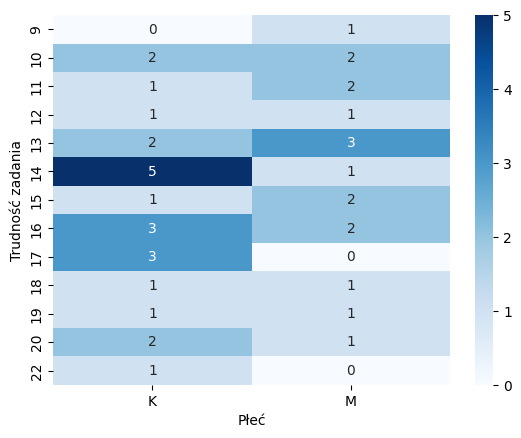

-------------------------------------
Zsumowane grafiki A:
Płeć  K  M
diff      
5     2  0
6     5  8
7     3  3
8     8  4
9     2  0
10    2  0
11    0  2
12    1  0
Chi2 test conducted...
Chi-squared test statistic value: 10.358712046691586
P-value: 0.16914041919463849
Brak podstaw do odrzucenia H0.


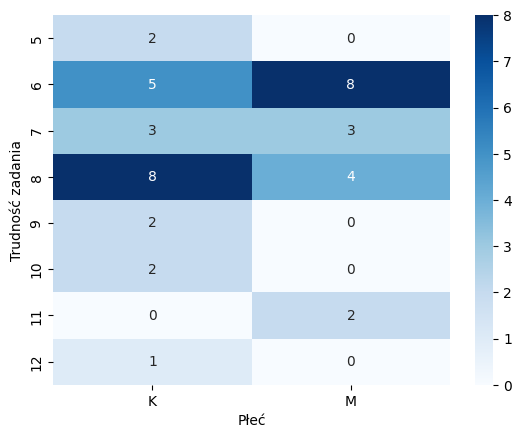

-------------------------------------
Zsumowane grafiki B:
Płeć  K  M
diff      
3     0  1
4     2  2
5     1  4
6     3  0
7     4  4
8     6  4
9     1  1
10    5  0
11    1  0
12    0  1
Chi2 test conducted...
Chi-squared test statistic value: 12.583120204603578
P-value: 0.1823944389132879
Brak podstaw do odrzucenia H0.


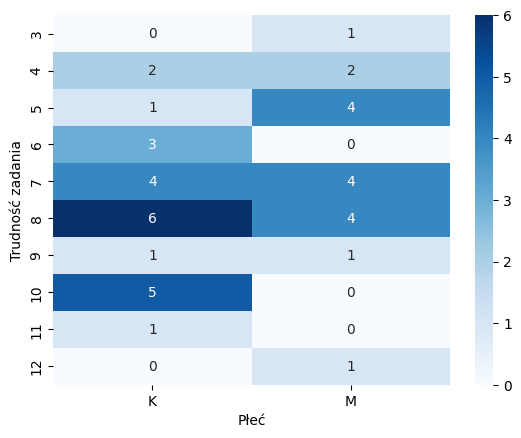

-------------------------------------
Zsumowane grafiki 1:
Płeć   K  M
diff       
2      2  2
3      2  5
4      4  4
5     10  5
6      4  0
7      1  1
Chi2 test conducted...
Chi-squared test statistic value: 6.191694068931921
P-value: 0.28801066708222484
Brak podstaw do odrzucenia H0.


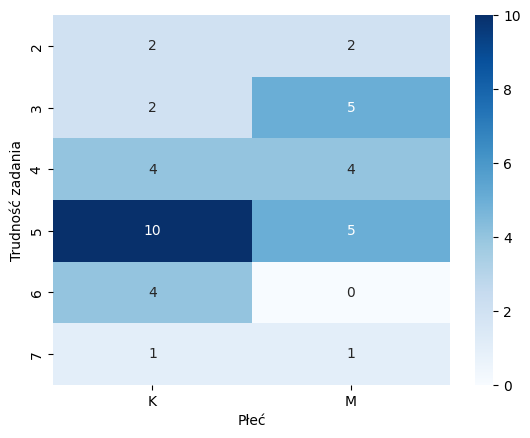

-------------------------------------
Zsumowane grafiki 2:
Płeć  K  M
diff      
2     2  1
3     4  4
4     4  8
5     4  1
6     4  1
7     3  2
8     2  0
Chi2 test conducted...
Chi-squared test statistic value: 6.7178175618073315
P-value: 0.3477333251862887
Brak podstaw do odrzucenia H0.


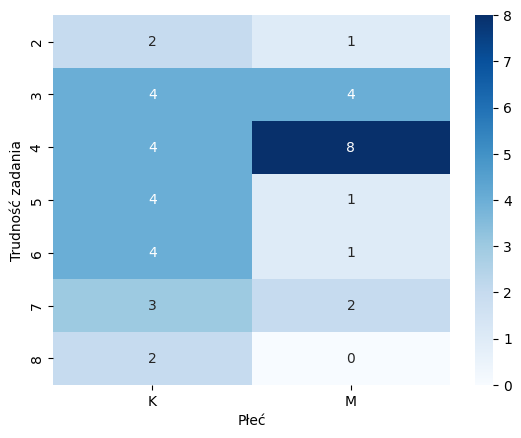

-------------------------------------
Zsumowane grafiki 3:
Płeć  K  M
diff      
2     1  2
3     1  1
4     5  2
5     5  2
6     2  5
7     4  0
8     3  3
9     2  2
Chi2 test conducted...
Chi-squared test statistic value: 7.4582876628912445
P-value: 0.38276998806154305
Brak podstaw do odrzucenia H0.


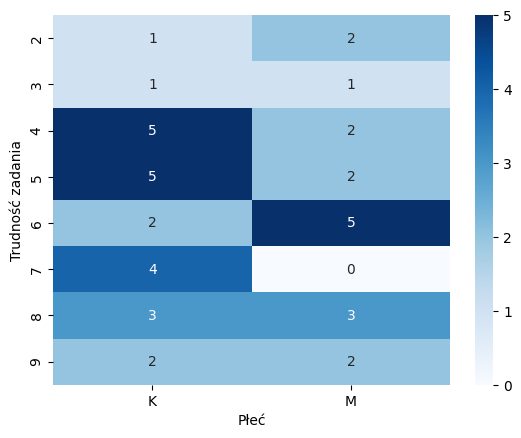

-------------------------------------
Kolekcja wszystkie grafiki:
Płeć   K   M
diff        
1     23  28
2     47  36
3     41  21
4     23  13
5      4   4
Chi2 test conducted...
Chi-squared test statistic value: 5.9104021327224165
P-value: 0.2059401620425938
Brak podstaw do odrzucenia H0.


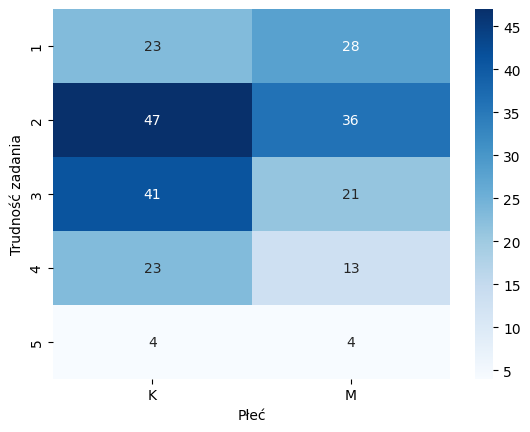

-------------------------------------
Kolekcja grafiki A:
Płeć   K   M
diff        
1      9  13
2     27  15
3     21  14
4     11   7
5      1   2
Chi2 test conducted...
Chi-squared test statistic value: 4.171934913622895
P-value: 0.3832367830379662
Brak podstaw do odrzucenia H0.


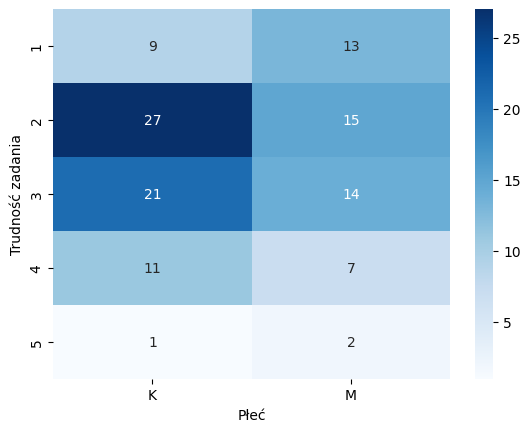

-------------------------------------
Kolekcja grafiki B:
Płeć   K   M
diff        
1     14  15
2     20  21
3     20   7
4     12   6
5      3   2
Chi2 test conducted...
Chi-squared test statistic value: 5.952053464739016
P-value: 0.20275767744072673
Brak podstaw do odrzucenia H0.


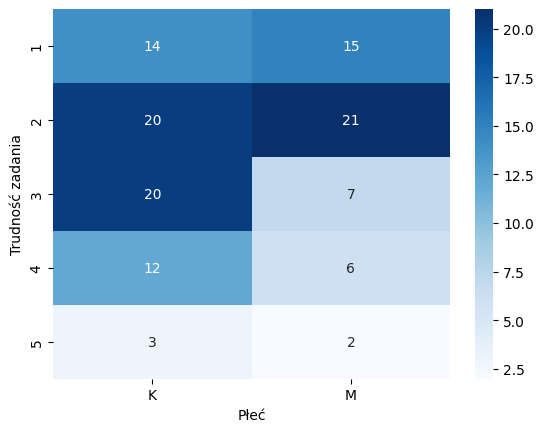

-------------------------------------
Kolekcja grafiki 1:
Płeć   K   M
diff        
1      8  12
2     19  14
3     15   6
4      4   1
5      0   1
Chi2 test conducted...
Chi-squared test statistic value: 6.562371984366871
P-value: 0.1609026234936551
Brak podstaw do odrzucenia H0.


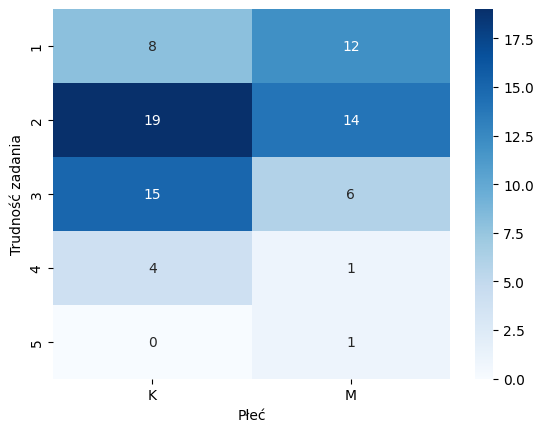

-------------------------------------
Kolekcja grafiki 2:
Płeć   K   M
diff        
1      9  11
2     17  13
3     11   7
4      8   2
5      1   1
Chi2 test conducted...
Chi-squared test statistic value: 3.500994600738846
P-value: 0.4777271293744948
Brak podstaw do odrzucenia H0.


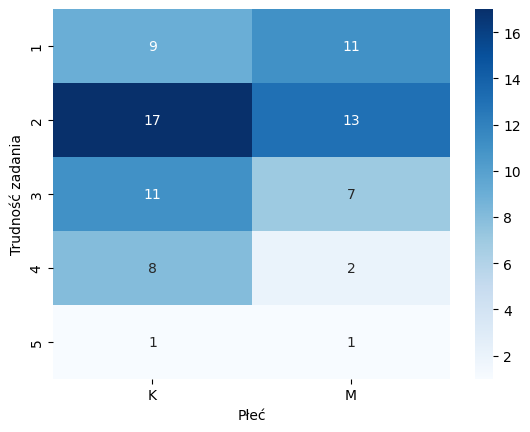

-------------------------------------
Kolekcja grafiki 3:
Płeć   K   M
diff        
1      6   5
2     11   9
3     15   8
4     11  10
5      3   2
Chi2 test conducted...
Chi-squared test statistic value: 0.8889646252039224
P-value: 0.9261386584456756
Brak podstaw do odrzucenia H0.


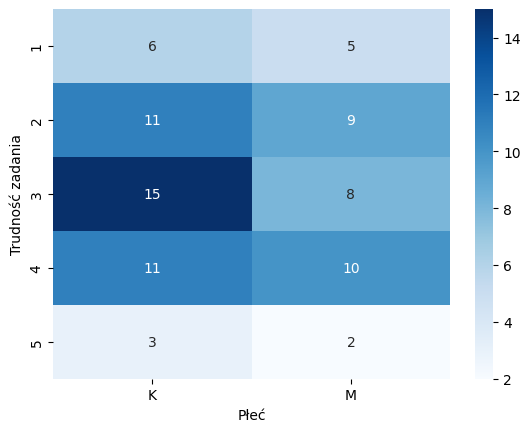

In [11]:
# płeć
var = 'Płeć'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', var, cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
9                 0     1     0     0     0
10                0     1     0     3     0
11                0     0     0     3     0
12                0     0     0     2     0
13                0     0     2     2     1
14                0     2     3     1     0
15                0     0     1     1     1
16                1     1     1     1     1
17                0     1     1     1     0
18                0     2     0     0     0
19                0     0     1     1     0
20                0     0     2     1     0
22                0     0     0     1     0
Chi2 test conducted...
Chi-squared test statistic value: 43.89587046939988
P-value: 0.6416391200564315
Brak podstaw do odrzucenia H0.


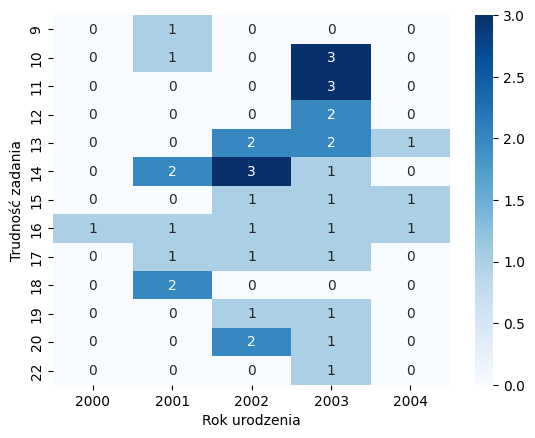

-------------------------------------
Zsumowane grafiki A:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
5                 0     0     1     0     1
6                 0     2     1    10     0
7                 0     1     2     3     0
8                 1     4     4     1     2
9                 0     0     0     2     0
10                0     0     2     0     0
11                0     1     1     0     0
12                0     0     0     1     0
Chi2 test conducted...
Chi-squared test statistic value: 33.32830568124685
P-value: 0.22386574511183313
Brak podstaw do odrzucenia H0.


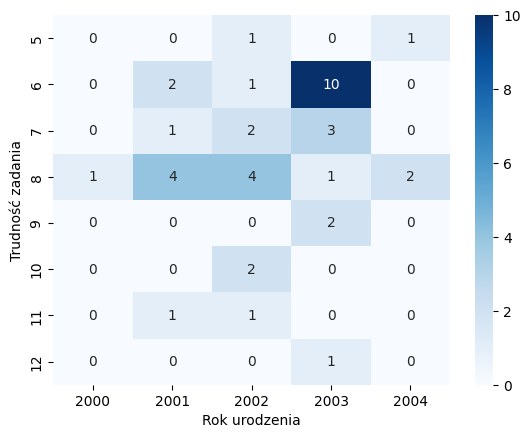

-------------------------------------
Zsumowane grafiki B:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
3                 0     1     0     0     0
4                 0     1     0     3     0
5                 0     0     1     4     0
6                 0     1     1     1     0
7                 0     2     2     3     1
8                 1     1     5     1     2
9                 0     1     0     1     0
10                0     1     1     3     0
11                0     0     0     1     0
12                0     0     1     0     0
Chi2 test conducted...
Chi-squared test statistic value: 26.88368983957219
P-value: 0.8645337787661866
Brak podstaw do odrzucenia H0.


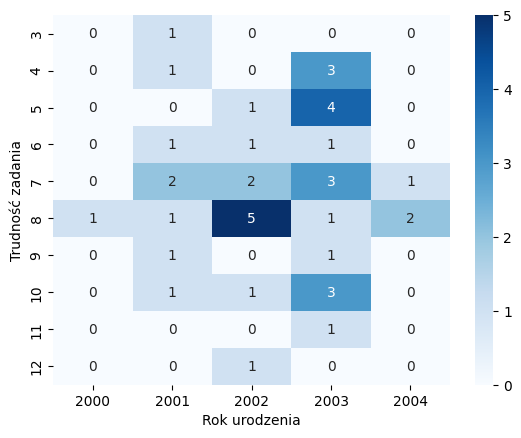

-------------------------------------
Zsumowane grafiki 1:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
2                 0     0     1     3     0
3                 0     1     0     6     0
4                 0     2     4     2     0
5                 1     4     5     4     1
6                 0     0     1     1     2
7                 0     1     0     1     0
Chi2 test conducted...
Chi-squared test statistic value: 25.933961463373226
P-value: 0.16800402594531938
Brak podstaw do odrzucenia H0.


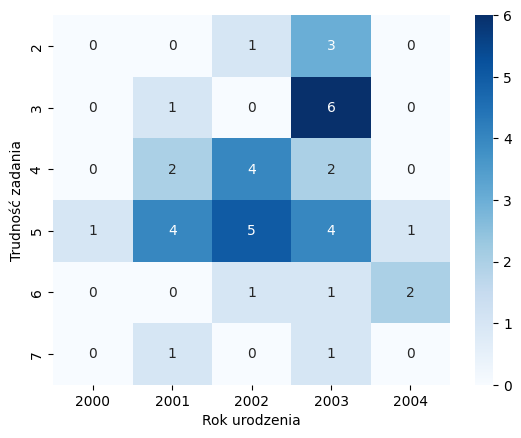

-------------------------------------
Zsumowane grafiki 2:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
2                 0     1     0     0     2
3                 1     2     1     3     1
4                 0     2     3     7     0
5                 0     1     2     2     0
6                 0     1     2     2     0
7                 0     0     2     3     0
8                 0     1     1     0     0
Chi2 test conducted...
Chi-squared test statistic value: 28.759952465834814
P-value: 0.2292960357482431
Brak podstaw do odrzucenia H0.


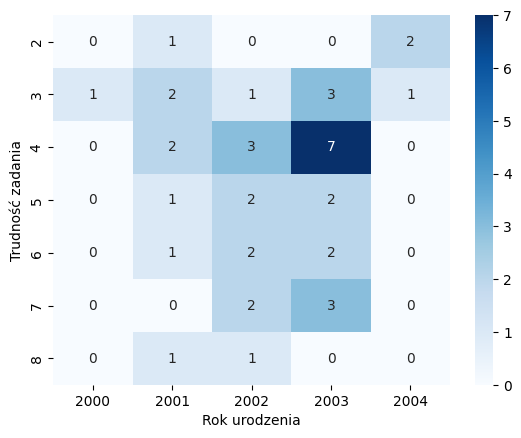

-------------------------------------
Zsumowane grafiki 3:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
2                 0     1     1     1     0
3                 0     1     0     1     0
4                 0     1     1     4     1
5                 0     1     3     3     0
6                 0     0     2     5     0
7                 0     3     0     0     1
8                 1     1     2     2     0
9                 0     0     2     1     1
Chi2 test conducted...
Chi-squared test statistic value: 28.38649096002037
P-value: 0.44411465938920786
Brak podstaw do odrzucenia H0.


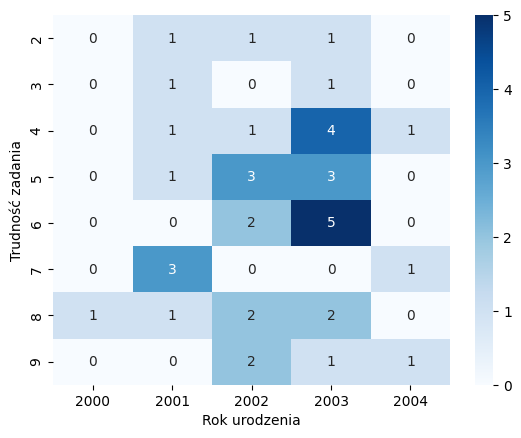

-------------------------------------
Kolekcja wszystkie grafiki:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
1                 1    10    10    24     6
2                 2    17    21    39     4
3                 2    13    20    24     3
4                 0     7    12    13     4
5                 1     1     3     2     1
Chi2 test conducted...
Chi-squared test statistic value: 12.39831397973258
P-value: 0.7161357926771883
Brak podstaw do odrzucenia H0.


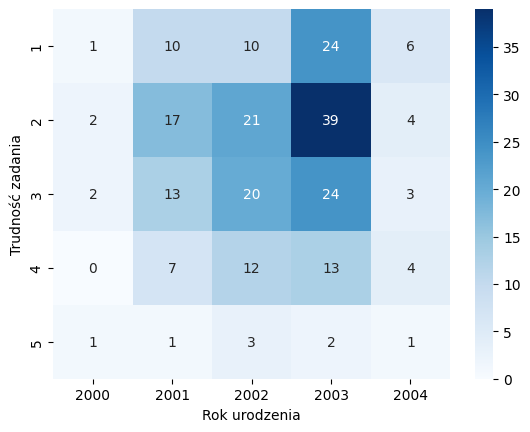

-------------------------------------
Kolekcja grafiki A:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
1                 0     3     6    10     3
2                 1     9     9    21     2
3                 2     8     9    14     2
4                 0     3     8     5     2
5                 0     1     1     1     0
Chi2 test conducted...
Chi-squared test statistic value: 9.883030714581517
P-value: 0.8726648870012662
Brak podstaw do odrzucenia H0.


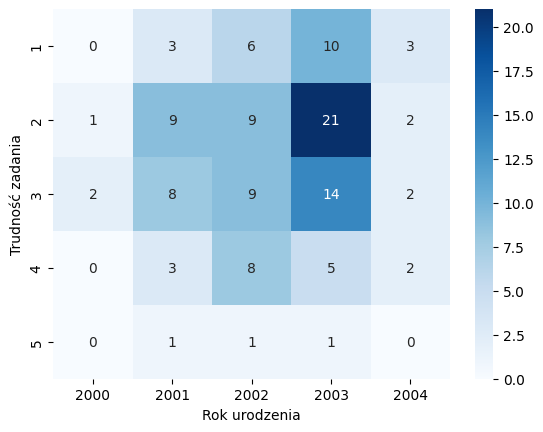

-------------------------------------
Kolekcja grafiki B:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
1                 1     7     4    14     3
2                 1     8    12    18     2
3                 0     5    11    10     1
4                 0     4     4     8     2
5                 1     0     2     1     1
Chi2 test conducted...
Chi-squared test statistic value: 16.50775692300124
P-value: 0.4181191891680814
Brak podstaw do odrzucenia H0.


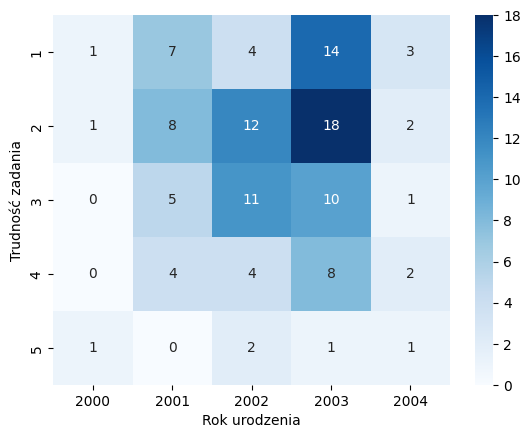

-------------------------------------
Kolekcja grafiki 1:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
1                 0     1     5    14     0
2                 1    10     8    11     3
3                 1     4     8     7     1
4                 0     0     1     2     2
5                 0     1     0     0     0
Chi2 test conducted...
Chi-squared test statistic value: 24.732016498059277
P-value: 0.07469112932898796
Brak podstaw do odrzucenia H0.


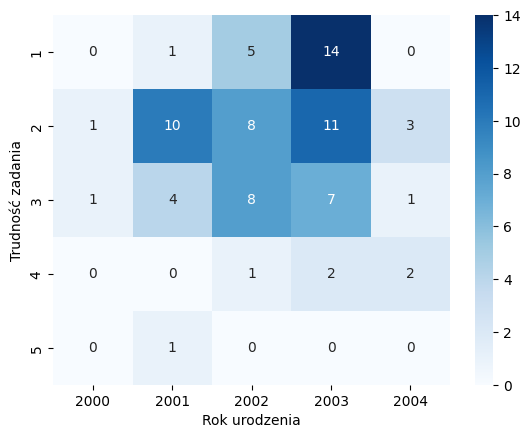

-------------------------------------
Kolekcja grafiki 2:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
1                 1     5     2     7     5
2                 1     5    10    13     1
3                 0     4     4    10     0
4                 0     2     5     3     0
5                 0     0     1     1     0
Chi2 test conducted...
Chi-squared test statistic value: 19.68107546048722
P-value: 0.2349295608706114
Brak podstaw do odrzucenia H0.


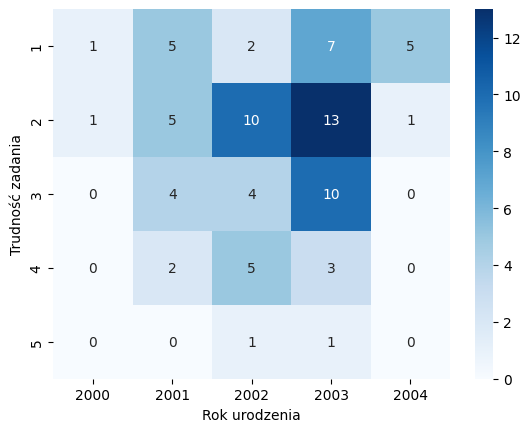

-------------------------------------
Kolekcja grafiki 3:
Rok_urodzenia  2000  2001  2002  2003  2004
diff                                       
1                 0     4     3     3     1
2                 0     2     3    15     0
3                 1     5     8     7     2
4                 0     5     6     8     2
5                 1     0     2     1     1
Chi2 test conducted...
Chi-squared test statistic value: 23.0593029642088
P-value: 0.11215836893738082
Brak podstaw do odrzucenia H0.


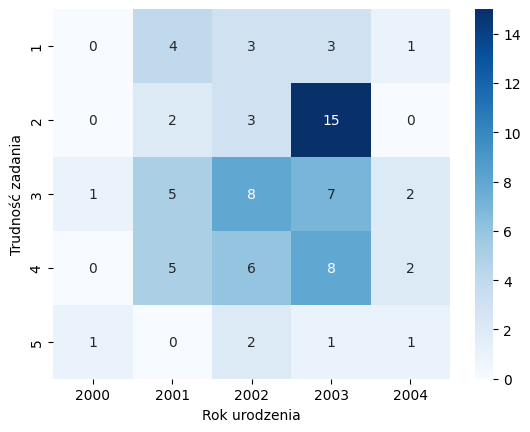

In [12]:
# rok urodzenia
var = 'Rok_urodzenia'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Rok urodzenia', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
9                         1                        0                 0
10                        4                        0                 0
11                        3                        0                 0
12                        2                        0                 0
13                        3                        2                 0
14                        4                        1                 1
15                        2                        1                 0
16                        4                        1                 0
17                        3                        0                 0
18                        2                        0                 0
19                        1                        0                 1
20        

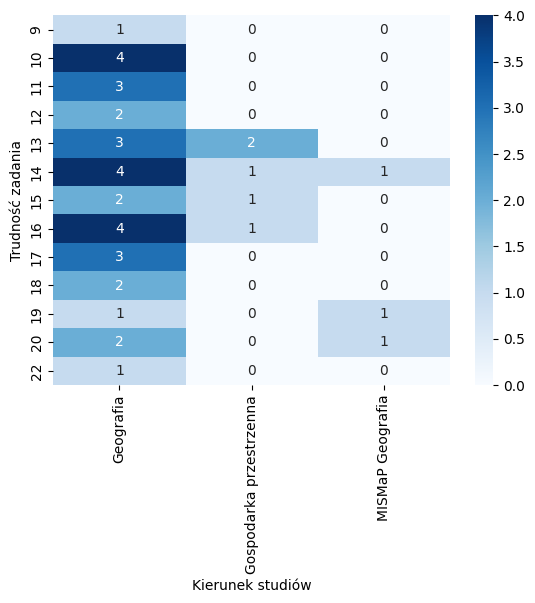

-------------------------------------
Zsumowane grafiki A:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
5                         2                        0                 0
6                        10                        3                 0
7                         6                        0                 0
8                         8                        2                 2
9                         2                        0                 0
10                        2                        0                 0
11                        1                        0                 1
12                        1                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 12.473290598290598
P-value: 0.5683499816211438
Brak podstaw do odrzucenia H0.


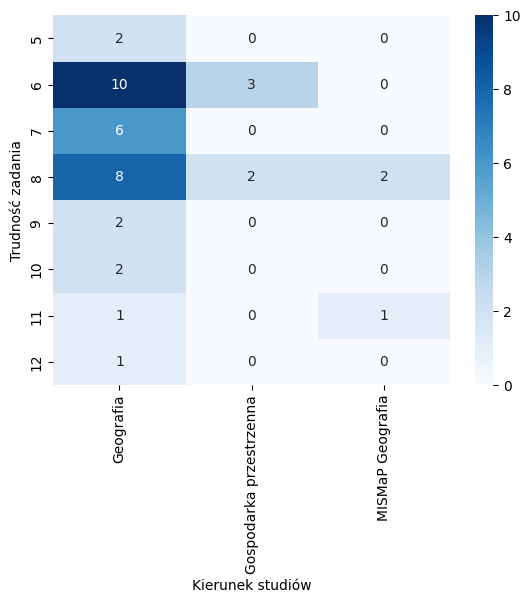

-------------------------------------
Zsumowane grafiki B:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
3                         1                        0                 0
4                         4                        0                 0
5                         5                        0                 0
6                         1                        1                 1
7                         6                        2                 0
8                         8                        1                 1
9                         1                        1                 0
10                        5                        0                 0
11                        1                        0                 0
12                        0                        0                 1
Chi2 test conducted...
Chi-squared test statistic value: 25.244444444444447
P-value: 0.11

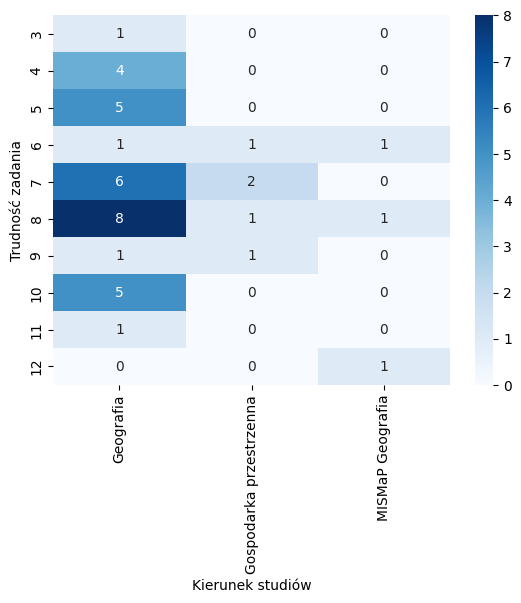

-------------------------------------
Zsumowane grafiki 1:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
2                         4                        0                 0
3                         5                        2                 0
4                         5                        1                 2
5                        12                        2                 1
6                         4                        0                 0
7                         2                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 8.130853174603175
P-value: 0.6160570122205657
Brak podstaw do odrzucenia H0.


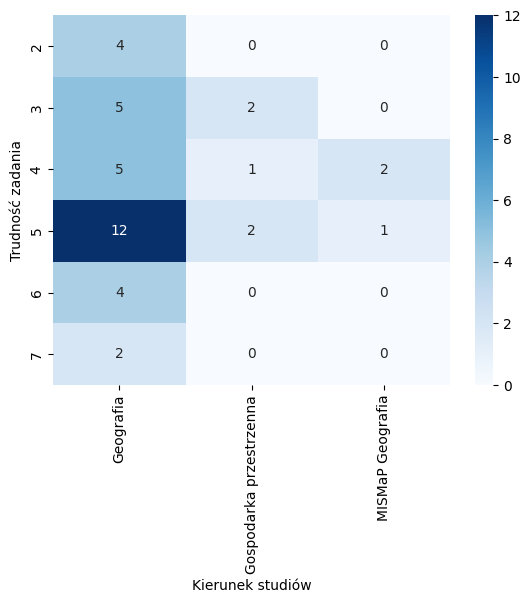

-------------------------------------
Zsumowane grafiki 2:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
2                         3                        0                 0
3                         7                        0                 1
4                         8                        4                 0
5                         5                        0                 0
6                         5                        0                 0
7                         3                        0                 2
8                         1                        1                 0
Chi2 test conducted...
Chi-squared test statistic value: 20.447916666666668
P-value: 0.059073286876352896
Brak podstaw do odrzucenia H0.


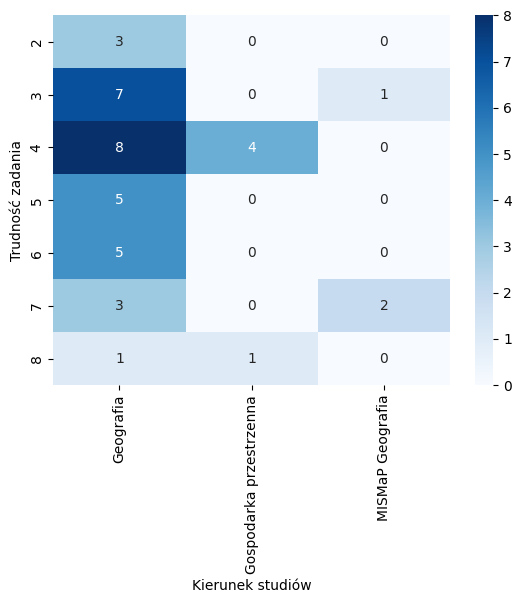

-------------------------------------
Zsumowane grafiki 3:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
2                         2                        1                 0
3                         2                        0                 0
4                         7                        0                 0
5                         7                        0                 0
6                         4                        3                 0
7                         2                        1                 1
8                         4                        0                 2
9                         4                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 21.281746031746035
P-value: 0.09462733445415142
Brak podstaw do odrzucenia H0.


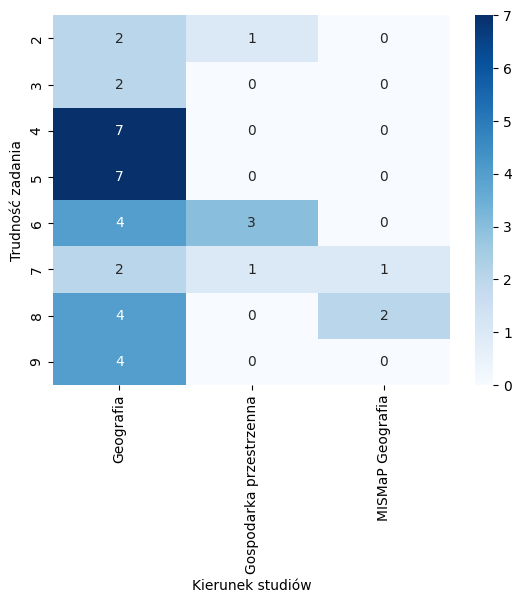

-------------------------------------
Kolekcja wszystkie grafiki:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
1                        42                        7                 2
2                        68                       10                 5
3                        50                        8                 4
4                        25                        5                 6
5                         7                        0                 1
Chi2 test conducted...
Chi-squared test statistic value: 7.275837934279814
P-value: 0.507185342483099
Brak podstaw do odrzucenia H0.


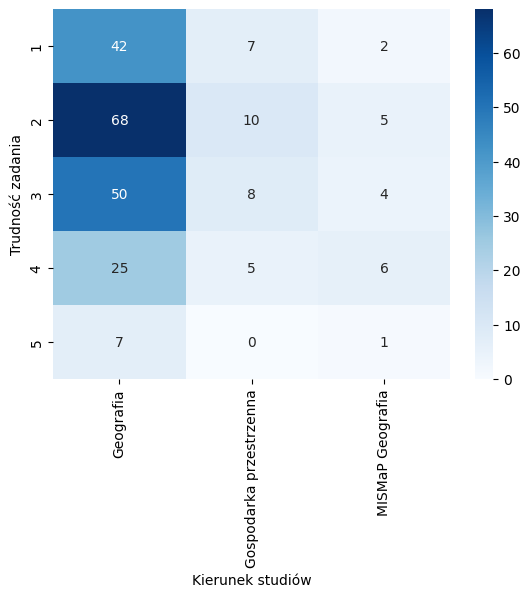

-------------------------------------
Kolekcja grafiki A:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
1                        18                        4                 0
2                        34                        4                 4
3                        28                        6                 1
4                        13                        1                 4
5                         3                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 11.150949975949976
P-value: 0.19329199396988456
Brak podstaw do odrzucenia H0.


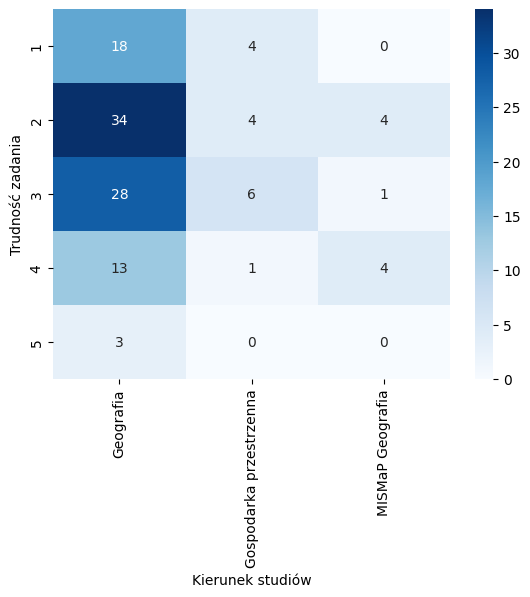

-------------------------------------
Kolekcja grafiki B:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
1                        24                        3                 2
2                        34                        6                 1
3                        22                        2                 3
4                        12                        4                 2
5                         4                        0                 1
Chi2 test conducted...
Chi-squared test statistic value: 6.520699000093449
P-value: 0.5891126260378607
Brak podstaw do odrzucenia H0.


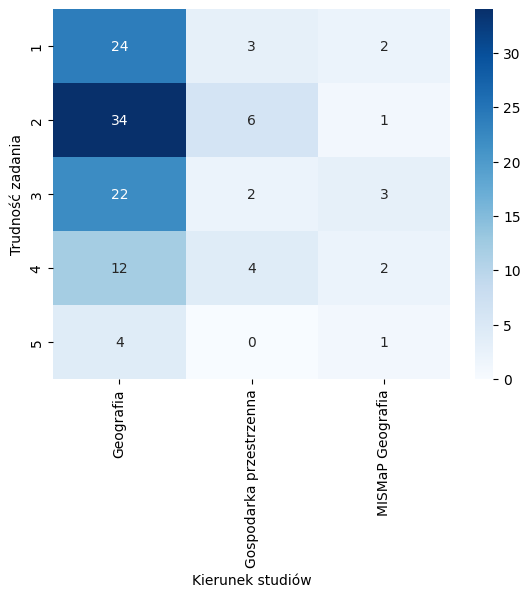

-------------------------------------
Kolekcja grafiki 1:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
1                        16                        3                 1
2                        26                        4                 3
3                        16                        3                 2
4                         5                        0                 0
5                         1                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 2.094227994227994
P-value: 0.977986014068073
Brak podstaw do odrzucenia H0.


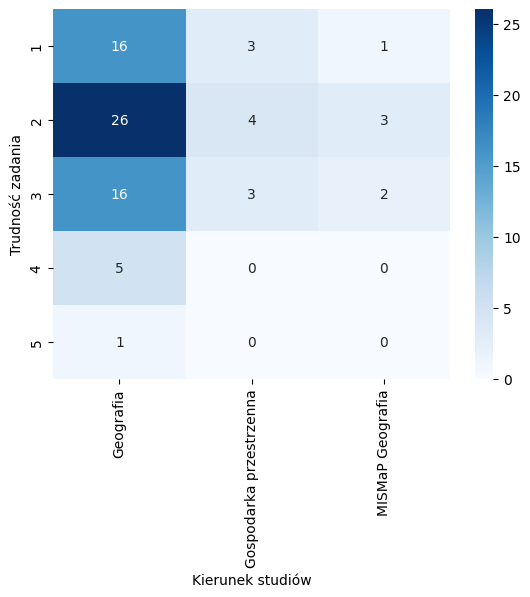

-------------------------------------
Kolekcja grafiki 2:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
1                        17                        2                 1
2                        24                        4                 2
3                        15                        2                 1
4                         7                        2                 1
5                         1                        0                 1
Chi2 test conducted...
Chi-squared test statistic value: 6.467129629629629
P-value: 0.5950559003549029
Brak podstaw do odrzucenia H0.


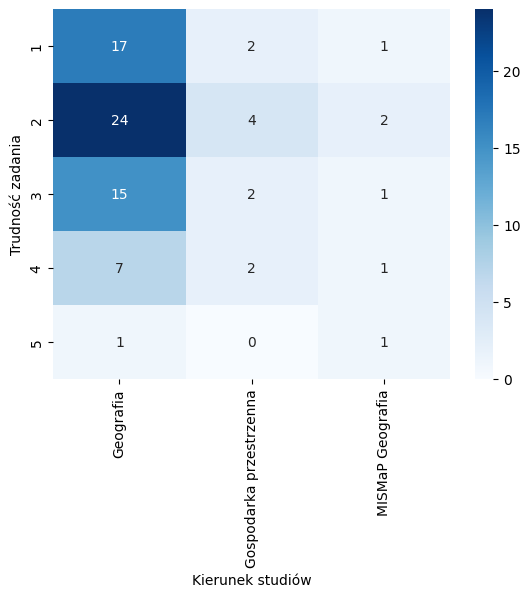

-------------------------------------
Kolekcja grafiki 3:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
diff                                                                  
1                         9                        2                 0
2                        18                        2                 0
3                        19                        3                 1
4                        13                        3                 5
5                         5                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 12.90445761967501
P-value: 0.11517947597210915
Brak podstaw do odrzucenia H0.


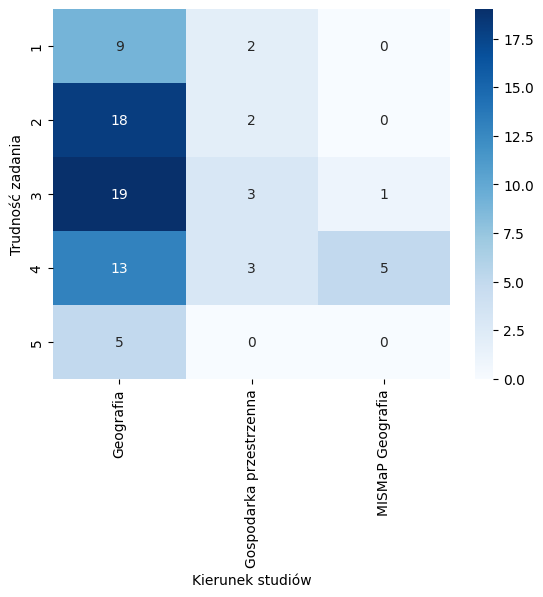

In [13]:
# kierunek studiów
var = 'Kierunek_studiów'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Kierunek studiów', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Rok_studiów  1  2  3
diff                
9            0  0  1
10           3  0  1
11           3  0  0
12           2  0  0
13           4  1  0
14           2  2  2
15           2  1  0
16           2  1  2
17           2  0  1
18           0  0  2
19           1  1  0
20           1  2  0
22           1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 27.16183574879227
P-value: 0.29696618338935205
Brak podstaw do odrzucenia H0.


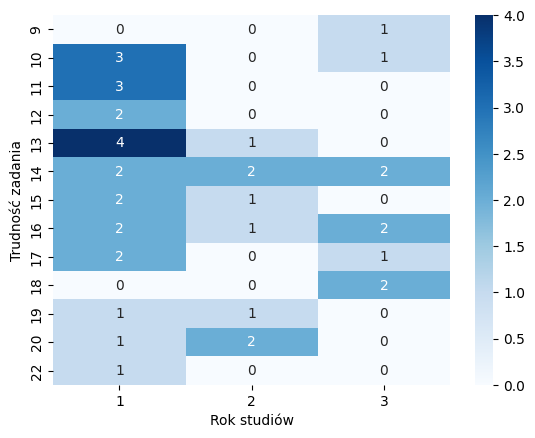

-------------------------------------
Zsumowane grafiki A:
Rok_studiów   1  2  3
diff                 
5             2  0  0
6            10  1  2
7             3  2  1
8             5  3  4
9             2  0  0
10            0  1  1
11            0  1  1
12            1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 13.252043849869937
P-value: 0.5067805369863833
Brak podstaw do odrzucenia H0.


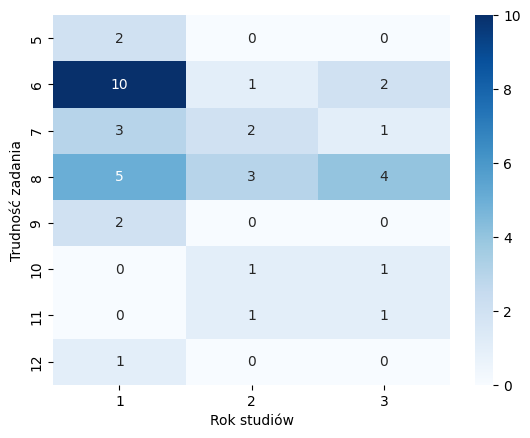

-------------------------------------
Zsumowane grafiki B:
Rok_studiów  1  2  3
diff                
3            0  0  1
4            3  0  1
5            4  1  0
6            2  0  1
7            4  1  3
8            4  4  2
9            2  0  0
10           3  1  1
11           1  0  0
12           0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 16.734500805152983
P-value: 0.5414246097575801
Brak podstaw do odrzucenia H0.


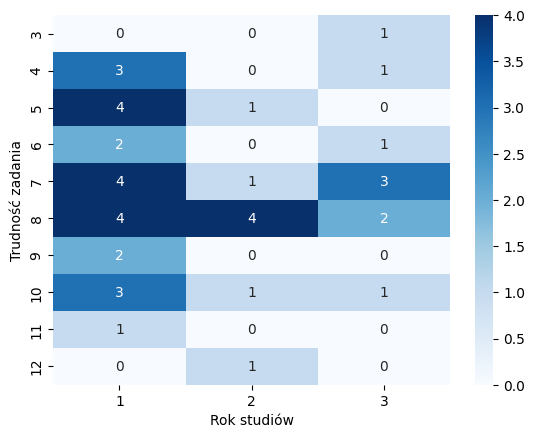

-------------------------------------
Zsumowane grafiki 1:
Rok_studiów  1  2  3
diff                
2            3  1  0
3            6  0  1
4            4  2  2
5            6  5  4
6            3  0  1
7            1  0  1
Chi2 test conducted...
Chi-squared test statistic value: 8.306475730388774
P-value: 0.598928059587137
Brak podstaw do odrzucenia H0.


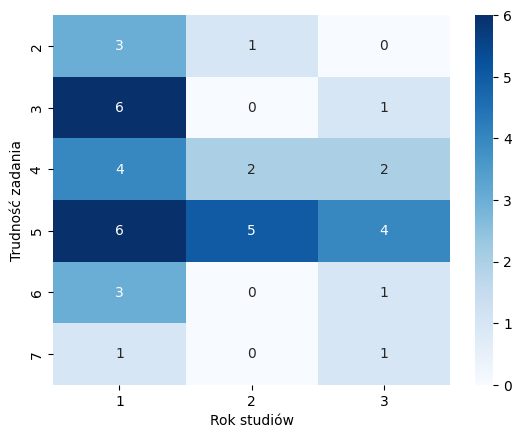

-------------------------------------
Zsumowane grafiki 2:
Rok_studiów  1  2  3
diff                
2            2  0  1
3            4  1  3
4            8  2  2
5            2  1  2
6            2  2  1
7            3  2  0
8            2  0  0
Chi2 test conducted...
Chi-squared test statistic value: 8.162842190016102
P-value: 0.7722788186617241
Brak podstaw do odrzucenia H0.


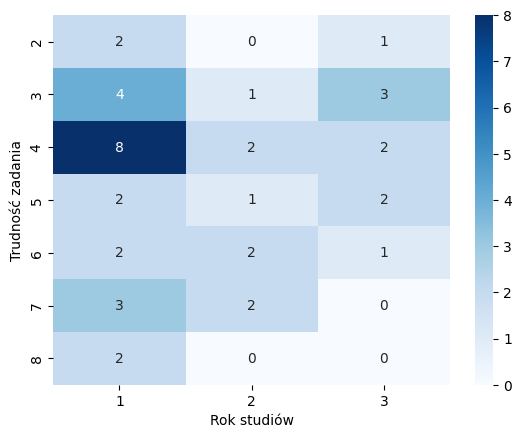

-------------------------------------
Zsumowane grafiki 3:
Rok_studiów  1  2  3
diff                
2            2  0  1
3            1  0  1
4            6  1  0
5            4  2  1
6            5  1  1
7            1  0  3
8            2  2  2
9            2  2  0
Chi2 test conducted...
Chi-squared test statistic value: 16.207729468599034
P-value: 0.30085379280505503
Brak podstaw do odrzucenia H0.


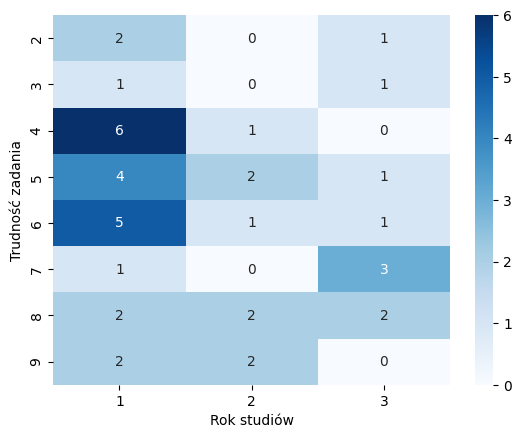

-------------------------------------
Kolekcja wszystkie grafiki:
Rok_studiów   1   2   3
diff                   
1            35   6  10
2            47  16  20
3            32  14  16
4            21   9   6
5             3   3   2
Chi2 test conducted...
Chi-squared test statistic value: 6.827894473511384
P-value: 0.5553104756615854
Brak podstaw do odrzucenia H0.


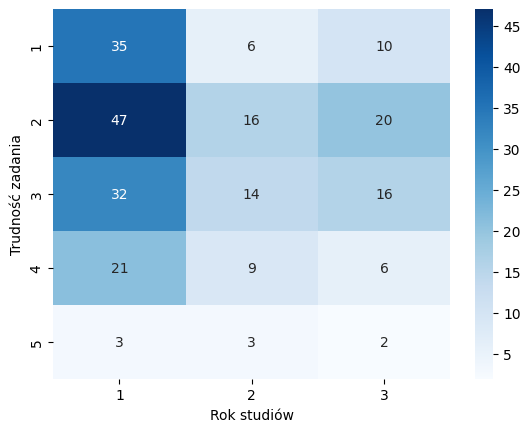

-------------------------------------
Kolekcja grafiki A:
Rok_studiów   1  2   3
diff                  
1            16  4   2
2            25  7  10
3            18  6  11
4             9  6   3
5             1  1   1
Chi2 test conducted...
Chi-squared test statistic value: 7.36034255599473
P-value: 0.49829961039394355
Brak podstaw do odrzucenia H0.


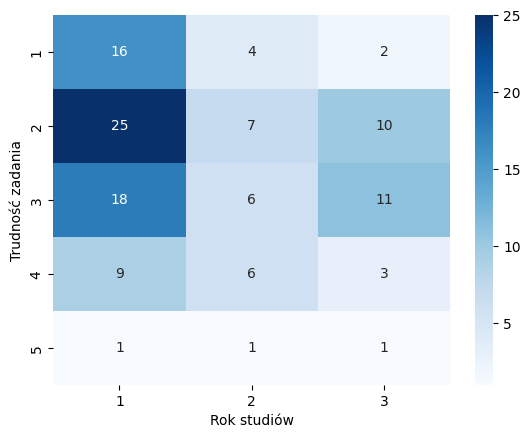

-------------------------------------
Kolekcja grafiki B:
Rok_studiów   1  2   3
diff                  
1            19  2   8
2            22  9  10
3            14  8   5
4            12  3   3
5             2  2   1
Chi2 test conducted...
Chi-squared test statistic value: 6.9029754168384025
P-value: 0.5471362558408179
Brak podstaw do odrzucenia H0.


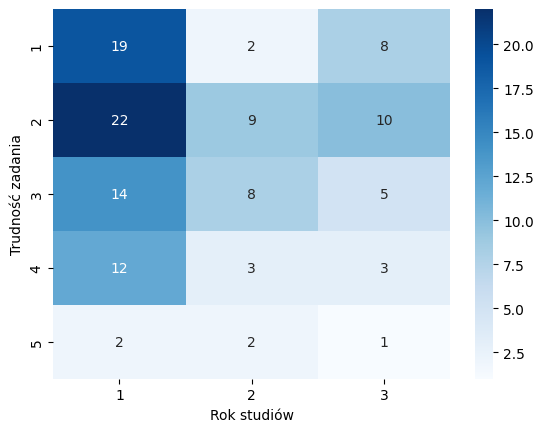

-------------------------------------
Kolekcja grafiki 1:
Rok_studiów   1  2   3
diff                  
1            16  3   1
2            15  7  11
3            11  6   4
4             4  0   1
5             0  0   1
Chi2 test conducted...
Chi-squared test statistic value: 13.188264633916807
P-value: 0.10553409589981852
Brak podstaw do odrzucenia H0.


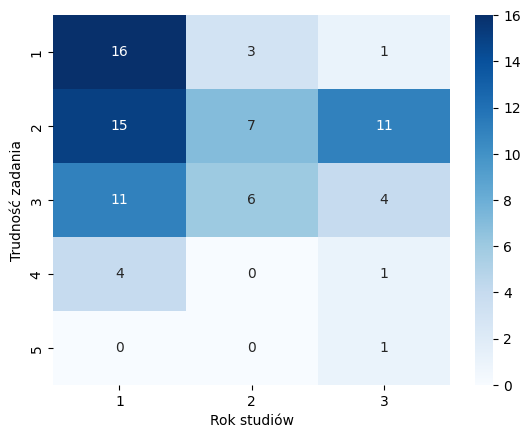

-------------------------------------
Kolekcja grafiki 2:
Rok_studiów   1  2  3
diff                 
1            12  2  6
2            16  7  7
3            10  3  5
4             7  3  0
5             1  1  0
Chi2 test conducted...
Chi-squared test statistic value: 6.514224369296833
P-value: 0.5898303052393401
Brak podstaw do odrzucenia H0.


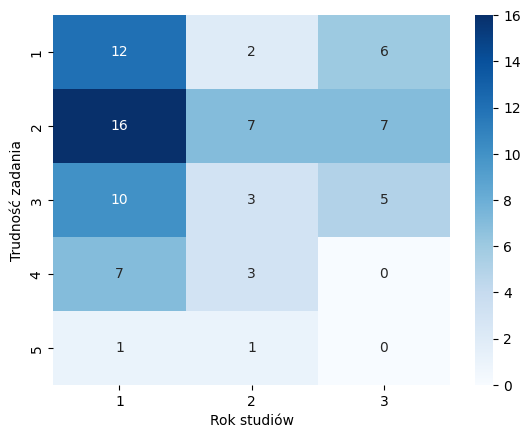

-------------------------------------
Kolekcja grafiki 3:
Rok_studiów   1  2  3
diff                 
1             7  1  3
2            16  2  2
3            11  5  7
4            10  6  5
5             2  2  1
Chi2 test conducted...
Chi-squared test statistic value: 8.464623733054735
P-value: 0.3894480384367873
Brak podstaw do odrzucenia H0.


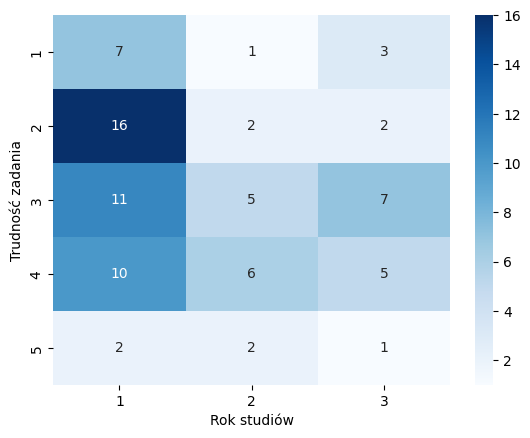

In [14]:
# rok studiów
var = 'Rok_studiów'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Rok studiów', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
9               0        1       0         0
10              1        1       0         2
11              1        2       0         0
12              1        1       0         0
13              2        1       2         0
14              0        4       1         1
15              1        1       1         0
16              1        2       1         1
17              1        2       0         0
18              0        2       0         0
19              1        0       0         1
20              0        1       0         2
22              0        0       0         1
Chi2 test conducted...
Chi-squared test statistic value: 31.333333333333332
P-value: 0.6901106579212577
Brak podstaw do odrzucenia H0.


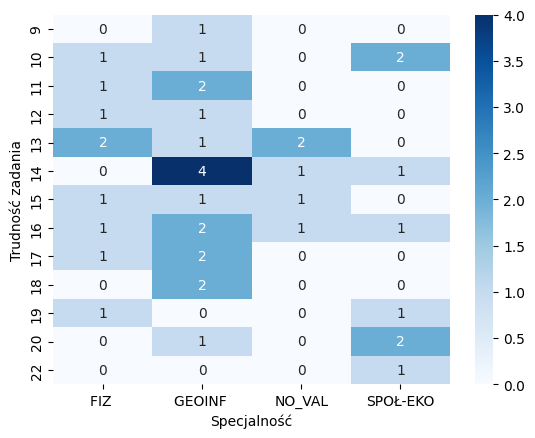

-------------------------------------
Zsumowane grafiki A:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
5               2        0       0         0
6               3        5       3         2
7               0        5       0         1
8               3        6       2         1
9               1        0       0         1
10              0        1       0         1
11              0        1       0         1
12              0        0       0         1
Chi2 test conducted...
Chi-squared test statistic value: 23.43660968660969
P-value: 0.3211482771212411
Brak podstaw do odrzucenia H0.


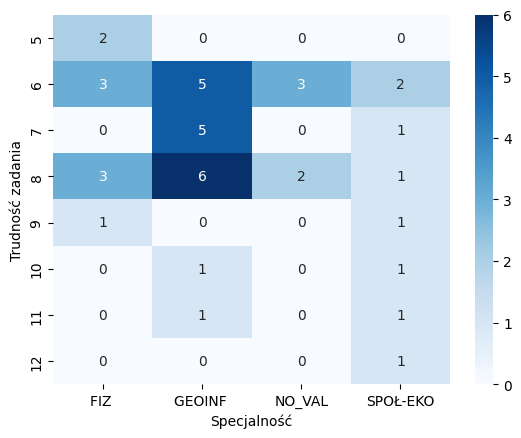

-------------------------------------
Zsumowane grafiki B:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
3               0        1       0         0
4               1        1       0         2
5               1        4       0         0
6               1        1       1         0
7               1        4       2         1
8               3        4       1         2
9               1        0       1         0
10              1        2       0         2
11              0        0       0         1
12              0        1       0         0
Chi2 test conducted...
Chi-squared test statistic value: 21.869444444444444
P-value: 0.7439816676378627
Brak podstaw do odrzucenia H0.


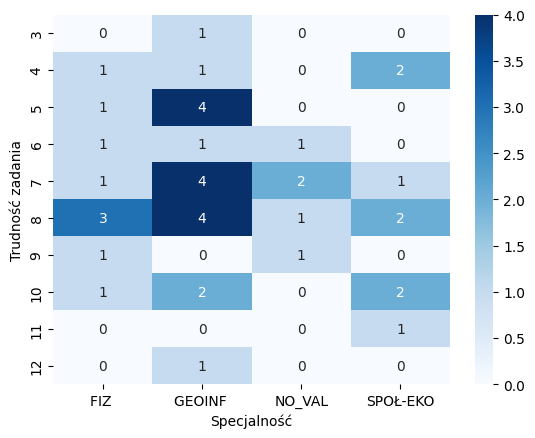

-------------------------------------
Zsumowane grafiki 1:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
2               2        1       0         1
3               1        3       2         1
4               2        3       1         2
5               2        9       2         2
6               2        1       0         1
7               0        1       0         1
Chi2 test conducted...
Chi-squared test statistic value: 9.762962962962963
P-value: 0.8343793109738983
Brak podstaw do odrzucenia H0.


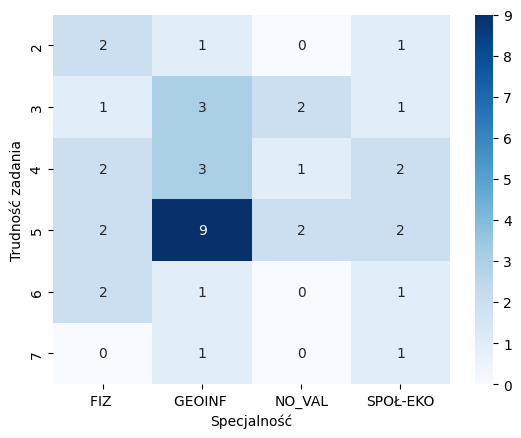

-------------------------------------
Zsumowane grafiki 2:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
2               1        2       0         0
3               3        4       0         1
4               2        4       4         2
5               0        4       0         1
6               2        2       0         1
7               0        2       0         3
8               1        0       1         0
Chi2 test conducted...
Chi-squared test statistic value: 22.736111111111107
P-value: 0.20093532067137537
Brak podstaw do odrzucenia H0.


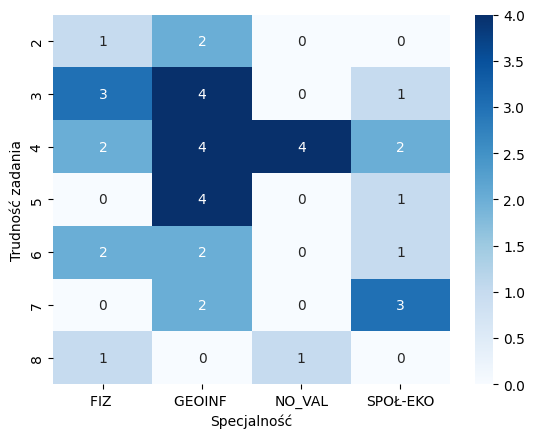

-------------------------------------
Zsumowane grafiki 3:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
2               0        1       1         1
3               0        2       0         0
4               4        2       0         1
5               2        5       0         0
6               0        2       3         2
7               1        2       1         0
8               1        3       0         2
9               1        1       0         2
Chi2 test conducted...
Chi-squared test statistic value: 25.95767195767196
P-value: 0.20806761457405
Brak podstaw do odrzucenia H0.


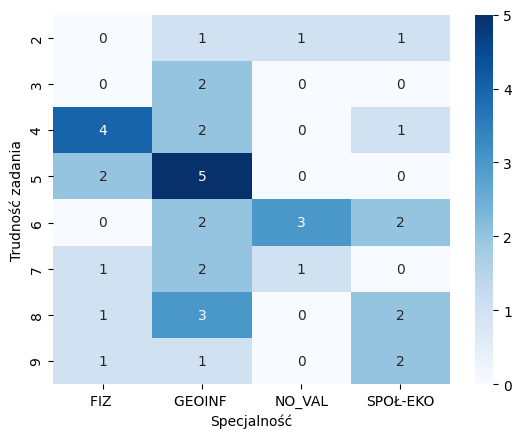

-------------------------------------
Kolekcja wszystkie grafiki:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
1              14       21       7         9
2              19       41      10        13
3              11       32       8        11
4               9       10       5        12
5               1        4       0         3
Chi2 test conducted...
Chi-squared test statistic value: 11.826241962720513
P-value: 0.4597334606603727
Brak podstaw do odrzucenia H0.


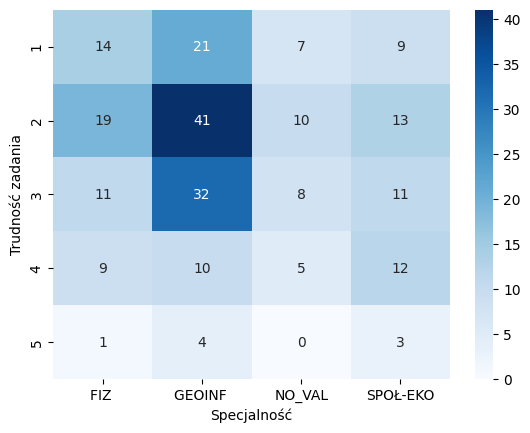

-------------------------------------
Kolekcja grafiki A:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
1               7        8       4         3
2              11       20       4         7
3               5       19       6         5
4               3        6       1         8
5               1        1       0         1
Chi2 test conducted...
Chi-squared test statistic value: 13.74949494949495
P-value: 0.31699036855552704
Brak podstaw do odrzucenia H0.


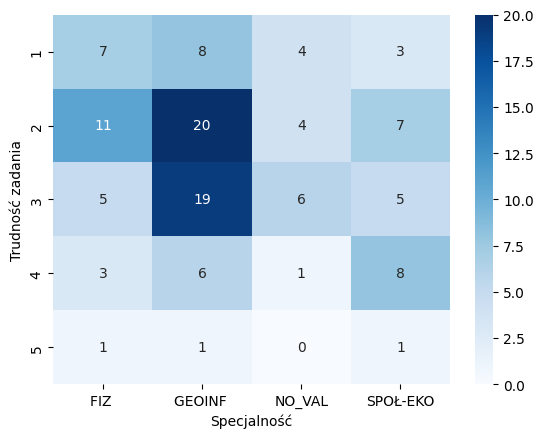

-------------------------------------
Kolekcja grafiki B:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
1               7       13       3         6
2               8       21       6         6
3               6       13       2         6
4               6        4       4         4
5               0        3       0         2
Chi2 test conducted...
Chi-squared test statistic value: 9.511163719555459
P-value: 0.6587606703953186
Brak podstaw do odrzucenia H0.


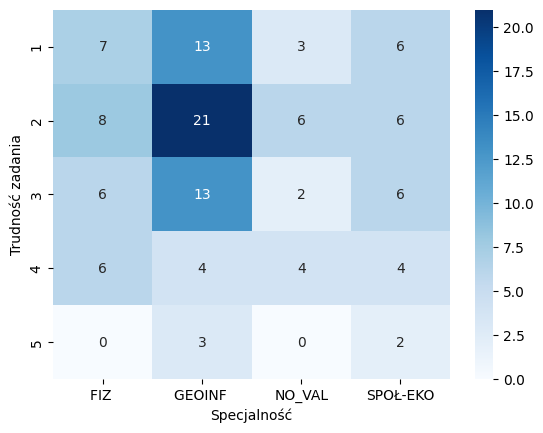

-------------------------------------
Kolekcja grafiki 1:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
1               6        6       3         5
2               7       18       4         4
3               3       10       3         5
4               2        1       0         2
5               0        1       0         0
Chi2 test conducted...
Chi-squared test statistic value: 8.66048581048581
P-value: 0.7316232053272986
Brak podstaw do odrzucenia H0.


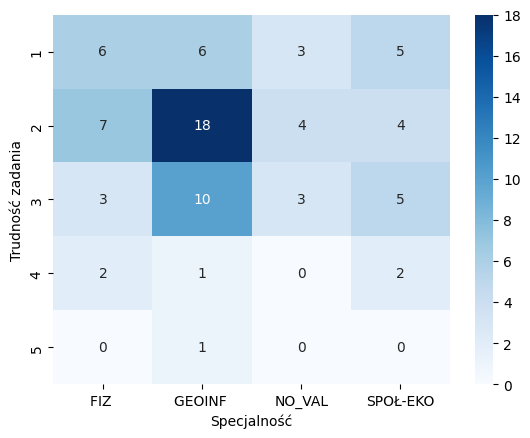

-------------------------------------
Kolekcja grafiki 2:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
1               6       10       2         2
2               6       14       4         6
3               3        9       2         4
4               3        2       2         3
5               0        1       0         1
Chi2 test conducted...
Chi-squared test statistic value: 6.474074074074075
P-value: 0.8903266312638592
Brak podstaw do odrzucenia H0.


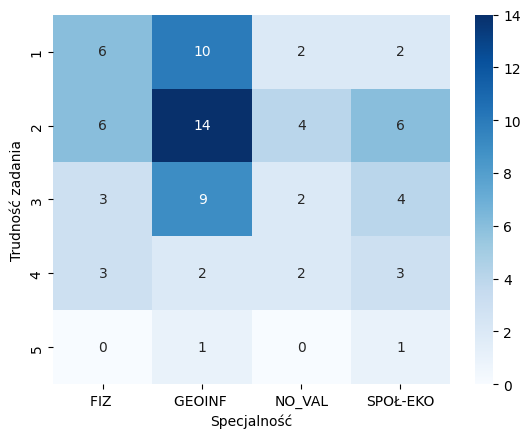

-------------------------------------
Kolekcja grafiki 3:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
diff                                        
1               2        5       2         2
2               6        9       2         3
3               5       13       3         2
4               4        7       3         7
5               1        2       0         2
Chi2 test conducted...
Chi-squared test statistic value: 7.736693017127799
P-value: 0.8053536167384536
Brak podstaw do odrzucenia H0.


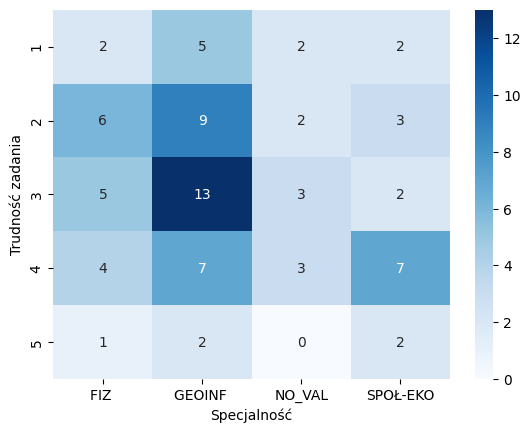

In [15]:
# specjalność
var = 'Specjalność'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', var, cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Wady_wzroku  0  1
diff             
9            1  0
10           3  1
11           1  2
12           1  1
13           1  4
14           2  4
15           0  3
16           3  2
17           1  2
18           1  1
19           1  1
20           1  2
22           0  1
Chi2 test conducted...
Chi-squared test statistic value: 8.402777777777779
P-value: 0.7529160311661997
Brak podstaw do odrzucenia H0.


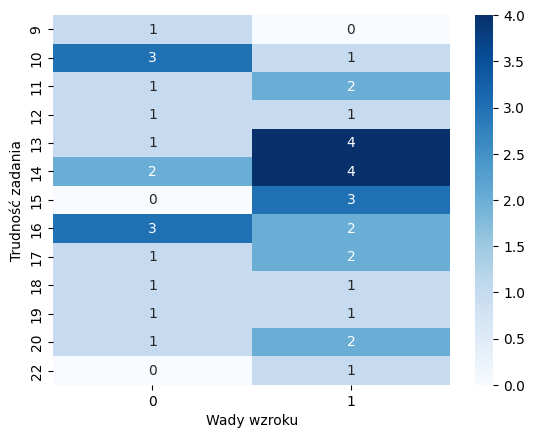

-------------------------------------
Zsumowane grafiki A:
Wady_wzroku  0  1
diff             
5            1  1
6            6  7
7            1  5
8            5  7
9            0  2
10           2  0
11           1  1
12           0  1
Chi2 test conducted...
Chi-squared test statistic value: 6.746794871794872
P-value: 0.4557111008276795
Brak podstaw do odrzucenia H0.


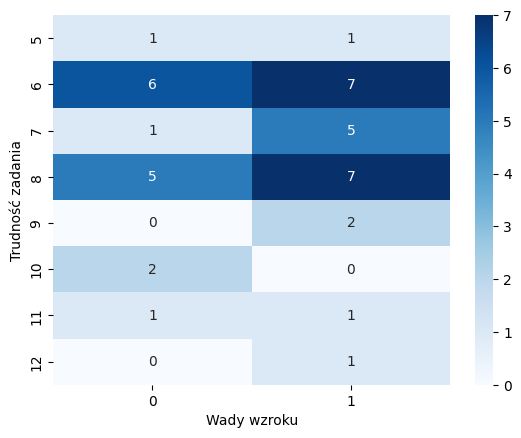

-------------------------------------
Zsumowane grafiki B:
Wady_wzroku  0  1
diff             
3            1  0
4            3  1
5            1  4
6            2  1
7            2  6
8            5  5
9            0  2
10           2  3
11           0  1
12           0  1
Chi2 test conducted...
Chi-squared test statistic value: 9.097222222222225
P-value: 0.42834859783689333
Brak podstaw do odrzucenia H0.


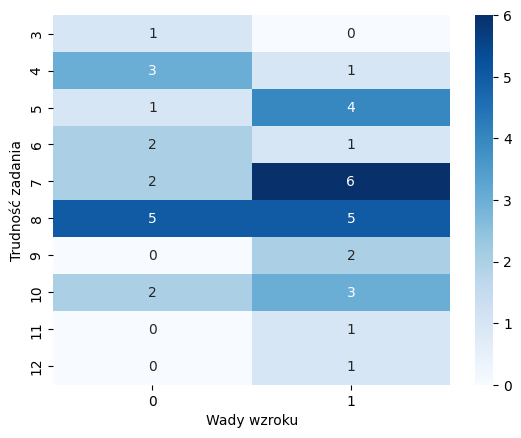

-------------------------------------
Zsumowane grafiki 1:
Wady_wzroku  0   1
diff              
2            1   3
3            4   3
4            4   4
5            5  10
6            2   2
7            0   2
Chi2 test conducted...
Chi-squared test statistic value: 3.3432539682539684
P-value: 0.6472263084301728
Brak podstaw do odrzucenia H0.


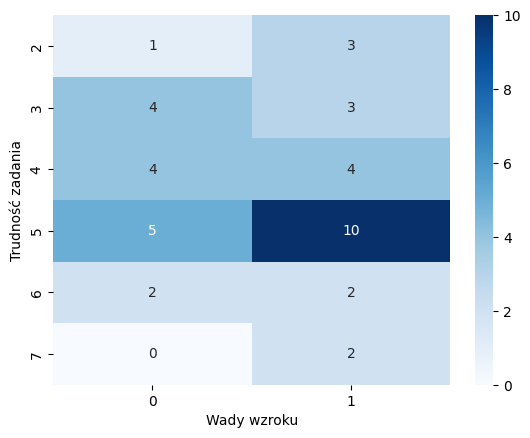

-------------------------------------
Zsumowane grafiki 2:
Wady_wzroku  0   1
diff              
2            1   2
3            6   2
4            1  11
5            4   1
6            3   2
7            1   4
8            0   2
Chi2 test conducted...
Chi-squared test statistic value: 15.486111111111112
P-value: 0.016794797452690875
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


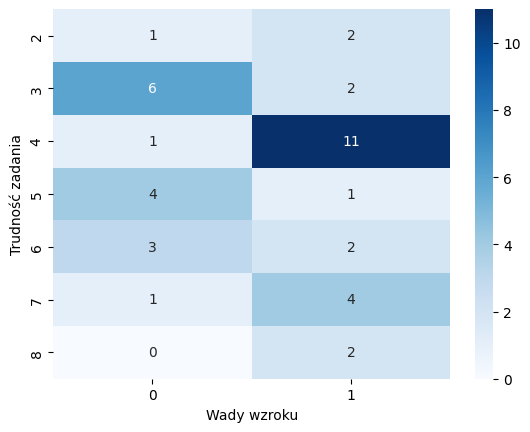

-------------------------------------
Zsumowane grafiki 3:
Wady_wzroku  0  1
diff             
2            2  1
3            2  0
4            3  4
5            1  6
6            1  6
7            2  2
8            3  3
9            2  2
Chi2 test conducted...
Chi-squared test statistic value: 8.353174603174601
P-value: 0.3024835519140615
Brak podstaw do odrzucenia H0.


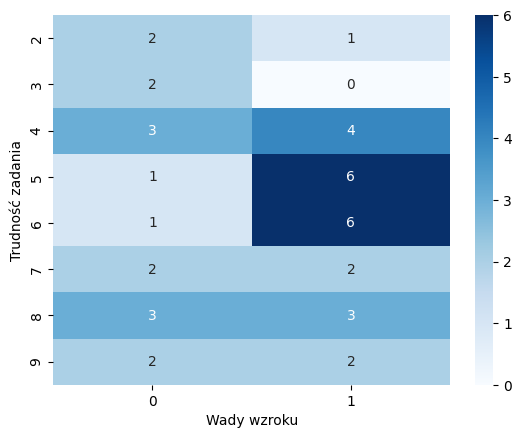

-------------------------------------
Kolekcja wszystkie grafiki:
Wady_wzroku   0   1
diff               
1            24  27
2            34  49
3            22  40
4            13  23
5             3   5
Chi2 test conducted...
Chi-squared test statistic value: 1.8655189490832822
P-value: 0.7604760096846805
Brak podstaw do odrzucenia H0.


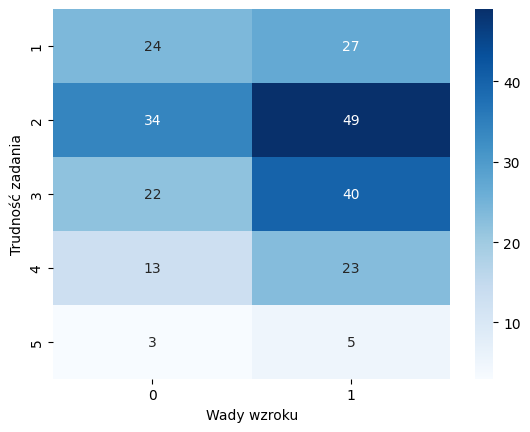

-------------------------------------
Kolekcja grafiki A:
Wady_wzroku   0   1
diff               
1             8  14
2            19  23
3            12  23
4             8  10
5             1   2
Chi2 test conducted...
Chi-squared test statistic value: 1.281265031265031
P-value: 0.8645460842398529
Brak podstaw do odrzucenia H0.


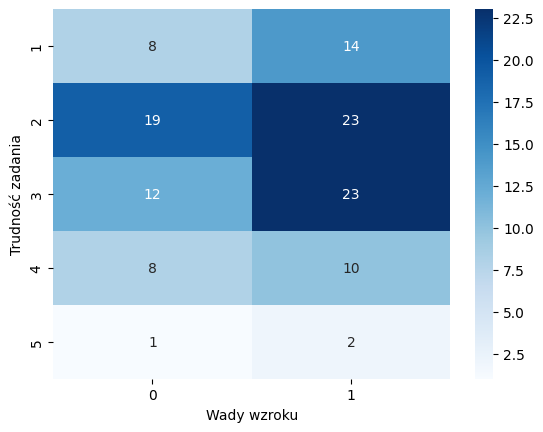

-------------------------------------
Kolekcja grafiki B:
Wady_wzroku   0   1
diff               
1            16  13
2            15  26
3            10  17
4             5  13
5             2   3
Chi2 test conducted...
Chi-squared test statistic value: 4.199931989741352
P-value: 0.3796236723701516
Brak podstaw do odrzucenia H0.


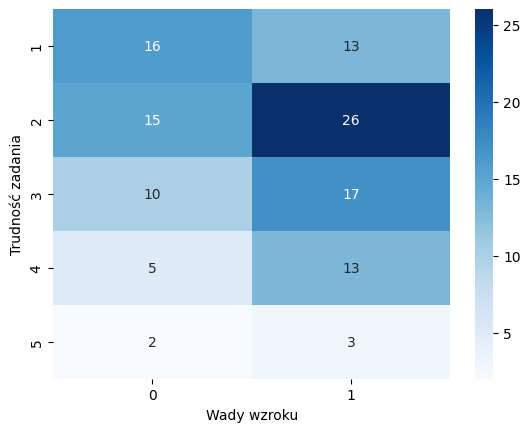

-------------------------------------
Kolekcja grafiki 1:
Wady_wzroku   0   1
diff               
1             8  12
2            16  17
3             5  16
4             3   2
5             0   1
Chi2 test conducted...
Chi-squared test statistic value: 4.783549783549785
P-value: 0.31023613660135985
Brak podstaw do odrzucenia H0.


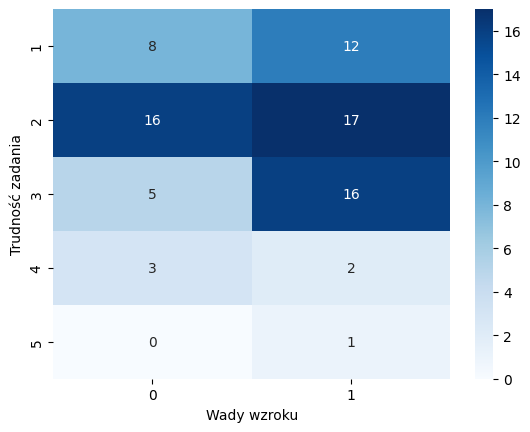

-------------------------------------
Kolekcja grafiki 2:
Wady_wzroku   0   1
diff               
1             9  11
2            11  19
3            10   8
4             2   8
5             0   2
Chi2 test conducted...
Chi-squared test statistic value: 5.162037037037037
P-value: 0.27107187924922455
Brak podstaw do odrzucenia H0.


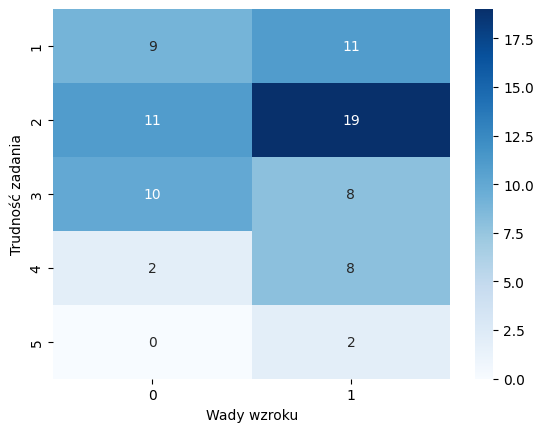

-------------------------------------
Kolekcja grafiki 3:
Wady_wzroku  0   1
diff              
1            7   4
2            7  13
3            7  16
4            8  13
5            3   2
Chi2 test conducted...
Chi-squared test statistic value: 4.510830353221656
P-value: 0.34126521115401826
Brak podstaw do odrzucenia H0.


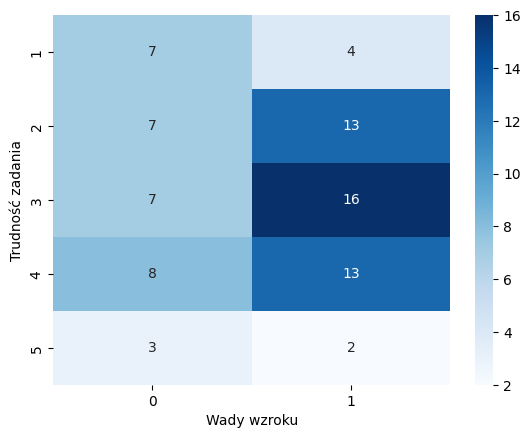

In [16]:
# wady wzroku
var = 'Wady_wzroku'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Wady wzroku', cmap='Blues')

In [17]:
posthocNemenyi_test(df_sum2, 'diff', var, ALPHA)

+----+----------+----------+
|    |        0 |        1 |
+====+==========+==========+
|  0 | 1        | 0.223503 |
+----+----------+----------+
|  1 | 0.223503 | 1        |
+----+----------+----------+


-------------------------------------
Zsumowane wszystkie grafiki:
Ilość_snu  6  7  8  8<  <6
diff                      
9          0  0  1   0   0
10         2  1  0   0   1
11         0  0  0   2   1
12         0  0  0   2   0
13         0  1  1   1   2
14         2  3  0   0   1
15         1  1  0   0   1
16         1  0  1   0   3
17         1  1  0   1   0
18         1  0  1   0   0
19         2  0  0   0   0
20         1  2  0   0   0
22         0  0  0   0   1
Chi2 test conducted...
Chi-squared test statistic value: 60.58181818181818
P-value: 0.10506497942114681
Brak podstaw do odrzucenia H0.


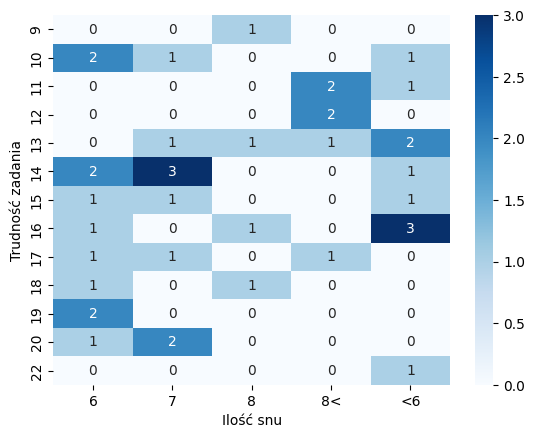

-------------------------------------
Zsumowane grafiki A:
Ilość_snu  6  7  8  8<  <6
diff                      
5          0  1  0   1   0
6          3  1  2   3   4
7          0  3  0   2   1
8          5  1  2   0   4
9          1  1  0   0   0
10         0  2  0   0   0
11         2  0  0   0   0
12         0  0  0   0   1
Chi2 test conducted...
Chi-squared test statistic value: 33.622895622895626
P-value: 0.2135653563704459
Brak podstaw do odrzucenia H0.


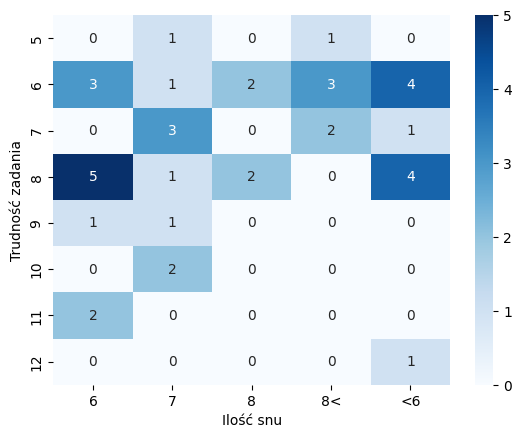

-------------------------------------
Zsumowane grafiki B:
Ilość_snu  6  7  8  8<  <6
diff                      
3          0  0  1   0   0
4          2  1  0   0   1
5          0  0  0   3   2
6          1  1  0   1   0
7          2  3  1   0   2
8          3  2  1   1   3
9          1  0  0   0   1
10         1  1  1   1   1
11         0  1  0   0   0
12         1  0  0   0   0
Chi2 test conducted...
Chi-squared test statistic value: 33.89713804713804
P-value: 0.5689747954840869
Brak podstaw do odrzucenia H0.


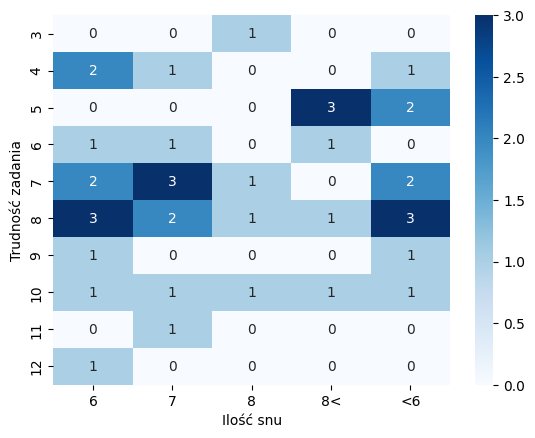

-------------------------------------
Zsumowane grafiki 1:
Ilość_snu  6  7  8  8<  <6
diff                      
2          1  0  0   1   2
3          0  1  2   2   2
4          2  3  0   1   2
5          6  3  2   1   3
6          1  1  0   1   1
7          1  1  0   0   0
Chi2 test conducted...
Chi-squared test statistic value: 14.304040404040405
P-value: 0.8147518356978423
Brak podstaw do odrzucenia H0.


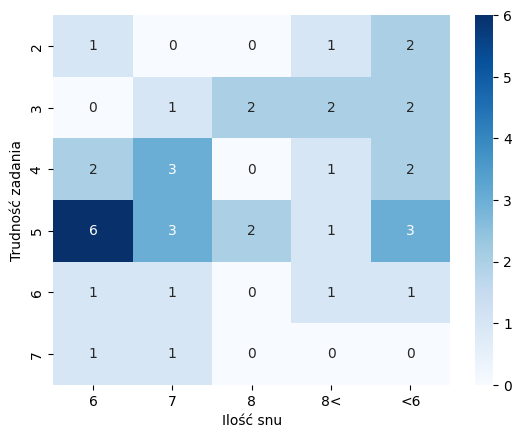

-------------------------------------
Zsumowane grafiki 2:
Ilość_snu  6  7  8  8<  <6
diff                      
2          1  0  0   0   2
3          2  2  1   2   1
4          2  4  2   1   3
5          1  1  0   1   2
6          1  1  1   1   1
7          2  1  0   1   1
8          2  0  0   0   0
Chi2 test conducted...
Chi-squared test statistic value: 14.799158249158248
P-value: 0.926497940188278
Brak podstaw do odrzucenia H0.


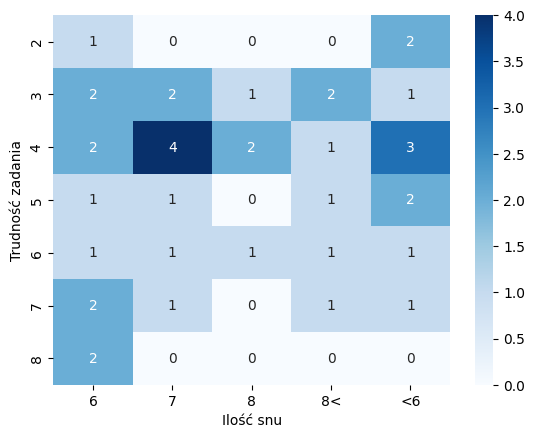

-------------------------------------
Zsumowane grafiki 3:
Ilość_snu  6  7  8  8<  <6
diff                      
2          2  0  1   0   0
3          0  0  0   1   1
4          3  1  0   3   0
5          0  2  0   2   3
6          0  4  1   0   2
7          2  1  1   0   0
8          4  0  1   0   1
9          0  1  0   0   3
Chi2 test conducted...
Chi-squared test statistic value: 42.15079365079365
P-value: 0.041960890331984996
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


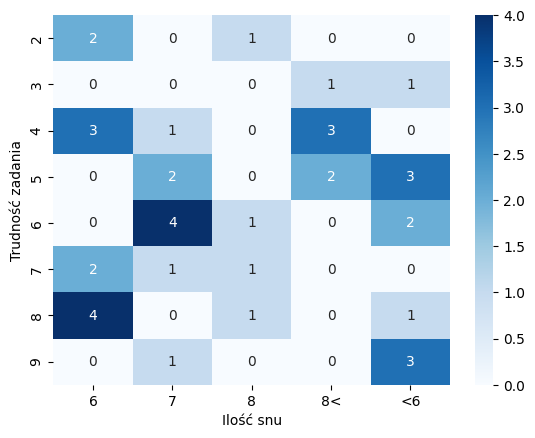

-------------------------------------
Kolekcja wszystkie grafiki:
Ilość_snu   6   7  8  8<  <6
diff                        
1          16   5  6   9  15
2          16  24  7  16  20
3          14  17  9   9  13
4          18   7  1   2   8
5           2   1  1   0   4
Chi2 test conducted...
Chi-squared test statistic value: 26.947892727959868
P-value: 0.042065958433397166
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


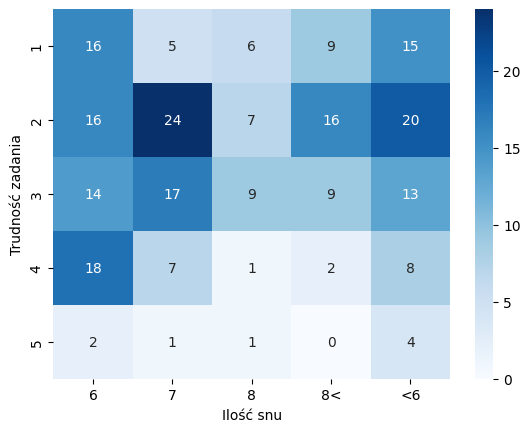

-------------------------------------
Kolekcja grafiki A:
Ilość_snu  6   7  8  8<  <6
diff                       
1          7   2  2   4   7
2          7  13  4   9   9
3          9   7  6   5   8
4          9   5  0   0   4
5          1   0  0   0   2
Chi2 test conducted...
Chi-squared test statistic value: 20.627183815062605
P-value: 0.1932902941615178
Brak podstaw do odrzucenia H0.


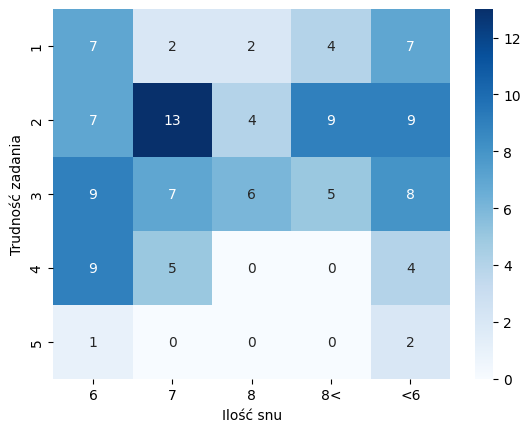

-------------------------------------
Kolekcja grafiki B:
Ilość_snu  6   7  8  8<  <6
diff                       
1          9   3  4   5   8
2          9  11  3   7  11
3          5  10  3   4   5
4          9   2  1   2   4
5          1   1  1   0   2
Chi2 test conducted...
Chi-squared test statistic value: 14.471658427718609
P-value: 0.5636203359491647
Brak podstaw do odrzucenia H0.


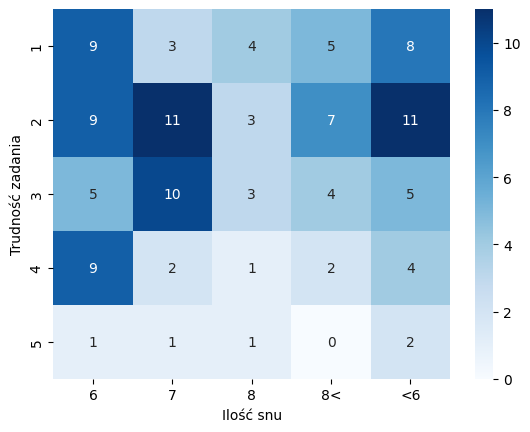

-------------------------------------
Kolekcja grafiki 1:
Ilość_snu  6  7  8  8<  <6
diff                      
1          5  2  2   5   6
2          7  9  4   4   9
3          7  5  2   2   5
4          2  2  0   1   0
5          1  0  0   0   0
Chi2 test conducted...
Chi-squared test statistic value: 10.321911758275395
P-value: 0.8492853125923581
Brak podstaw do odrzucenia H0.


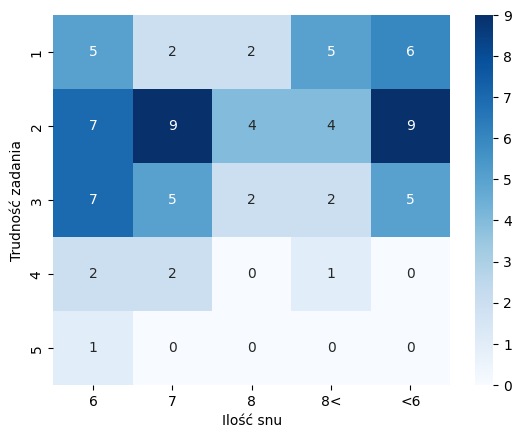

-------------------------------------
Kolekcja grafiki 2:
Ilość_snu  6   7  8  8<  <6
diff                       
1          5   3  2   2   8
2          7  10  3   5   5
3          3   3  3   4   5
4          6   2  0   1   1
5          1   0  0   0   1
Chi2 test conducted...
Chi-squared test statistic value: 15.597306397306397
P-value: 0.4814013564872951
Brak podstaw do odrzucenia H0.


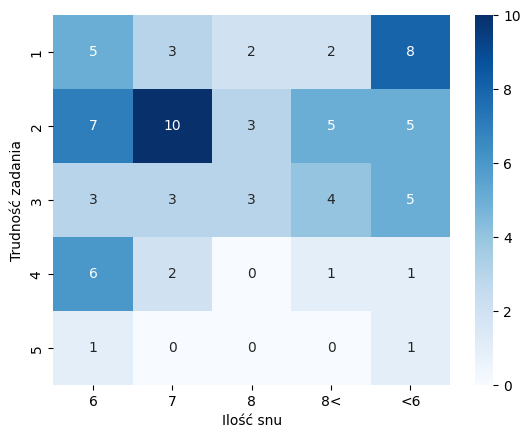

-------------------------------------
Kolekcja grafiki 3:
Ilość_snu   6  7  8  8<  <6
diff                       
1           6  0  2   2   1
2           2  5  0   7   6
3           4  9  4   3   3
4          10  3  1   0   7
5           0  1  1   0   3
Chi2 test conducted...
Chi-squared test statistic value: 36.572675370303834
P-value: 0.002407628996673538
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


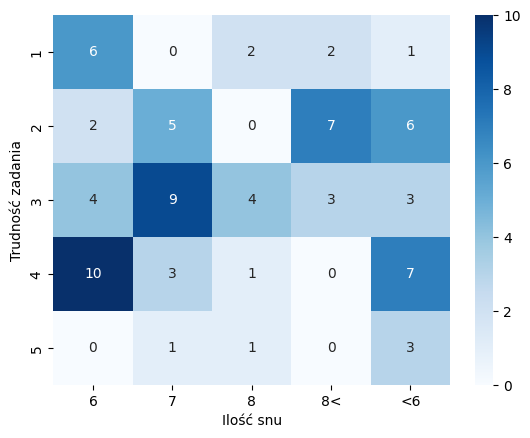

In [19]:
# ilość snu
var = 'Ilość_snu'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Ilość snu', cmap='Blues')

In [20]:
posthocNemenyi_test(df_sum3, 'diff', var, ALPHA)
posthocNemenyi_test(df_collAll, 'diff', var, ALPHA)
posthocNemenyi_test(df_coll3, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        6 |       <6 |        8 |        7 |       8< |
+====+==========+==========+==========+==========+==========+
| 6  | 1        | 0.987794 | 0.285415 | 0.923364 | 0.54424  |
+----+----------+----------+----------+----------+----------+
| <6 | 0.987794 | 1        | 0.526225 | 0.997359 | 0.820299 |
+----+----------+----------+----------+----------+----------+
| 8  | 0.285415 | 0.526225 | 1        | 0.709548 | 0.981027 |
+----+----------+----------+----------+----------+----------+
| 7  | 0.923364 | 0.997359 | 0.709548 | 1        | 0.942383 |
+----+----------+----------+----------+----------+----------+
| 8< | 0.54424  | 0.820299 | 0.981027 | 0.942383 | 1        |
+----+----------+----------+----------+----------+----------+
+----+----------+----------+----------+----------+----------+
|    |        6 |       <6 |        8 |        7 |       8< |
+====+==========+==========+==========+==========+==========+
| 6  | 1

-------------------------------------
Zsumowane wszystkie grafiki:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
9                0         1         0          0
10               1         0         3          0
11               1         2         0          0
12               1         0         1          0
13               0         2         3          0
14               0         1         4          1
15               0         0         2          1
16               1         2         2          0
17               1         2         0          0
18               0         1         1          0
19               0         1         0          1
20               0         1         0          2
22               0         0         1          0
Chi2 test conducted...
Chi-squared test statistic value: 37.94992458521871
P-value: 0.38052539920429856
Brak podstaw do odrzucenia H0.


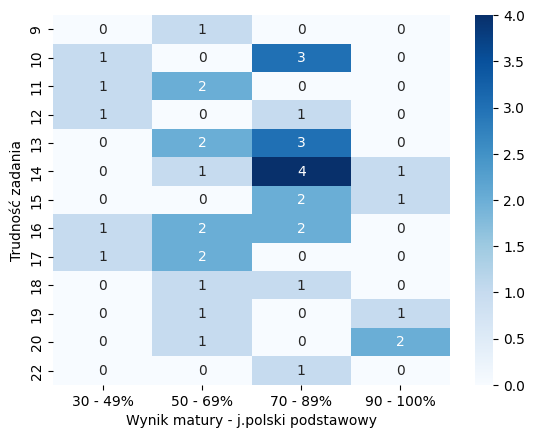

-------------------------------------
Zsumowane grafiki A:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
5                0         0         2          0
6                3         5         5          0
7                0         1         3          2
8                2         3         6          1
9                0         1         0          1
10               0         2         0          0
11               0         1         0          1
12               0         0         1          0
Chi2 test conducted...
Chi-squared test statistic value: 22.345515721081334
P-value: 0.37983919277568956
Brak podstaw do odrzucenia H0.


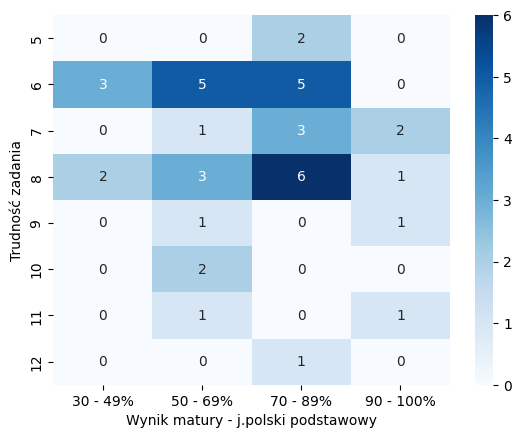

-------------------------------------
Zsumowane grafiki B:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
3                0         1         0          0
4                1         0         3          0
5                1         2         2          0
6                1         1         1          0
7                0         4         3          1
8                1         2         5          2
9                1         0         1          0
10               0         3         2          0
11               0         0         0          1
12               0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 30.30286576168929
P-value: 0.30071845953491494
Brak podstaw do odrzucenia H0.


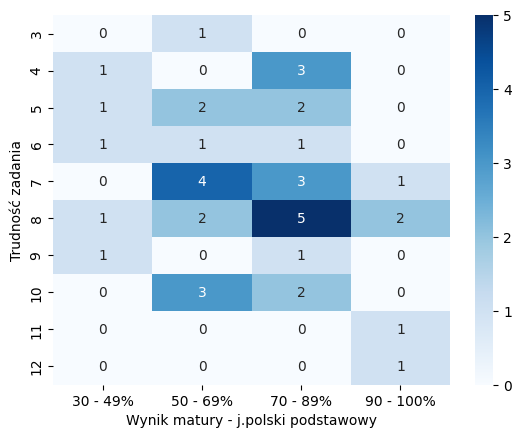

-------------------------------------
Zsumowane grafiki 1:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
2                1         1         2          0
3                1         4         2          0
4                0         2         4          2
5                3         4         6          2
6                0         1         3          0
7                0         1         0          1
Chi2 test conducted...
Chi-squared test statistic value: 12.351131221719458
P-value: 0.6522801913337488
Brak podstaw do odrzucenia H0.


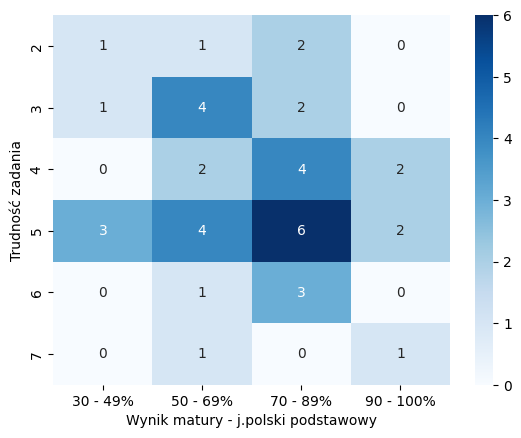

-------------------------------------
Zsumowane grafiki 2:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
2                1         0         2          0
3                1         3         4          0
4                1         4         6          1
5                0         2         2          1
6                1         2         2          0
7                0         1         1          3
8                1         1         0          0
Chi2 test conducted...
Chi-squared test statistic value: 20.378280542986428
P-value: 0.31193022617929783
Brak podstaw do odrzucenia H0.


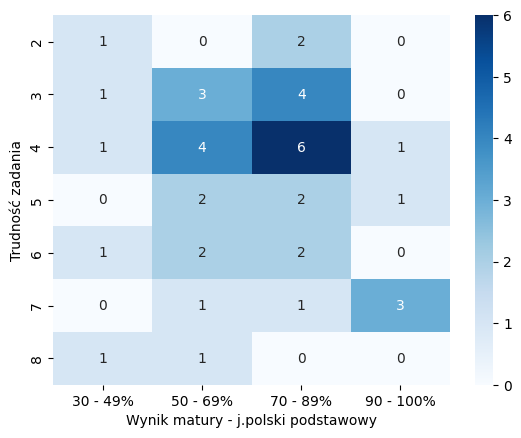

-------------------------------------
Zsumowane grafiki 3:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
2                1         2         0          0
3                0         1         1          0
4                3         0         4          0
5                0         2         4          1
6                0         3         2          2
7                0         0         4          0
8                0         3         1          2
9                1         2         1          0
Chi2 test conducted...
Chi-squared test statistic value: 28.71708683473389
P-value: 0.12096105693144536
Brak podstaw do odrzucenia H0.


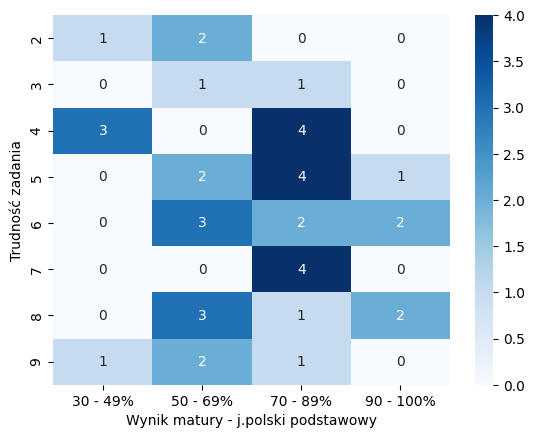

-------------------------------------
Kolekcja wszystkie grafiki:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
1               10        18        21          2
2               10        25        40          8
3                5        18        28         11
4                4        13        11          8
5                1         4         2          1
Chi2 test conducted...
Chi-squared test statistic value: 14.674460682561843
P-value: 0.25972377596392965
Brak podstaw do odrzucenia H0.


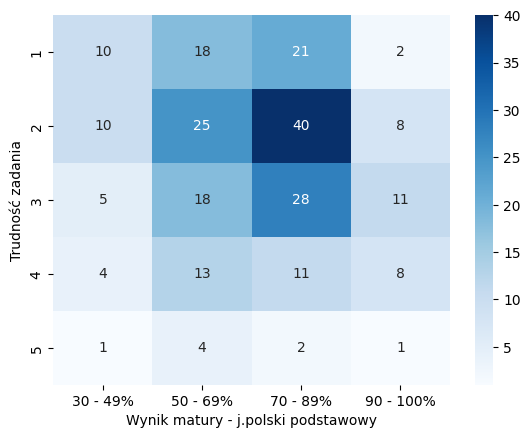

-------------------------------------
Kolekcja grafiki A:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
1                5         7         9          1
2                4        12        21          5
3                3        12        15          5
4                3         6         5          4
5                0         2         1          0
Chi2 test conducted...
Chi-squared test statistic value: 9.012279224043928
P-value: 0.7018812680337414
Brak podstaw do odrzucenia H0.


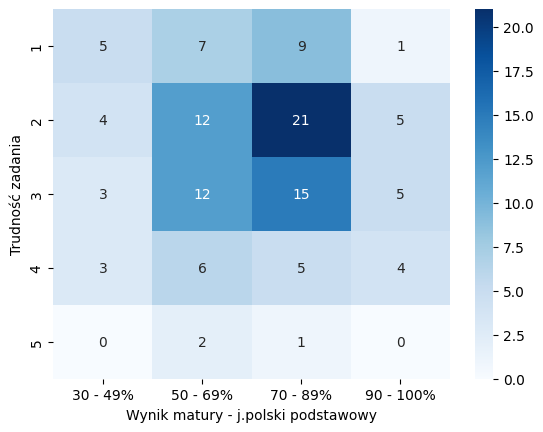

-------------------------------------
Kolekcja grafiki B:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
1                5        11        12          1
2                6        13        19          3
3                2         6        13          6
4                1         7         6          4
5                1         2         1          1
Chi2 test conducted...
Chi-squared test statistic value: 11.326672589345126
P-value: 0.5011495996500379
Brak podstaw do odrzucenia H0.


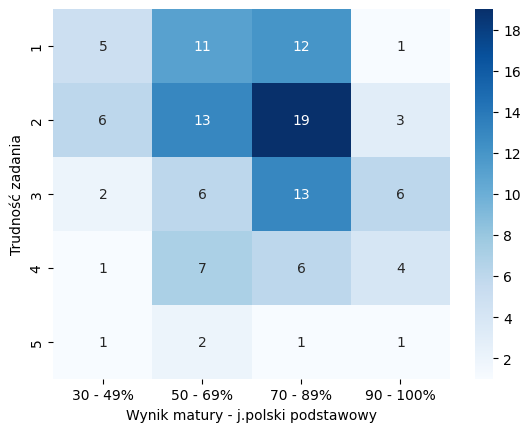

-------------------------------------
Kolekcja grafiki 1:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
1                4         7         8          1
2                3        12        14          4
3                2         5        10          4
4                1         1         2          1
5                0         1         0          0
Chi2 test conducted...
Chi-squared test statistic value: 6.591291061879297
P-value: 0.8834000090565093
Brak podstaw do odrzucenia H0.


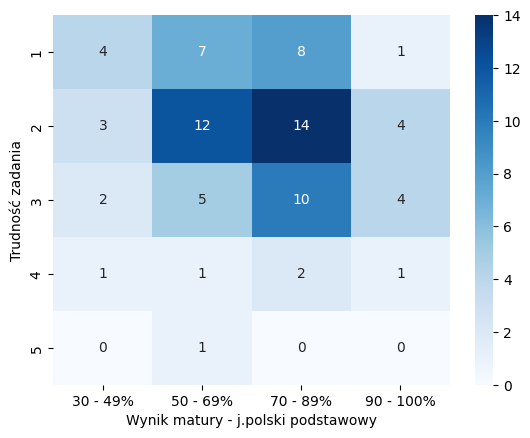

-------------------------------------
Kolekcja grafiki 2:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
1                3         6        10          1
2                3         9        16          2
3                2         6         6          4
4                2         5         1          2
5                0         0         1          1
Chi2 test conducted...
Chi-squared test statistic value: 12.408647561588738
P-value: 0.41344341121432804
Brak podstaw do odrzucenia H0.


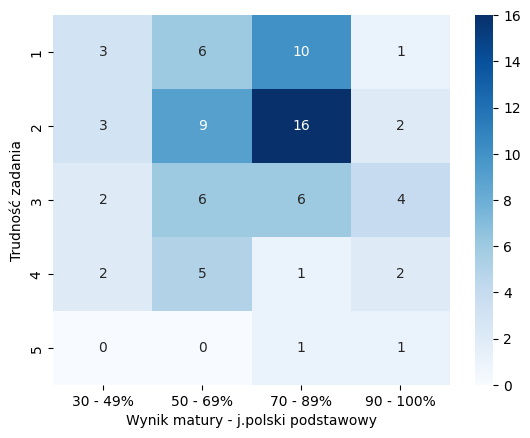

-------------------------------------
Kolekcja grafiki 3:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                             
1                3         5         3          0
2                4         4        10          2
3                1         7        12          3
4                1         7         8          5
5                1         3         1          0
Chi2 test conducted...
Chi-squared test statistic value: 14.31890939410121
P-value: 0.2808085999322646
Brak podstaw do odrzucenia H0.


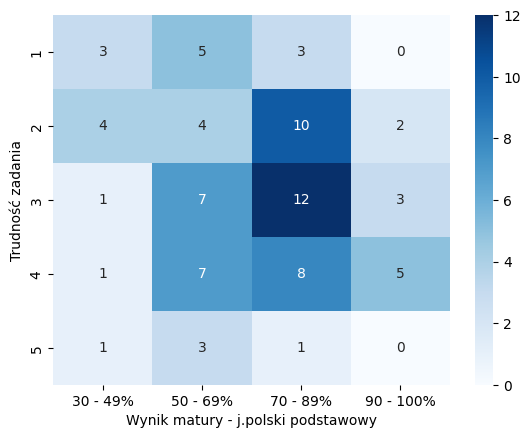

In [21]:
# matura - j.pol - podst
var = 'JP_podst'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Wynik matury - j.polski podstawowy', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
9                 0         0         1          0
10                0         0         1          3
11                0         1         1          1
12                0         0         2          0
13                0         0         1          4
14                0         1         2          3
15                0         0         0          3
16                0         1         2          2
17                0         0         1          2
18                0         0         0          2
19                0         0         0          2
20                1         0         1          1
22                0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 31.97222222222222
P-value: 0.6606400249174549
Brak podstaw do odrzucenia H0.


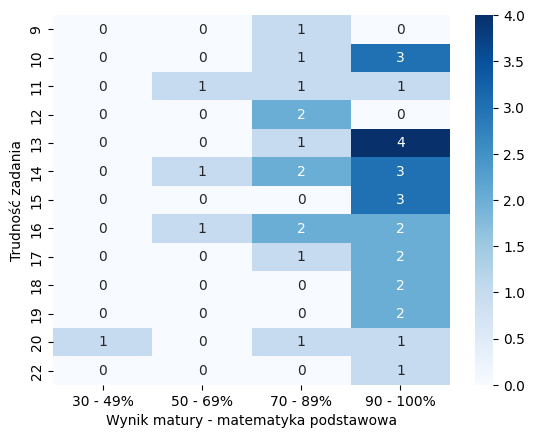

-------------------------------------
Zsumowane grafiki A:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
5                 0         0         1          1
6                 0         2         4          7
7                 0         0         3          3
8                 0         1         3          8
9                 1         0         0          1
10                0         0         1          1
11                0         0         0          2
12                0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 25.320512820512818
P-value: 0.23354942398050912
Brak podstaw do odrzucenia H0.


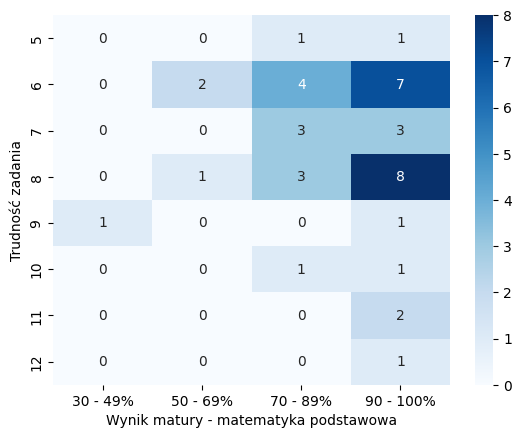

-------------------------------------
Zsumowane grafiki B:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
3                 0         0         1          0
4                 0         0         1          3
5                 0         1         2          2
6                 0         0         1          2
7                 0         0         2          6
8                 0         2         3          5
9                 0         0         1          1
10                0         0         1          4
11                1         0         0          0
12                0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 49.75
P-value: 0.0048629044176142396
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


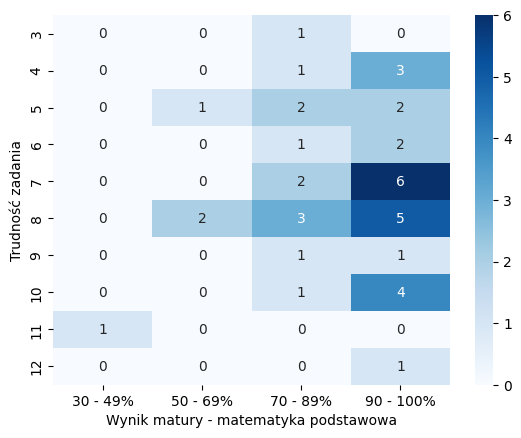

-------------------------------------
Zsumowane grafiki 1:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
2                 0         1         1          2
3                 0         0         2          5
4                 0         0         5          3
5                 0         2         4          9
6                 0         0         0          4
7                 1         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 29.59325396825396
P-value: 0.013475715093246302
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


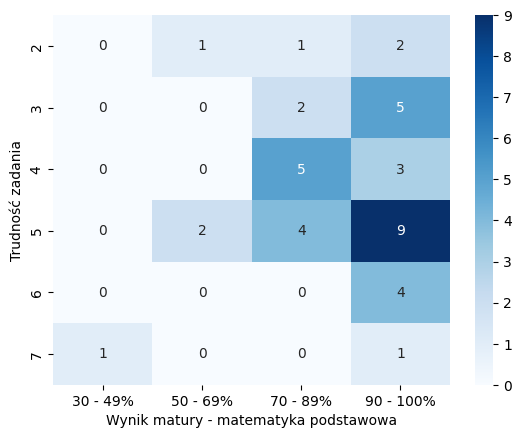

-------------------------------------
Zsumowane grafiki 2:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
2                 0         1         0          2
3                 0         0         4          4
4                 0         1         3          8
5                 0         1         2          2
6                 0         0         2          3
7                 1         0         0          4
8                 0         0         1          1
Chi2 test conducted...
Chi-squared test statistic value: 17.333333333333336
P-value: 0.5003105753914394
Brak podstaw do odrzucenia H0.


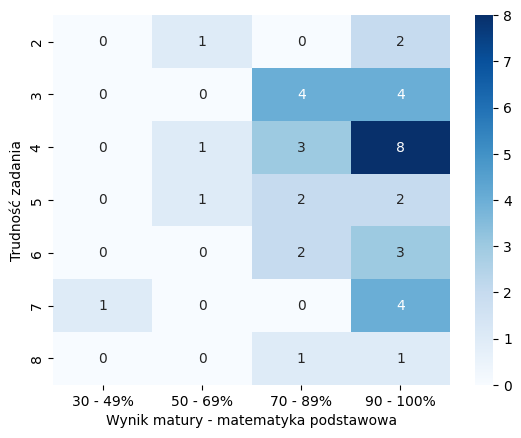

-------------------------------------
Zsumowane grafiki 3:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
2                 0         0         2          1
3                 0         0         1          1
4                 0         1         2          4
5                 0         1         3          3
6                 1         0         1          5
7                 0         0         0          4
8                 0         0         1          5
9                 0         1         2          1
Chi2 test conducted...
Chi-squared test statistic value: 16.845238095238095
P-value: 0.7204439314042133
Brak podstaw do odrzucenia H0.


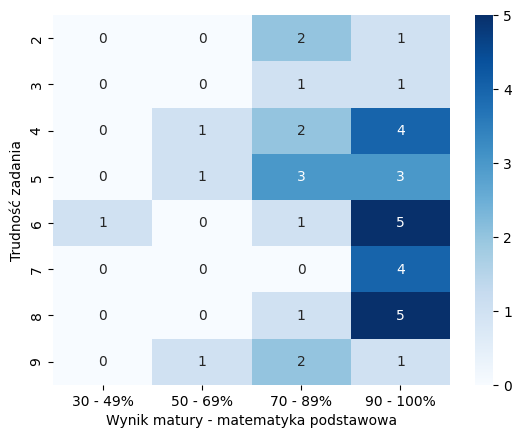

-------------------------------------
Kolekcja wszystkie grafiki:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
1                 0         6        18         27
2                 1         4        28         50
3                 2         6        17         37
4                 3         1         6         26
5                 0         1         3          4
Chi2 test conducted...
Chi-squared test statistic value: 15.56201085175617
P-value: 0.21213000565353163
Brak podstaw do odrzucenia H0.


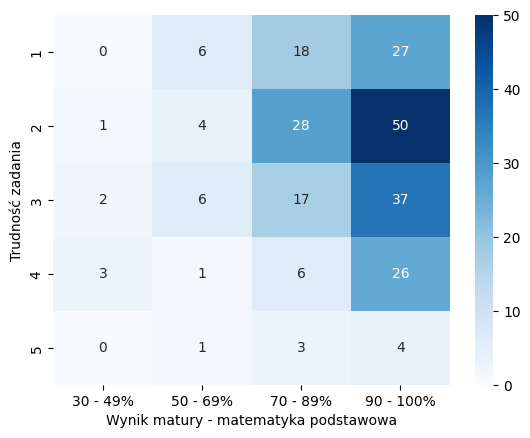

-------------------------------------
Kolekcja grafiki A:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
1                 0         3         9         10
2                 1         2        12         27
3                 1         3        10         21
4                 1         1         4         12
5                 0         0         1          2
Chi2 test conducted...
Chi-squared test statistic value: 5.57022607022607
P-value: 0.9361804386862194
Brak podstaw do odrzucenia H0.


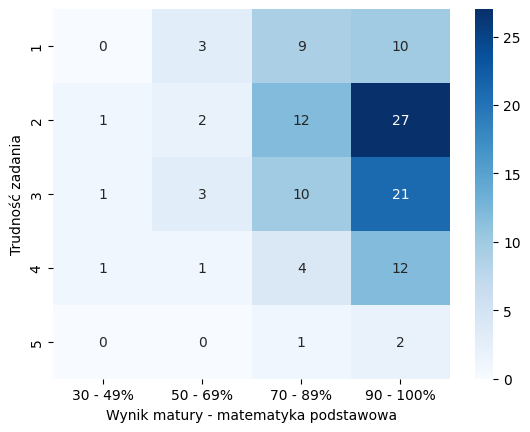

-------------------------------------
Kolekcja grafiki B:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
1                 0         3         9         17
2                 0         2        16         23
3                 1         3         7         16
4                 2         0         2         14
5                 0         1         2          2
Chi2 test conducted...
Chi-squared test statistic value: 15.897579665451827
P-value: 0.19597227052290625
Brak podstaw do odrzucenia H0.


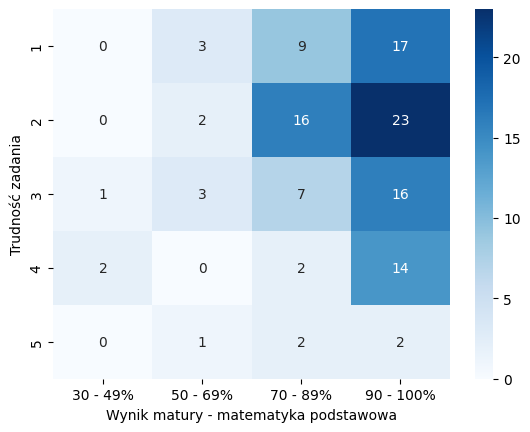

-------------------------------------
Kolekcja grafiki 1:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
1                 0         2         7         11
2                 0         2        11         20
3                 1         2         5         13
4                 1         0         1          3
5                 0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 10.115800865800868
P-value: 0.6058021468485164
Brak podstaw do odrzucenia H0.


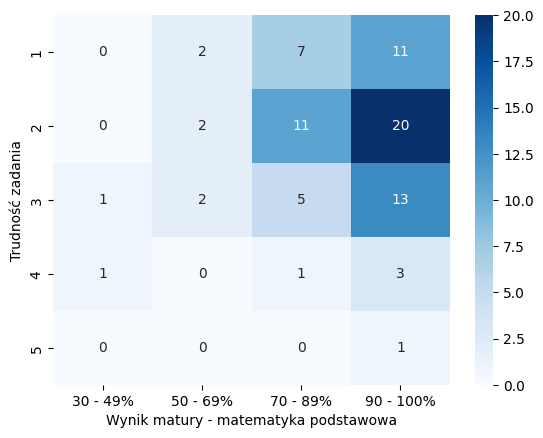

-------------------------------------
Kolekcja grafiki 2:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
1                 0         3         5         12
2                 0         1        11         18
3                 1         2         5         10
4                 1         0         3          6
5                 0         0         0          2
Chi2 test conducted...
Chi-squared test statistic value: 9.462962962962964
P-value: 0.662960771086964
Brak podstaw do odrzucenia H0.


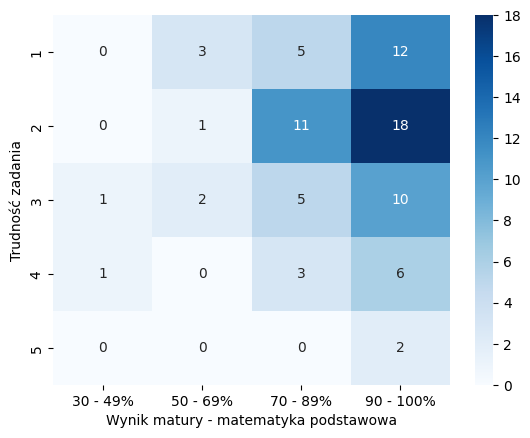

-------------------------------------
Kolekcja grafiki 3:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
diff                                              
1                 0         1         6          4
2                 1         1         6         12
3                 0         2         7         14
4                 1         1         2         17
5                 0         1         3          1
Chi2 test conducted...
Chi-squared test statistic value: 13.946420729029423
P-value: 0.3041428448805573
Brak podstaw do odrzucenia H0.


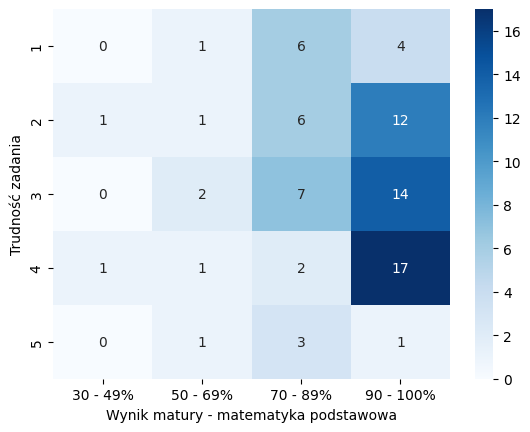

In [22]:
# matura - mat - podst
var = 'MAT_podst'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Wynik matury - matematyka podstawowa', cmap='Blues')

In [24]:
posthocNemenyi_test(df_sumB, 'diff', var, ALPHA)
print('-------')
posthocNemenyi_test(df_sum1, 'diff', var, ALPHA)

+-----------+-------------+------------+------------+------------+
|           |   90 - 100% |   70 - 89% |   50 - 69% |   30 - 49% |
+===========+=============+============+============+============+
| 90 - 100% |    1        |   0.169519 |   0.069972 |   0.27944  |
+-----------+-------------+------------+------------+------------+
| 70 - 89%  |    0.169519 |   1        |   0.643581 |   0.718755 |
+-----------+-------------+------------+------------+------------+
| 50 - 69%  |    0.069972 |   0.643581 |   1        |   0.991355 |
+-----------+-------------+------------+------------+------------+
| 30 - 49%  |    0.27944  |   0.718755 |   0.991355 |   1        |
+-----------+-------------+------------+------------+------------+
-------
+-----------+-------------+------------+------------+------------+
|           |   90 - 100% |   70 - 89% |   50 - 69% |   30 - 49% |
+===========+=============+============+============+============+
| 90 - 100% |    1        |   0.242279 |   0.05849  | 

-------------------------------------
Zsumowane wszystkie grafiki:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
9              0         0       1            0
10             1         0       3            0
11             0         0       3            0
12             0         0       2            0
13             0         1       4            0
14             0         1       3            2
15             0         0       3            0
16             0         1       4            0
17             0         0       3            0
18             0         0       2            0
19             0         0       1            1
20             0         1       2            0
22             0         1       0            0
Chi2 test conducted...
Chi-squared test statistic value: 34.282437275985664
P-value: 0.5504283747008301
Brak podstaw do odrzucenia H0.


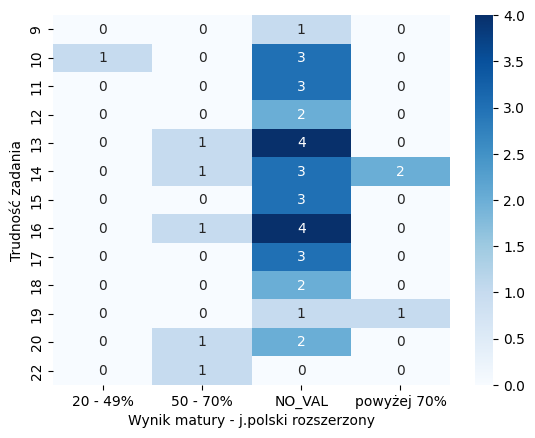

-------------------------------------
Zsumowane grafiki A:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
5              0         0       2            0
6              1         1      11            0
7              0         1       3            2
8              0         1      11            0
9              0         0       2            0
10             0         1       1            0
11             0         0       1            1
12             0         1       0            0
Chi2 test conducted...
Chi-squared test statistic value: 26.655638268541495
P-value: 0.18254426052403658
Brak podstaw do odrzucenia H0.


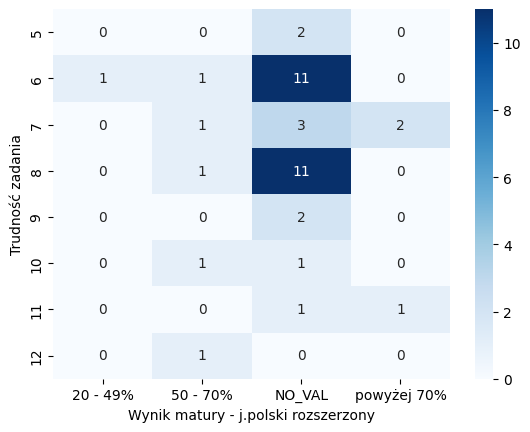

-------------------------------------
Zsumowane grafiki B:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
3              0         0       1            0
4              1         0       3            0
5              0         0       5            0
6              0         0       3            0
7              0         2       4            2
8              0         1       8            1
9              0         0       2            0
10             0         2       3            0
11             0         0       1            0
12             0         0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 22.03870967741935
P-value: 0.7354075259931476
Brak podstaw do odrzucenia H0.


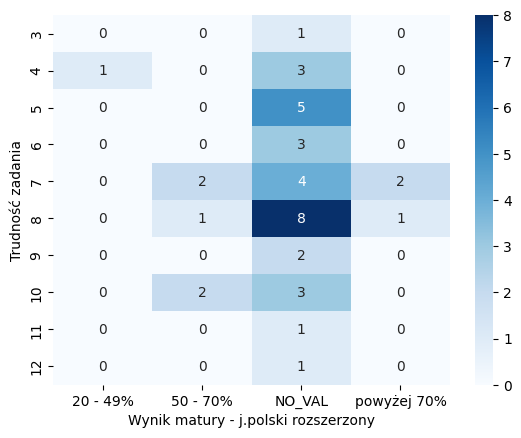

-------------------------------------
Zsumowane grafiki 1:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
2              1         0       3            0
3              0         1       6            0
4              0         1       5            2
5              0         2      12            1
6              0         1       3            0
7              0         0       2            0
Chi2 test conducted...
Chi-squared test statistic value: 15.274142345110086
P-value: 0.43185646844833625
Brak podstaw do odrzucenia H0.


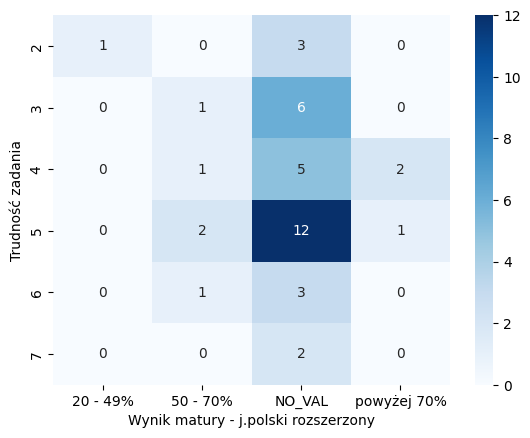

-------------------------------------
Zsumowane grafiki 2:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
2              0         0       3            0
3              0         1       7            0
4              1         2       8            1
5              0         0       4            1
6              0         1       4            0
7              0         1       3            1
8              0         0       2            0
Chi2 test conducted...
Chi-squared test statistic value: 8.461648745519714
P-value: 0.970942245637099
Brak podstaw do odrzucenia H0.


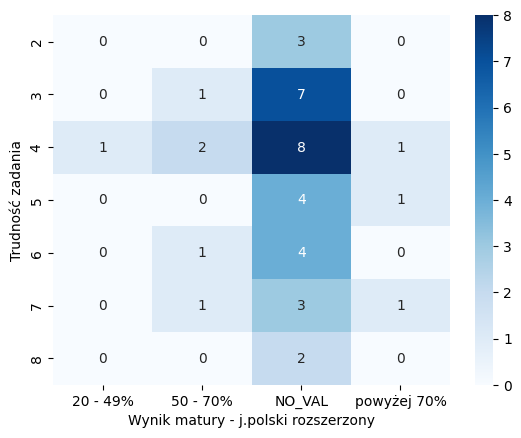

-------------------------------------
Zsumowane grafiki 3:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
2              0         0       3            0
3              0         0       2            0
4              1         0       6            0
5              0         0       5            2
6              0         2       5            0
7              0         0       4            0
8              0         1       4            1
9              0         2       2            0
Chi2 test conducted...
Chi-squared test statistic value: 21.65693804403482
P-value: 0.4195046725387849
Brak podstaw do odrzucenia H0.


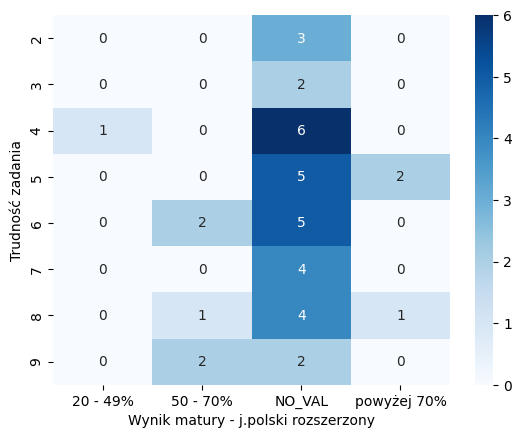

-------------------------------------
Kolekcja wszystkie grafiki:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
1              3         3      44            1
2              2        11      62            8
3              1         8      47            6
4              0         4      29            3
5              0         4       4            0
Chi2 test conducted...
Chi-squared test statistic value: 19.575214776389437
P-value: 0.07556034875251591
Brak podstaw do odrzucenia H0.


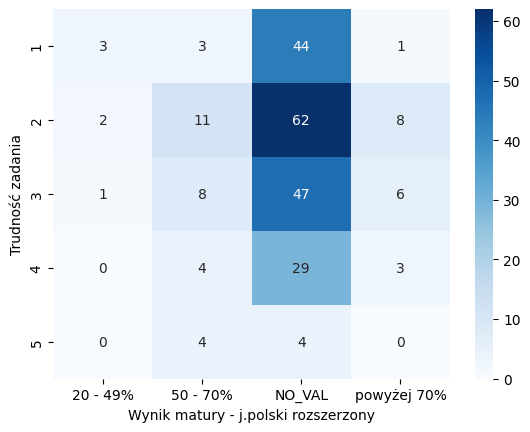

-------------------------------------
Kolekcja grafiki A:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
1              1         1      20            0
2              1         5      32            4
3              1         5      26            3
4              0         3      13            2
5              0         1       2            0
Chi2 test conducted...
Chi-squared test statistic value: 6.567301276978696
P-value: 0.8848351210965617
Brak podstaw do odrzucenia H0.


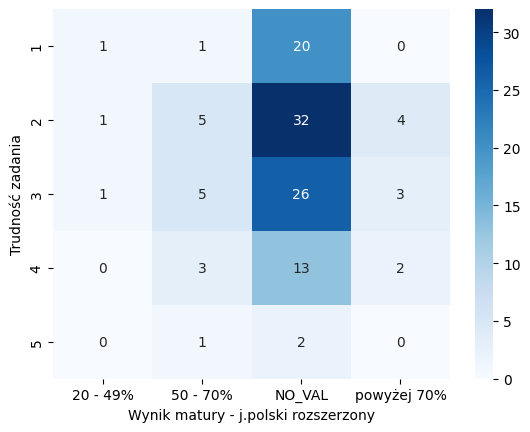

-------------------------------------
Kolekcja grafiki B:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
1              2         2      24            1
2              1         6      30            4
3              0         3      21            3
4              0         1      16            1
5              0         3       2            0
Chi2 test conducted...
Chi-squared test statistic value: 17.391419754761134
P-value: 0.13545710935693347
Brak podstaw do odrzucenia H0.


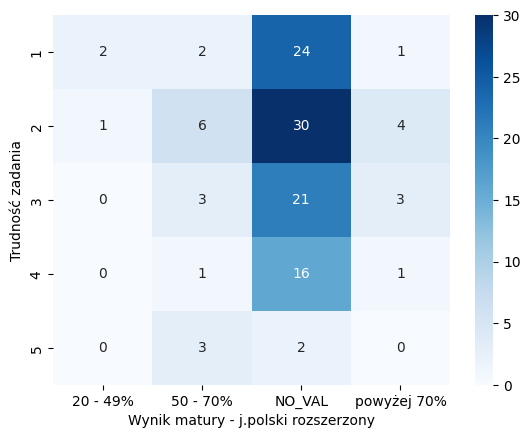

-------------------------------------
Kolekcja grafiki 1:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
1              2         1      16            1
2              0         5      25            3
3              0         4      15            2
4              0         0       5            0
5              0         0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 9.919433971046873
P-value: 0.6230286255684228
Brak podstaw do odrzucenia H0.


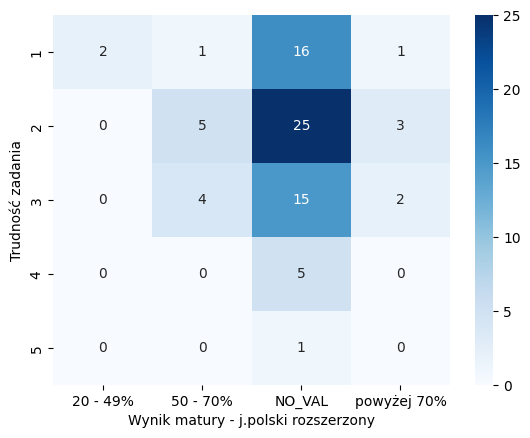

-------------------------------------
Kolekcja grafiki 2:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
1              1         2      17            0
2              0         5      22            3
3              1         1      14            2
4              0         1       8            1
5              0         1       1            0
Chi2 test conducted...
Chi-squared test statistic value: 8.445400238948627
P-value: 0.749427662923396
Brak podstaw do odrzucenia H0.


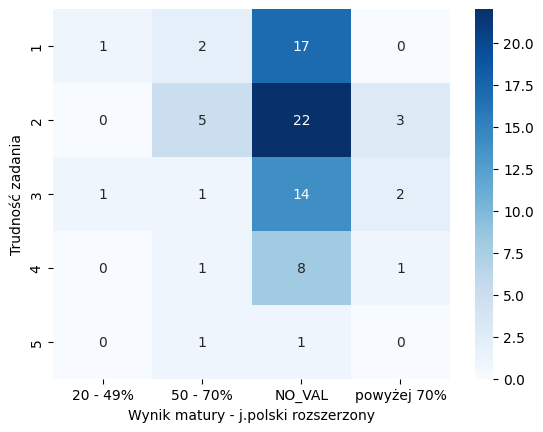

-------------------------------------
Kolekcja grafiki 3:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
diff                                           
1              0         0      11            0
2              2         1      15            2
3              0         3      18            2
4              0         3      16            2
5              0         3       2            0
Chi2 test conducted...
Chi-squared test statistic value: 20.532496271065696
P-value: 0.05765993193431038
Brak podstaw do odrzucenia H0.


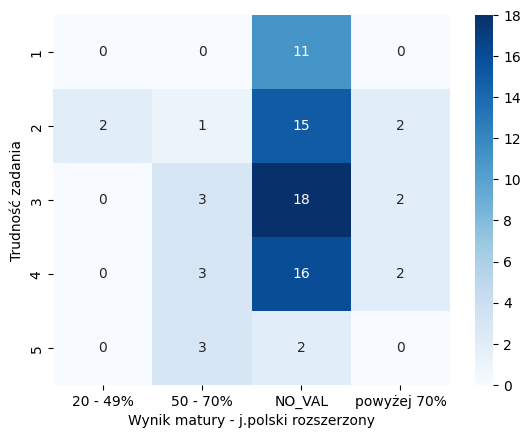

In [25]:
# matura - j.pol - roz
var = 'JP_roz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Wynik matury - j.polski rozszerzony', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
9               0         1       0            0            0
10              0         0       2            1            1
11              0         0       1            2            0
12              0         0       1            1            0
13              1         1       2            0            1
14              1         1       3            0            1
15              0         2       1            0            0
16              0         1       3            1            0
17              0         0       3            0            0
18              0         2       0            0            0
19              0         2       0            0            0
20              0         0       1            0            2
22              0         0       1            0            0
Chi

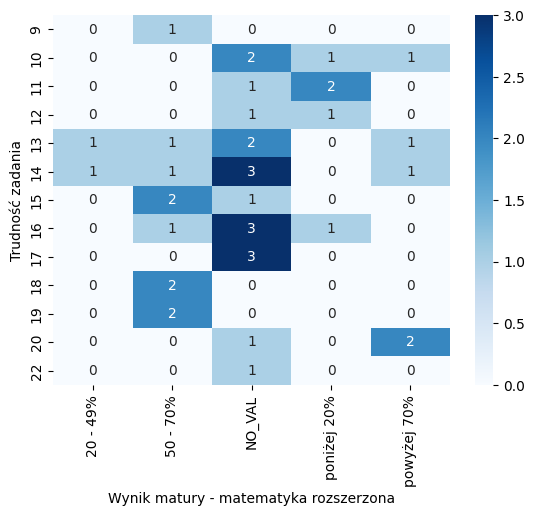

-------------------------------------
Zsumowane grafiki A:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
5               0         0       1            0            1
6               1         2       5            4            1
7               1         1       4            0            0
8               0         4       5            1            2
9               0         1       1            0            0
10              0         0       1            0            1
11              0         2       0            0            0
12              0         0       1            0            0
Chi2 test conducted...
Chi-squared test statistic value: 24.282051282051285
P-value: 0.666564140919137
Brak podstaw do odrzucenia H0.


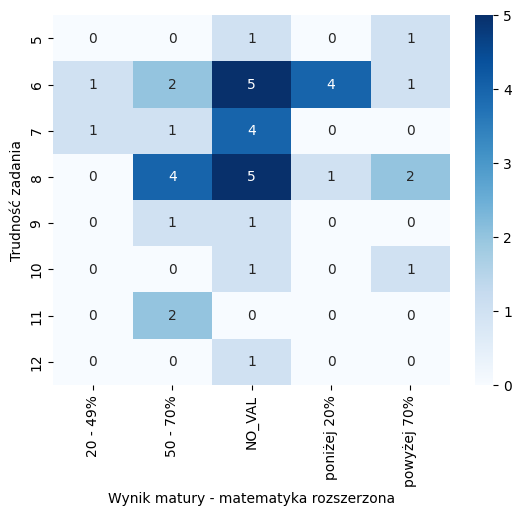

-------------------------------------
Zsumowane grafiki B:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
3               0         1       0            0            0
4               0         0       2            1            1
5               0         1       2            2            0
6               0         1       0            1            1
7               2         1       5            0            0
8               0         3       5            1            1
9               0         1       1            0            0
10              0         2       2            0            1
11              0         0       1            0            0
12              0         0       0            0            1
Chi2 test conducted...
Chi-squared test statistic value: 33.97777777777778
P-value: 0.5650927395747171
Brak podstaw do odrzucenia H0.


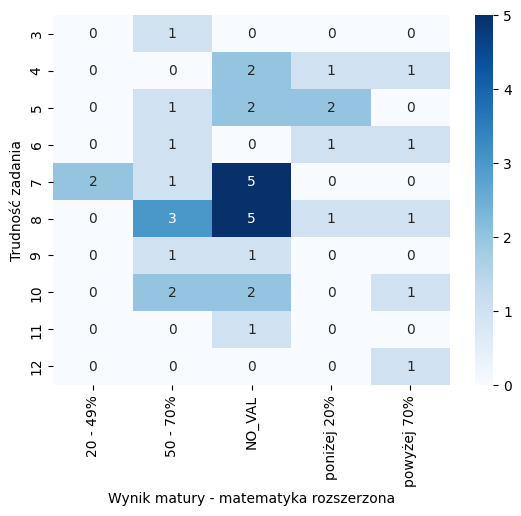

-------------------------------------
Zsumowane grafiki 1:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
2               0         1       1            2            0
3               1         1       4            1            0
4               1         2       4            0            1
5               0         5       5            2            3
6               0         0       3            0            1
7               0         1       1            0            0
Chi2 test conducted...
Chi-squared test statistic value: 16.565608465608467
P-value: 0.680973454882605
Brak podstaw do odrzucenia H0.


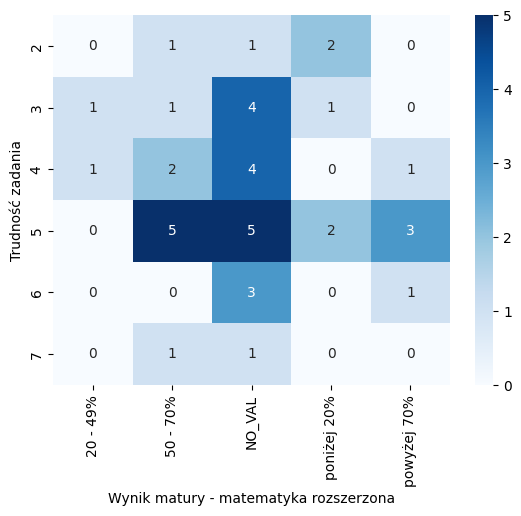

-------------------------------------
Zsumowane grafiki 2:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
2               0         0       1            1            1
3               0         1       4            1            2
4               2         4       4            2            0
5               0         0       5            0            0
6               0         3       0            1            1
7               0         1       3            0            1
8               0         1       1            0            0
Chi2 test conducted...
Chi-squared test statistic value: 24.67037037037037
P-value: 0.4238462256363451
Brak podstaw do odrzucenia H0.


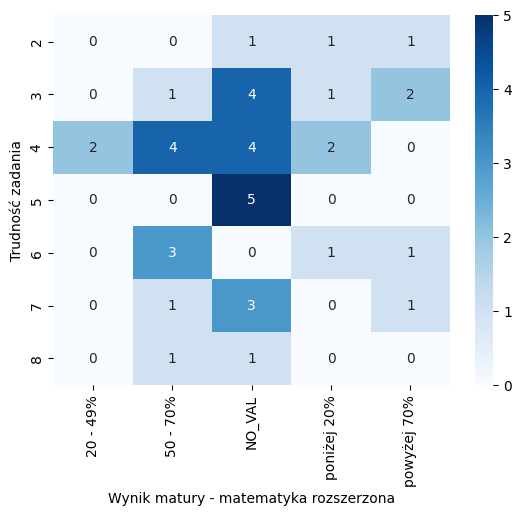

-------------------------------------
Zsumowane grafiki 3:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
2               0         2       0            1            0
3               0         0       1            0            1
4               0         0       4            2            1
5               0         1       5            1            0
6               2         2       3            0            0
7               0         2       1            0            1
8               0         3       2            0            1
9               0         0       2            1            1
Chi2 test conducted...
Chi-squared test statistic value: 31.71957671957672
P-value: 0.28607204639178374
Brak podstaw do odrzucenia H0.


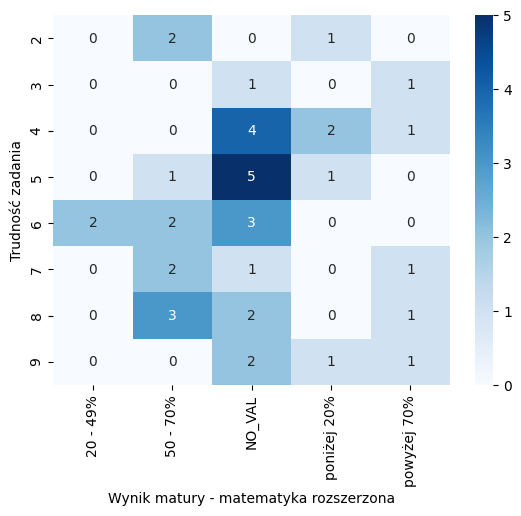

-------------------------------------
Kolekcja wszystkie grafiki:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
1               2        13      18           12            6
2               6        14      42           10           11
3               3        18      31            5            5
4               1        14      13            2            6
5               0         1       4            1            2
Chi2 test conducted...
Chi-squared test statistic value: 20.12834739054609
P-value: 0.21449549280504995
Brak podstaw do odrzucenia H0.


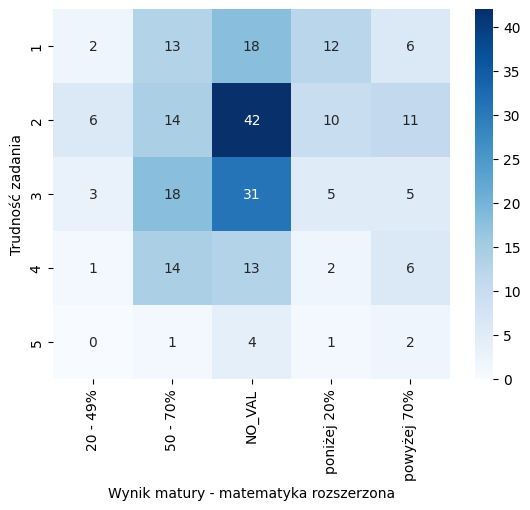

-------------------------------------
Kolekcja grafiki A:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
1               1         5       9            5            2
2               3         6      20            5            8
3               2        12      17            3            1
4               0         6       6            2            4
5               0         1       2            0            0
Chi2 test conducted...
Chi-squared test statistic value: 15.01991341991342
P-value: 0.523180516406788
Brak podstaw do odrzucenia H0.


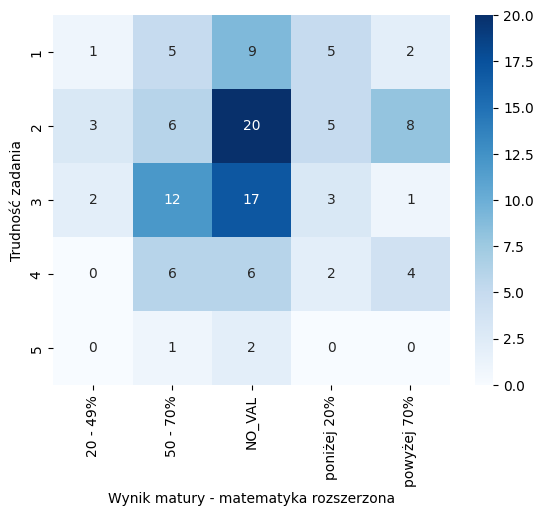

-------------------------------------
Kolekcja grafiki B:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
1               1         8       9            7            4
2               3         8      22            5            3
3               1         6      14            2            4
4               1         8       7            0            2
5               0         0       2            1            2
Chi2 test conducted...
Chi-squared test statistic value: 18.226486275079864
P-value: 0.31080224197327294
Brak podstaw do odrzucenia H0.


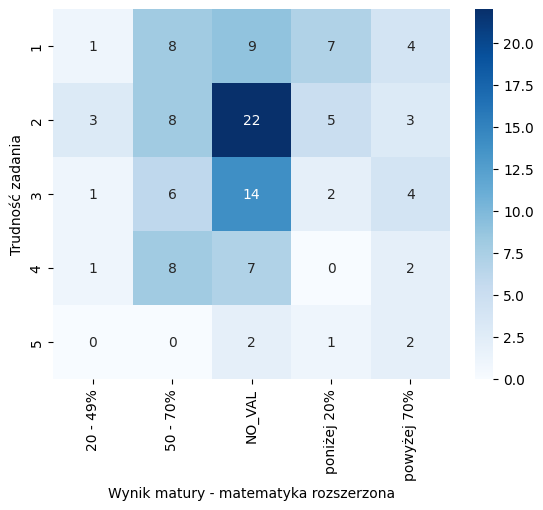

-------------------------------------
Kolekcja grafiki 1:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
1               1         5       8            6            0
2               3         7      15            2            6
3               0         7      10            1            3
4               0         0       3            1            1
5               0         1       0            0            0
Chi2 test conducted...
Chi-squared test statistic value: 18.67840307840308
P-value: 0.28569229940146
Brak podstaw do odrzucenia H0.


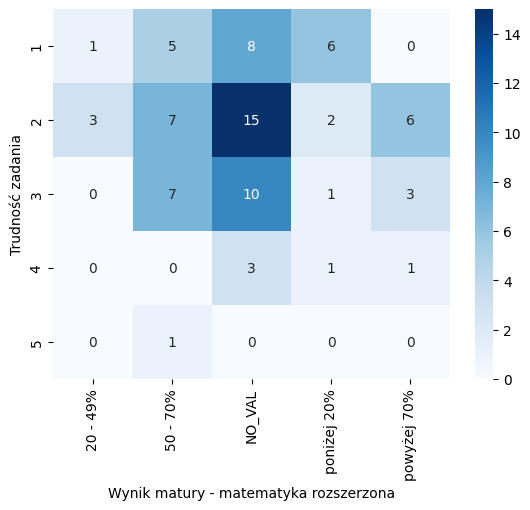

-------------------------------------
Kolekcja grafiki 2:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
1               1         4       7            4            4
2               2         5      16            3            4
3               1         6       8            3            0
4               0         5       4            0            1
5               0         0       1            0            1
Chi2 test conducted...
Chi-squared test statistic value: 14.553086419753086
P-value: 0.5575815929591917
Brak podstaw do odrzucenia H0.


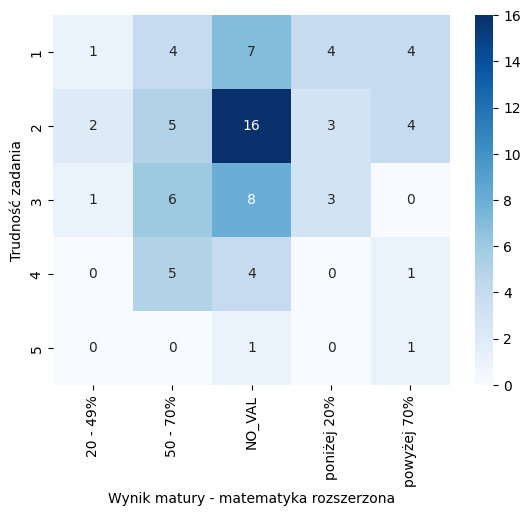

-------------------------------------
Kolekcja grafiki 3:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
diff                                                         
1               0         4       3            2            2
2               1         2      11            5            1
3               2         5      13            1            2
4               1         9       6            1            4
5               0         0       3            1            1
Chi2 test conducted...
Chi-squared test statistic value: 18.859376372419852
P-value: 0.2760229058464711
Brak podstaw do odrzucenia H0.


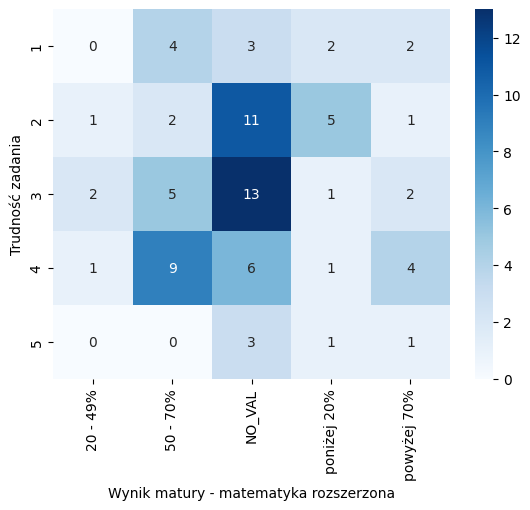

In [26]:
# matura - mat - roz
var = 'MAT_roz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Wynik matury - matematyka rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
9                0       1            0
10               0       4            0
11               0       3            0
12               0       2            0
13               0       5            0
14               0       4            2
15               0       3            0
16               0       4            1
17               0       3            0
18               0       2            0
19               0       2            0
20               1       2            0
22               0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 21.77777777777778
P-value: 0.5925284985006025
Brak podstaw do odrzucenia H0.


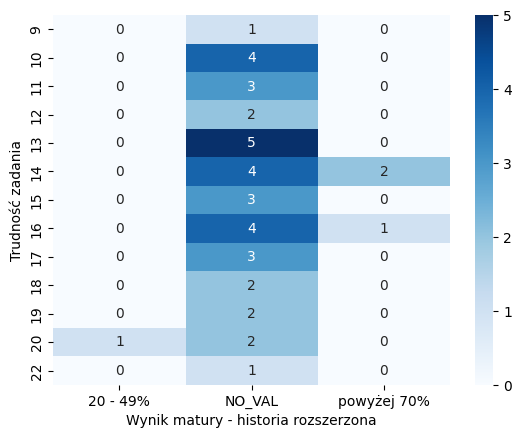

-------------------------------------
Zsumowane grafiki A:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
5                0       2            0
6                0      13            0
7                0       5            1
8                0      10            2
9                0       2            0
10               1       1            0
11               0       2            0
12               0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 23.33333333333333
P-value: 0.05505736617326503
Brak podstaw do odrzucenia H0.


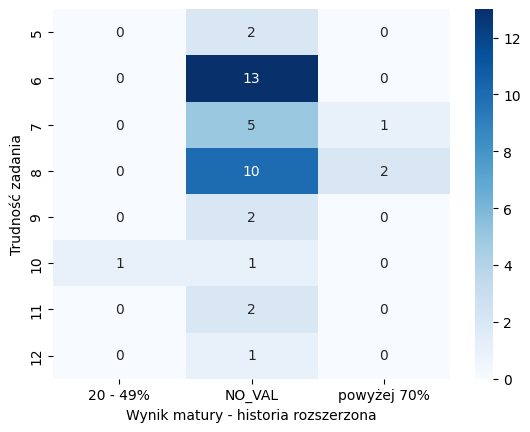

-------------------------------------
Zsumowane grafiki B:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
3                0       1            0
4                0       4            0
5                0       5            0
6                0       2            1
7                0       7            1
8                0       9            1
9                0       2            0
10               1       4            0
11               0       1            0
12               0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 11.842592592592592
P-value: 0.8552567452730486
Brak podstaw do odrzucenia H0.


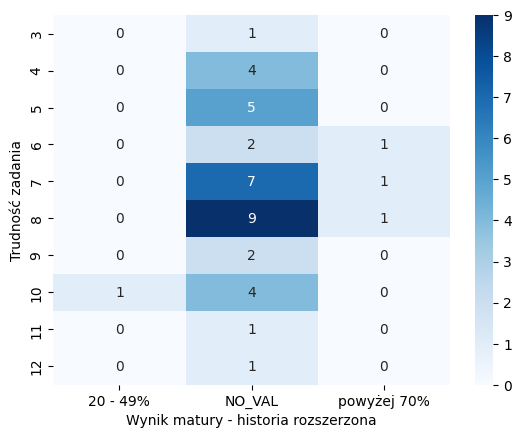

-------------------------------------
Zsumowane grafiki 1:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
2                0       4            0
3                0       7            0
4                0       5            3
5                1      14            0
6                0       4            0
7                0       2            0
Chi2 test conducted...
Chi-squared test statistic value: 14.546296296296298
P-value: 0.1494992818716886
Brak podstaw do odrzucenia H0.


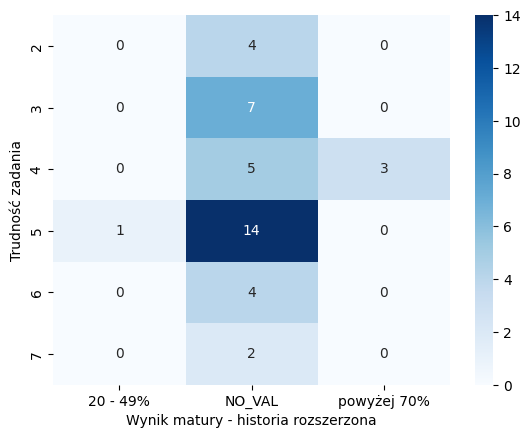

-------------------------------------
Zsumowane grafiki 2:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
2                0       3            0
3                0       6            2
4                0      11            1
5                0       5            0
6                1       4            0
7                0       5            0
8                0       2            0
Chi2 test conducted...
Chi-squared test statistic value: 12.203703703703704
P-value: 0.4294617961153793
Brak podstaw do odrzucenia H0.


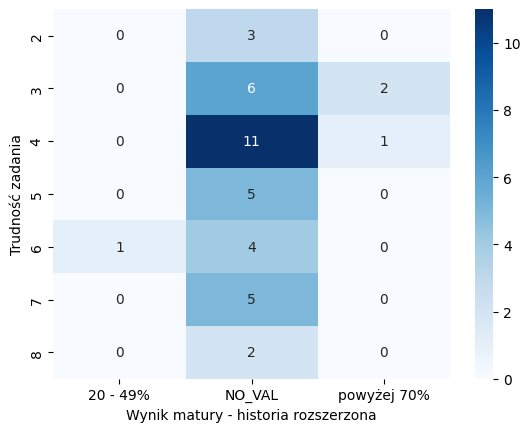

-------------------------------------
Zsumowane grafiki 3:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
2                0       3            0
3                0       2            0
4                0       7            0
5                0       7            0
6                0       6            1
7                0       3            1
8                0       6            0
9                1       2            1
Chi2 test conducted...
Chi-squared test statistic value: 15.674603174603174
P-value: 0.3336470854107814
Brak podstaw do odrzucenia H0.


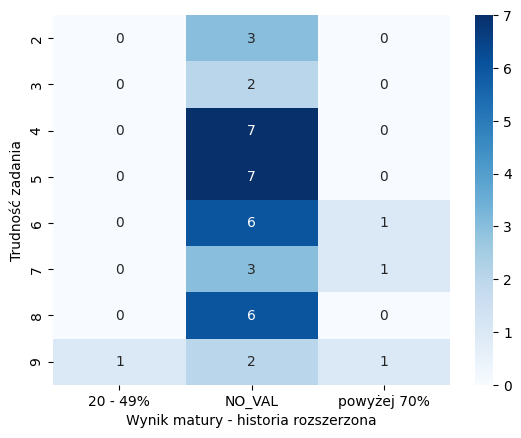

-------------------------------------
Kolekcja wszystkie grafiki:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
1                0      49            2
2                2      71           10
3                1      58            3
4                2      32            2
5                1       6            1
Chi2 test conducted...
Chi-squared test statistic value: 10.895268472865393
P-value: 0.2077043456258299
Brak podstaw do odrzucenia H0.


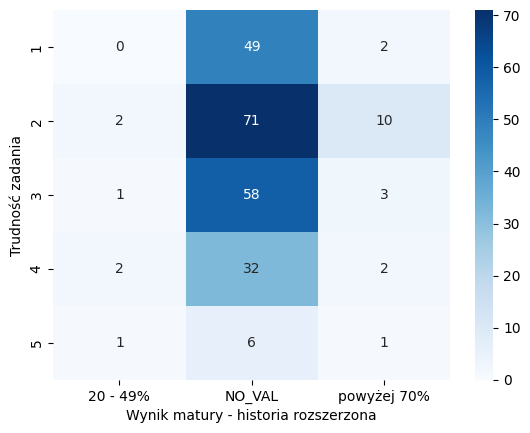

-------------------------------------
Kolekcja grafiki A:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
1                0      21            1
2                1      36            5
3                0      34            1
4                2      15            1
5                0       2            1
Chi2 test conducted...
Chi-squared test statistic value: 12.577200577200575
P-value: 0.12724857165567346
Brak podstaw do odrzucenia H0.


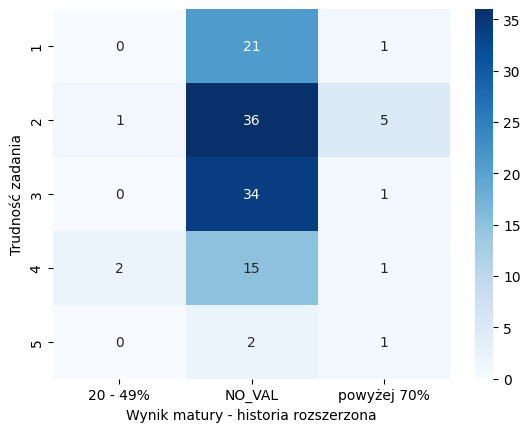

-------------------------------------
Kolekcja grafiki B:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
1                0      28            1
2                1      35            5
3                1      24            2
4                0      17            1
5                1       4            0
Chi2 test conducted...
Chi-squared test statistic value: 10.097903622714387
P-value: 0.2582215198335261
Brak podstaw do odrzucenia H0.


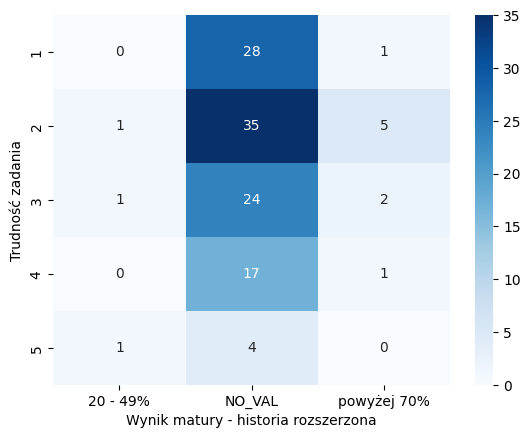

-------------------------------------
Kolekcja grafiki 1:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
1                0      20            0
2                1      26            6
3                1      20            0
4                0       5            0
5                0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 10.476190476190474
P-value: 0.23318019585357516
Brak podstaw do odrzucenia H0.


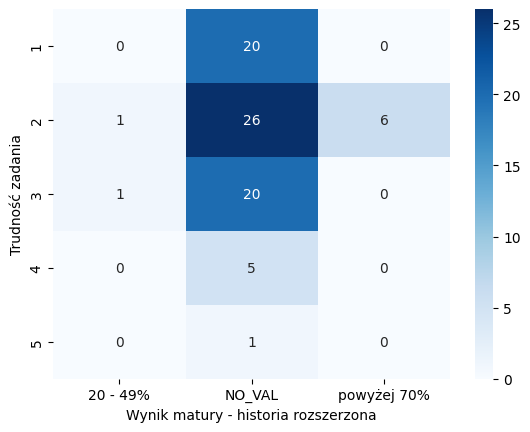

-------------------------------------
Kolekcja grafiki 2:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
1                0      18            2
2                1      25            4
3                0      18            0
4                1       9            0
5                0       2            0
Chi2 test conducted...
Chi-squared test statistic value: 7.481481481481482
P-value: 0.4856830279661951
Brak podstaw do odrzucenia H0.


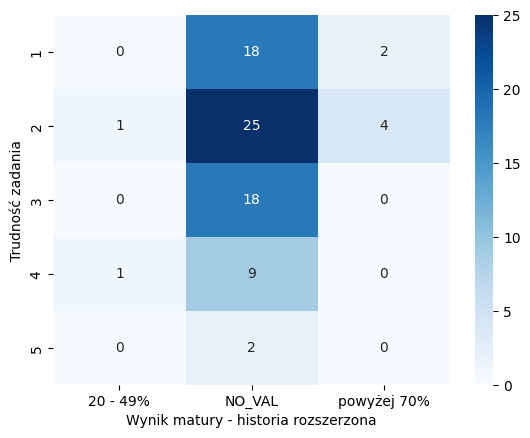

-------------------------------------
Kolekcja grafiki 3:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
diff                                   
1                0      11            0
2                0      20            0
3                0      20            3
4                1      18            2
5                1       3            1
Chi2 test conducted...
Chi-squared test statistic value: 13.239475500345064
P-value: 0.10387134083263784
Brak podstaw do odrzucenia H0.


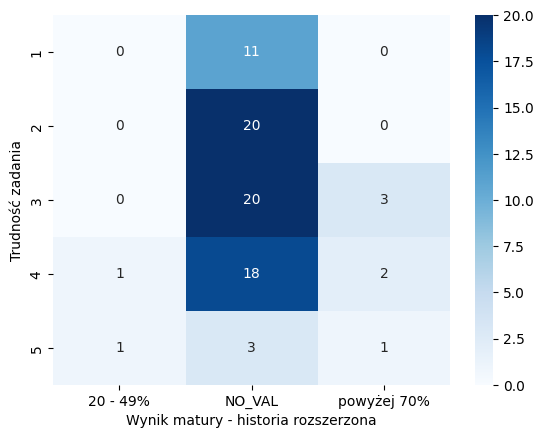

In [27]:
# matura - hist - roz
var = 'HIST_roz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Wynik matury - historia rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Samopocz  2  3  4  5
diff                
9         0  0  0  1
10        0  0  3  1
11        0  0  0  3
12        1  0  1  0
13        0  2  2  1
14        1  1  2  2
15        1  0  2  0
16        0  0  5  0
17        1  1  1  0
18        0  0  2  0
19        1  0  1  0
20        0  1  1  1
22        0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 43.87777777777777
P-value: 0.17219319174624023
Brak podstaw do odrzucenia H0.


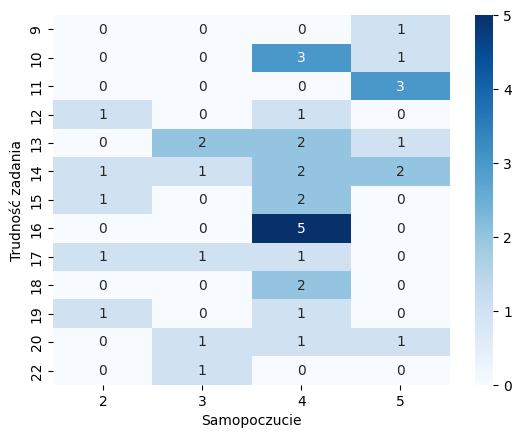

-------------------------------------
Zsumowane grafiki A:
Samopocz  2  3  4  5
diff                
5         0  0  1  1
6         2  1  4  6
7         1  1  3  1
8         1  3  8  0
9         1  0  0  1
10        0  0  2  0
11        0  0  2  0
12        0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 24.373219373219374
P-value: 0.2753285792501282
Brak podstaw do odrzucenia H0.


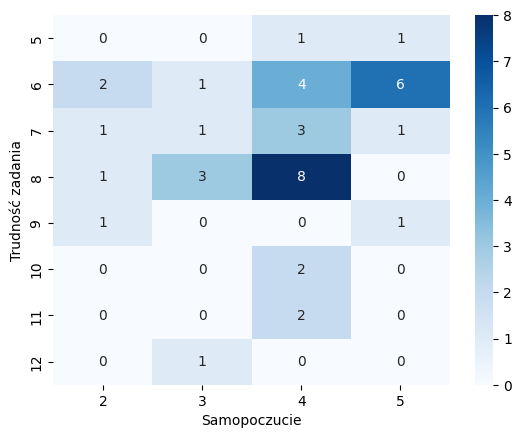

-------------------------------------
Zsumowane grafiki B:
Samopocz  2  3  4  5
diff                
3         0  0  0  1
4         0  0  3  1
5         0  1  1  3
6         1  1  1  0
7         1  1  5  1
8         0  0  8  2
9         2  0  0  0
10        1  2  2  0
11        0  0  0  1
12        0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 44.20555555555556
P-value: 0.019689478252633282
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


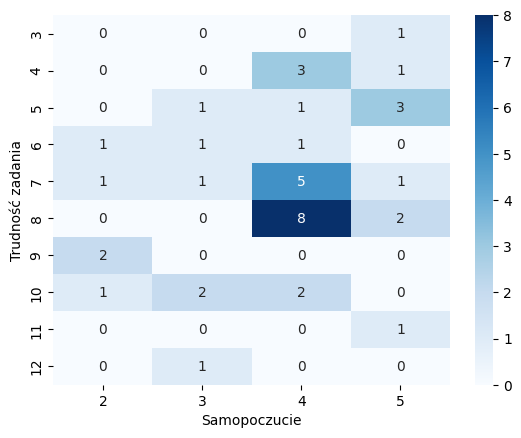

-------------------------------------
Zsumowane grafiki 1:
Samopocz  2  3  4  5
diff                
2         1  1  1  1
3         0  1  3  3
4         1  1  6  0
5         3  2  7  3
6         0  1  2  1
7         0  0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 9.126984126984127
P-value: 0.8707847220847129
Brak podstaw do odrzucenia H0.


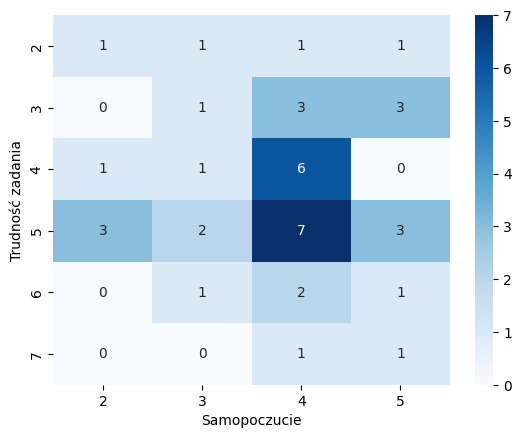

-------------------------------------
Zsumowane grafiki 2:
Samopocz  2  3  4  5
diff                
2         0  0  3  0
3         0  0  6  2
4         1  1  6  4
5         1  0  2  2
6         2  1  2  0
7         0  3  1  1
8         1  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 27.08148148148148
P-value: 0.0774798410627926
Brak podstaw do odrzucenia H0.


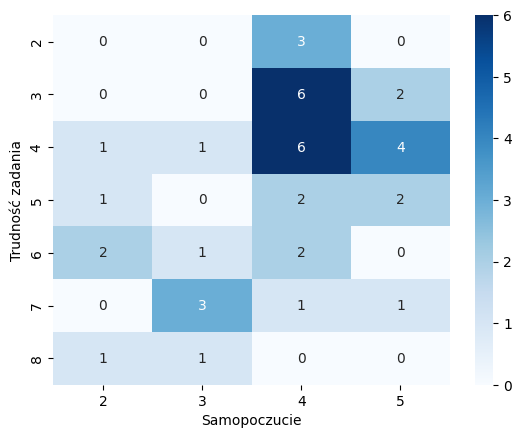

-------------------------------------
Zsumowane grafiki 3:
Samopocz  2  3  4  5
diff                
2         0  1  0  2
3         0  0  1  1
4         2  0  2  3
5         1  2  2  2
6         1  1  4  1
7         0  0  4  0
8         1  1  4  0
9         0  1  3  0
Chi2 test conducted...
Chi-squared test statistic value: 20.679894179894177
P-value: 0.4786360292241362
Brak podstaw do odrzucenia H0.


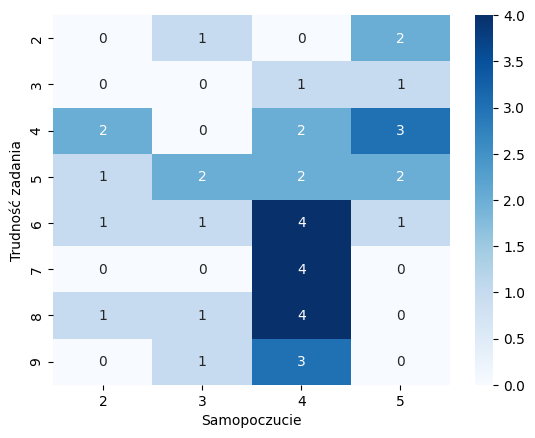

-------------------------------------
Kolekcja wszystkie grafiki:
Samopocz   2  3   4   5
diff                   
1          4  7  23  17
2         11  9  43  20
3          9  9  32  12
4          6  8  17   5
5          0  3   5   0
Chi2 test conducted...
Chi-squared test statistic value: 14.247173033972985
P-value: 0.2852035949065426
Brak podstaw do odrzucenia H0.


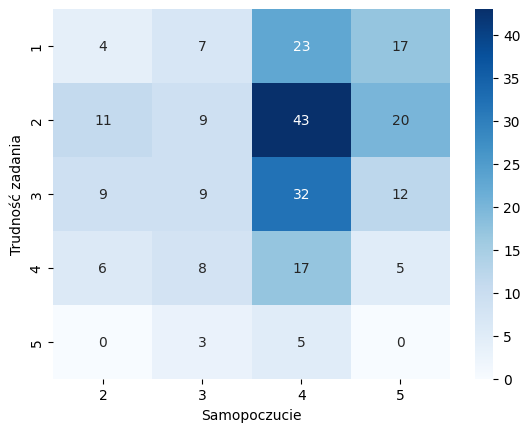

-------------------------------------
Kolekcja grafiki A:
Samopocz  2  3   4   5
diff                  
1         3  3   9   7
2         5  5  20  12
3         5  5  19   6
4         2  4  10   2
5         0  1   2   0
Chi2 test conducted...
Chi-squared test statistic value: 6.646047779381113
P-value: 0.8800909754310869
Brak podstaw do odrzucenia H0.


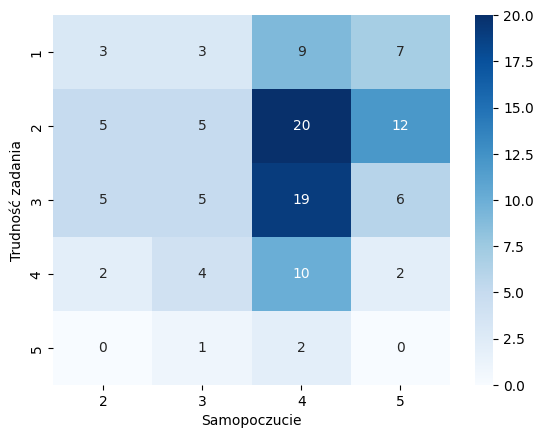

-------------------------------------
Kolekcja grafiki B:
Samopocz  2  3   4   5
diff                  
1         1  4  14  10
2         6  4  23   8
3         4  4  13   6
4         4  4   7   3
5         0  2   3   0
Chi2 test conducted...
Chi-squared test statistic value: 11.938338057710078
P-value: 0.4506444442913601
Brak podstaw do odrzucenia H0.


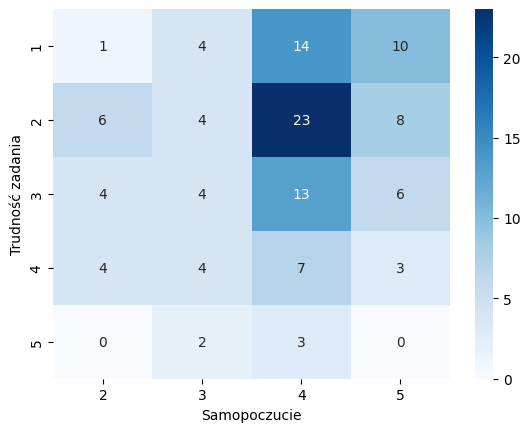

-------------------------------------
Kolekcja grafiki 1:
Samopocz  2  3   4  5
diff                 
1         2  4   8  6
2         5  3  19  6
3         3  5  10  3
4         0  0   2  3
5         0  0   1  0
Chi2 test conducted...
Chi-squared test statistic value: 10.333044733044733
P-value: 0.5867679585981675
Brak podstaw do odrzucenia H0.


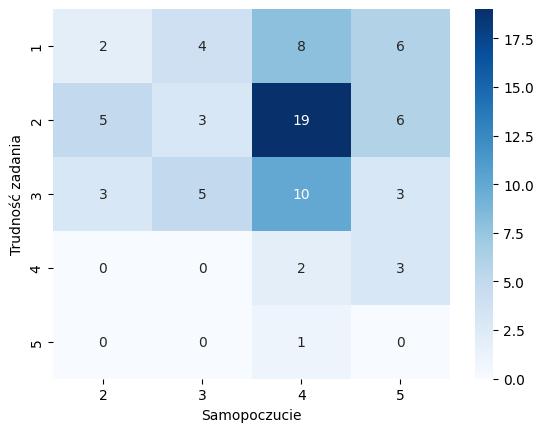

-------------------------------------
Kolekcja grafiki 2:
Samopocz  2  3   4  5
diff                 
1         1  1  14  4
2         2  3  17  8
3         4  2   7  5
4         3  4   2  1
5         0  2   0  0
Chi2 test conducted...
Chi-squared test statistic value: 28.358024691358025
P-value: 0.00490194530049231
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


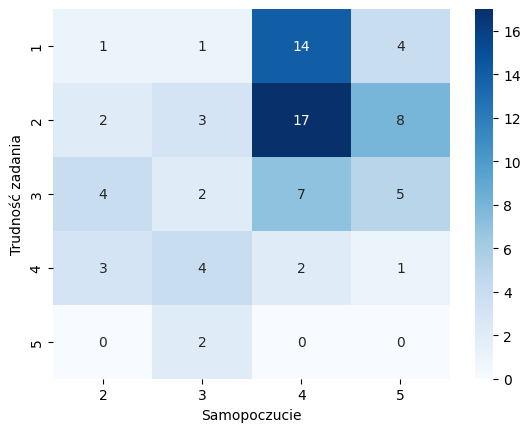

-------------------------------------
Kolekcja grafiki 3:
Samopocz  2  3   4  5
diff                 
1         1  2   1  7
2         4  3   7  6
3         2  2  15  4
4         3  4  13  1
5         0  1   4  0
Chi2 test conducted...
Chi-squared test statistic value: 23.18719074806031
P-value: 0.026178140155491244
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


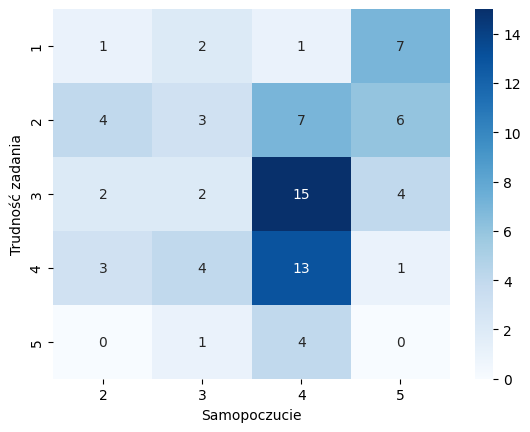

In [28]:
# samopoczucie
var = 'Samopocz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Samopoczucie', cmap='Blues')

In [29]:
posthocNemenyi_test(df_sumB, 'diff', var, ALPHA)
print('-----------------------')
posthocNemenyi_test(df_coll2, 'diff', var, ALPHA)
print('-----------------------')
posthocNemenyi_test(df_coll3, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.060644 | 0.169083 | 0.035729 |
+----+----------+----------+----------+----------+
|  3 | 0.060644 | 1        | 0.923979 | 0.990964 |
+----+----------+----------+----------+----------+
|  5 | 0.169083 | 0.923979 | 1        | 0.797468 |
+----+----------+----------+----------+----------+
|  2 | 0.035729 | 0.990964 | 0.797468 | 1        |
+----+----------+----------+----------+----------+
-----------------------
+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.00531  | 0.068834 | 0.001516 |
+----+----------+----------+----------+----------+
|  3 | 0.00531  | 1        | 0.740259 | 0.969432 |
+----+----------+----------+----------+----------+
|  5 | 0.068834 | 0.740259 | 1        | 0.465212 |
+----+-

-------------------------------------
Zsumowane wszystkie grafiki:
Stres  1  2  3  4  5
diff                
9      0  0  1  0  0
10     1  1  2  0  0
11     3  0  0  0  0
12     0  0  1  1  0
13     2  3  0  0  0
14     0  4  0  1  1
15     1  1  1  0  0
16     2  2  1  0  0
17     0  1  0  1  1
18     0  1  1  0  0
19     0  1  0  1  0
20     0  1  1  1  0
22     0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 49.37777777777777
P-value: 0.41790995775076156
Brak podstaw do odrzucenia H0.


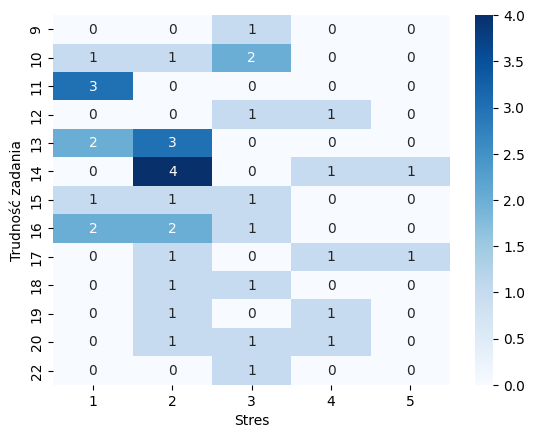

-------------------------------------
Zsumowane grafiki A:
Stres  1  2  3  4  5
diff                
5      1  1  0  0  0
6      5  4  4  0  0
7      0  2  1  2  1
8      3  4  2  2  1
9      0  1  0  1  0
10     0  1  1  0  0
11     0  2  0  0  0
12     0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 23.410256410256416
P-value: 0.712245571789841
Brak podstaw do odrzucenia H0.


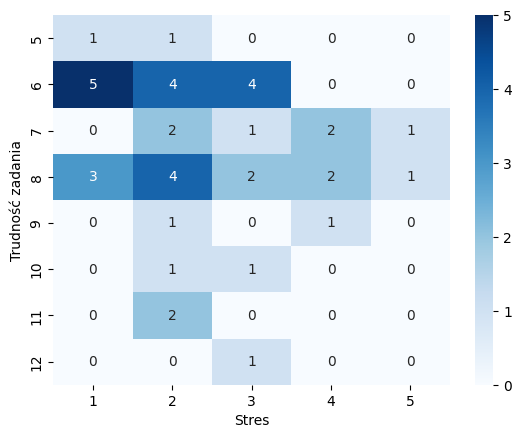

-------------------------------------
Zsumowane grafiki B:
Stres  1  2  3  4  5
diff                
3      0  0  1  0  0
4      1  1  2  0  0
5      3  1  0  1  0
6      0  1  1  1  0
7      2  5  0  0  1
8      3  5  2  0  0
9      0  1  0  0  1
10     0  0  3  2  0
11     0  1  0  0  0
12     0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 47.737037037037034
P-value: 0.09126296610475541
Brak podstaw do odrzucenia H0.


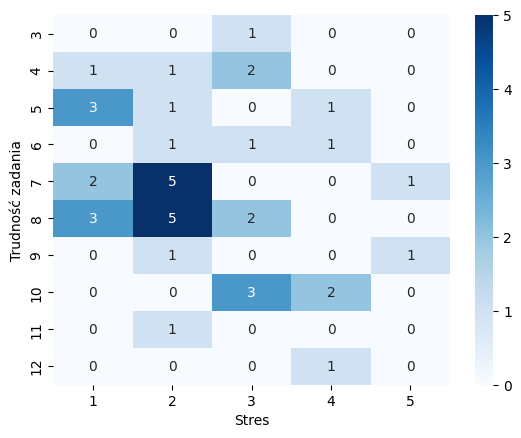

-------------------------------------
Zsumowane grafiki 1:
Stres  1  2  3  4  5
diff                
2      1  1  2  0  0
3      4  2  1  0  0
4      0  5  0  2  1
5      2  4  5  3  1
6      2  1  1  0  0
7      0  2  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 22.4989417989418
P-value: 0.3140614729238806
Brak podstaw do odrzucenia H0.


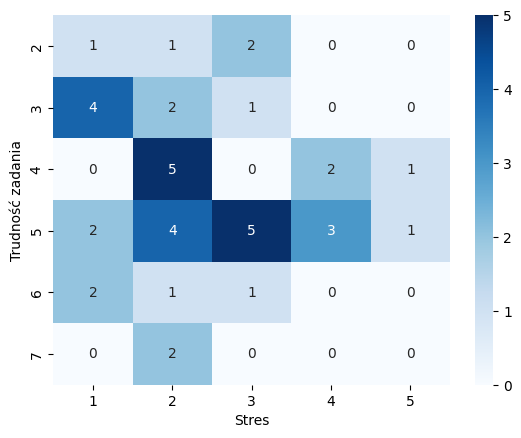

-------------------------------------
Zsumowane grafiki 2:
Stres  1  2  3  4  5
diff                
2      1  0  2  0  0
3      3  4  0  1  0
4      3  6  3  0  0
5      2  2  0  0  1
6      0  1  3  1  0
7      0  2  1  2  0
8      0  0  0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 36.65185185185185
P-value: 0.047385424607905735
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


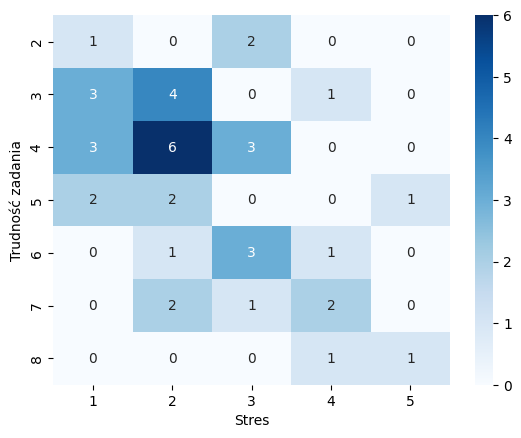

-------------------------------------
Zsumowane grafiki 3:
Stres  1  2  3  4  5
diff                
2      1  0  1  1  0
3      1  0  1  0  0
4      2  2  2  0  1
5      1  3  0  2  1
6      1  5  1  0  0
7      1  2  1  0  0
8      2  2  0  2  0
9      0  1  3  0  0
Chi2 test conducted...
Chi-squared test statistic value: 27.44973544973545
P-value: 0.49387203569252147
Brak podstaw do odrzucenia H0.


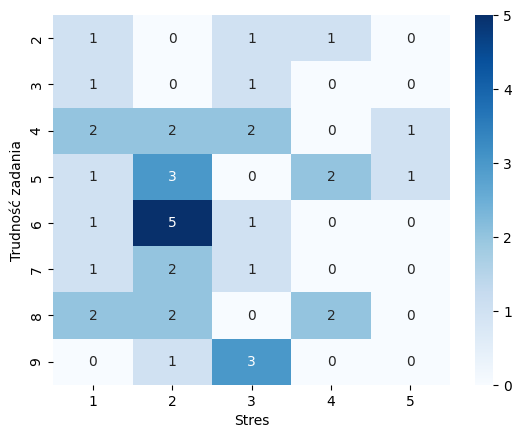

-------------------------------------
Kolekcja wszystkie grafiki:
Stres   1   2   3  4  5
diff                   
1      18  12  15  5  1
2      19  38  13  8  5
3       9  24  17  8  4
4       7  14   5  8  2
5       1   2   4  1  0
Chi2 test conducted...
Chi-squared test statistic value: 23.24619639567476
P-value: 0.10730992590733994
Brak podstaw do odrzucenia H0.


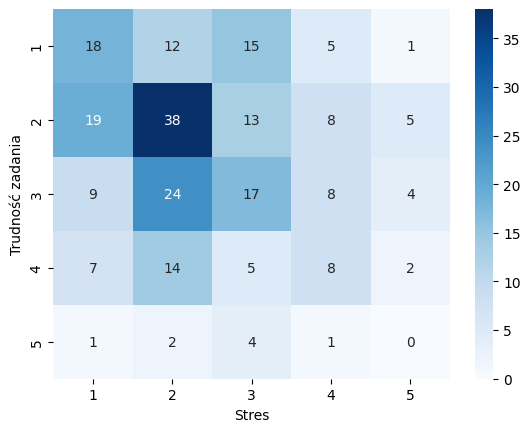

-------------------------------------
Kolekcja grafiki A:
Stres   1   2   3  4  5
diff                   
1       7   6   6  2  1
2      11  18   6  5  2
3       6  12  10  5  2
4       3   7   4  3  1
5       0   2   1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 7.572358505691838
P-value: 0.9605904297821919
Brak podstaw do odrzucenia H0.


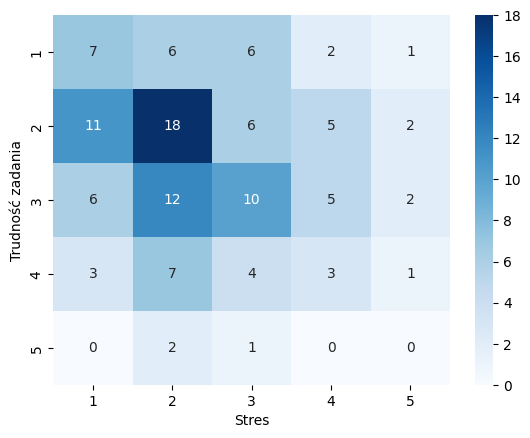

-------------------------------------
Kolekcja grafiki B:
Stres   1   2  3  4  5
diff                  
1      11   6  9  3  0
2       8  20  7  3  3
3       3  12  7  3  2
4       4   7  1  5  1
5       1   0  3  1  0
Chi2 test conducted...
Chi-squared test statistic value: 24.729960162947734
P-value: 0.07472957503297253
Brak podstaw do odrzucenia H0.


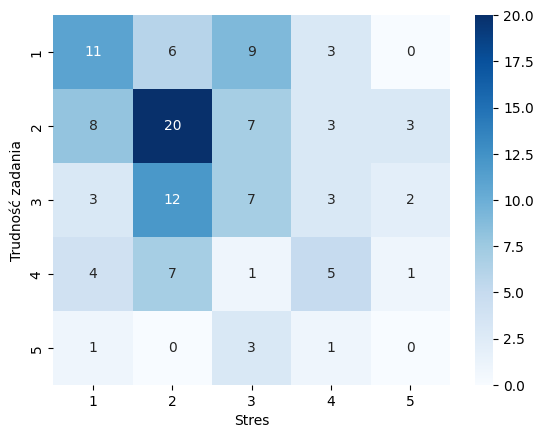

-------------------------------------
Kolekcja grafiki 1:
Stres  1   2  3  4  5
diff                 
1      7   6  5  2  0
2      7  14  6  3  3
3      1   7  7  5  1
4      3   2  0  0  0
5      0   1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 17.847426647426648
P-value: 0.33290676291661603
Brak podstaw do odrzucenia H0.


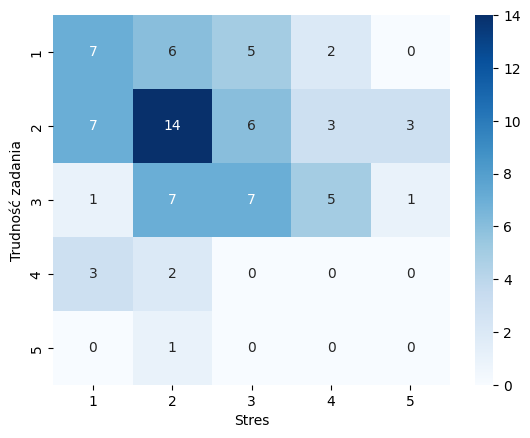

-------------------------------------
Kolekcja grafiki 2:
Stres  1   2  3  4  5
diff                 
1      7   5  7  1  0
2      7  17  2  3  1
3      4   5  7  1  1
4      0   3  1  4  2
5      0   0  1  1  0
Chi2 test conducted...
Chi-squared test statistic value: 33.29382716049383
P-value: 0.006755032111645069
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


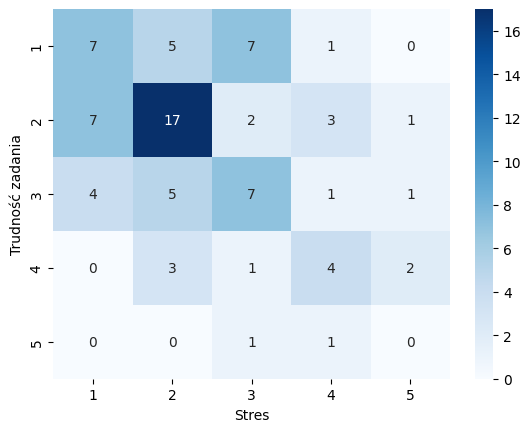

-------------------------------------
Kolekcja grafiki 3:
Stres  1   2  3  4  5
diff                 
1      4   1  3  2  1
2      5   7  5  2  1
3      4  12  3  2  2
4      4   9  4  4  0
5      1   1  3  0  0
Chi2 test conducted...
Chi-squared test statistic value: 14.286948156513372
P-value: 0.5773461661472508
Brak podstaw do odrzucenia H0.


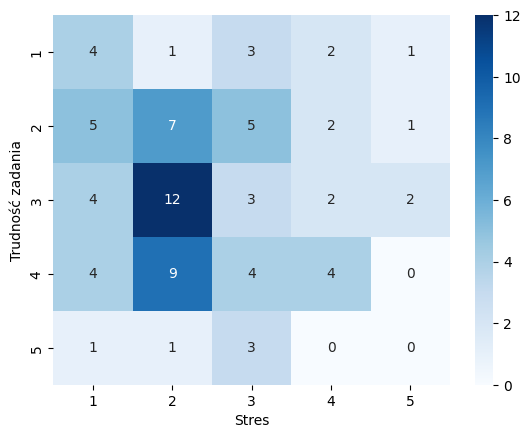

In [30]:
# stres
var = 'Stres'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', var, cmap='Blues')

In [31]:
posthocNemenyi_test(df_sum2, 'diff', var, ALPHA)
posthocNemenyi_test(df_coll2, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        2 |        1 |        3 |        4 |        5 |
+====+==========+==========+==========+==========+==========+
|  2 | 1        | 0.656234 | 0.643467 | 0.17795  | 0.15099  |
+----+----------+----------+----------+----------+----------+
|  1 | 0.656234 | 1        | 1        | 0.859974 | 0.601834 |
+----+----------+----------+----------+----------+----------+
|  3 | 0.643467 | 1        | 1        | 0.86654  | 0.608857 |
+----+----------+----------+----------+----------+----------+
|  4 | 0.17795  | 0.859974 | 0.86654  | 1        | 0.961288 |
+----+----------+----------+----------+----------+----------+
|  5 | 0.15099  | 0.601834 | 0.608857 | 0.961288 | 1        |
+----+----------+----------+----------+----------+----------+
+----+----------+----------+----------+----------+----------+
|    |        2 |        1 |        3 |        4 |        5 |
+====+==========+==========+==========+==========+==========+
|  2 | 1

-------------------------------------
Zsumowane wszystkie grafiki:
Zmęcz  1  2  3  4  5
diff                
9      0  1  0  0  0
10     1  0  3  0  0
11     1  2  0  0  0
12     1  1  0  0  0
13     1  3  0  0  1
14     2  1  2  1  0
15     0  1  2  0  0
16     0  0  1  3  1
17     0  1  0  1  1
18     0  1  0  1  0
19     0  0  2  0  0
20     0  1  0  2  0
22     0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 52.39259259259259
P-value: 0.30750533015684944
Brak podstaw do odrzucenia H0.


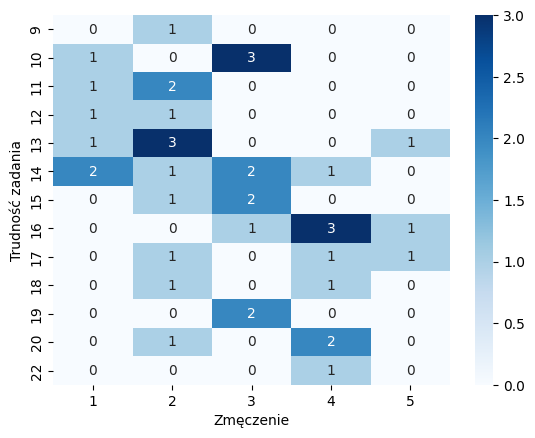

-------------------------------------
Zsumowane grafiki A:
Zmęcz  1  2  3  4  5
diff                
5      1  1  0  0  0
6      3  6  4  0  0
7      2  1  2  0  1
8      0  2  2  6  2
9      0  0  1  1  0
10     0  2  0  0  0
11     0  0  1  1  0
12     0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 33.43589743589743
P-value: 0.2200645044699645
Brak podstaw do odrzucenia H0.


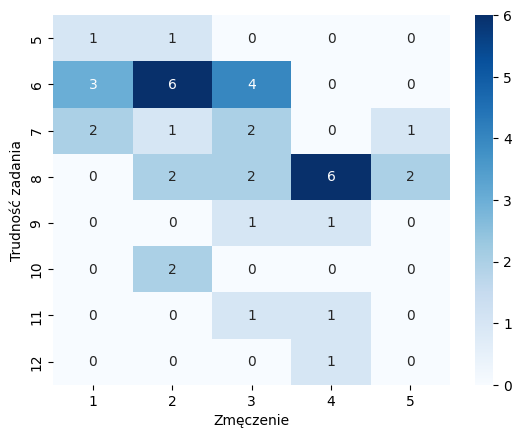

-------------------------------------
Zsumowane grafiki B:
Zmęcz  1  2  3  4  5
diff                
3      0  1  0  0  0
4      1  0  3  0  0
5      1  3  0  0  1
6      1  0  1  1  0
7      2  4  1  1  0
8      1  2  3  3  1
9      0  0  1  1  0
10     0  2  1  1  1
11     0  0  0  1  0
12     0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 31.159259259259258
P-value: 0.6980109916427777
Brak podstaw do odrzucenia H0.


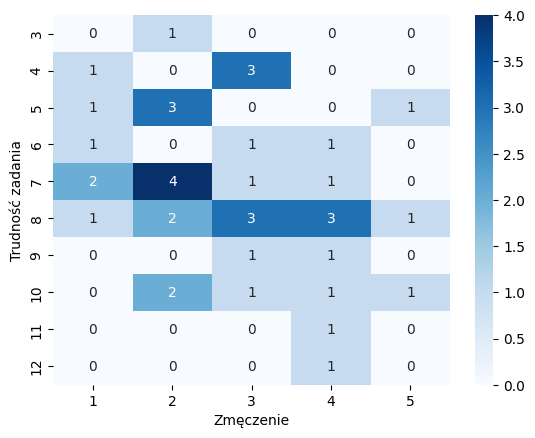

-------------------------------------
Zsumowane grafiki 1:
Zmęcz  1  2  3  4  5
diff                
2      1  1  1  0  1
3      2  4  0  1  0
4      1  2  3  1  1
5      1  3  6  4  1
6      1  2  0  1  0
7      0  0  0  2  0
Chi2 test conducted...
Chi-squared test statistic value: 20.793121693121694
P-value: 0.409398022362907
Brak podstaw do odrzucenia H0.


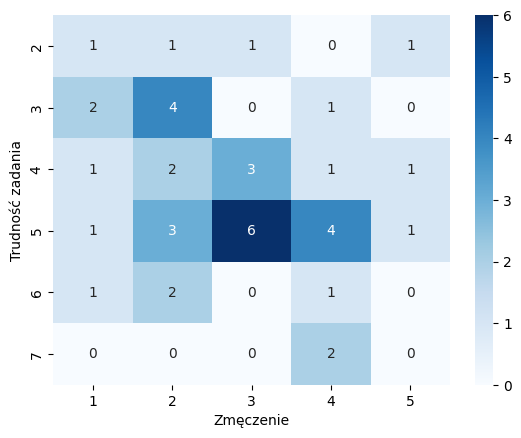

-------------------------------------
Zsumowane grafiki 2:
Zmęcz  1  2  3  4  5
diff                
2      0  1  1  1  0
3      2  1  2  2  1
4      2  6  4  0  0
5      1  2  1  1  0
6      1  2  1  0  1
7      0  0  1  3  1
8      0  0  0  2  0
Chi2 test conducted...
Chi-squared test statistic value: 24.63148148148148
P-value: 0.4260019563251157
Brak podstaw do odrzucenia H0.


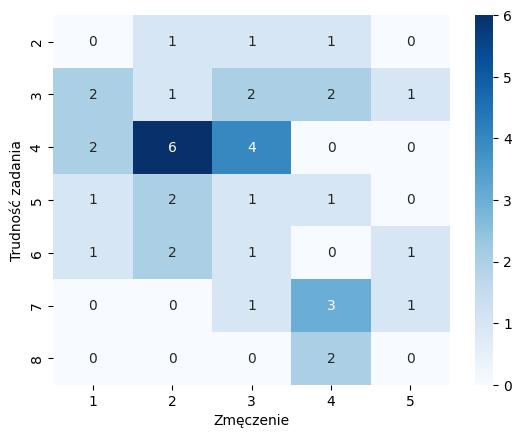

-------------------------------------
Zsumowane grafiki 3:
Zmęcz  1  2  3  4  5
diff                
2      0  1  1  1  0
3      1  0  1  0  0
4      3  2  1  1  0
5      1  3  1  0  2
6      1  3  2  1  0
7      0  2  2  0  0
8      0  0  2  4  0
9      0  1  0  2  1
Chi2 test conducted...
Chi-squared test statistic value: 32.992063492063494
P-value: 0.23603682817452679
Brak podstaw do odrzucenia H0.


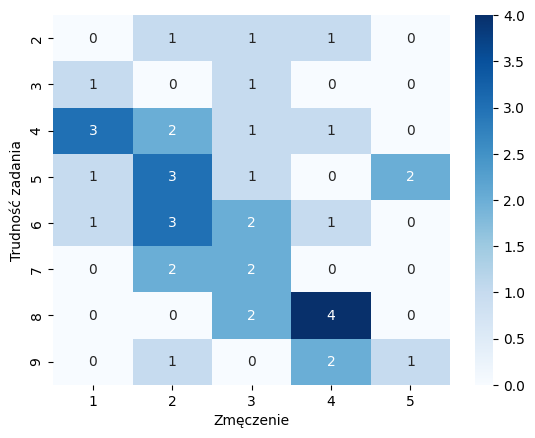

-------------------------------------
Kolekcja wszystkie grafiki:
Zmęcz   1   2   3   4  5
diff                    
1       8  17  14   9  3
2      19  25  20  12  7
3       8  22  16  12  4
4       1   7  10  15  3
5       0   1   0   6  1
Chi2 test conducted...
Chi-squared test statistic value: 33.20561245614971
P-value: 0.006940092044215191
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


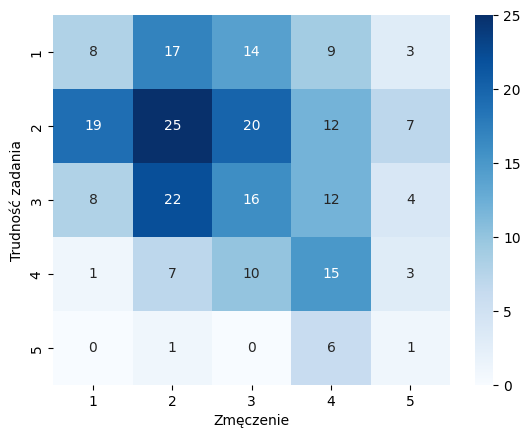

-------------------------------------
Kolekcja grafiki A:
Zmęcz   1   2   3  4  5
diff                   
1       3   8   6  3  2
2      11  12   9  7  3
3       4  12  10  7  2
4       0   4   5  8  1
5       0   0   0  2  1
Chi2 test conducted...
Chi-squared test statistic value: 20.972262305595642
P-value: 0.17957925156653548
Brak podstaw do odrzucenia H0.


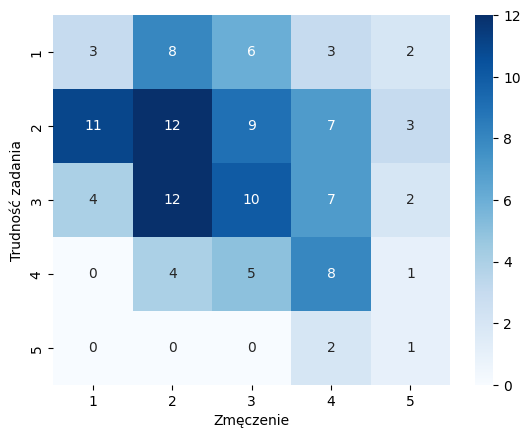

-------------------------------------
Kolekcja grafiki B:
Zmęcz  1   2   3  4  5
diff                  
1      5   9   8  6  1
2      8  13  11  5  4
3      4  10   6  5  2
4      1   3   5  7  2
5      0   1   0  4  0
Chi2 test conducted...
Chi-squared test statistic value: 18.9899420961004
P-value: 0.26918509930019174
Brak podstaw do odrzucenia H0.


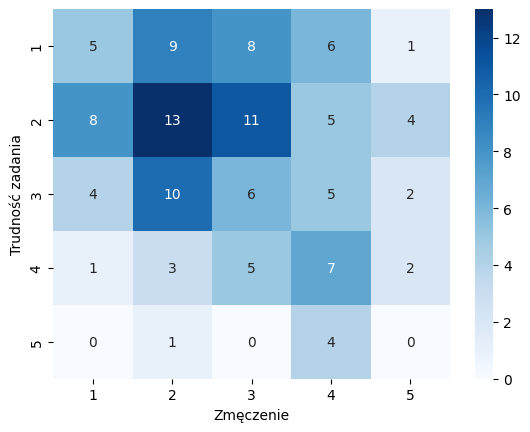

-------------------------------------
Kolekcja grafiki 1:
Zmęcz  1  2  3  4  5
diff                
1      4  8  4  2  2
2      6  9  9  6  3
3      1  5  6  8  1
4      1  2  1  1  0
5      0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 11.969215969215968
P-value: 0.7460961545468159
Brak podstaw do odrzucenia H0.


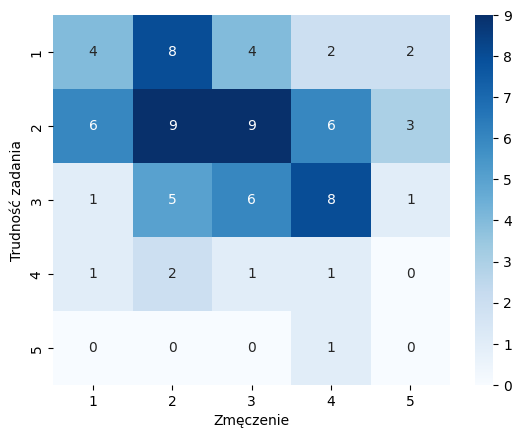

-------------------------------------
Kolekcja grafiki 2:
Zmęcz  1   2  3  4  5
diff                 
1      2   6  7  4  1
2      7  10  6  5  2
3      3   7  5  2  1
4      0   1  2  5  2
5      0   0  0  2  0
Chi2 test conducted...
Chi-squared test statistic value: 20.59506172839506
P-value: 0.19460611430027477
Brak podstaw do odrzucenia H0.


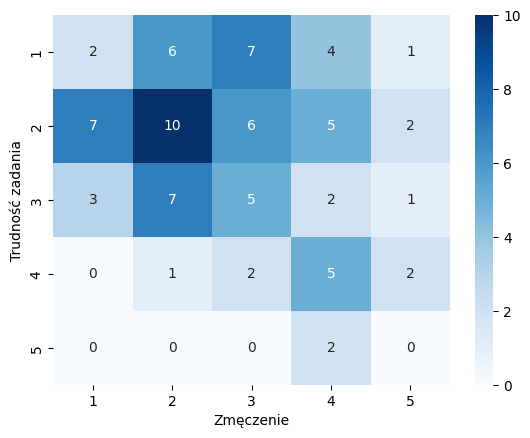

-------------------------------------
Kolekcja grafiki 3:
Zmęcz  1   2  3  4  5
diff                 
1      2   3  3  3  0
2      6   6  5  1  2
3      4  10  5  2  2
4      0   4  7  9  1
5      0   1  0  3  1
Chi2 test conducted...
Chi-squared test statistic value: 25.503670242800677
P-value: 0.06142433733297524
Brak podstaw do odrzucenia H0.


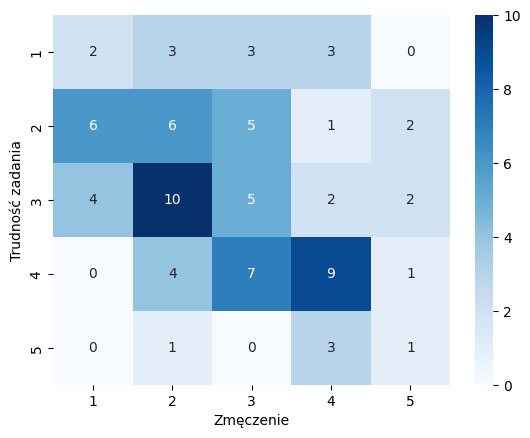

In [32]:
# zmęczenie
var = 'Zmęcz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Zmęczenie', cmap='Blues')

In [33]:
posthocNemenyi_test(df_collAll, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        3 |        2 |        4 |        1 |        5 |
+====+==========+==========+==========+==========+==========+
|  3 | 1        | 0.581286 | 0.797395 | 0.059781 | 8.6e-05  |
+----+----------+----------+----------+----------+----------+
|  2 | 0.581286 | 1        | 0.063183 | 0.000354 | 0        |
+----+----------+----------+----------+----------+----------+
|  4 | 0.797395 | 0.063183 | 1        | 0.504789 | 0.003824 |
+----+----------+----------+----------+----------+----------+
|  1 | 0.059781 | 0.000354 | 0.504789 | 1        | 0.238368 |
+----+----------+----------+----------+----------+----------+
|  5 | 8.6e-05  | 0        | 0.003824 | 0.238368 | 1        |
+----+----------+----------+----------+----------+----------+


-------------------------------------
Zsumowane wszystkie grafiki:
Czyt_map  3  4  5
diff             
9         0  0  1
10        0  3  1
11        1  1  1
12        2  0  0
13        0  5  0
14        0  4  2
15        0  1  2
16        1  3  1
17        0  3  0
18        0  1  1
19        0  2  0
20        1  1  1
22        0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 32.146666666666675
P-value: 0.12339707788575943
Brak podstaw do odrzucenia H0.


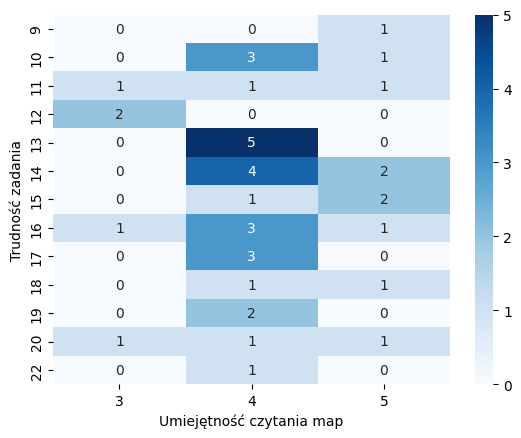

-------------------------------------
Zsumowane grafiki A:
Czyt_map  3  4  5
diff             
5         0  2  0
6         2  6  5
7         1  4  1
8         1  8  3
9         0  2  0
10        1  1  0
11        0  1  1
12        0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 8.65128205128205
P-value: 0.8527200082450626
Brak podstaw do odrzucenia H0.


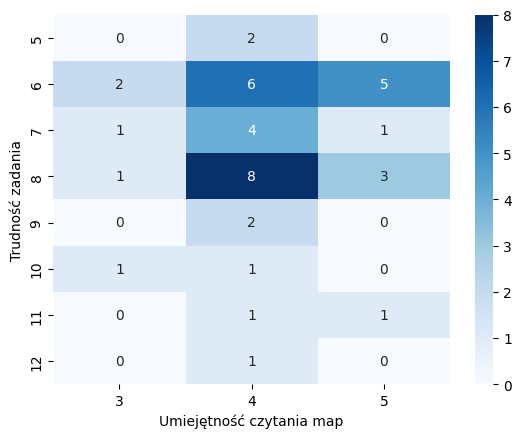

-------------------------------------
Zsumowane grafiki B:
Czyt_map  3  4  5
diff             
3         0  0  1
4         0  3  1
5         2  2  1
6         1  1  1
7         0  7  1
8         1  6  3
9         0  1  1
10        1  4  0
11        0  1  0
12        0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 17.193333333333335
P-value: 0.5098526004515386
Brak podstaw do odrzucenia H0.


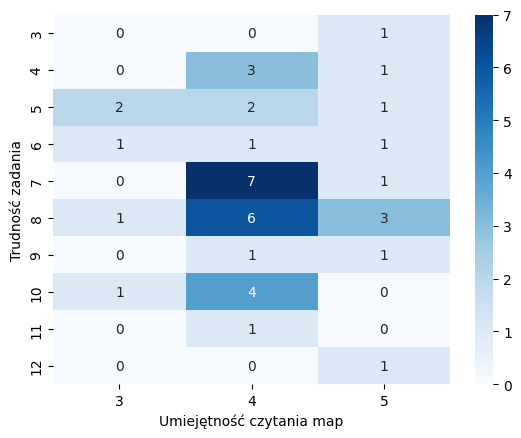

-------------------------------------
Zsumowane grafiki 1:
Czyt_map  3  4  5
diff             
2         2  1  1
3         1  4  2
4         1  6  1
5         1  9  5
6         0  4  0
7         0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 10.225714285714286
P-value: 0.42091889271270055
Brak podstaw do odrzucenia H0.


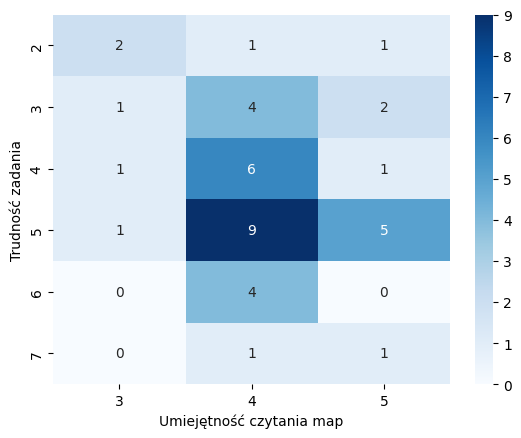

-------------------------------------
Zsumowane grafiki 2:
Czyt_map  3  4  5
diff             
2         0  3  0
3         1  5  2
4         1  7  4
5         1  2  2
6         2  3  0
7         0  4  1
8         0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 9.413333333333334
P-value: 0.6672793759766338
Brak podstaw do odrzucenia H0.


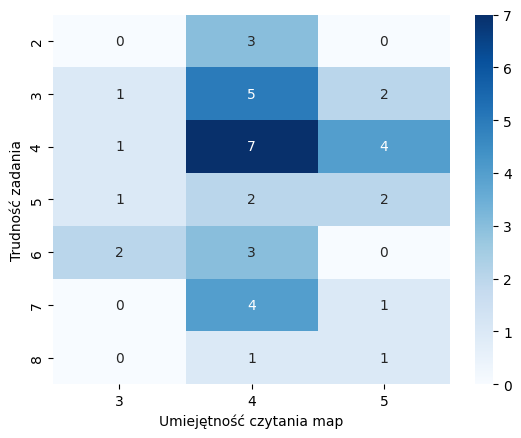

-------------------------------------
Zsumowane grafiki 3:
Czyt_map  3  4  5
diff             
2         0  1  2
3         0  1  1
4         1  4  2
5         2  5  0
6         0  5  2
7         0  4  0
8         1  2  3
9         1  3  0
Chi2 test conducted...
Chi-squared test statistic value: 14.438095238095237
P-value: 0.41760845448598133
Brak podstaw do odrzucenia H0.


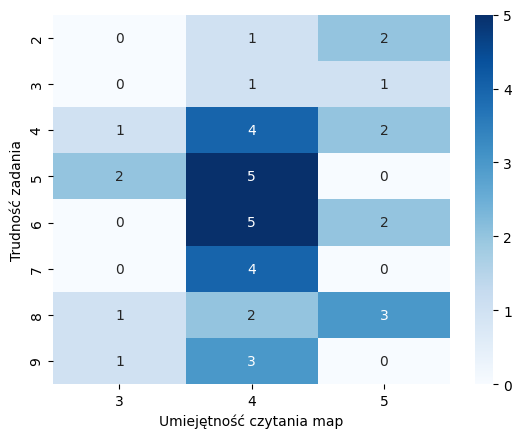

-------------------------------------
Kolekcja wszystkie grafiki:
Czyt_map  3   4   5
diff               
1         8  26  17
2         9  57  17
3         8  38  16
4         4  25   7
5         1   4   3
Chi2 test conducted...
Chi-squared test statistic value: 5.796478005634175
P-value: 0.6700172705344442
Brak podstaw do odrzucenia H0.


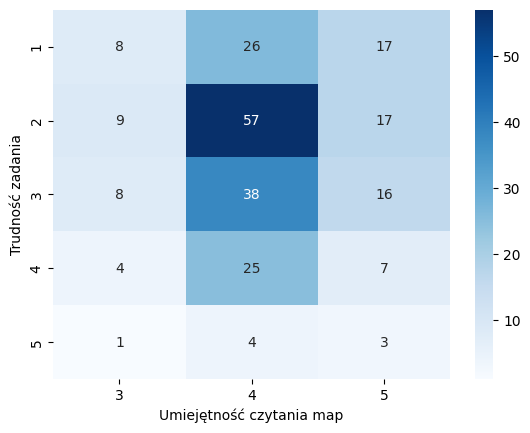

-------------------------------------
Kolekcja grafiki A:
Czyt_map  3   4   5
diff               
1         3  12   7
2         5  28   9
3         4  21  10
4         3  12   3
5         0   2   1
Chi2 test conducted...
Chi-squared test statistic value: 2.50978354978355
P-value: 0.9612731604519931
Brak podstaw do odrzucenia H0.


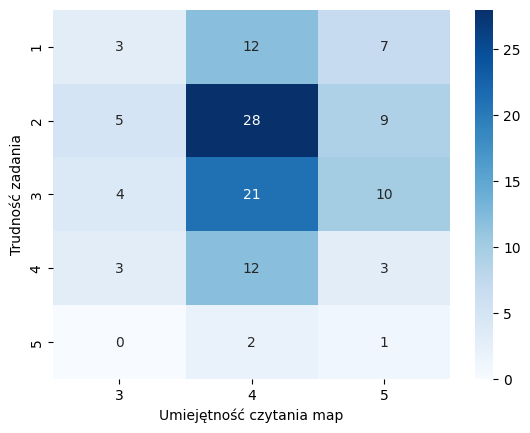

-------------------------------------
Kolekcja grafiki B:
Czyt_map  3   4   5
diff               
1         5  14  10
2         4  29   8
3         4  17   6
4         1  13   4
5         1   2   2
Chi2 test conducted...
Chi-squared test statistic value: 5.991036351742828
P-value: 0.6482360036402331
Brak podstaw do odrzucenia H0.


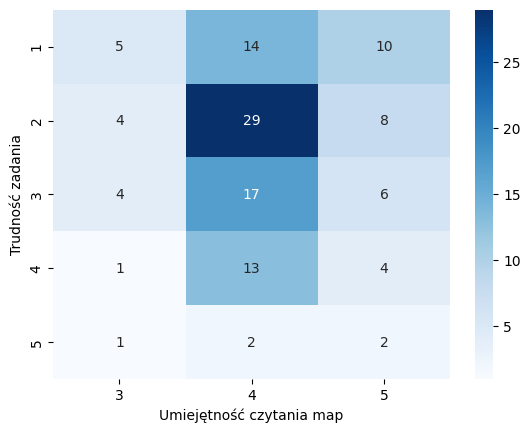

-------------------------------------
Kolekcja grafiki 1:
Czyt_map  3   4  5
diff              
1         6   9  5
2         2  23  8
3         2  13  6
4         0   5  0
5         0   0  1
Chi2 test conducted...
Chi-squared test statistic value: 13.512900432900434
P-value: 0.09537871856151262
Brak podstaw do odrzucenia H0.


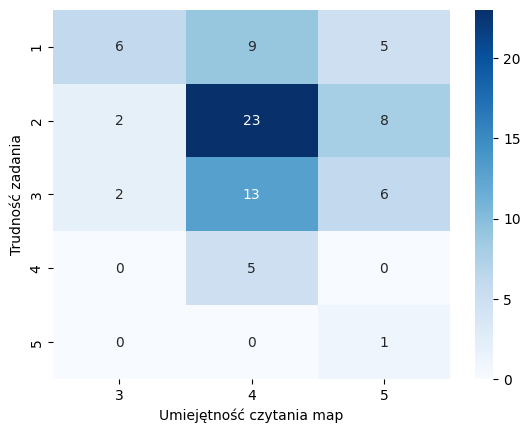

-------------------------------------
Kolekcja grafiki 2:
Czyt_map  3   4  5
diff              
1         2  12  6
2         3  22  5
3         4   8  6
4         1   7  2
5         0   1  1
Chi2 test conducted...
Chi-squared test statistic value: 5.706666666666665
P-value: 0.6800511403963502
Brak podstaw do odrzucenia H0.


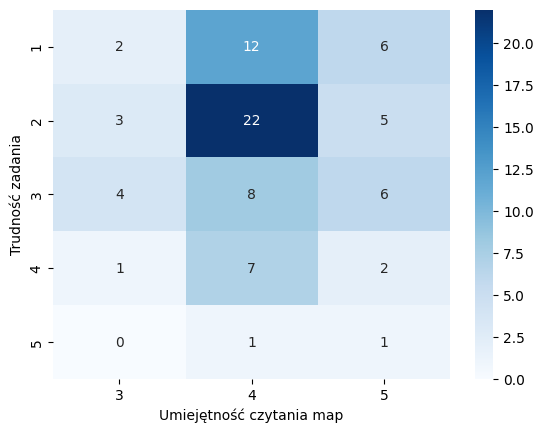

-------------------------------------
Kolekcja grafiki 3:
Czyt_map  3   4  5
diff              
1         0   5  6
2         4  12  4
3         2  17  4
4         3  13  5
5         1   3  1
Chi2 test conducted...
Chi-squared test statistic value: 8.472200263504615
P-value: 0.38875347366162183
Brak podstaw do odrzucenia H0.


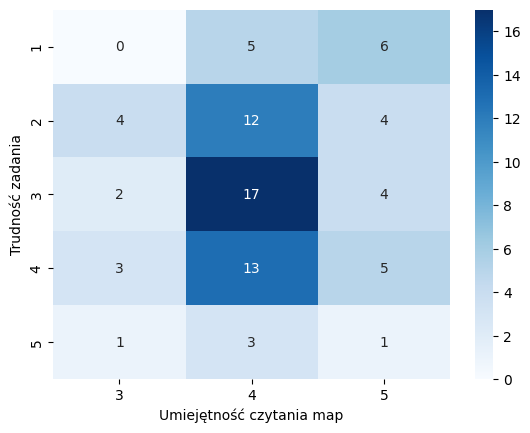

In [34]:
# czytanie map
var = 'Czyt_map'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Umiejętność czytania map', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Podziel_uwg  1  2  3  4  5
diff                      
9            0  0  1  0  0
10           0  0  1  2  1
11           0  0  2  1  0
12           0  2  0  0  0
13           0  3  0  1  1
14           0  1  0  3  2
15           0  0  1  0  2
16           1  0  1  2  1
17           0  0  3  0  0
18           0  1  1  0  0
19           0  0  1  0  1
20           1  0  2  0  0
22           0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 55.97751322751323
P-value: 0.200388470048393
Brak podstaw do odrzucenia H0.


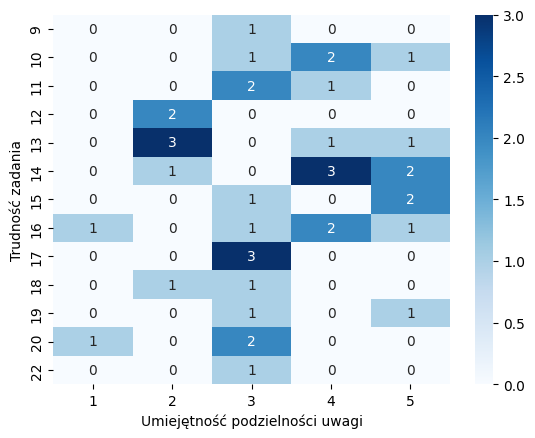

-------------------------------------
Zsumowane grafiki A:
Podziel_uwg  1  2  3  4  5
diff                      
5            0  2  0  0  0
6            0  1  5  5  2
7            0  2  1  0  3
8            1  1  4  4  2
9            0  0  2  0  0
10           1  0  1  0  0
11           0  1  0  0  1
12           0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 38.13593813593813
P-value: 0.09585447633577447
Brak podstaw do odrzucenia H0.


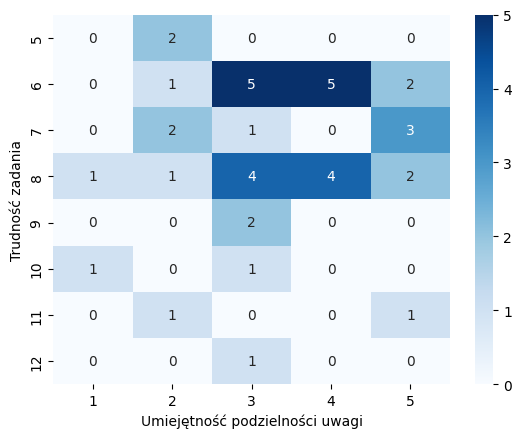

-------------------------------------
Zsumowane grafiki B:
Podziel_uwg  1  2  3  4  5
diff                      
3            0  0  1  0  0
4            0  0  1  2  1
5            0  2  2  1  0
6            0  1  0  2  0
7            0  2  1  1  4
8            1  2  1  3  3
9            0  0  2  0  0
10           1  0  4  0  0
11           0  0  1  0  0
12           0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 36.25529100529101
P-value: 0.45674434171410455
Brak podstaw do odrzucenia H0.


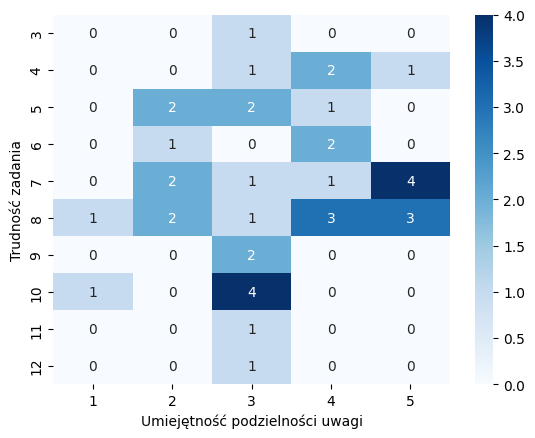

-------------------------------------
Zsumowane grafiki 1:
Podziel_uwg  1  2  3  4  5
diff                      
2            0  2  1  1  0
3            0  0  2  3  2
4            1  2  0  2  3
5            1  1  8  3  2
6            0  1  2  0  1
7            0  1  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 18.67431972789116
P-value: 0.5430771630258077
Brak podstaw do odrzucenia H0.


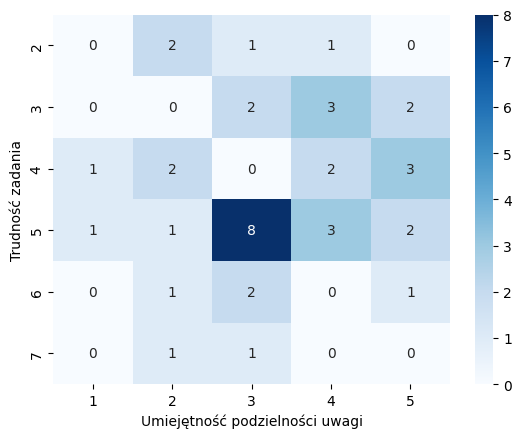

-------------------------------------
Zsumowane grafiki 2:
Podziel_uwg  1  2  3  4  5
diff                      
2            0  0  1  0  2
3            1  3  1  3  0
4            0  2  3  4  3
5            0  0  2  1  2
6            1  2  2  0  0
7            0  0  4  0  1
8            0  0  1  1  0
Chi2 test conducted...
Chi-squared test statistic value: 27.453703703703702
P-value: 0.2837530972055678
Brak podstaw do odrzucenia H0.


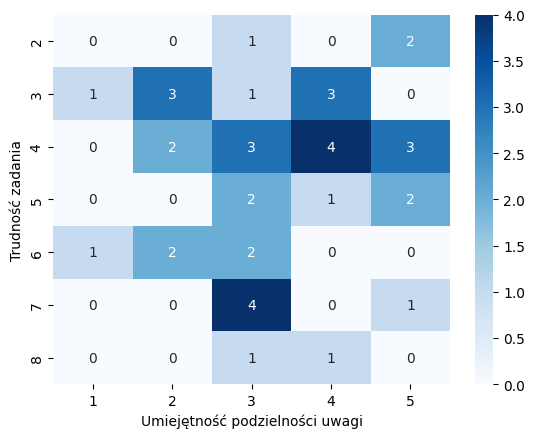

-------------------------------------
Zsumowane grafiki 3:
Podziel_uwg  1  2  3  4  5
diff                      
2            0  0  2  1  0
3            0  0  1  0  1
4            0  2  1  4  0
5            0  4  2  0  1
6            0  0  3  1  3
7            0  0  1  2  1
8            0  1  2  1  2
9            2  0  2  0  0
Chi2 test conducted...
Chi-squared test statistic value: 45.39399092970521
P-value: 0.020117323466716117
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


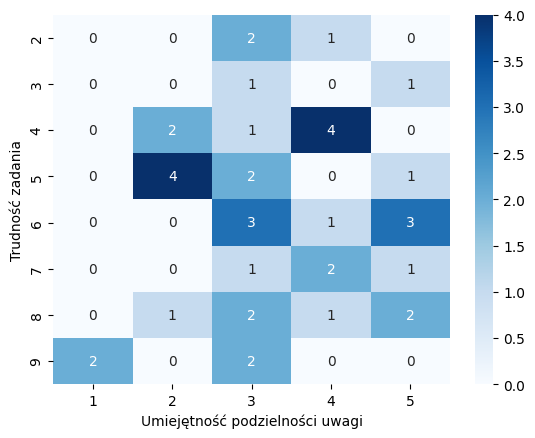

-------------------------------------
Kolekcja wszystkie grafiki:
Podziel_uwg  1   2   3   4   5
diff                          
1            1  10  17  14   9
2            5  17  21  23  17
3            1  10  25  11  15
4            3   4  17   5   7
5            2   1   4   1   0
Chi2 test conducted...
Chi-squared test statistic value: 22.159031848406045
P-value: 0.13813045441632132
Brak podstaw do odrzucenia H0.


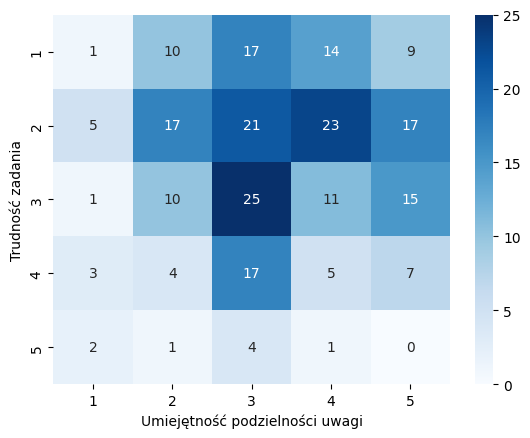

-------------------------------------
Kolekcja grafiki A:
Podziel_uwg  1  2   3   4  5
diff                        
1            1  5   8   4  4
2            2  8  11  13  8
3            0  5  14   8  8
4            2  2   8   2  4
5            1  1   1   0  0
Chi2 test conducted...
Chi-squared test statistic value: 15.109553585744061
P-value: 0.5166297410915383
Brak podstaw do odrzucenia H0.


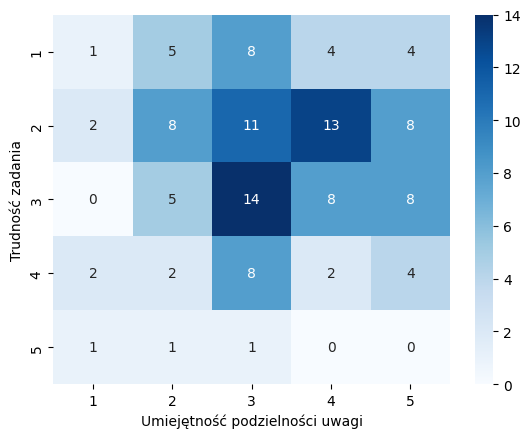

-------------------------------------
Kolekcja grafiki B:
Podziel_uwg  1  2   3   4  5
diff                        
1            0  5   9  10  5
2            3  9  10  10  9
3            1  5  11   3  7
4            1  2   9   3  3
5            1  0   3   1  0
Chi2 test conducted...
Chi-squared test statistic value: 15.292257955420277
P-value: 0.5033462387742813
Brak podstaw do odrzucenia H0.


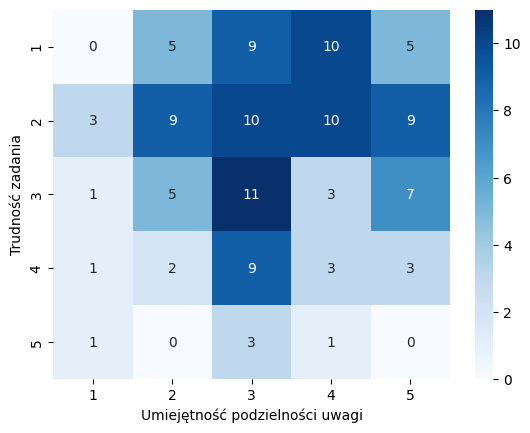

-------------------------------------
Kolekcja grafiki 1:
Podziel_uwg  1  2   3  4  5
diff                       
1            0  6   5  6  3
2            3  3  10  8  9
3            1  3  10  4  3
4            0  1   3  0  1
5            0  1   0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 16.206297670583385
P-value: 0.4386577934521549
Brak podstaw do odrzucenia H0.


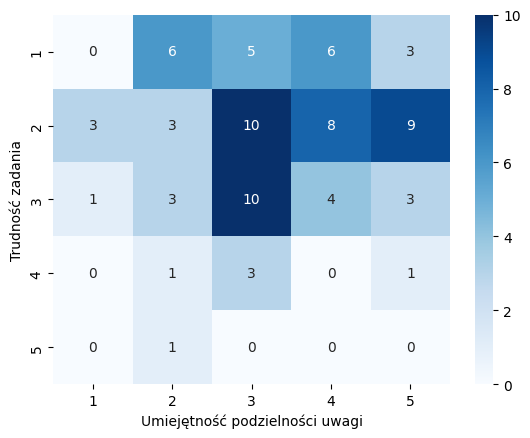

-------------------------------------
Kolekcja grafiki 2:
Podziel_uwg  1  2  3  4  5
diff                      
1            1  3  6  5  5
2            2  8  6  8  6
3            0  2  9  3  4
4            1  1  5  2  1
5            0  0  2  0  0
Chi2 test conducted...
Chi-squared test statistic value: 12.787037037037038
P-value: 0.6882605285615331
Brak podstaw do odrzucenia H0.


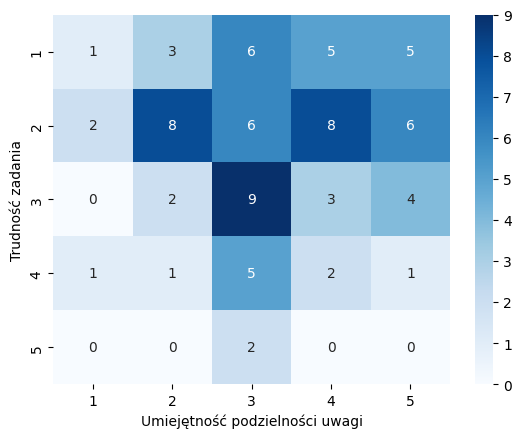

-------------------------------------
Kolekcja grafiki 3:
Podziel_uwg  1  2  3  4  5
diff                      
1            0  1  6  3  1
2            0  6  5  7  2
3            0  5  6  4  8
4            2  2  9  3  5
5            2  0  2  1  0
Chi2 test conducted...
Chi-squared test statistic value: 30.345244817294507
P-value: 0.016292238156871062
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


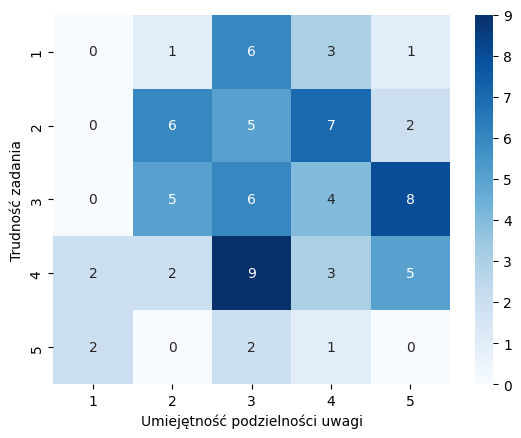

In [35]:
# podzielność uwagi
var = 'Podziel_uwg'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Umiejętność podzielności uwagi', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Analit_myśl  2  3  4  5
corr                   
0            0  0  1  0
2            0  2  0  1
3            1  0  6  1
4            0  4  4  0
5            0  2  6  5
6            0  3  2  2
Chi2 test conducted...
Chi-squared test statistic value: 18.8615867563236
P-value: 0.22007476752021932
Brak podstaw do odrzucenia H0.


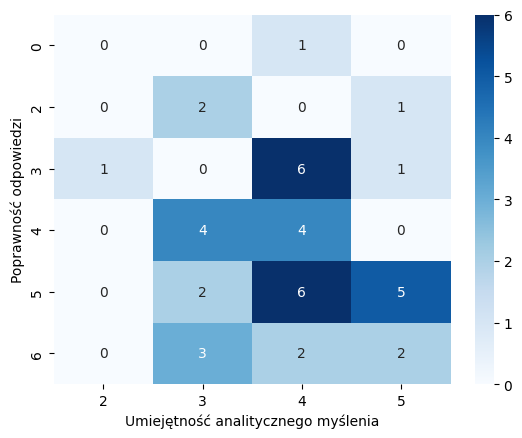

-------------------------------------
Zsumowane grafiki A:
Analit_myśl  2  3  4  5
corr                   
0            0  0  1  0
1            1  2  4  1
2            0  5  9  2
3            0  4  5  6
Chi2 test conducted...
Chi-squared test statistic value: 9.19457735247209
P-value: 0.4195104670780957
Brak podstaw do odrzucenia H0.


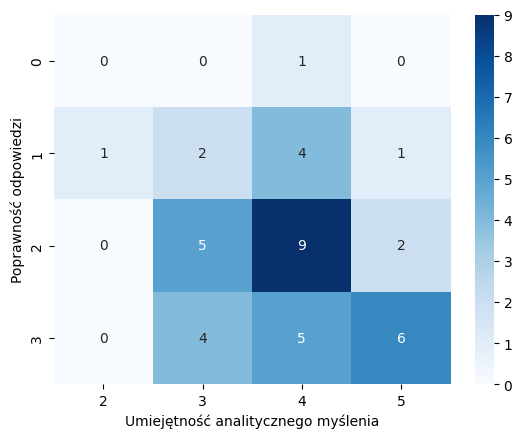

-------------------------------------
Zsumowane grafiki B:
Analit_myśl  2  3   4  5
corr                    
0            0  0   1  0
1            0  2   2  2
2            1  5  11  4
3            0  4   5  3
Chi2 test conducted...
Chi-squared test statistic value: 3.2140958456747932
P-value: 0.9551982534540059
Brak podstaw do odrzucenia H0.


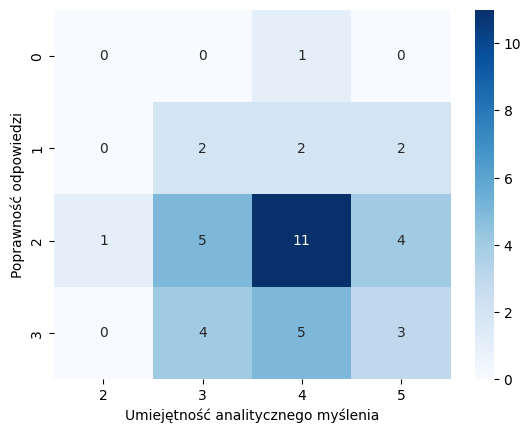

-------------------------------------
Zsumowane grafiki 1:
Analit_myśl  2  3   4  5
corr                    
0            0  0   2  0
1            0  2   2  0
2            1  9  15  9
Chi2 test conducted...
Chi-squared test statistic value: 4.311849141570503
P-value: 0.6345544035712034
Brak podstaw do odrzucenia H0.


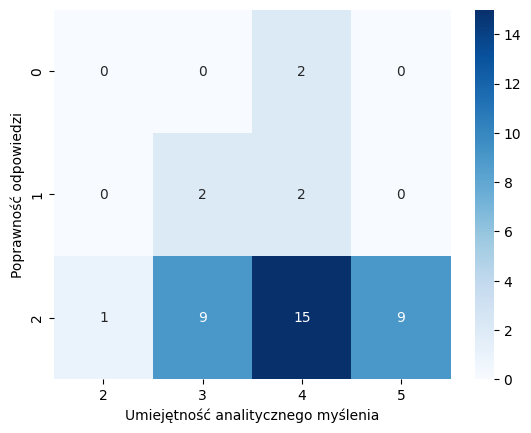

-------------------------------------
Zsumowane grafiki 2:
Analit_myśl  2  3   4  5
corr                    
0            0  2   4  2
1            1  1   3  2
2            0  8  12  5
Chi2 test conducted...
Chi-squared test statistic value: 5.610997189944559
P-value: 0.46814398417913183
Brak podstaw do odrzucenia H0.


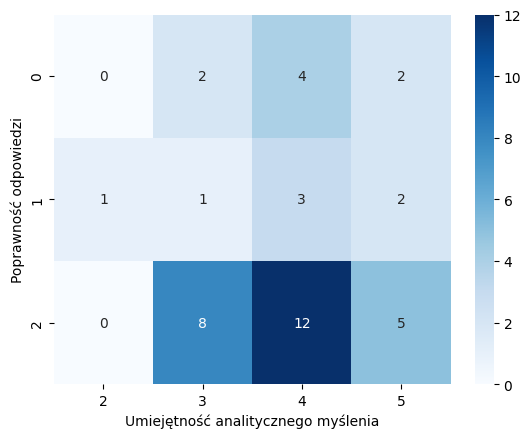

-------------------------------------
Zsumowane grafiki 3:
Analit_myśl  2  3  4  5
corr                   
0            1  3  7  1
1            0  5  7  4
2            0  3  5  4
Chi2 test conducted...
Chi-squared test statistic value: 4.640262271841219
P-value: 0.5907074960737431
Brak podstaw do odrzucenia H0.


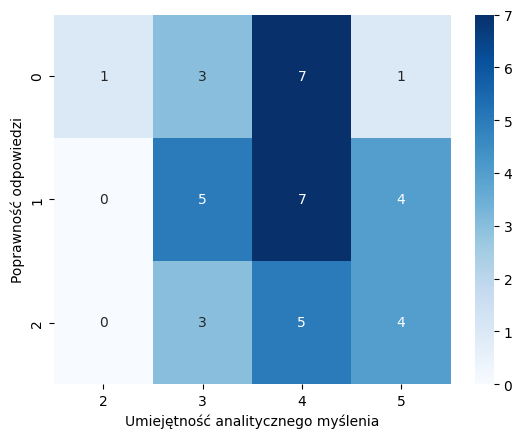

-------------------------------------
Kolekcja wszystkie grafiki:
Analit_myśl  2   3   4   5
corr                      
0            3  18  38  12
1            3  48  76  42
Chi2 test conducted...
Chi-squared test statistic value: 3.5439316912773036
P-value: 0.3151088672855275
Brak podstaw do odrzucenia H0.


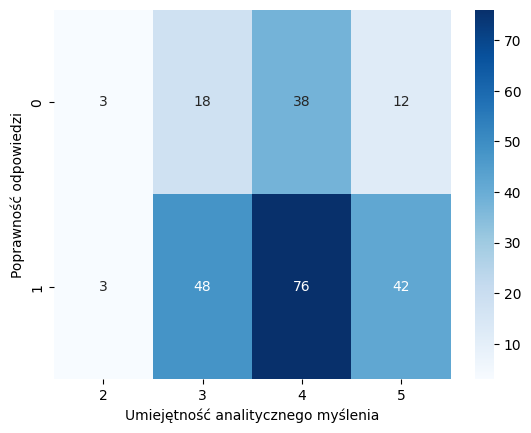

-------------------------------------
Kolekcja grafiki A:
Analit_myśl  2   3   4   5
corr                      
0            2   9  20   4
1            1  24  37  23
Chi2 test conducted...
Chi-squared test statistic value: 5.7584603219278145
P-value: 0.12397159647401447
Brak podstaw do odrzucenia H0.


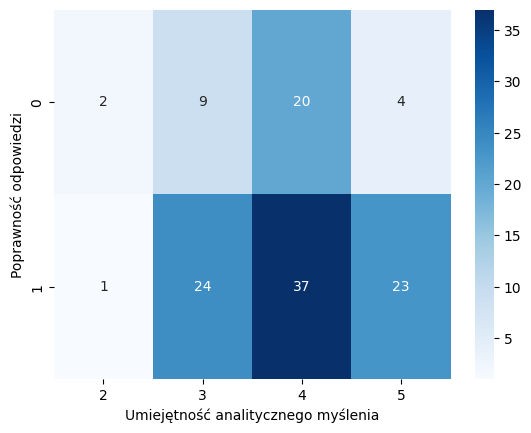

-------------------------------------
Kolekcja grafiki B:
Analit_myśl  2   3   4   5
corr                      
0            1   9  18   8
1            2  24  39  19
Chi2 test conducted...
Chi-squared test statistic value: 0.20218897411879838
P-value: 0.97723515127969
Brak podstaw do odrzucenia H0.


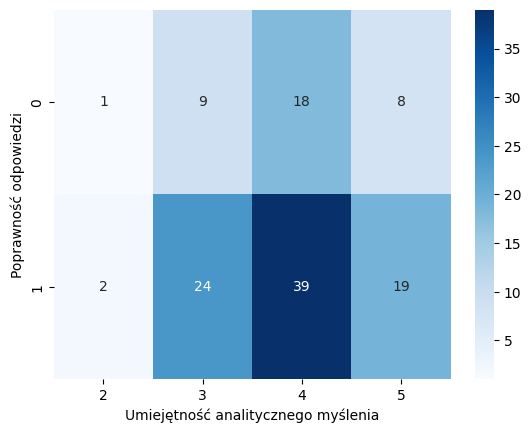

-------------------------------------
Kolekcja grafiki 1:
Analit_myśl  2   3   4   5
corr                      
0            0   2   6   0
1            2  20  32  18
Chi2 test conducted...
Chi-squared test statistic value: 3.6576289207868165
P-value: 0.3008862266449937
Brak podstaw do odrzucenia H0.


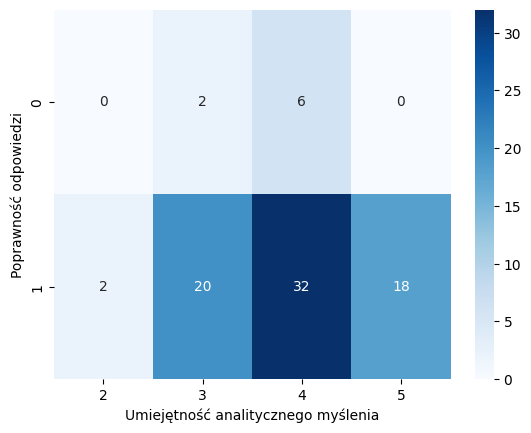

-------------------------------------
Kolekcja grafiki 2:
Analit_myśl  2   3   4   5
corr                      
0            1   5  11   6
1            1  17  27  12
Chi2 test conducted...
Chi-squared test statistic value: 1.0157701305479216
P-value: 0.7974361254513519
Brak podstaw do odrzucenia H0.


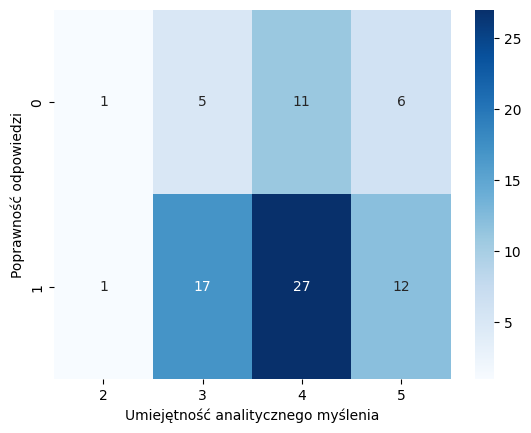

-------------------------------------
Kolekcja grafiki 3:
Analit_myśl  2   3   4   5
corr                      
0            2  11  21   6
1            0  11  17  12
Chi2 test conducted...
Chi-squared test statistic value: 4.421052631578947
P-value: 0.21944124046853966
Brak podstaw do odrzucenia H0.


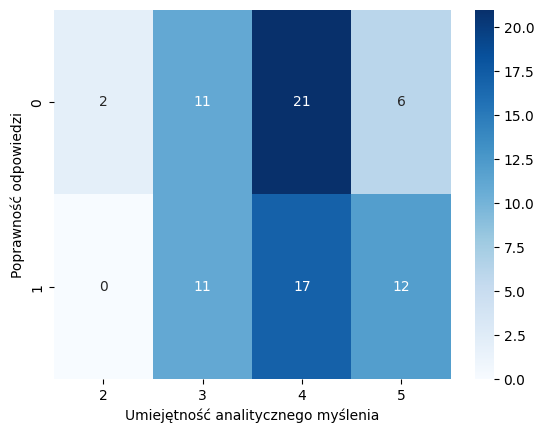

In [48]:
# analityczne myślenie
var = 'Analit_myśl'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Umiejętność analitycznego myślenia', cmap='Blues')

In [36]:
posthocNemenyi_test(df_sum3, 'diff', var, ALPHA)
posthocNemenyi_test(df_coll3, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        5 |        4 |        3 |        2 |        1 |
+====+==========+==========+==========+==========+==========+
|  5 | 1        | 0.999907 | 0.594023 | 0.999933 | 0.76107  |
+----+----------+----------+----------+----------+----------+
|  4 | 0.999907 | 1        | 0.665848 | 0.998787 | 0.699124 |
+----+----------+----------+----------+----------+----------+
|  3 | 0.594023 | 0.665848 | 1        | 0.536379 | 0.215469 |
+----+----------+----------+----------+----------+----------+
|  2 | 0.999933 | 0.998787 | 0.536379 | 1        | 0.816826 |
+----+----------+----------+----------+----------+----------+
|  1 | 0.76107  | 0.699124 | 0.215469 | 0.816826 | 1        |
+----+----------+----------+----------+----------+----------+
+----+----------+----------+----------+----------+----------+
|    |        5 |        4 |        3 |        2 |        1 |
+====+==========+==========+==========+==========+==========+
|  5 | 1

-------------------------------------
Zsumowane wszystkie grafiki:
Spostrzeg  2  3  4  5
diff                 
9          0  0  1  0
10         0  1  1  2
11         0  0  1  2
12         1  1  0  0
13         0  2  2  1
14         0  1  4  1
15         0  1  1  1
16         1  2  2  0
17         0  1  1  1
18         1  0  1  0
19         0  1  1  0
20         0  1  2  0
22         1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 34.26292335115864
P-value: 0.551367309230494
Brak podstaw do odrzucenia H0.


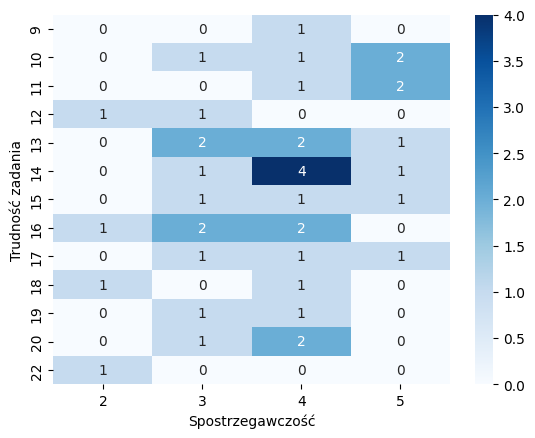

-------------------------------------
Zsumowane grafiki A:
Spostrzeg  2  3  4  5
diff                 
5          0  1  1  0
6          0  2  6  5
7          1  1  3  1
8          1  5  4  2
9          0  2  0  0
10         0  0  2  0
11         1  0  1  0
12         1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 28.248320307143835
P-value: 0.13324816377042786
Brak podstaw do odrzucenia H0.


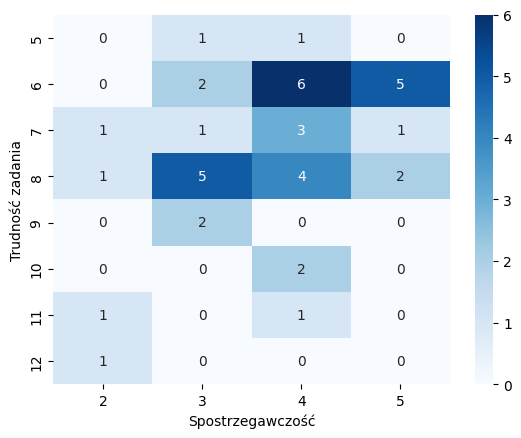

-------------------------------------
Zsumowane grafiki B:
Spostrzeg  2  3  4  5
diff                 
3          0  0  1  0
4          0  1  1  2
5          1  1  1  2
6          0  2  0  1
7          1  1  5  1
8          1  3  5  1
9          0  0  1  1
10         1  2  2  0
11         0  1  0  0
12         0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 19.35806595365419
P-value: 0.8565874342821088
Brak podstaw do odrzucenia H0.


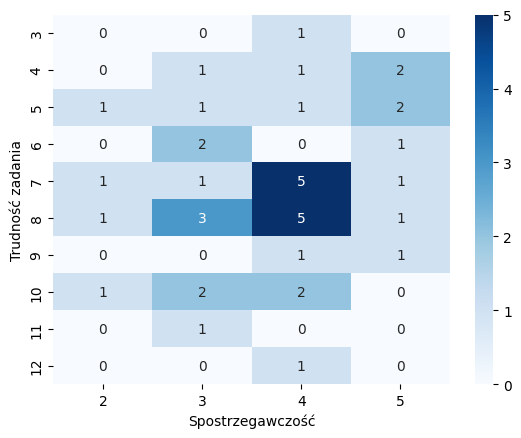

-------------------------------------
Zsumowane grafiki 1:
Spostrzeg  2  3  4  5
diff                 
2          0  2  2  0
3          0  0  3  4
4          2  2  3  1
5          0  5  7  3
6          1  1  2  0
7          1  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 19.860421441303796
P-value: 0.1773527336648884
Brak podstaw do odrzucenia H0.


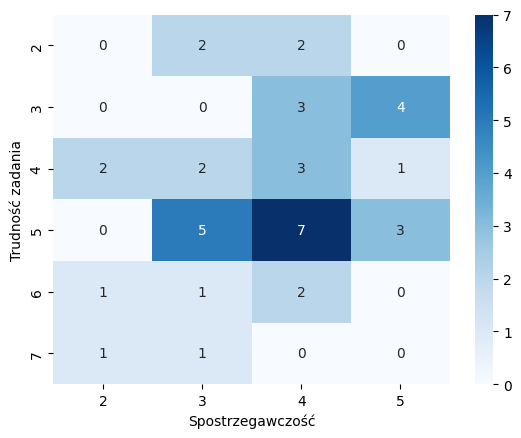

-------------------------------------
Zsumowane grafiki 2:
Spostrzeg  2  3  4  5
diff                 
2          0  3  0  0
3          3  1  2  2
4          0  2  7  3
5          0  0  4  1
6          0  3  2  0
7          1  2  2  0
8          0  0  0  2
Chi2 test conducted...
Chi-squared test statistic value: 34.60873440285205
P-value: 0.010582882209507694
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


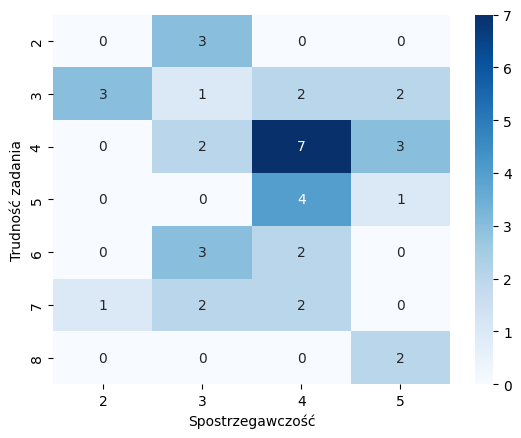

-------------------------------------
Zsumowane grafiki 3:
Spostrzeg  2  3  4  5
diff                 
2          0  0  1  2
3          0  1  0  1
4          0  1  3  3
5          1  3  3  0
6          0  1  4  2
7          0  3  1  0
8          1  1  4  0
9          2  1  1  0
Chi2 test conducted...
Chi-squared test statistic value: 28.440921823274767
P-value: 0.12808360281819117
Brak podstaw do odrzucenia H0.


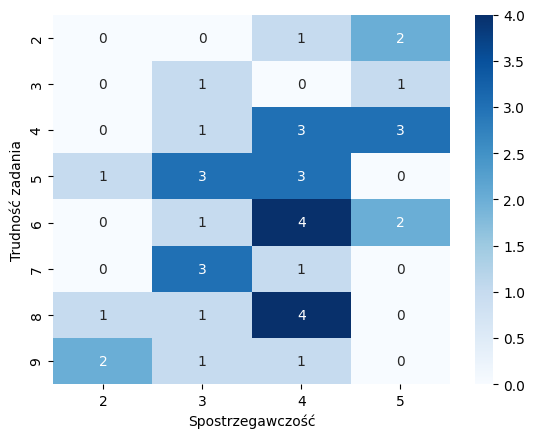

-------------------------------------
Kolekcja wszystkie grafiki:
Spostrzeg  2   3   4   5
diff                    
1          4  13  18  16
2          8  22  36  17
3          4  17  32   9
4          4  13  13   6
5          4   1   3   0
Chi2 test conducted...
Chi-squared test statistic value: 23.88554121779579
P-value: 0.02108246150208451
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


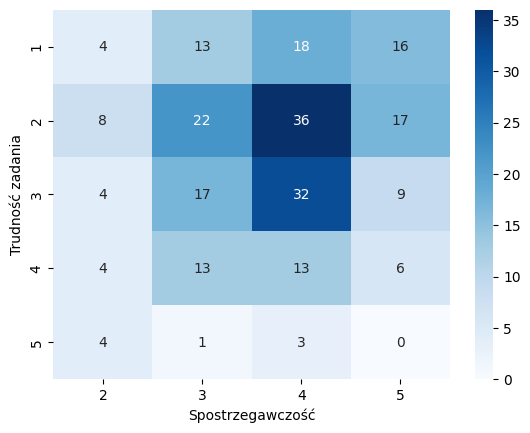

-------------------------------------
Kolekcja grafiki A:
Spostrzeg  2   3   4  5
diff                   
1          2   6   7  7
2          2  11  21  8
3          3  10  16  6
4          2   6   7  3
5          3   0   0  0
Chi2 test conducted...
Chi-squared test statistic value: 31.613260180105105
P-value: 0.001587127735053377
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


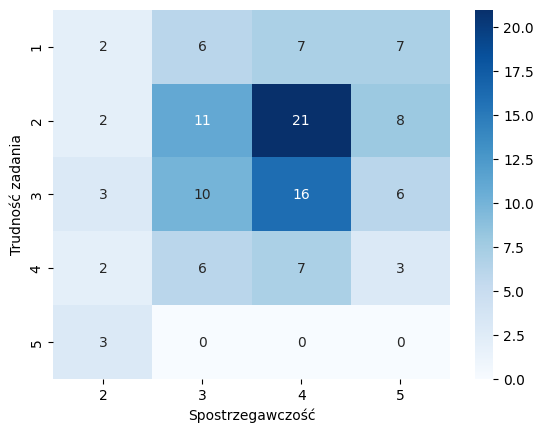

-------------------------------------
Kolekcja grafiki B:
Spostrzeg  2   3   4  5
diff                   
1          2   7  11  9
2          6  11  15  9
3          1   7  16  3
4          2   7   6  3
5          1   1   3  0
Chi2 test conducted...
Chi-squared test statistic value: 10.84459154782709
P-value: 0.5422821536380549
Brak podstaw do odrzucenia H0.


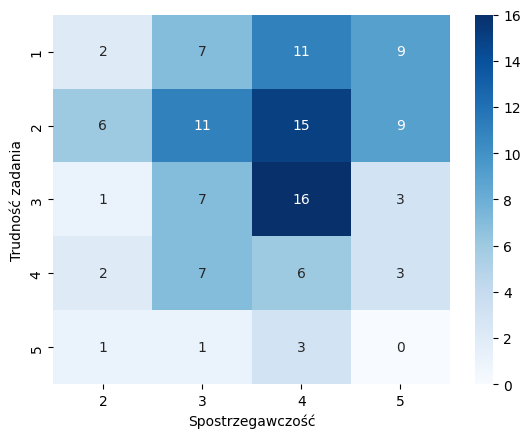

-------------------------------------
Kolekcja grafiki 1:
Spostrzeg  2  3   4  5
diff                  
1          1  5   8  6
2          3  8  16  6
3          3  7   8  3
4          0  2   2  1
5          1  0   0  0
Chi2 test conducted...
Chi-squared test statistic value: 12.937877630390998
P-value: 0.373572147789835
Brak podstaw do odrzucenia H0.


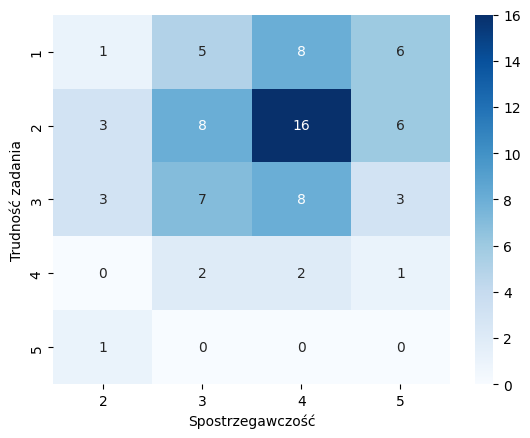

-------------------------------------
Kolekcja grafiki 2:
Spostrzeg  2  3   4  5
diff                  
1          3  7   6  4
2          4  7  14  5
3          0  4  11  3
4          0  4   2  4
5          1  0   1  0
Chi2 test conducted...
Chi-squared test statistic value: 14.94147355912062
P-value: 0.24465272397755738
Brak podstaw do odrzucenia H0.


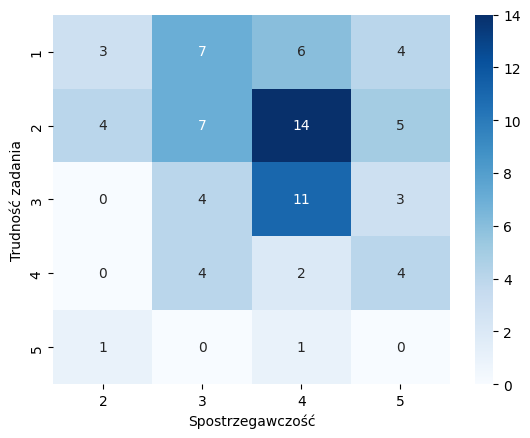

-------------------------------------
Kolekcja grafiki 3:
Spostrzeg  2  3   4  5
diff                  
1          0  1   4  6
2          1  7   6  6
3          1  6  13  3
4          4  7   9  1
5          2  1   2  0
Chi2 test conducted...
Chi-squared test statistic value: 24.160313568474457
P-value: 0.019343325344223908
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


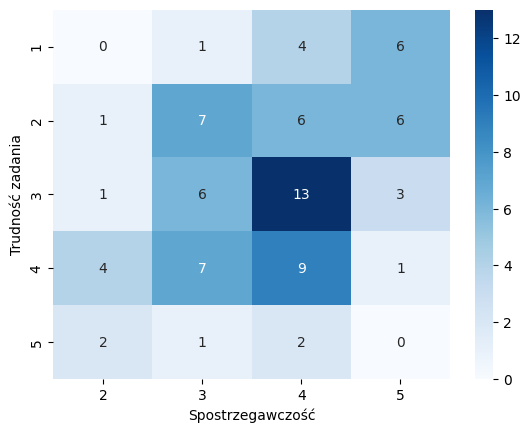

In [37]:
# spostrzegawczość
var = 'Spostrzeg'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Spostrzegawczość', cmap='Blues')

In [38]:
posthocNemenyi_test(df_sum2, 'diff', var, ALPHA)
posthocNemenyi_test(df_collAll, 'diff', var, ALPHA)
posthocNemenyi_test(df_collA, 'diff', var, ALPHA)
posthocNemenyi_test(df_coll3, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+
|    |        4 |        5 |        3 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.147335 | 0.557617 | 0.062119 |
+----+----------+----------+----------+----------+
|  5 | 0.147335 | 1        | 0.830612 | 0.873464 |
+----+----------+----------+----------+----------+
|  3 | 0.557617 | 0.830612 | 1        | 0.451697 |
+----+----------+----------+----------+----------+
|  2 | 0.062119 | 0.873464 | 0.451697 | 1        |
+----+----------+----------+----------+----------+
+----+----------+----------+----------+----------+
|    |        4 |        5 |        3 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 1.9e-05  | 0.000738 | 0        |
+----+----------+----------+----------+----------+
|  5 | 1.9e-05  | 1        | 0.724892 | 0.02349  |
+----+----------+----------+----------+----------+
|  3 | 0.000738 | 0.724892 | 1        | 0.000652 |
+----+----------+----------+---

-------------------------------------
Zsumowane wszystkie grafiki:
Czyt_ze_zroz  1  2  3  4  5
diff                       
9             0  0  0  1  0
10            0  1  1  2  0
11            0  2  0  0  1
12            0  0  1  1  0
13            1  2  0  2  0
14            0  0  2  2  2
15            0  1  0  0  2
16            0  0  0  4  1
17            0  0  1  2  0
18            0  0  1  1  0
19            0  0  0  1  1
20            0  1  0  1  1
22            1  0  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 56.39915966386555
P-value: 0.18971128206013282
Brak podstaw do odrzucenia H0.


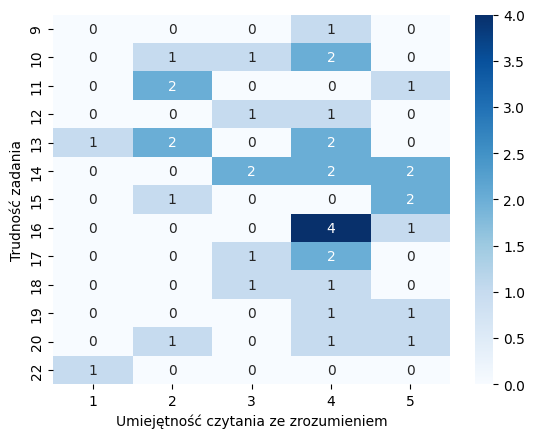

-------------------------------------
Zsumowane grafiki A:
Czyt_ze_zroz  1  2  3  4  5
diff                       
5             1  0  0  1  0
6             0  4  2  5  2
7             0  0  3  1  2
8             0  2  1  7  2
9             0  0  0  0  2
10            0  1  0  1  0
11            0  0  0  2  0
12            1  0  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 52.52388134741076
P-value: 0.0033362750405049888
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


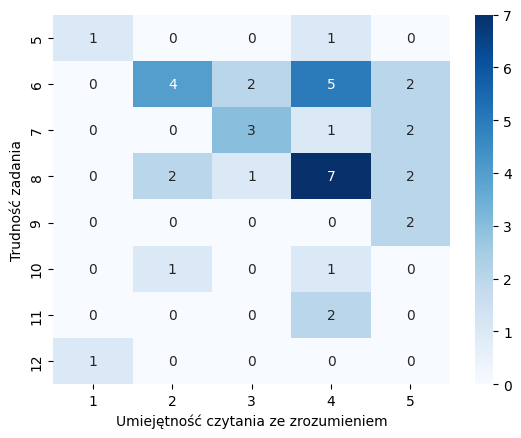

-------------------------------------
Zsumowane grafiki B:
Czyt_ze_zroz  1  2  3  4  5
diff                       
3             0  0  0  1  0
4             0  1  1  2  0
5             0  3  0  1  1
6             0  0  1  1  1
7             0  2  2  3  1
8             1  0  0  7  2
9             0  0  0  1  1
10            1  1  2  0  1
11            0  0  0  0  1
12            0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 31.728174603174605
P-value: 0.6719789793980933
Brak podstaw do odrzucenia H0.


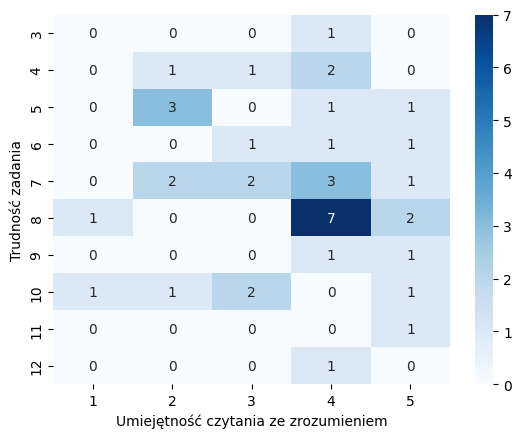

-------------------------------------
Zsumowane grafiki 1:
Czyt_ze_zroz  1  2  3  4  5
diff                       
2             0  1  1  1  1
3             0  3  1  2  1
4             0  0  2  5  1
5             0  2  2  7  4
6             2  1  0  1  0
7             0  0  0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 28.617363612111514
P-value: 0.09557154614366122
Brak podstaw do odrzucenia H0.


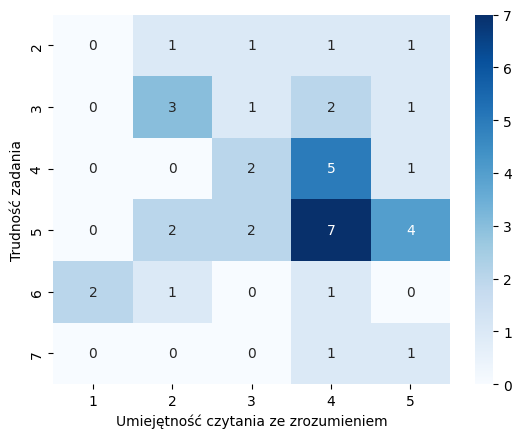

-------------------------------------
Zsumowane grafiki 2:
Czyt_ze_zroz  1  2  3  4  5
diff                       
2             0  1  0  2  0
3             1  1  1  5  0
4             0  2  1  5  4
5             0  1  1  2  1
6             0  2  2  0  1
7             1  0  1  2  1
8             0  0  0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 18.62698412698413
P-value: 0.7715788287590051
Brak podstaw do odrzucenia H0.


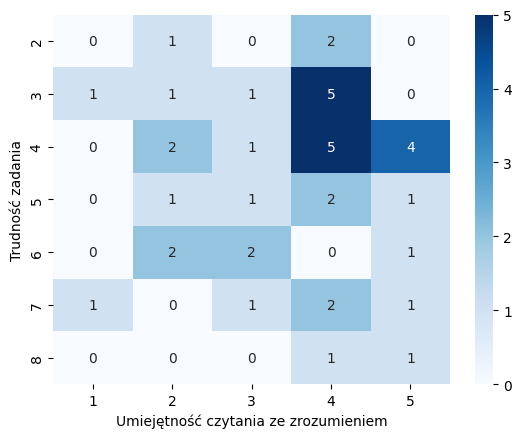

-------------------------------------
Zsumowane grafiki 3:
Czyt_ze_zroz  1  2  3  4  5
diff                       
2             0  1  0  1  1
3             0  1  0  1  0
4             1  1  2  3  0
5             0  1  2  2  2
6             0  1  1  2  3
7             0  1  1  2  0
8             0  0  0  4  2
9             1  1  0  2  0
Chi2 test conducted...
Chi-squared test statistic value: 21.104441776710686
P-value: 0.8209676515774946
Brak podstaw do odrzucenia H0.


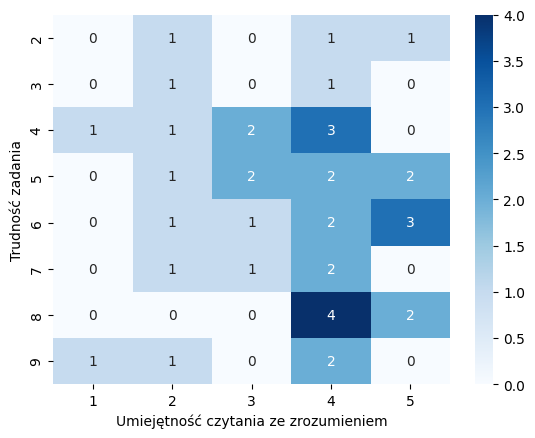

-------------------------------------
Kolekcja wszystkie grafiki:
Czyt_ze_zroz  1   2   3   4   5
diff                           
1             2  12   4  24   9
2             3  17  17  33  13
3             3   6  13  25  15
4             2   6   2  15  11
5             2   1   0   5   0
Chi2 test conducted...
Chi-squared test statistic value: 25.154337409451742
P-value: 0.06715043446769212
Brak podstaw do odrzucenia H0.


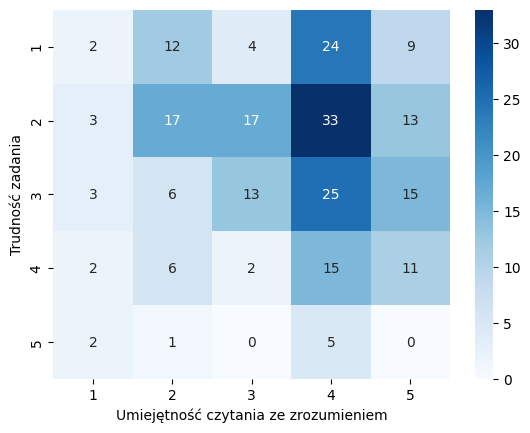

-------------------------------------
Kolekcja grafiki A:
Czyt_ze_zroz  1  2   3   4  5
diff                         
1             1  6   1  10  4
2             2  6  11  15  8
3             1  4   6  16  8
4             1  5   0   8  4
5             1  0   0   2  0
Chi2 test conducted...
Chi-squared test statistic value: 19.183236931136094
P-value: 0.2592757110948161
Brak podstaw do odrzucenia H0.


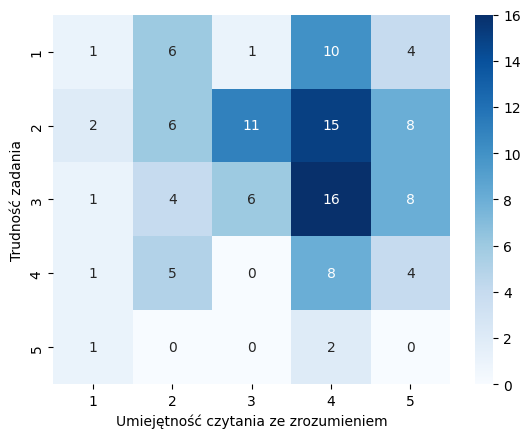

-------------------------------------
Kolekcja grafiki B:
Czyt_ze_zroz  1   2  3   4  5
diff                         
1             1   6  3  14  5
2             1  11  6  18  5
3             2   2  7   9  7
4             1   1  2   7  7
5             1   1  0   3  0
Chi2 test conducted...
Chi-squared test statistic value: 19.259258953869683
P-value: 0.2554483540836182
Brak podstaw do odrzucenia H0.


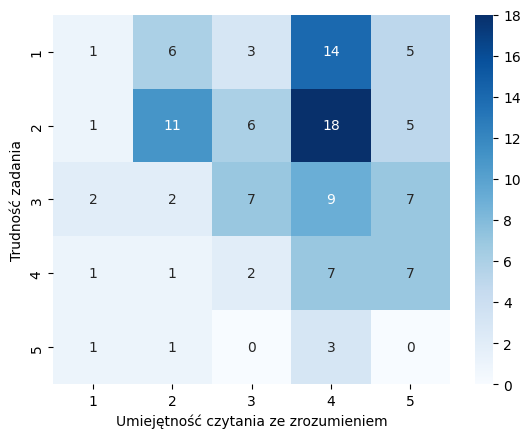

-------------------------------------
Kolekcja grafiki 1:
Czyt_ze_zroz  1  2  3   4  5
diff                        
1             0  6  3   7  4
2             1  5  7  15  5
3             2  1  2  10  6
4             1  2  0   1  1
5             0  0  0   1  0
Chi2 test conducted...
Chi-squared test statistic value: 15.23747680890538
P-value: 0.5073189453671743
Brak podstaw do odrzucenia H0.


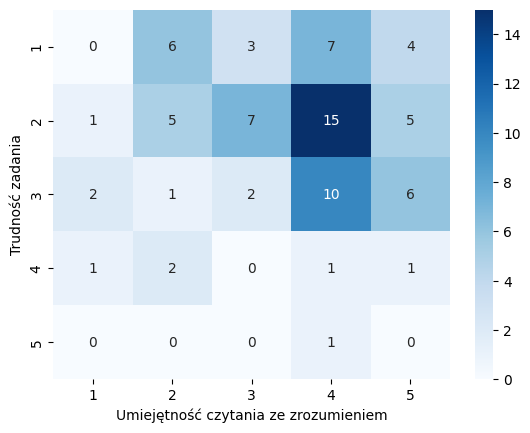

-------------------------------------
Kolekcja grafiki 2:
Czyt_ze_zroz  1  2  3   4  5
diff                        
1             1  3  1  12  3
2             2  8  4  12  4
3             0  1  6   6  5
4             0  2  1   3  4
5             1  0  0   1  0
Chi2 test conducted...
Chi-squared test statistic value: 25.01704014939309
P-value: 0.06952562433397927
Brak podstaw do odrzucenia H0.


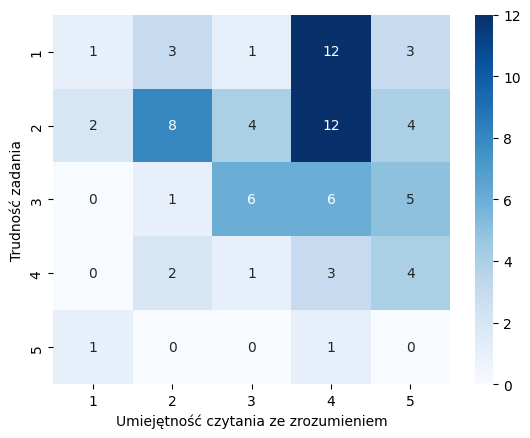

-------------------------------------
Kolekcja grafiki 3:
Czyt_ze_zroz  1  2  3   4  5
diff                        
1             1  3  0   5  2
2             0  4  6   6  4
3             1  4  5   9  4
4             1  2  1  11  6
5             1  1  0   3  0
Chi2 test conducted...
Chi-squared test statistic value: 16.18708721960457
P-value: 0.43998147703664275
Brak podstaw do odrzucenia H0.


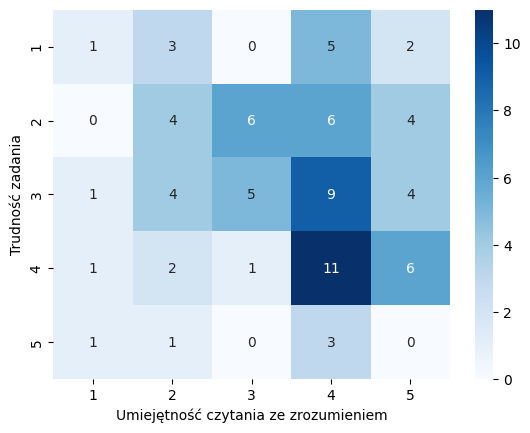

In [39]:
# czytanie ze zrozumieniem
var = 'Czyt_ze_zroz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Umiejętność czytania ze zrozumieniem', cmap='Blues')

In [40]:
posthocNemenyi_test(df_sumA, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        4 |        2 |        3 |        1 |        5 |
+====+==========+==========+==========+==========+==========+
|  4 | 1        | 0.285436 | 0.222155 | 0.118859 | 0.374549 |
+----+----------+----------+----------+----------+----------+
|  2 | 0.285436 | 1        | 0.999652 | 0.805706 | 0.999606 |
+----+----------+----------+----------+----------+----------+
|  3 | 0.222155 | 0.999652 | 1        | 0.879494 | 0.994524 |
+----+----------+----------+----------+----------+----------+
|  1 | 0.118859 | 0.805706 | 0.879494 | 1        | 0.71927  |
+----+----------+----------+----------+----------+----------+
|  5 | 0.374549 | 0.999606 | 0.994524 | 0.71927  | 1        |
+----+----------+----------+----------+----------+----------+


-------------------------------------
Zsumowane wszystkie grafiki:
Wzrokowiec  2  3  4  5
diff                  
9           0  0  0  1
10          0  1  1  2
11          0  2  0  1
12          0  0  2  0
13          0  2  2  1
14          0  1  2  3
15          0  0  2  1
16          0  1  1  3
17          0  0  2  1
18          1  1  0  0
19          0  0  2  0
20          1  1  0  1
22          0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 37.671957671957664
P-value: 0.39264050837491377
Brak podstaw do odrzucenia H0.


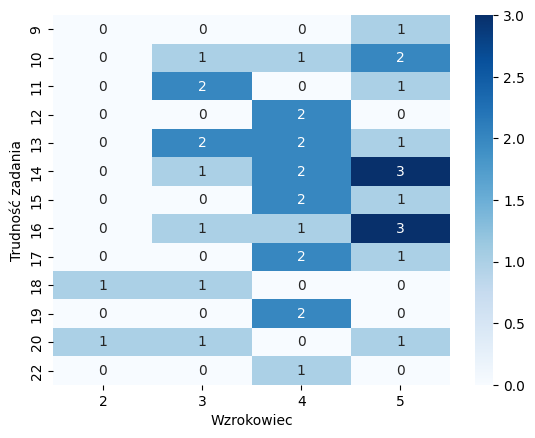

-------------------------------------
Zsumowane grafiki A:
Wzrokowiec  2  3  4  5
diff                  
5           0  0  1  1
6           0  5  2  6
7           0  1  3  2
8           0  2  5  5
9           0  1  1  0
10          1  0  1  0
11          1  0  1  0
12          0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 28.565323565323567
P-value: 0.12483435258959752
Brak podstaw do odrzucenia H0.


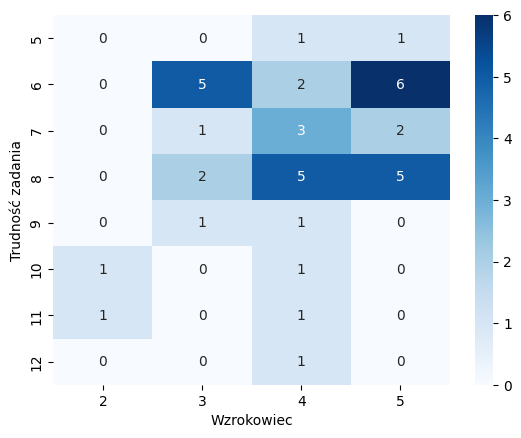

-------------------------------------
Zsumowane grafiki B:
Wzrokowiec  2  3  4  5
diff                  
3           0  0  0  1
4           0  1  1  2
5           0  2  2  1
6           0  0  2  1
7           1  3  3  1
8           0  1  4  5
9           0  0  1  1
10          1  1  2  1
11          0  1  0  0
12          0  0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 18.62857142857143
P-value: 0.8831368166630771
Brak podstaw do odrzucenia H0.


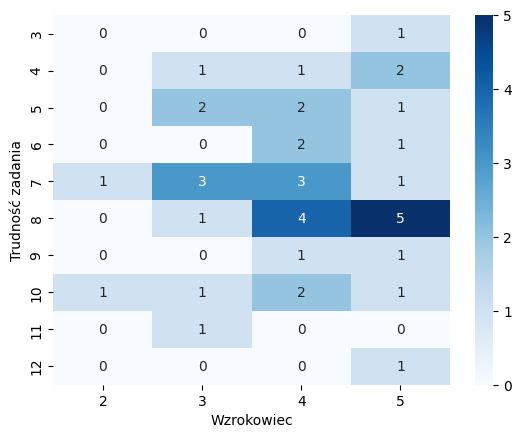

-------------------------------------
Zsumowane grafiki 1:
Wzrokowiec  2  3  4  5
diff                  
2           0  1  2  1
3           0  3  0  4
4           0  1  4  3
5           1  3  6  5
6           0  0  3  1
7           1  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 19.938548752834468
P-value: 0.17430273060449217
Brak podstaw do odrzucenia H0.


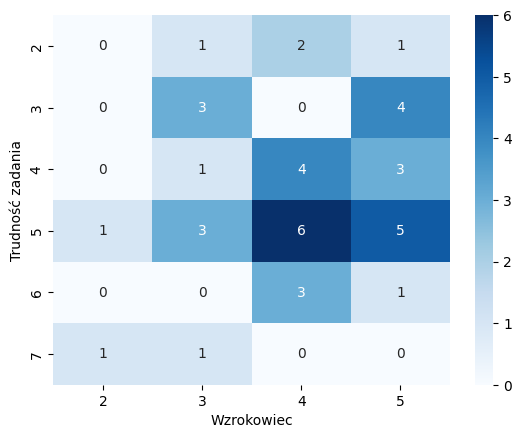

-------------------------------------
Zsumowane grafiki 2:
Wzrokowiec  2  3  4  5
diff                  
2           0  1  2  0
3           1  1  3  3
4           0  5  3  4
5           0  0  1  4
6           1  1  3  0
7           0  1  2  2
8           0  0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 16.81058201058201
P-value: 0.5361624519410125
Brak podstaw do odrzucenia H0.


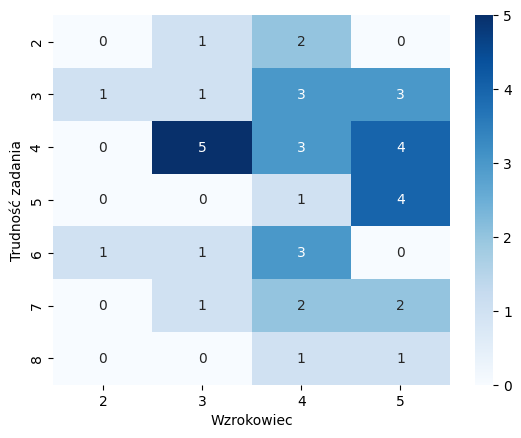

-------------------------------------
Zsumowane grafiki 3:
Wzrokowiec  2  3  4  5
diff                  
2           0  1  0  2
3           0  0  1  1
4           0  1  2  4
5           0  1  4  2
6           0  4  2  1
7           0  1  2  1
8           1  0  3  2
9           1  1  1  1
Chi2 test conducted...
Chi-squared test statistic value: 18.417989417989418
P-value: 0.6224209583766895
Brak podstaw do odrzucenia H0.


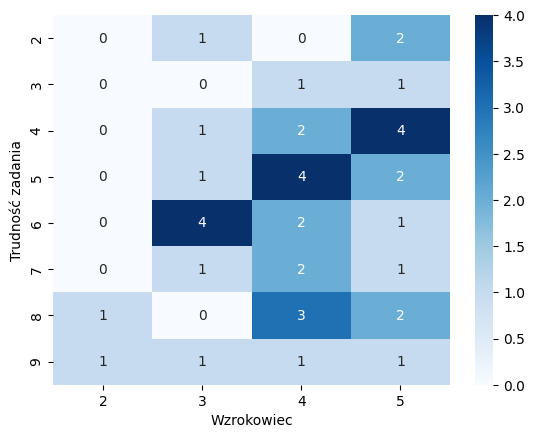

-------------------------------------
Kolekcja wszystkie grafiki:
Wzrokowiec  2   3   4   5
diff                     
1           1  13  17  20
2           4  19  28  32
3           1  14  28  19
4           4   7  14  11
5           2   1   3   2
Chi2 test conducted...
Chi-squared test statistic value: 15.037529151373525
P-value: 0.23939049902642293
Brak podstaw do odrzucenia H0.


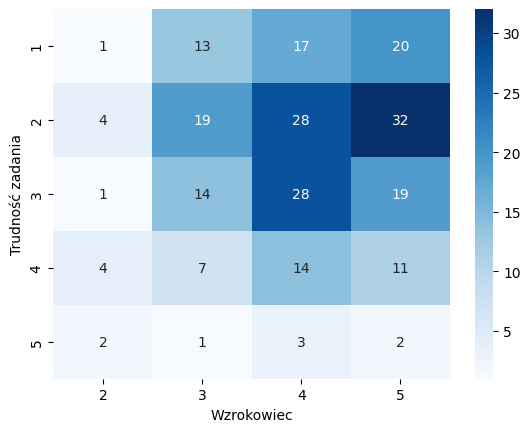

-------------------------------------
Kolekcja grafiki A:
Wzrokowiec  2   3   4   5
diff                     
1           0   6   8   8
2           2  10  10  20
3           0   8  17  10
4           3   3   9   3
5           1   0   1   1
Chi2 test conducted...
Chi-squared test statistic value: 21.856881742596034
P-value: 0.03915548422551706
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


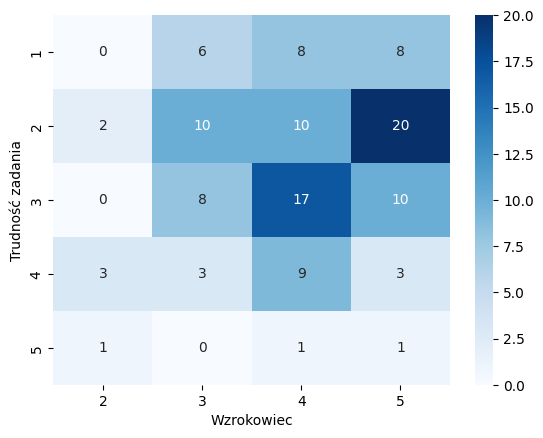

-------------------------------------
Kolekcja grafiki B:
Wzrokowiec  2  3   4   5
diff                    
1           1  7   9  12
2           2  9  18  12
3           1  6  11   9
4           1  4   5   8
5           1  1   2   1
Chi2 test conducted...
Chi-squared test statistic value: 5.3809485243183035
P-value: 0.9440307211536252
Brak podstaw do odrzucenia H0.


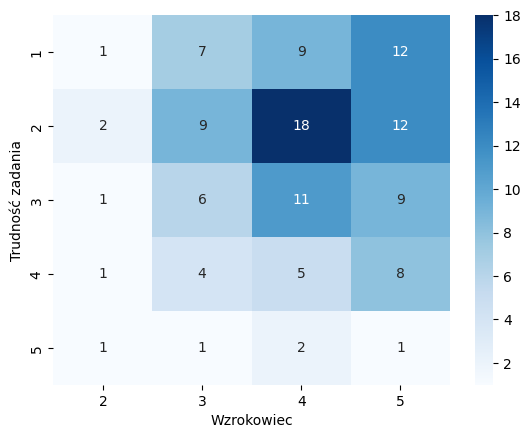

-------------------------------------
Kolekcja grafiki 1:
Wzrokowiec  2  3   4   5
diff                    
1           0  6   7   7
2           2  7  10  14
3           1  3  11   6
4           0  2   2   1
5           1  0   0   0
Chi2 test conducted...
Chi-squared test statistic value: 24.98790627362056
P-value: 0.01488028702721618
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


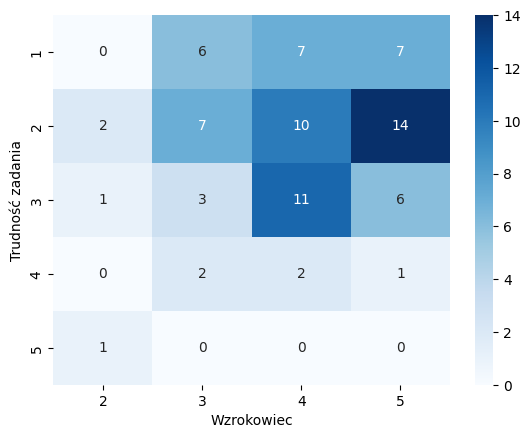

-------------------------------------
Kolekcja grafiki 2:
Wzrokowiec  2  3   4   5
diff                    
1           1  5   8   6
2           2  7  11  10
3           0  5   5   8
4           1  1   5   3
5           0  0   1   1
Chi2 test conducted...
Chi-squared test statistic value: 4.916754850088183
P-value: 0.9607016916926102
Brak podstaw do odrzucenia H0.


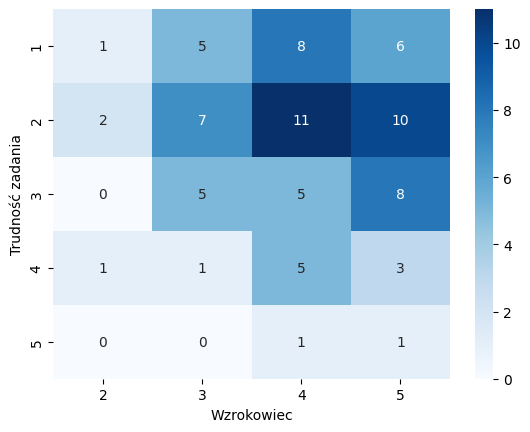

-------------------------------------
Kolekcja grafiki 3:
Wzrokowiec  2  3   4  5
diff                   
1           0  2   2  7
2           0  5   7  8
3           0  6  12  5
4           3  4   7  7
5           1  1   2  1
Chi2 test conducted...
Chi-squared test statistic value: 15.742852960244266
P-value: 0.20329977047966633
Brak podstaw do odrzucenia H0.


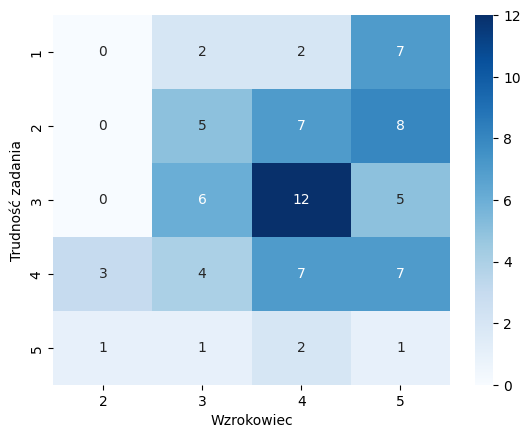

In [41]:
# wzrokowiec
var = 'Wzrokowiec'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Wzrokowiec', cmap='Blues')

In [42]:
posthocNemenyi_test(df_collA, 'diff', var, ALPHA)
print()
posthocNemenyi_test(df_coll1, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.012315 | 0.931136 | 0.000815 |
+----+----------+----------+----------+----------+
|  3 | 0.012315 | 1        | 0.066615 | 0.199837 |
+----+----------+----------+----------+----------+
|  5 | 0.931136 | 0.066615 | 1        | 0.002901 |
+----+----------+----------+----------+----------+
|  2 | 0.000815 | 0.199837 | 0.002901 | 1        |
+----+----------+----------+----------+----------+

+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.124301 | 0.995035 | 0.014183 |
+----+----------+----------+----------+----------+
|  3 | 0.124301 | 1        | 0.080084 | 0.336111 |
+----+----------+----------+----------+----------+
|  5 | 0.995035 | 0.080084 | 1        | 0.009898 |
+----+----------+----------+--

-------------------------------------
Zsumowane wszystkie grafiki:
Słuchowiec  1  2  3  4  5
diff                     
9           0  0  1  0  0
10          0  1  2  1  0
11          1  0  0  2  0
12          0  1  1  0  0
13          0  1  3  1  0
14          0  1  2  1  2
15          0  0  2  0  1
16          2  2  0  1  0
17          0  1  1  0  1
18          0  0  1  1  0
19          1  1  0  0  0
20          0  0  1  0  2
22          0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 45.58174603174603
P-value: 0.5724777802474877
Brak podstaw do odrzucenia H0.


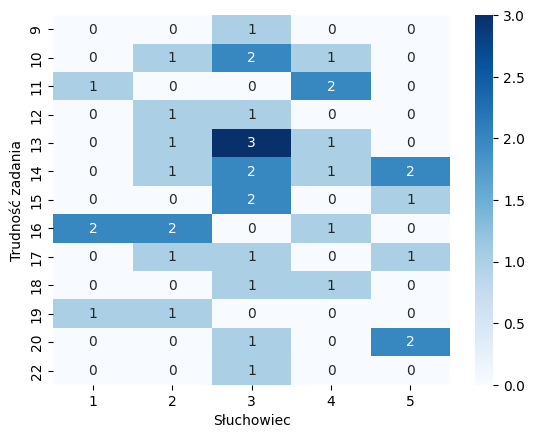

-------------------------------------
Zsumowane grafiki A:
Słuchowiec  1  2  3  4  5
diff                     
5           0  1  0  1  0
6           1  2  6  3  1
7           0  2  2  0  2
8           2  2  5  2  1
9           0  1  0  0  1
10          0  0  1  0  1
11          1  0  0  1  0
12          0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 23.113553113553117
P-value: 0.7273366225200715
Brak podstaw do odrzucenia H0.


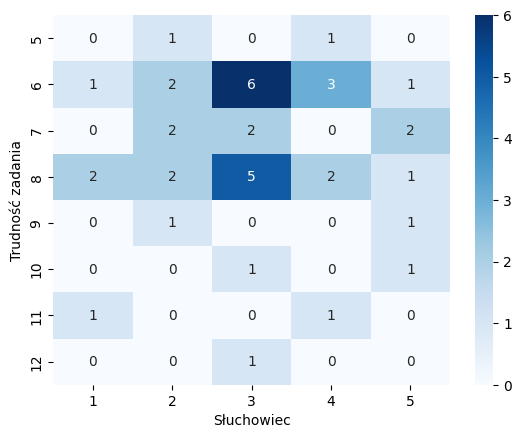

-------------------------------------
Zsumowane grafiki B:
Słuchowiec  1  2  3  4  5
diff                     
3           0  0  1  0  0
4           0  1  2  1  0
5           1  0  2  2  0
6           0  1  1  1  0
7           0  1  5  1  1
8           3  3  0  2  2
9           0  0  1  0  1
10          0  2  2  0  1
11          0  0  0  0  1
12          0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 31.601984126984124
P-value: 0.677804019298158
Brak podstaw do odrzucenia H0.


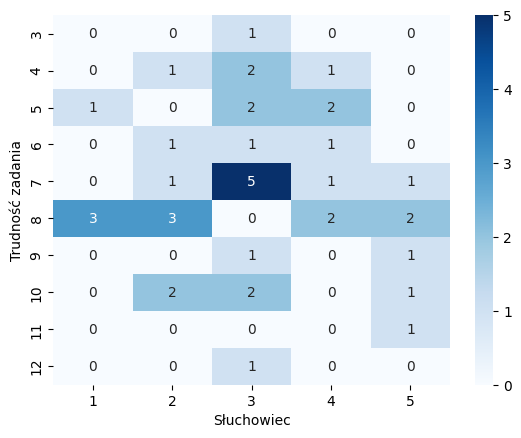

-------------------------------------
Zsumowane grafiki 1:
Słuchowiec  1  2  3  4  5
diff                     
2           0  1  1  2  0
3           1  1  4  1  0
4           1  2  2  2  1
5           2  3  5  1  4
6           0  1  3  0  0
7           0  0  0  1  1
Chi2 test conducted...
Chi-squared test statistic value: 16.50283446712018
P-value: 0.6849803481766676
Brak podstaw do odrzucenia H0.


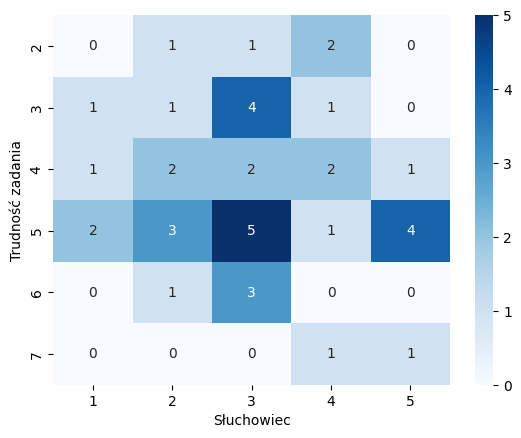

-------------------------------------
Zsumowane grafiki 2:
Słuchowiec  1  2  3  4  5
diff                     
2           1  0  2  0  0
3           0  3  2  3  0
4           1  0  5  4  2
5           1  2  1  0  1
6           0  2  2  0  1
7           1  1  2  0  1
8           0  0  1  0  1
Chi2 test conducted...
Chi-squared test statistic value: 22.972619047619045
P-value: 0.5214149843487108
Brak podstaw do odrzucenia H0.


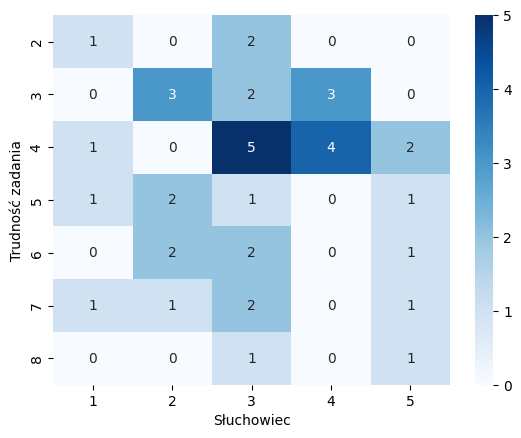

-------------------------------------
Zsumowane grafiki 3:
Słuchowiec  1  2  3  4  5
diff                     
2           0  1  2  0  0
3           1  0  1  0  0
4           0  2  1  2  2
5           0  2  3  2  0
6           0  0  4  0  3
7           1  0  2  1  0
8           1  2  1  2  0
9           1  1  1  0  1
Chi2 test conducted...
Chi-squared test statistic value: 28.018707482993197
P-value: 0.4634565018776005
Brak podstaw do odrzucenia H0.


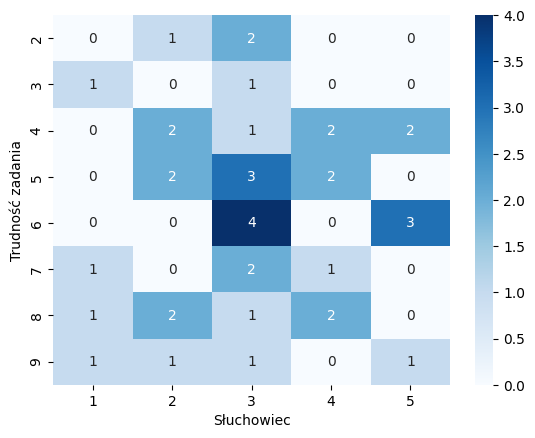

-------------------------------------
Kolekcja wszystkie grafiki:
Słuchowiec  1   2   3   4   5
diff                         
1           5  10  22  11   3
2           7  18  29  18  11
3           6  10  24   8  14
4           5   9  12   3   7
5           1   1   3   2   1
Chi2 test conducted...
Chi-squared test statistic value: 12.762256776874066
P-value: 0.6900548403644278
Brak podstaw do odrzucenia H0.


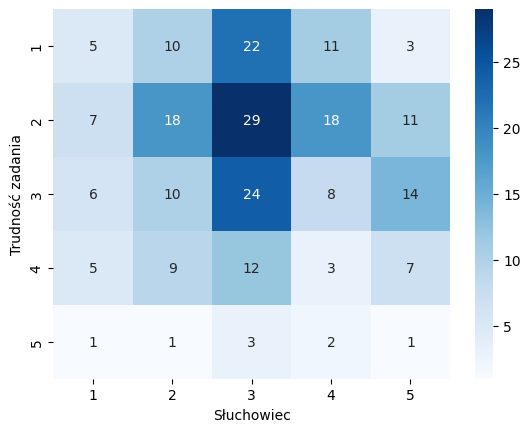

-------------------------------------
Kolekcja grafiki A:
Słuchowiec  1   2   3   4  5
diff                        
1           2   5   9   3  3
2           2  11  13  11  5
3           5   4  16   4  6
4           3   3   6   2  4
5           0   1   1   1  0
Chi2 test conducted...
Chi-squared test statistic value: 11.793396550539406
P-value: 0.758075401248926
Brak podstaw do odrzucenia H0.


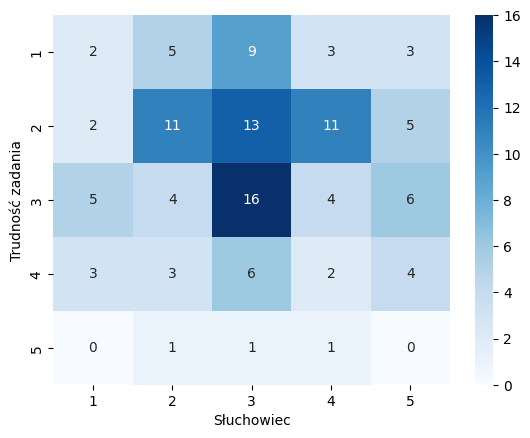

-------------------------------------
Kolekcja grafiki B:
Słuchowiec  1  2   3  4  5
diff                      
1           3  5  13  8  0
2           5  7  16  7  6
3           1  6   8  4  8
4           2  6   6  1  3
5           1  0   2  1  1
Chi2 test conducted...
Chi-squared test statistic value: 17.333974721246936
P-value: 0.3643104678263549
Brak podstaw do odrzucenia H0.


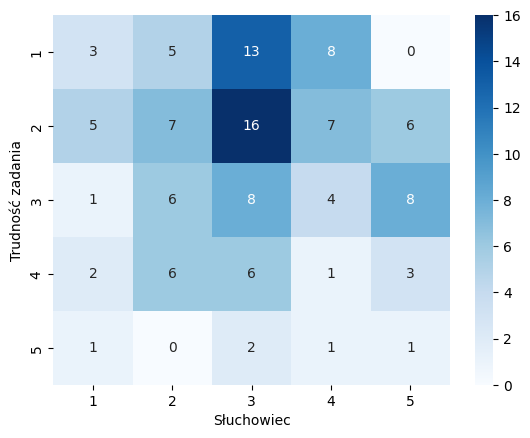

-------------------------------------
Kolekcja grafiki 1:
Słuchowiec  1  2   3  4  5
diff                      
1           2  4   8  6  0
2           3  8  11  5  6
3           3  2   9  2  5
4           0  2   2  0  1
5           0  0   0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 16.35250463821892
P-value: 0.4286409432874953
Brak podstaw do odrzucenia H0.


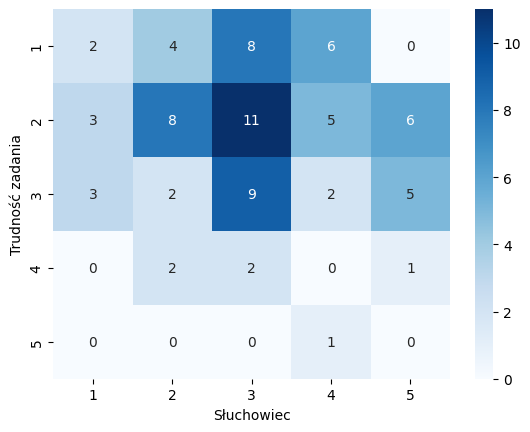

-------------------------------------
Kolekcja grafiki 2:
Słuchowiec  1  2   3  4  5
diff                      
1           2  3   9  5  1
2           3  6  10  7  4
3           2  5   6  2  3
4           1  2   3  0  4
5           0  0   2  0  0
Chi2 test conducted...
Chi-squared test statistic value: 13.807142857142857
P-value: 0.6130787582670008
Brak podstaw do odrzucenia H0.


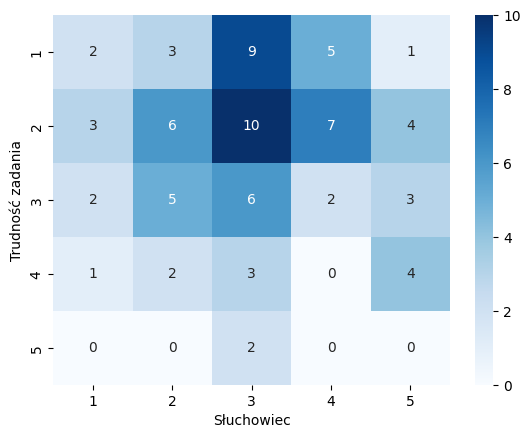

-------------------------------------
Kolekcja grafiki 3:
Słuchowiec  1  2  3  4  5
diff                     
1           1  3  5  0  2
2           1  4  8  6  1
3           1  3  9  4  6
4           4  5  7  3  2
5           1  1  1  1  1
Chi2 test conducted...
Chi-squared test statistic value: 12.851771485932977
P-value: 0.6835633343065691
Brak podstaw do odrzucenia H0.


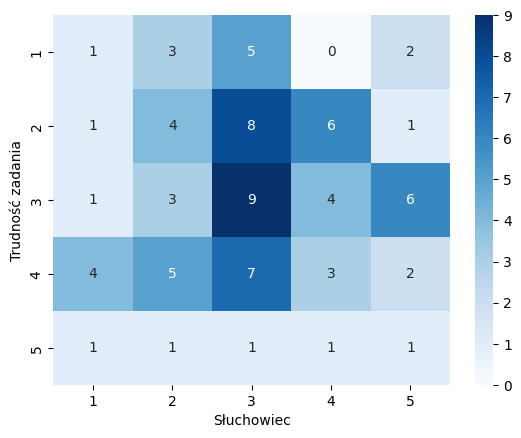

In [44]:
# słuchowiec
var = 'Słuchowiec'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Słuchowiec', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Kinestetyk  1  2  3  4  5
diff                     
9           0  0  0  1  0
10          1  2  0  1  0
11          0  1  0  2  0
12          1  0  0  1  0
13          1  1  1  2  0
14          2  4  0  0  0
15          0  3  0  0  0
16          2  3  0  0  0
17          0  2  0  1  0
18          1  0  0  1  0
19          0  0  1  0  1
20          1  0  1  1  0
22          0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 55.08888888888889
P-value: 0.2242299628611607
Brak podstaw do odrzucenia H0.


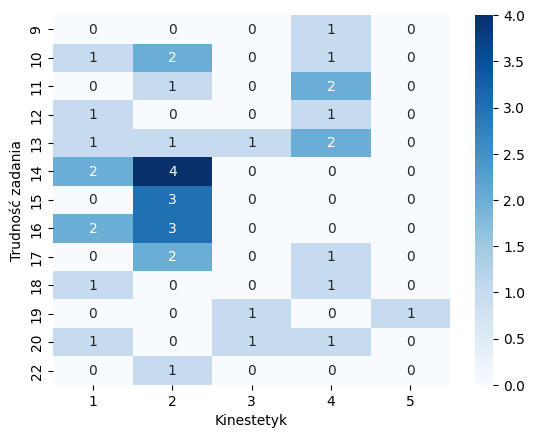

-------------------------------------
Zsumowane grafiki A:
Kinestetyk  1  2  3  4  5
diff                     
5           0  0  0  2  0
6           1  6  1  5  0
7           1  4  0  1  0
8           6  5  0  1  0
9           1  0  1  0  0
10          0  1  1  0  0
11          0  0  0  1  1
12          0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 50.91117814647225
P-value: 0.005108429817012458
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


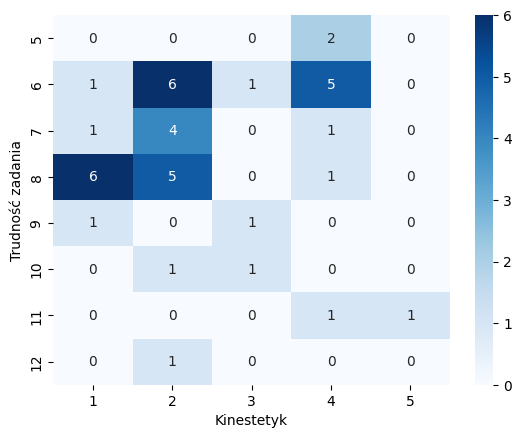

-------------------------------------
Zsumowane grafiki B:
Kinestetyk  1  2  3  4  5
diff                     
3           0  0  0  1  0
4           1  2  0  1  0
5           2  1  0  2  0
6           2  0  0  1  0
7           0  6  1  1  0
8           2  5  0  2  1
9           0  2  0  0  0
10          1  1  2  1  0
11          1  0  0  0  0
12          0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 34.940958605664484
P-value: 0.5188197686357576
Brak podstaw do odrzucenia H0.


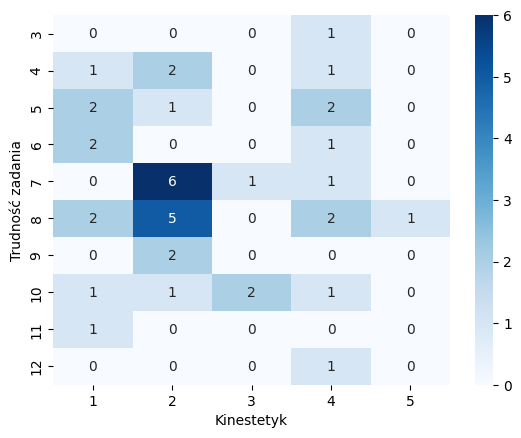

-------------------------------------
Zsumowane grafiki 1:
Kinestetyk  1  2  3  4  5
diff                     
2           1  1  0  2  0
3           0  4  1  2  0
4           4  2  0  1  1
5           3  7  2  3  0
6           0  3  0  1  0
7           1  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 17.658169934640522
P-value: 0.6099149709661192
Brak podstaw do odrzucenia H0.


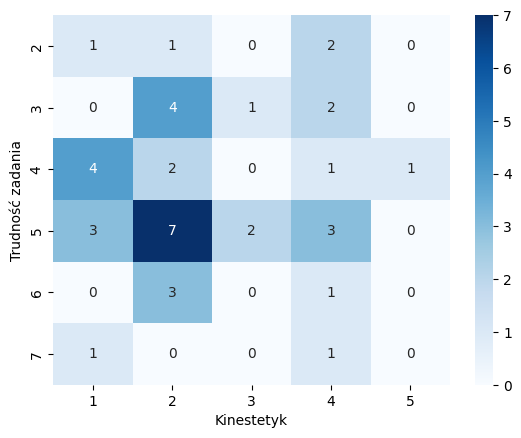

-------------------------------------
Zsumowane grafiki 2:
Kinestetyk  1  2  3  4  5
diff                     
2           1  2  0  0  0
3           3  2  0  3  0
4           1  7  1  3  0
5           0  4  0  1  0
6           2  0  2  1  0
7           1  1  0  2  1
8           1  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 28.69433551198257
P-value: 0.23184695865963403
Brak podstaw do odrzucenia H0.


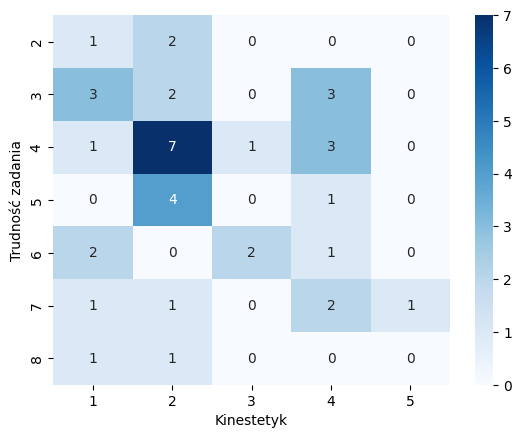

-------------------------------------
Zsumowane grafiki 3:
Kinestetyk  1  2  3  4  5
diff                     
2           1  0  0  2  0
3           1  0  0  1  0
4           0  5  0  2  0
5           2  2  0  3  0
6           1  5  1  0  0
7           3  1  0  0  0
8           0  2  1  2  1
9           1  2  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 32.20603797074385
P-value: 0.2662074725684855
Brak podstaw do odrzucenia H0.


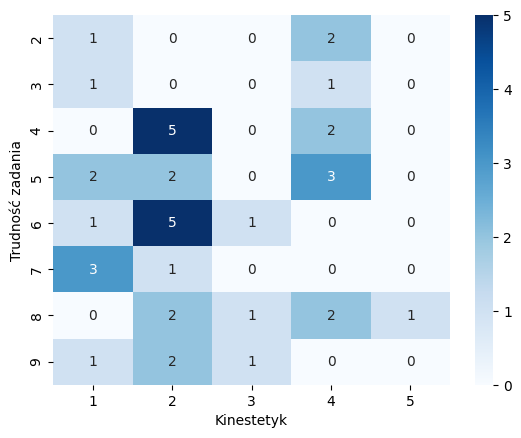

-------------------------------------
Kolekcja wszystkie grafiki:
Kinestetyk   1   2  3   4  5
diff                        
1           12  17  2  19  1
2           17  41  6  19  0
3           14  30  3  13  2
4           10  10  6   7  3
5            1   4  1   2  0
Chi2 test conducted...
Chi-squared test statistic value: 22.548887799423145
P-value: 0.1263361668250894
Brak podstaw do odrzucenia H0.


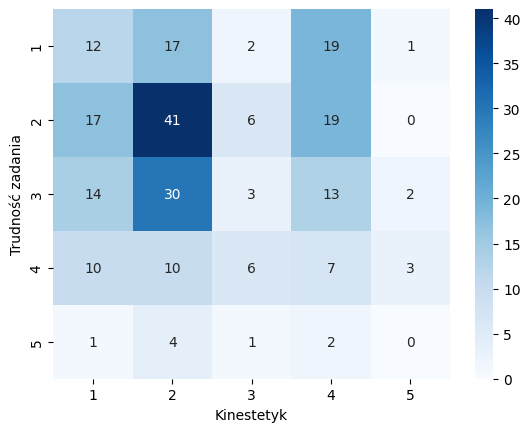

-------------------------------------
Kolekcja grafiki A:
Kinestetyk   1   2  3   4  5
diff                        
1            5   8  1   8  0
2            7  19  3  13  0
3           10  17  2   5  1
4            4   6  3   3  2
5            1   1  0   1  0
Chi2 test conducted...
Chi-squared test statistic value: 15.96148223599204
P-value: 0.45565231023229946
Brak podstaw do odrzucenia H0.


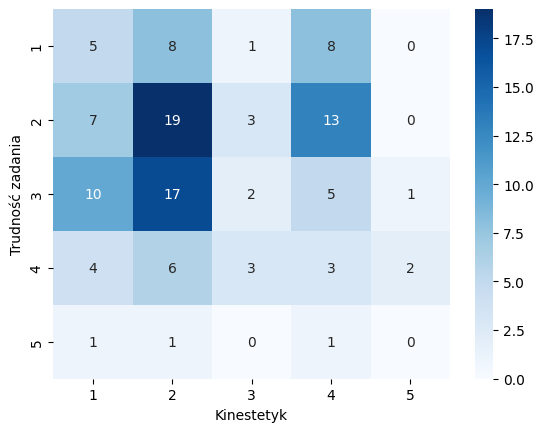

-------------------------------------
Kolekcja grafiki B:
Kinestetyk   1   2  3   4  5
diff                        
1            7   9  1  11  1
2           10  22  3   6  0
3            4  13  1   8  1
4            6   4  3   4  1
5            0   3  1   1  0
Chi2 test conducted...
Chi-squared test statistic value: 17.610639935713458
P-value: 0.3471845261111756
Brak podstaw do odrzucenia H0.


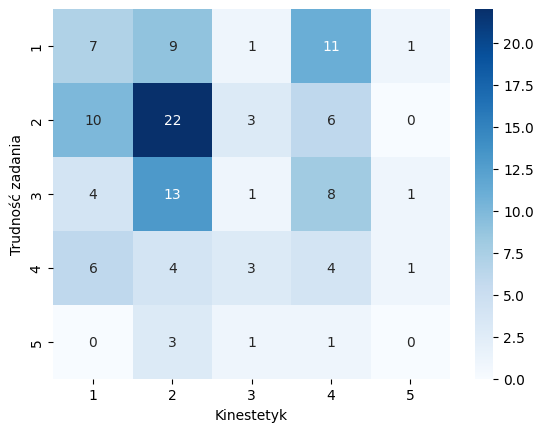

-------------------------------------
Kolekcja grafiki 1:
Kinestetyk  1   2  3  4  5
diff                      
1           4   6  1  8  1
2           7  17  3  6  0
3           6   9  2  3  1
4           1   2  0  2  0
5           0   0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 11.287553405200464
P-value: 0.7913979428444209
Brak podstaw do odrzucenia H0.


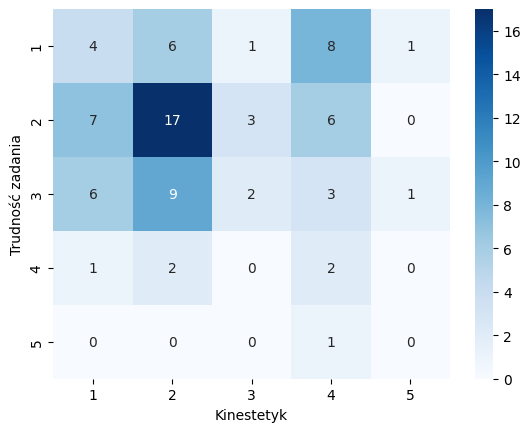

-------------------------------------
Kolekcja grafiki 2:
Kinestetyk  1   2  3  4  5
diff                      
1           5   9  1  5  0
2           6  15  2  7  0
3           3   7  1  6  1
4           4   2  2  1  1
5           0   1  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 12.595642701525055
P-value: 0.7020610157432321
Brak podstaw do odrzucenia H0.


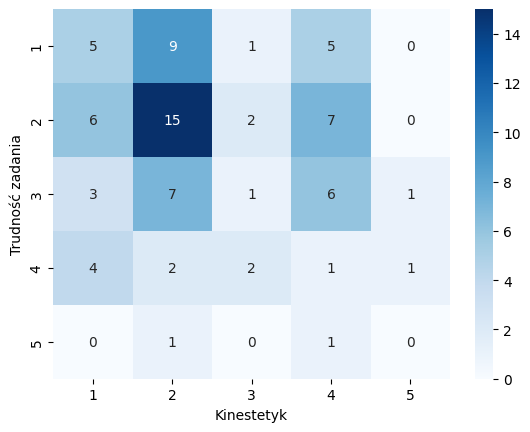

-------------------------------------
Kolekcja grafiki 3:
Kinestetyk  1   2  3  4  5
diff                      
1           3   2  0  6  0
2           4   9  1  6  0
3           5  14  0  4  0
4           5   6  4  4  2
5           1   3  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 24.14006438763472
P-value: 0.08648965810218275
Brak podstaw do odrzucenia H0.


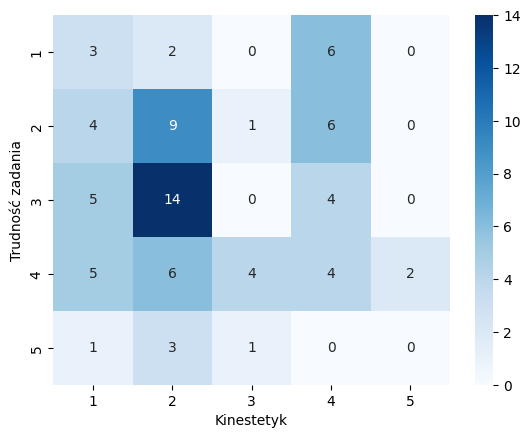

In [45]:
# kinestetyk
var = 'Kinestetyk'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', var, cmap='Blues')

In [46]:
posthocNemenyi_test(df_sumA, 'diff', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        5 |        3 |        4 |        2 |        1 |
+====+==========+==========+==========+==========+==========+
|  5 | 1        | 0.999434 | 0.768506 | 0.402165 | 0.730582 |
+----+----------+----------+----------+----------+----------+
|  3 | 0.999434 | 1        | 0.580513 | 0.093959 | 0.518516 |
+----+----------+----------+----------+----------+----------+
|  4 | 0.768506 | 0.580513 | 1        | 0.61662  | 0.999851 |
+----+----------+----------+----------+----------+----------+
|  2 | 0.402165 | 0.093959 | 0.61662  | 1        | 0.759149 |
+----+----------+----------+----------+----------+----------+
|  1 | 0.730582 | 0.518516 | 0.999851 | 0.759149 | 1        |
+----+----------+----------+----------+----------+----------+


-------------------------------------
Zsumowane wszystkie grafiki:
MAT   NO_VAL  VAL
diff             
9          0    1
10         2    2
11         1    2
12         1    1
13         2    3
14         3    3
15         1    2
16         3    2
17         3    0
18         0    2
19         0    2
20         1    2
22         1    0
Chi2 test conducted...
Chi-squared test statistic value: 10.101010101010102
P-value: 0.6070994161148735
Brak podstaw do odrzucenia H0.


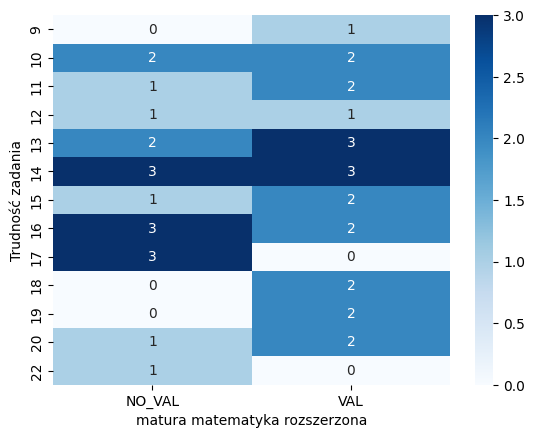

-------------------------------------
Zsumowane grafiki A:
MAT   NO_VAL  VAL
diff             
5          1    1
6          5    8
7          4    2
8          5    7
9          1    1
10         1    1
11         0    2
12         1    0
Chi2 test conducted...
Chi-squared test statistic value: 4.335664335664335
P-value: 0.7404048894011153
Brak podstaw do odrzucenia H0.


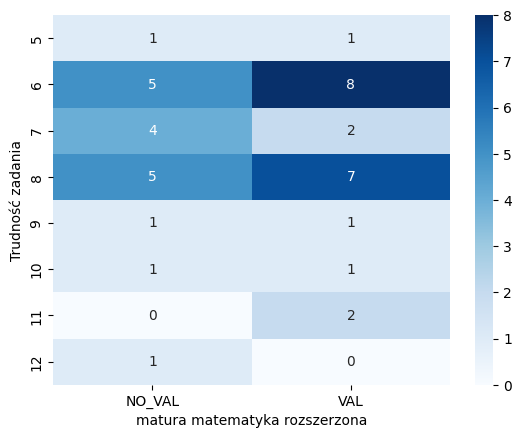

-------------------------------------
Zsumowane grafiki B:
MAT   NO_VAL  VAL
diff             
3          0    1
4          2    2
5          2    3
6          0    3
7          5    3
8          5    5
9          1    1
10         2    3
11         1    0
12         0    1
Chi2 test conducted...
Chi-squared test statistic value: 6.565656565656567
P-value: 0.6822385269663465
Brak podstaw do odrzucenia H0.


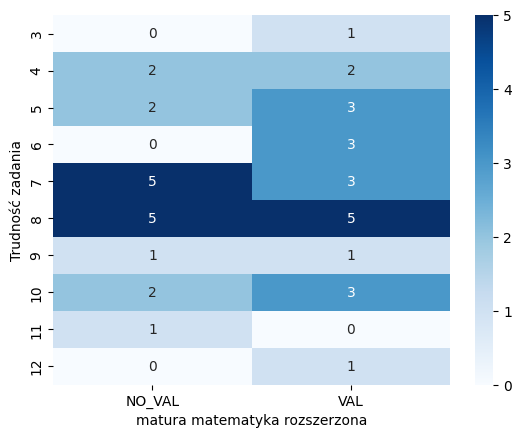

-------------------------------------
Zsumowane grafiki 1:
MAT   NO_VAL  VAL
diff             
2          1    3
3          4    3
4          4    4
5          5   10
6          3    1
7          1    1
Chi2 test conducted...
Chi-squared test statistic value: 3.4439634439634443
P-value: 0.6318831157872306
Brak podstaw do odrzucenia H0.


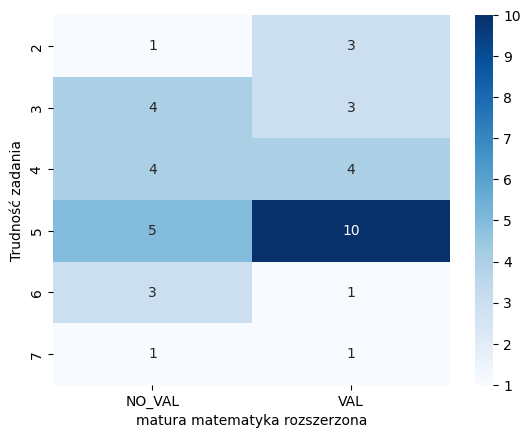

-------------------------------------
Zsumowane grafiki 2:
MAT   NO_VAL  VAL
diff             
2          1    2
3          4    4
4          4    8
5          5    0
6          0    5
7          3    2
8          1    1
Chi2 test conducted...
Chi-squared test statistic value: 11.582491582491583
P-value: 0.07195791831853894
Brak podstaw do odrzucenia H0.


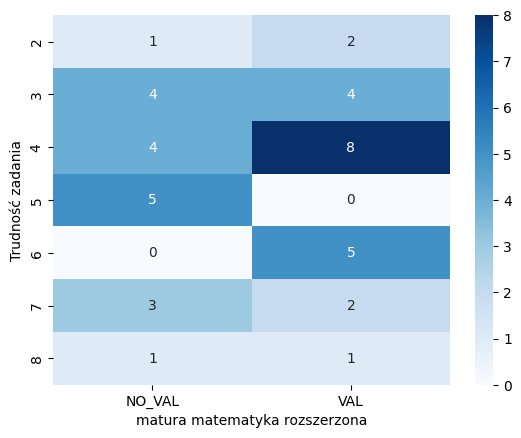

-------------------------------------
Zsumowane grafiki 3:
MAT   NO_VAL  VAL
diff             
2          0    3
3          1    1
4          4    3
5          5    2
6          3    4
7          1    3
8          2    4
9          2    2
Chi2 test conducted...
Chi-squared test statistic value: 5.897065897065898
P-value: 0.5518186737915561
Brak podstaw do odrzucenia H0.


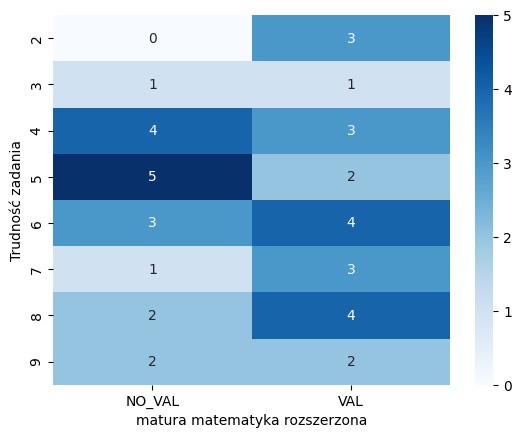

-------------------------------------
Kolekcja wszystkie grafiki:
MAT   NO_VAL  VAL
diff             
1         18   33
2         42   41
3         31   31
4         13   23
5          4    4
Chi2 test conducted...
Chi-squared test statistic value: 4.850091592354762
P-value: 0.3030277318492505
Brak podstaw do odrzucenia H0.


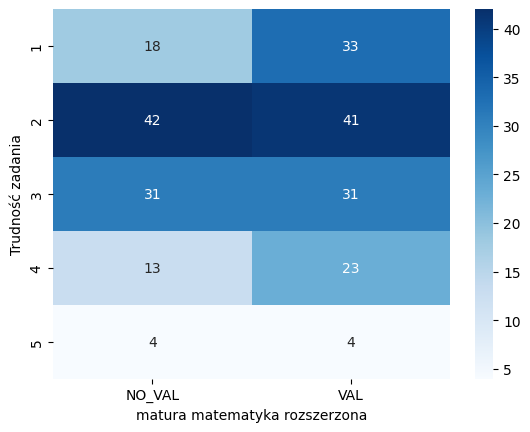

-------------------------------------
Kolekcja grafiki A:
MAT   NO_VAL  VAL
diff             
1          9   13
2         20   22
3         17   18
4          6   12
5          2    1
Chi2 test conducted...
Chi-squared test statistic value: 2.0044601862783678
P-value: 0.7349384776043462
Brak podstaw do odrzucenia H0.


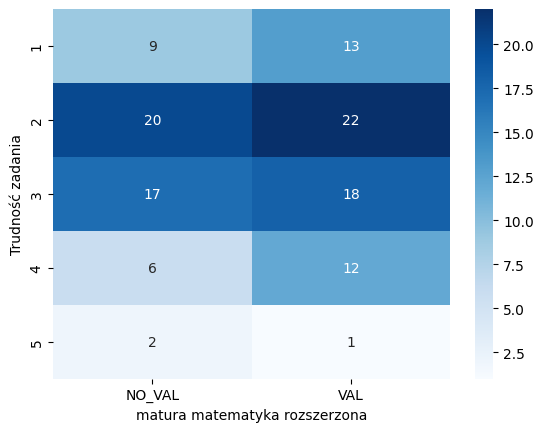

-------------------------------------
Kolekcja grafiki B:
MAT   NO_VAL  VAL
diff             
1          9   20
2         22   19
3         14   13
4          7   11
5          2    3
Chi2 test conducted...
Chi-squared test statistic value: 4.361466579950835
P-value: 0.3592913982556035
Brak podstaw do odrzucenia H0.


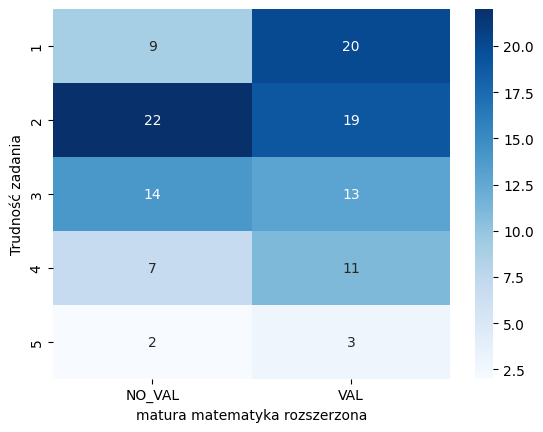

-------------------------------------
Kolekcja grafiki 1:
MAT   NO_VAL  VAL
diff             
1          8   12
2         15   18
3         10   11
4          3    2
5          0    1
Chi2 test conducted...
Chi-squared test statistic value: 1.535703353885172
P-value: 0.8202988044915919
Brak podstaw do odrzucenia H0.


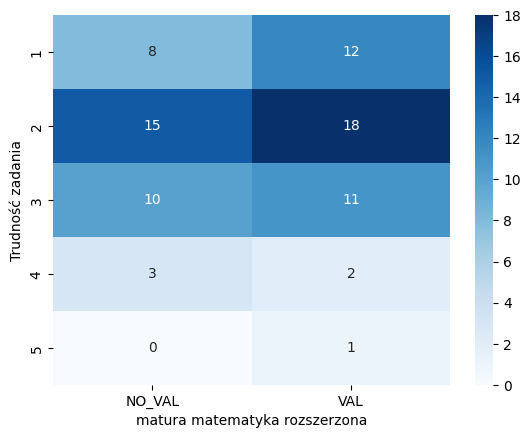

-------------------------------------
Kolekcja grafiki 2:
MAT   NO_VAL  VAL
diff             
1          7   13
2         16   14
3          8   10
4          4    6
5          1    1
Chi2 test conducted...
Chi-squared test statistic value: 1.7732884399551063
P-value: 0.7773655981091726
Brak podstaw do odrzucenia H0.


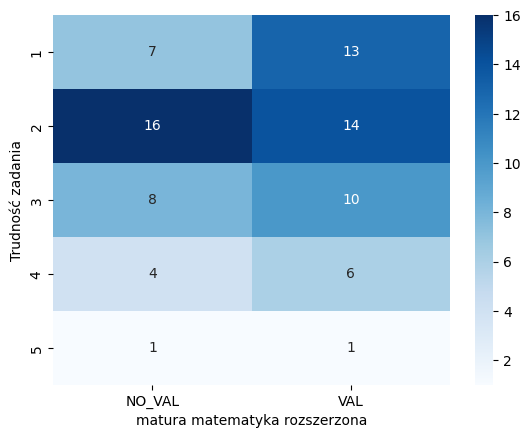

-------------------------------------
Kolekcja grafiki 3:
MAT   NO_VAL  VAL
diff             
1          3    8
2         11    9
3         13   10
4          6   15
5          3    2
Chi2 test conducted...
Chi-squared test statistic value: 6.18300452292547
P-value: 0.18589188127351042
Brak podstaw do odrzucenia H0.


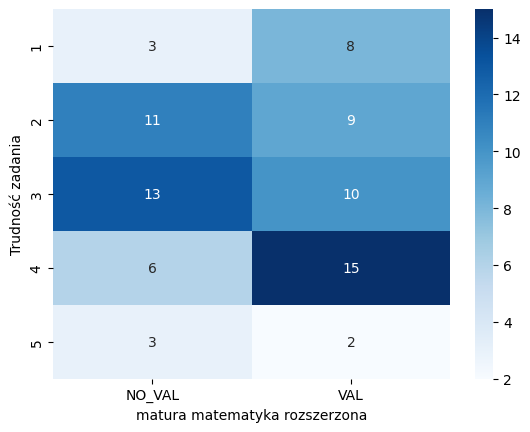

In [47]:
# MAT - pisał / nie pisał matury rozszerzonej
var = 'MAT'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'matura matematyka rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
POL   NO_VAL  VAL
diff             
9          1    0
10         3    1
11         3    0
12         2    0
13         4    1
14         3    3
15         3    0
16         4    1
17         3    0
18         2    0
19         1    1
20         2    1
22         0    1
Chi2 test conducted...
Chi-squared test statistic value: 11.23058542413381
P-value: 0.5092677392911555
Brak podstaw do odrzucenia H0.


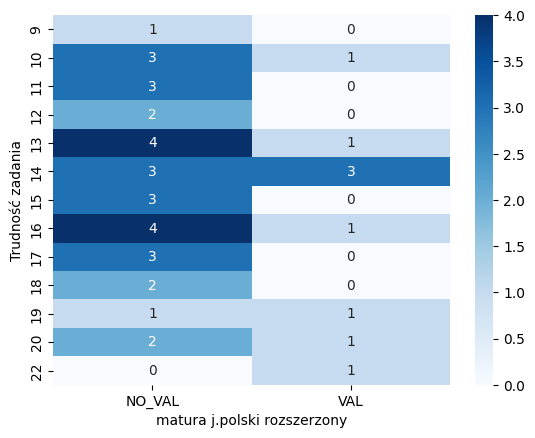

-------------------------------------
Zsumowane grafiki A:
POL   NO_VAL  VAL
diff             
5          2    0
6         11    2
7          3    3
8         11    1
9          2    0
10         1    1
11         1    1
12         0    1
Chi2 test conducted...
Chi-squared test statistic value: 10.70122231412554
P-value: 0.1521929406538322
Brak podstaw do odrzucenia H0.


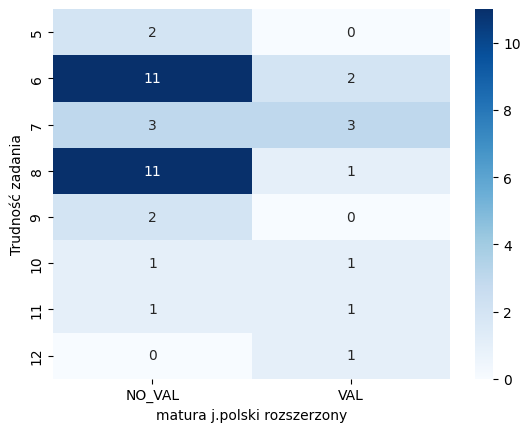

-------------------------------------
Zsumowane grafiki B:
POL   NO_VAL  VAL
diff             
3          1    0
4          3    1
5          5    0
6          3    0
7          4    4
8          8    2
9          2    0
10         3    2
11         1    0
12         1    0
Chi2 test conducted...
Chi-squared test statistic value: 8.172043010752688
P-value: 0.5169058538991504
Brak podstaw do odrzucenia H0.


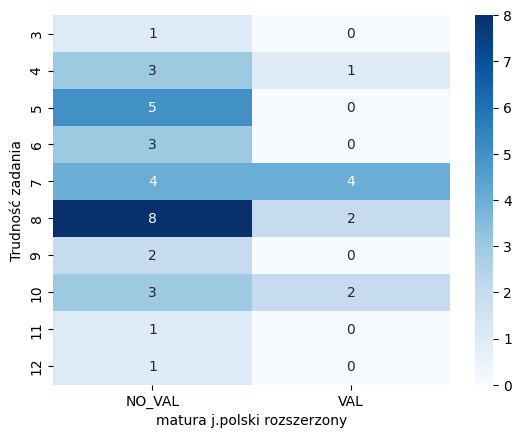

-------------------------------------
Zsumowane grafiki 1:
POL   NO_VAL  VAL
diff             
2          3    1
3          6    1
4          5    3
5         12    3
6          3    1
7          2    0
Chi2 test conducted...
Chi-squared test statistic value: 1.9662058371735789
P-value: 0.8538010742624342
Brak podstaw do odrzucenia H0.


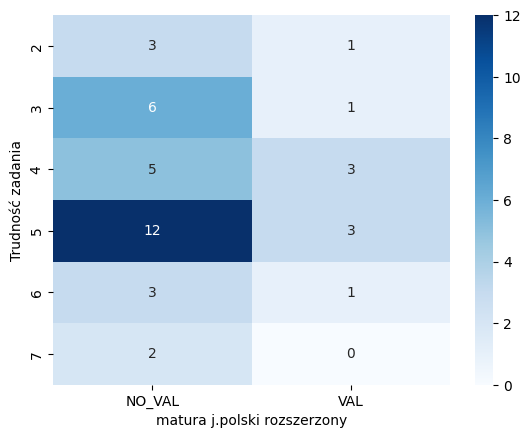

-------------------------------------
Zsumowane grafiki 2:
POL   NO_VAL  VAL
diff             
2          3    0
3          7    1
4          8    4
5          4    1
6          4    1
7          3    2
8          2    0
Chi2 test conducted...
Chi-squared test statistic value: 3.632019115890084
P-value: 0.7263302766840957
Brak podstaw do odrzucenia H0.


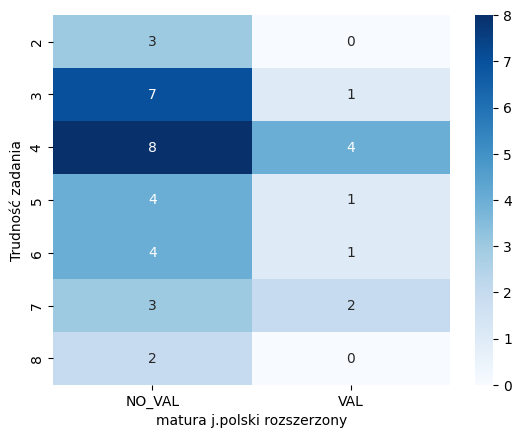

-------------------------------------
Zsumowane grafiki 3:
POL   NO_VAL  VAL
diff             
2          3    0
3          2    0
4          6    1
5          5    2
6          5    2
7          4    0
8          4    2
9          2    2
Chi2 test conducted...
Chi-squared test statistic value: 5.31831370541048
P-value: 0.6211792389790036
Brak podstaw do odrzucenia H0.


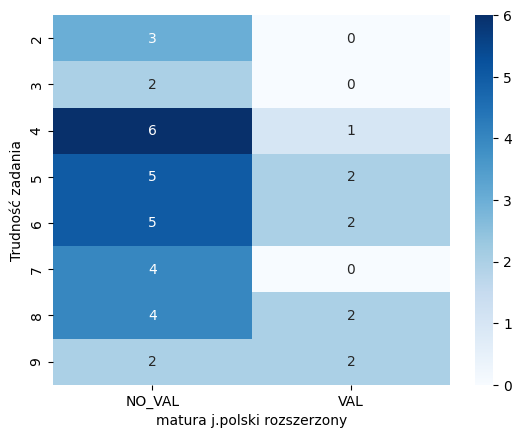

-------------------------------------
Kolekcja wszystkie grafiki:
POL   NO_VAL  VAL
diff             
1         44    7
2         62   21
3         47   15
4         29    7
5          4    4
Chi2 test conducted...
Chi-squared test statistic value: 6.389566709386726
P-value: 0.17188293234441177
Brak podstaw do odrzucenia H0.


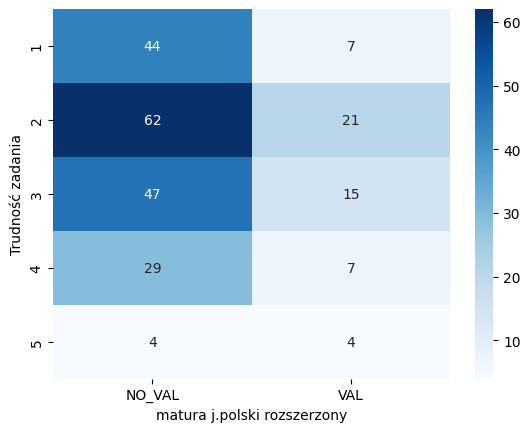

-------------------------------------
Kolekcja grafiki A:
POL   NO_VAL  VAL
diff             
1         20    2
2         32   10
3         26    9
4         13    5
5          2    1
Chi2 test conducted...
Chi-squared test statistic value: 3.0066150496258017
P-value: 0.5567189984758025
Brak podstaw do odrzucenia H0.


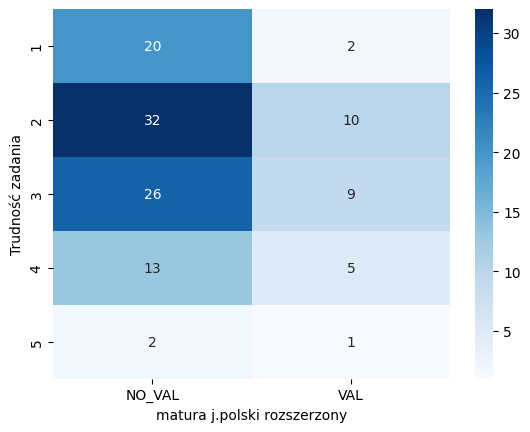

-------------------------------------
Kolekcja grafiki B:
POL   NO_VAL  VAL
diff             
1         24    5
2         30   11
3         21    6
4         16    2
5          2    3
Chi2 test conducted...
Chi-squared test statistic value: 6.2729406925758795
P-value: 0.17967106878439762
Brak podstaw do odrzucenia H0.


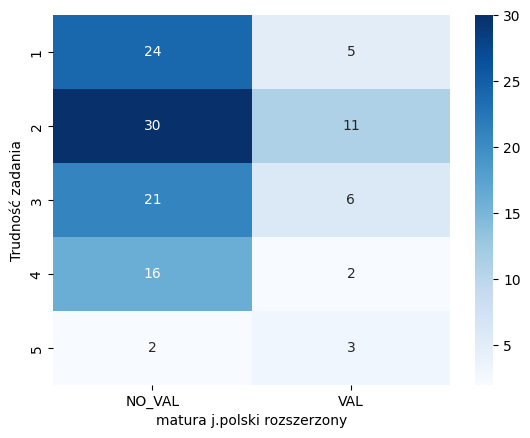

-------------------------------------
Kolekcja grafiki 1:
POL   NO_VAL  VAL
diff             
1         16    4
2         25    8
3         15    6
4          5    0
5          1    0
Chi2 test conducted...
Chi-squared test statistic value: 2.3150087666216703
P-value: 0.67803782217728
Brak podstaw do odrzucenia H0.


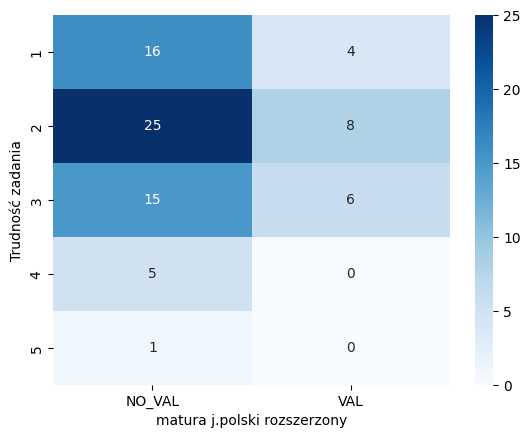

-------------------------------------
Kolekcja grafiki 2:
POL   NO_VAL  VAL
diff             
1         17    3
2         22    8
3         14    4
4          8    2
5          1    1
Chi2 test conducted...
Chi-squared test statistic value: 1.8478693747510953
P-value: 0.7637137124399026
Brak podstaw do odrzucenia H0.


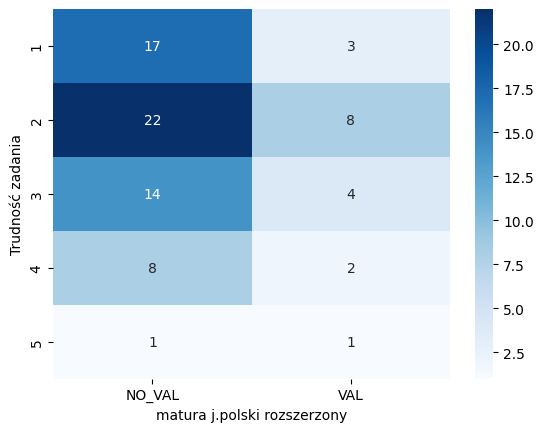

-------------------------------------
Kolekcja grafiki 3:
POL   NO_VAL  VAL
diff             
1         11    0
2         15    5
3         18    5
4         16    5
5          2    3
Chi2 test conducted...
Chi-squared test statistic value: 7.325778994783202
P-value: 0.11964165913405678
Brak podstaw do odrzucenia H0.


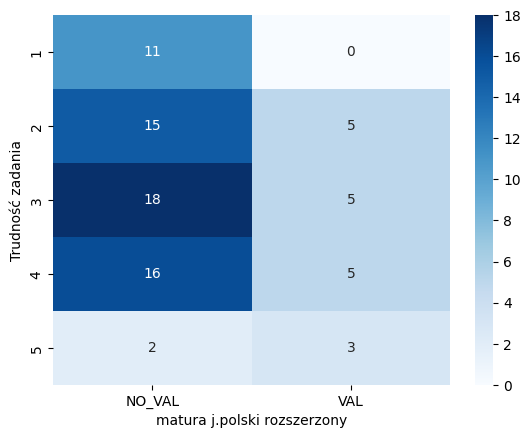

In [48]:
# POL - pisał / nie pisał matury rozszerzonej
var = 'POL'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'matura j.polski rozszerzony', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
HIST  NO_VAL  VAL
diff             
9          1    0
10         4    0
11         3    0
12         2    0
13         5    0
14         4    2
15         3    0
16         4    1
17         3    0
18         2    0
19         2    0
20         2    1
22         1    0
Chi2 test conducted...
Chi-squared test statistic value: 8.888888888888888
P-value: 0.7123903776087557
Brak podstaw do odrzucenia H0.


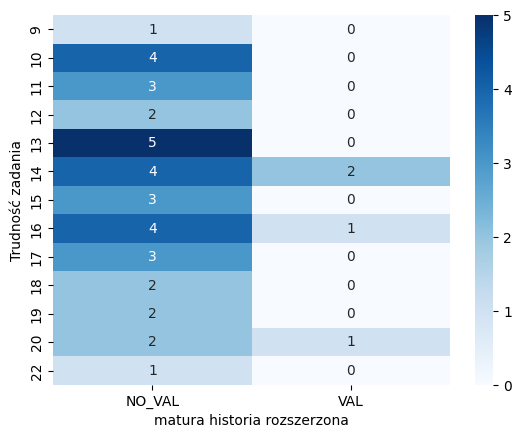

-------------------------------------
Zsumowane grafiki A:
HIST  NO_VAL  VAL
diff             
5          2    0
6         13    0
7          5    1
8         10    2
9          2    0
10         1    1
11         2    0
12         1    0
Chi2 test conducted...
Chi-squared test statistic value: 6.666666666666668
P-value: 0.46439128108585215
Brak podstaw do odrzucenia H0.


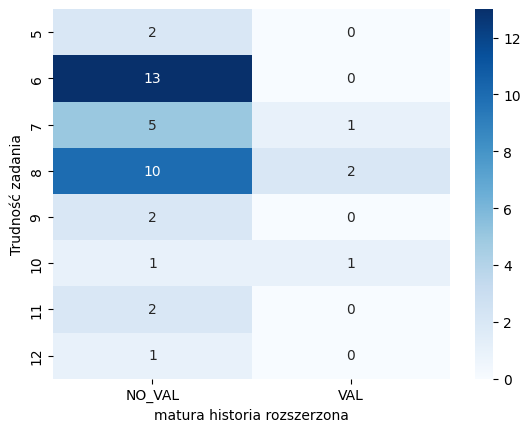

-------------------------------------
Zsumowane grafiki B:
HIST  NO_VAL  VAL
diff             
3          1    0
4          4    0
5          5    0
6          2    1
7          7    1
8          9    1
9          2    0
10         4    1
11         1    0
12         1    0
Chi2 test conducted...
Chi-squared test statistic value: 3.981481481481481
P-value: 0.9126271330086685
Brak podstaw do odrzucenia H0.


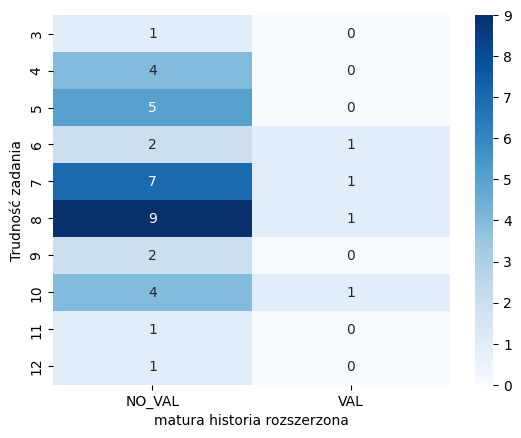

-------------------------------------
Zsumowane grafiki 1:
HIST  NO_VAL  VAL
diff             
2          4    0
3          7    0
4          5    3
5         14    1
6          4    0
7          2    0
Chi2 test conducted...
Chi-squared test statistic value: 8.796296296296296
P-value: 0.11747030746883462
Brak podstaw do odrzucenia H0.


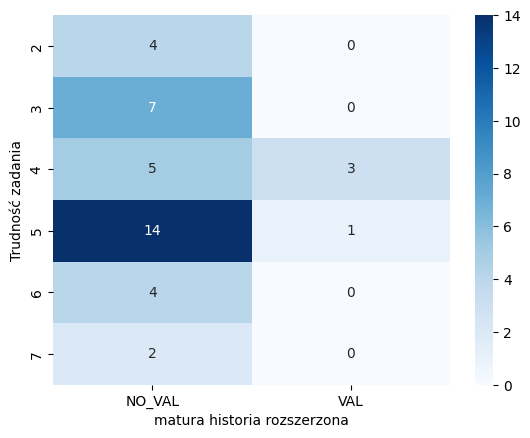

-------------------------------------
Zsumowane grafiki 2:
HIST  NO_VAL  VAL
diff             
2          3    0
3          6    2
4         11    1
5          5    0
6          4    1
7          5    0
8          2    0
Chi2 test conducted...
Chi-squared test statistic value: 4.259259259259259
P-value: 0.6416370332580599
Brak podstaw do odrzucenia H0.


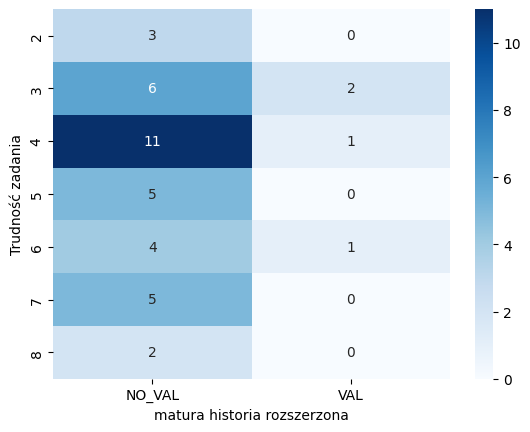

-------------------------------------
Zsumowane grafiki 3:
HIST  NO_VAL  VAL
diff             
2          3    0
3          2    0
4          7    0
5          7    0
6          6    1
7          3    1
8          6    0
9          2    2
Chi2 test conducted...
Chi-squared test statistic value: 11.031746031746032
P-value: 0.13724025632688022
Brak podstaw do odrzucenia H0.


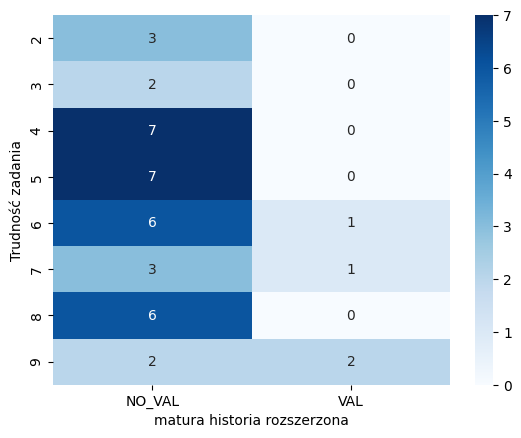

-------------------------------------
Kolekcja wszystkie grafiki:
HIST  NO_VAL  VAL
diff             
1         49    2
2         71   12
3         58    4
4         32    4
5          6    2
Chi2 test conducted...
Chi-squared test statistic value: 6.843112135096009
P-value: 0.14441497080932603
Brak podstaw do odrzucenia H0.


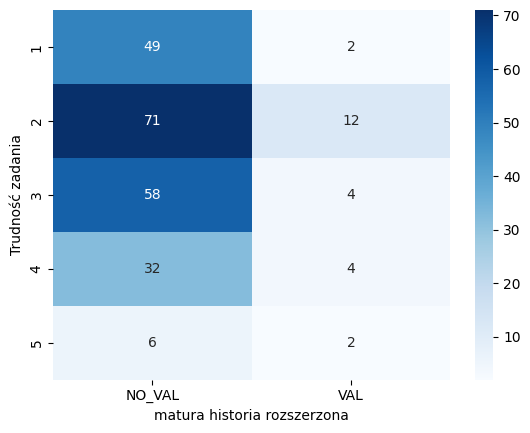

-------------------------------------
Kolekcja grafiki A:
HIST  NO_VAL  VAL
diff             
1         21    1
2         36    6
3         34    1
4         15    3
5          2    1
Chi2 test conducted...
Chi-squared test statistic value: 6.272246272246271
P-value: 0.1797183766342997
Brak podstaw do odrzucenia H0.


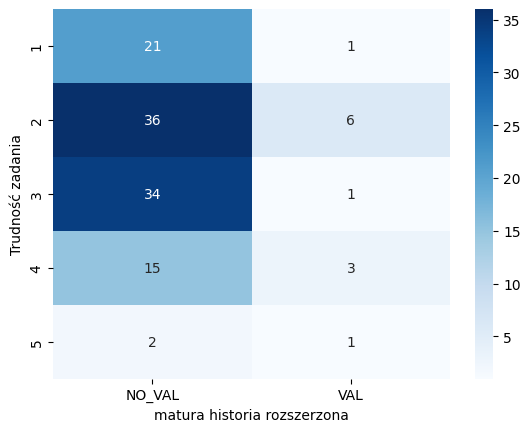

-------------------------------------
Kolekcja grafiki B:
HIST  NO_VAL  VAL
diff             
1         28    1
2         35    6
3         24    3
4         17    1
5          4    1
Chi2 test conducted...
Chi-squared test statistic value: 3.3491158666375935
P-value: 0.5011880869986356
Brak podstaw do odrzucenia H0.


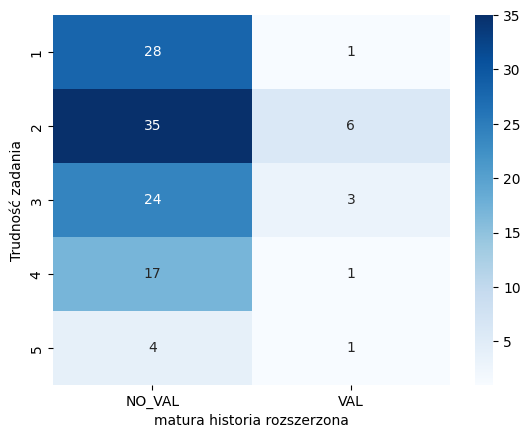

-------------------------------------
Kolekcja grafiki 1:
HIST  NO_VAL  VAL
diff             
1         20    0
2         26    7
3         20    1
4          5    0
5          1    0
Chi2 test conducted...
Chi-squared test statistic value: 8.13852813852814
P-value: 0.0866335247771546
Brak podstaw do odrzucenia H0.


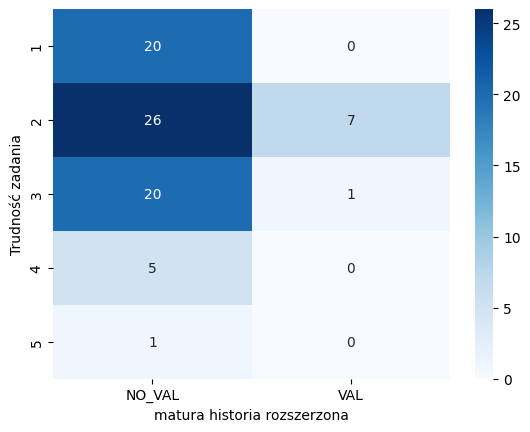

-------------------------------------
Kolekcja grafiki 2:
HIST  NO_VAL  VAL
diff             
1         18    2
2         25    5
3         18    0
4          9    1
5          2    0
Chi2 test conducted...
Chi-squared test statistic value: 3.7037037037037037
P-value: 0.44758747030351653
Brak podstaw do odrzucenia H0.


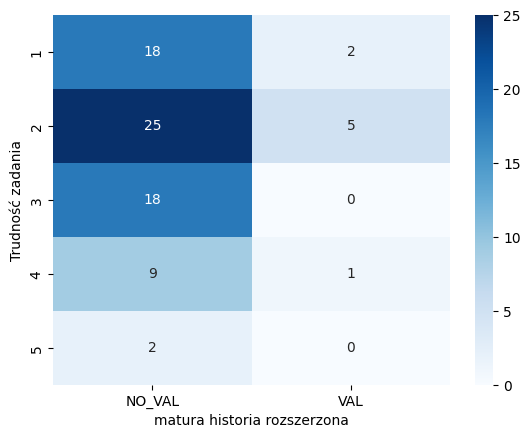

-------------------------------------
Kolekcja grafiki 3:
HIST  NO_VAL  VAL
diff             
1         11    0
2         20    0
3         20    3
4         18    3
5          3    2
Chi2 test conducted...
Chi-squared test statistic value: 9.109730848861282
P-value: 0.0584144944294426
Brak podstaw do odrzucenia H0.


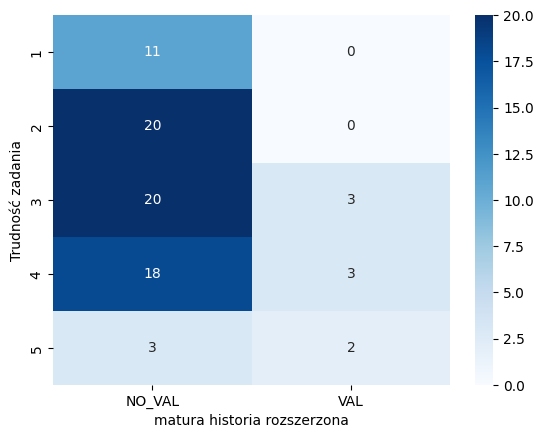

In [49]:
# HIST - pisał / nie pisał matury rozszerzonej
var = 'HIST'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'matura historia rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
9                            0           0           0           1
10                           0           1           0           3
11                           1           0           1           1
12                           1           0           0           1
13                           3           0           0           2
14                           2           0           1           3
15                           0           0           1           2
16                           1           0           0           4
17                           0           0           1           2
18                           2           0           0           0
19                           0           1           0           1
20                           0           0           2        

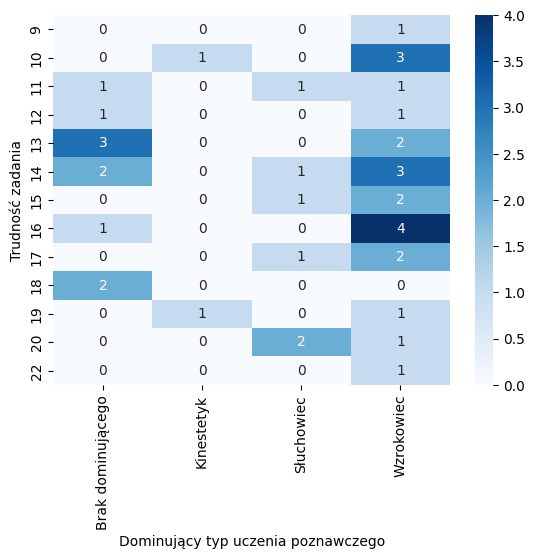

-------------------------------------
Zsumowane grafiki A:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
5                            1           0           0           1
6                            5           1           1           6
7                            0           0           2           4
8                            3           0           1           8
9                            0           0           1           1
10                           0           0           1           1
11                           1           1           0           0
12                           0           0           0           1
Chi2 test conducted...
Chi-squared test statistic value: 22.536130536130536
P-value: 0.36920015965604436
Brak podstaw do odrzucenia H0.


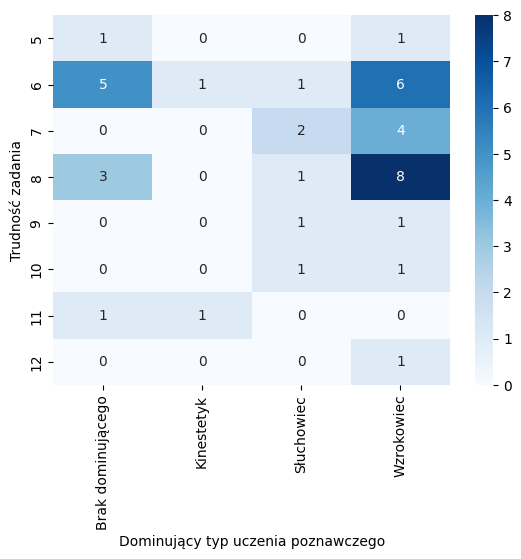

-------------------------------------
Zsumowane grafiki B:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
3                            0           0           0           1
4                            0           1           0           3
5                            1           0           1           3
6                            2           0           0           1
7                            3           0           1           4
8                            3           1           1           5
9                            0           0           1           1
10                           1           0           1           3
11                           0           0           1           0
12                           0           0           0           1
Chi2 test conducted...
Chi-squared test statistic value: 20.169696969696968
P-value: 0.8235597287914829
Brak podstaw do odrzucenia H0.


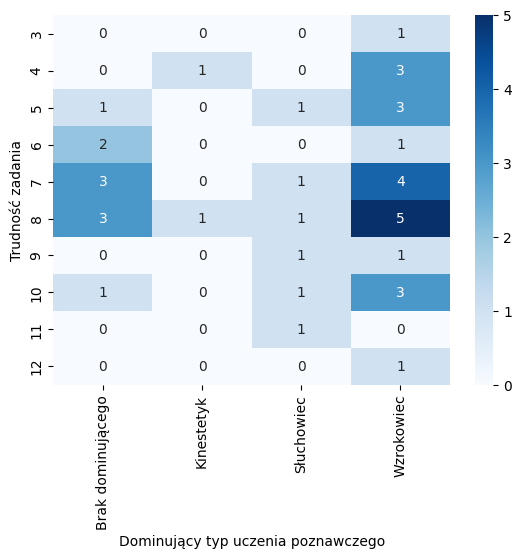

-------------------------------------
Zsumowane grafiki 1:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
2                            2           0           0           2
3                            2           0           1           4
4                            2           1           1           4
5                            3           1           3           8
6                            0           0           0           4
7                            1           0           1           0
Chi2 test conducted...
Chi-squared test statistic value: 10.278787878787877
P-value: 0.8018465661314211
Brak podstaw do odrzucenia H0.


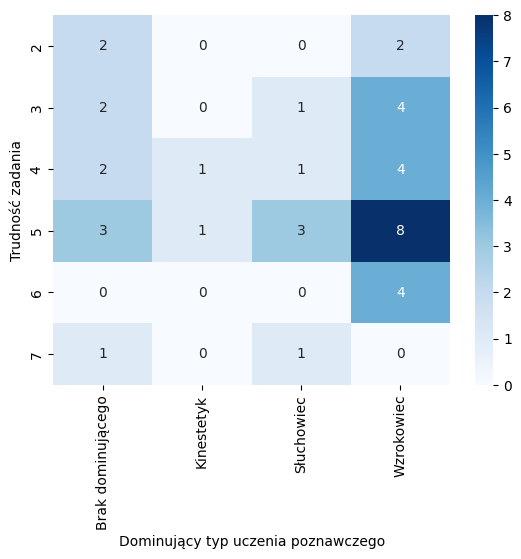

-------------------------------------
Zsumowane grafiki 2:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
2                            0           0           0           3
3                            3           1           0           4
4                            4           0           3           5
5                            1           0           0           4
6                            2           0           1           2
7                            0           1           1           3
8                            0           0           1           1
Chi2 test conducted...
Chi-squared test statistic value: 15.666666666666668
P-value: 0.6157981653773045
Brak podstaw do odrzucenia H0.


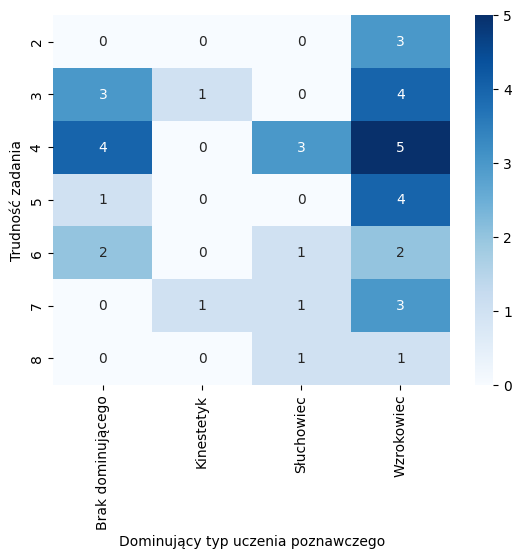

-------------------------------------
Zsumowane grafiki 3:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
2                            0           1           0           2
3                            0           0           0           2
4                            2           0           2           3
5                            2           0           0           5
6                            2           0           3           2
7                            2           0           0           2
8                            2           1           0           3
9                            0           0           1           3
Chi2 test conducted...
Chi-squared test statistic value: 22.138528138528134
P-value: 0.39156502778710883
Brak podstaw do odrzucenia H0.


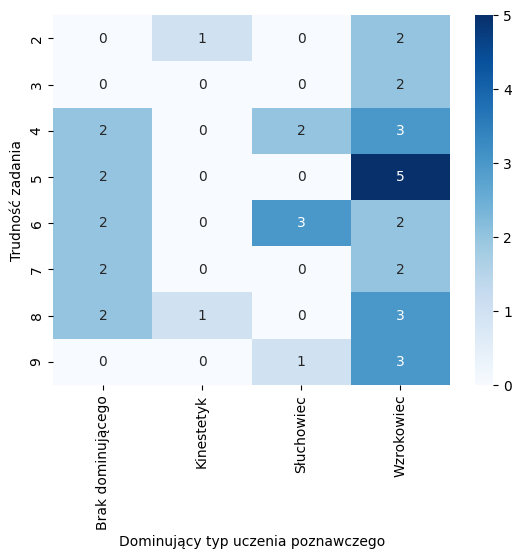

-------------------------------------
Kolekcja wszystkie grafiki:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
1                           13           5           3          30
2                           21           1          14          47
3                           19           2          11          30
4                            5           4           7          20
5                            2           0           1           5
Chi2 test conducted...
Chi-squared test statistic value: 15.389998920027956
P-value: 0.2207981365781921
Brak podstaw do odrzucenia H0.


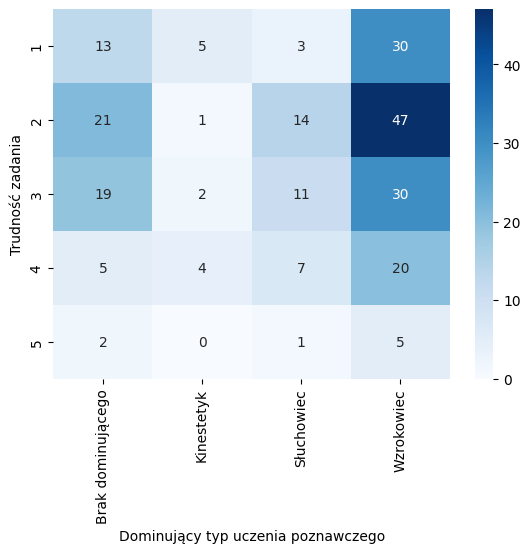

-------------------------------------
Kolekcja grafiki A:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
1                            6           2           2          12
2                           12           0           7          23
3                            9           1           5          20
4                            2           3           4           9
5                            1           0           0           2
Chi2 test conducted...
Chi-squared test statistic value: 11.811167956622501
P-value: 0.46096179792024383
Brak podstaw do odrzucenia H0.


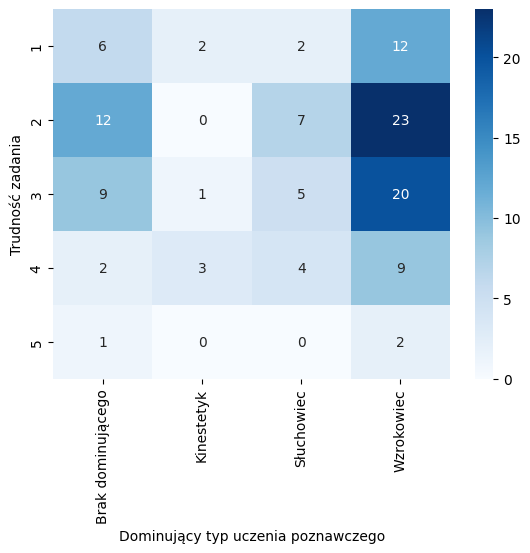

-------------------------------------
Kolekcja grafiki B:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
1                            7           3           1          18
2                            9           1           7          24
3                           10           1           6          10
4                            3           1           3          11
5                            1           0           1           3
Chi2 test conducted...
Chi-squared test statistic value: 10.661021201643576
P-value: 0.5581706418168915
Brak podstaw do odrzucenia H0.


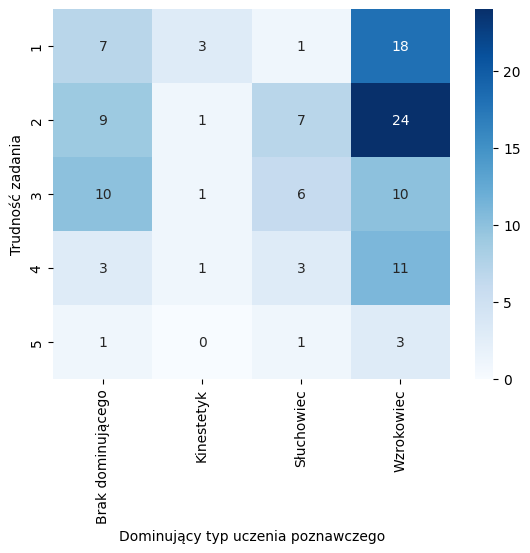

-------------------------------------
Kolekcja grafiki 1:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
1                            7           2           1          10
2                            8           0           6          19
3                            4           1           4          12
4                            0           1           1           3
5                            1           0           0           0
Chi2 test conducted...
Chi-squared test statistic value: 12.297310770038044
P-value: 0.42210734985522996
Brak podstaw do odrzucenia H0.


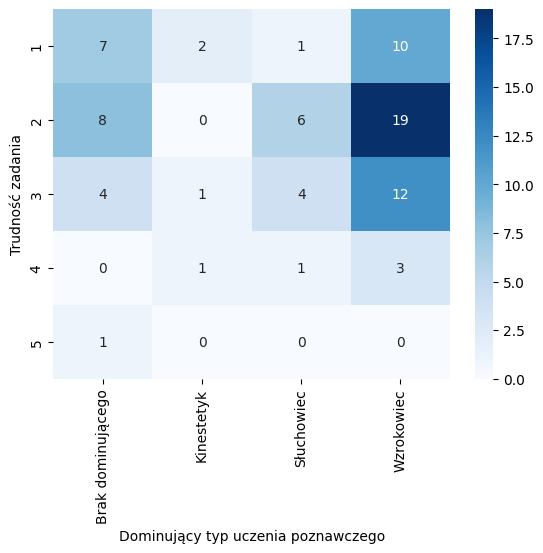

-------------------------------------
Kolekcja grafiki 2:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
1                            5           1           1          13
2                            8           1           5          16
3                            7           1           2           8
4                            0           1           4           5
5                            0           0           0           2
Chi2 test conducted...
Chi-squared test statistic value: 12.762289562289563
P-value: 0.38655270434141614
Brak podstaw do odrzucenia H0.


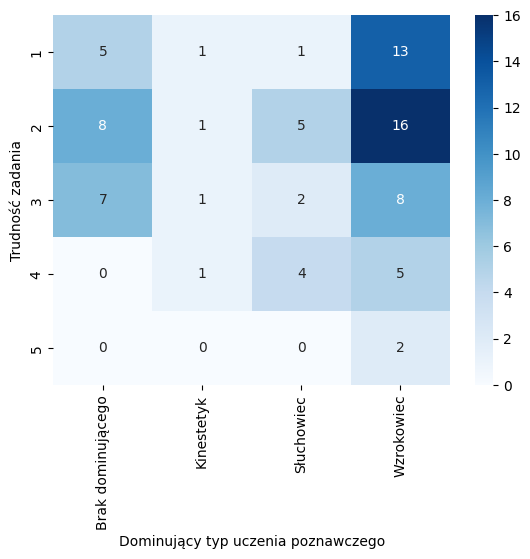

-------------------------------------
Kolekcja grafiki 3:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
diff                                                              
1                            1           2           1           7
2                            5           0           3          12
3                            8           0           5          10
4                            5           2           2          12
5                            1           0           1           3
Chi2 test conducted...
Chi-squared test statistic value: 11.429319736039105
P-value: 0.49252761118613564
Brak podstaw do odrzucenia H0.


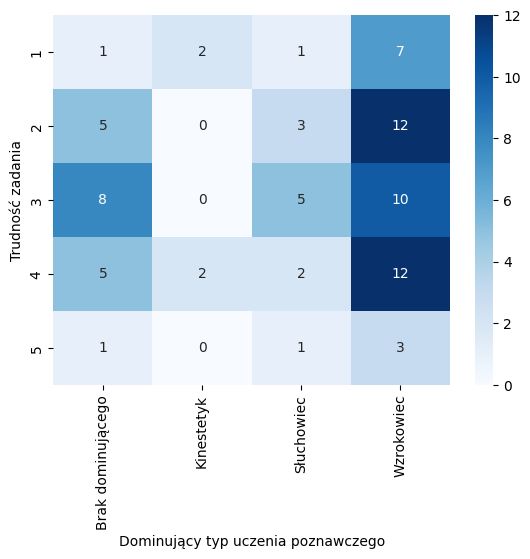

In [50]:
# dominujący typ uczenia poznawczego
var = 'Typ_uczenia'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'diff', var, ALPHA)
    plot_heatmap(df, 'diff', var, 'Trudność zadania', 'Dominujący typ uczenia poznawczego', cmap='Blues')

Podsumowanie - trudność:
Istotne statystycznie:
- wady wzroku: zsumowane grafiki 2 (mało różnicuje)
- ilość snu: zsumowane grafiki 3 (mało różnicuje), kolekcje wszystkie grafiki (widoczna różnica <6 , 6 vs 8,  >8), kolekcje grafiki 3 (mało różnicuje)
- matura matematyka podstawowa: zsumowane grafiki B, zsumowane grafiki 1 (mało różnicuje)
- sampoczoucie: zsumowane grafiki B (4 vs 2), kolekcje grafiki 2 (4 vs 3,2), 3 (4 vs pozostałe)
- Stres: kolekcje grafiki 2 (2 vs 4 i 5); zsumowane grafiki 2 (słabo różnicuje)
- zmęczenie: kolekcja wszystkie grafiki (5 vs 3,2,4; 1 vs 2)
- podzielność uwagi: zsumowane grafiki 3 (słabo się różnicuje), kolekcja grafiki 3 (1 vs 3)
- spostrzegawczość: zsumowane grafiki 2 (słabo się różnicuje), kolekcje grafiki wszystkie (4 vs pozostałe, 5 vs 4 i 2; 3 vs 2), A (4 vs pozostałe bez 3, 5 vs 4; 3 vs 2), 3 (4 vs 5,2) --> fajny wniosek dla grafik 2, widać sporzegawczośc vs. rozkminienie że zadanie było proste !!!
- czytanie ze zrozumieniem: zsumowane grafiki A (słabo się różnicuje)
- wzrokowiec: kolekcja grafiki A (4 vs 3,2; 3 vs 4),  kolekcja grafiki 1 (2 vs 4,5)
- kinestetyk: zsumowane grafiki A (słabo się różnicuje)

Każda grafika osobno:

In [51]:
columns = ['Płeć', 'Rok_urodzenia', 'Kierunek_studiów',
       'Rok_studiów', 'Specjalność', 'Wady_wzroku', 'Ilość_snu',
       'JP_podst', 'MAT_podst', 'JP_roz', 'MAT_roz', 'FIZ_roz', 'HIST_roz',
       'Samopocz', 'Stres', 'Zmęcz', 'Czyt_map', 'Podziel_uwg', 'Analit_myśl',
       'Spostrzeg', 'Czyt_ze_zroz', 'Wzrokowiec', 'Słuchowiec', 'Kinestetyk', 'MAT', 'POL', 'HIST', 'Typ_uczenia']

prefix = ['1a', '1b', '2a', '2b', '3a', '3b']

##############################################################
Płeć
-------------------------------------
1a
Płeć     K  M
1a_trud      
1        3  4
2        8  6
3        9  5
4        3  1
5        0  1
Chi2 test conducted...
Chi-squared test statistic value: 2.732919254658385
P-value: 0.603466579854351
Brak podstaw do odrzucenia H0.


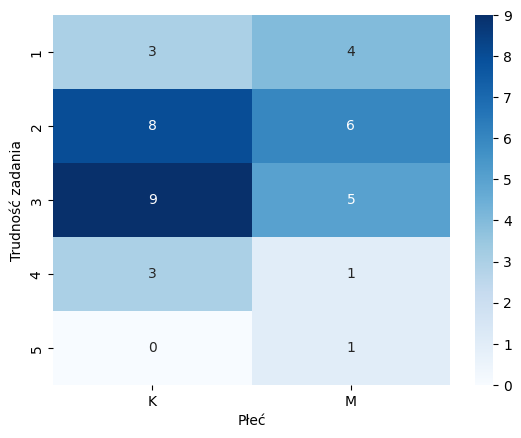

-------------------------------------
1b
Płeć      K  M
1b_trud       
1         5  8
2        11  8
3         6  1
4         1  0
Chi2 test conducted...
Chi-squared test statistic value: 4.948767748606219
P-value: 0.17558729118803693
Brak podstaw do odrzucenia H0.


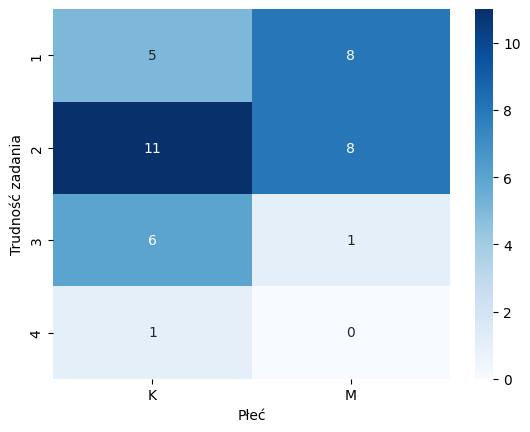

-------------------------------------
2a
Płeć      K  M
2a_trud       
1         2  6
2        10  5
3         7  4
4         3  2
5         1  0
Chi2 test conducted...
Chi-squared test statistic value: 4.8949856622490895
P-value: 0.29824333064414865
Brak podstaw do odrzucenia H0.


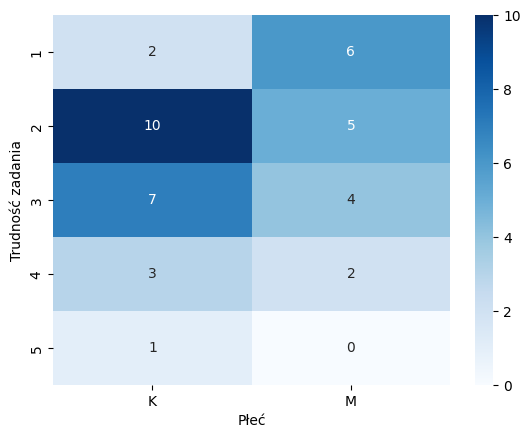

-------------------------------------
2b
Płeć     K  M
2b_trud      
1        7  5
2        7  8
3        4  3
4        5  0
5        0  1
Chi2 test conducted...
Chi-squared test statistic value: 5.7727438801607605
P-value: 0.2167748805243873
Brak podstaw do odrzucenia H0.


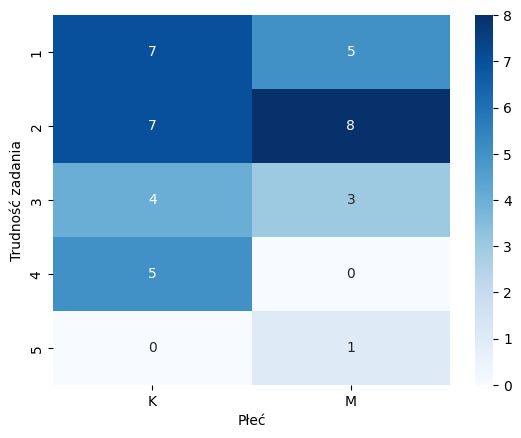

-------------------------------------
3a
Płeć     K  M
3a_trud      
1        4  3
2        9  4
3        5  5
4        5  4
5        0  1
Chi2 test conducted...
Chi-squared test statistic value: 2.3294579816318945
P-value: 0.6754110471904826
Brak podstaw do odrzucenia H0.


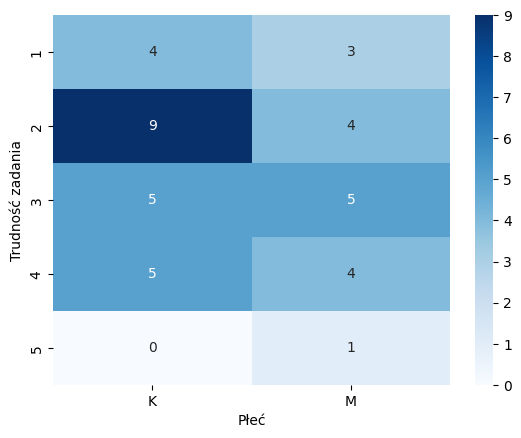

-------------------------------------
3b
Płeć      K  M
3b_trud       
1         2  2
2         2  5
3        10  3
4         6  6
5         3  1
Chi2 test conducted...
Chi-squared test statistic value: 5.273601079227679
P-value: 0.26035837878400675
Brak podstaw do odrzucenia H0.


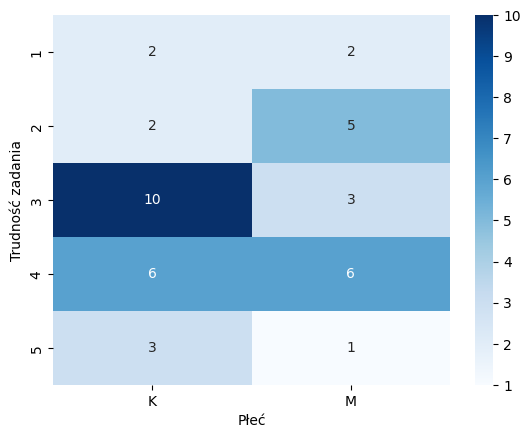

##############################################################
Rok_urodzenia
-------------------------------------
1a
Rok_urodzenia  2000  2001  2002  2003  2004
1a_trud                                    
1                 0     0     2     5     0
2                 0     4     3     6     1
3                 1     3     5     4     1
4                 0     0     1     2     1
5                 0     1     0     0     0
Chi2 test conducted...
Chi-squared test statistic value: 13.337789661319073
P-value: 0.6479178313688914
Brak podstaw do odrzucenia H0.


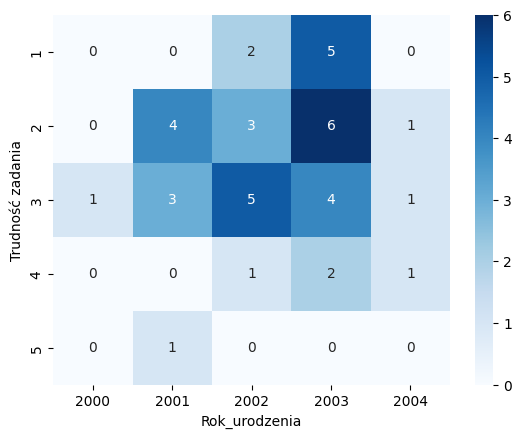

-------------------------------------
1b
Rok_urodzenia  2000  2001  2002  2003  2004
1b_trud                                    
1                 0     1     3     9     0
2                 1     6     5     5     2
3                 0     1     3     3     0
4                 0     0     0     0     1
Chi2 test conducted...
Chi-squared test statistic value: 21.57751433293229
P-value: 0.042536846024114845
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


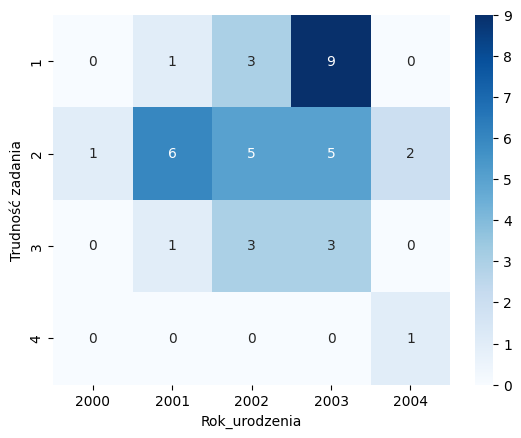

-------------------------------------
2a
Rok_urodzenia  2000  2001  2002  2003  2004
2a_trud                                    
1                 0     1     2     3     2
2                 1     3     4     6     1
3                 0     3     1     7     0
4                 0     1     4     0     0
5                 0     0     0     1     0
Chi2 test conducted...
Chi-squared test statistic value: 17.730385404850647
P-value: 0.33991967788232036
Brak podstaw do odrzucenia H0.


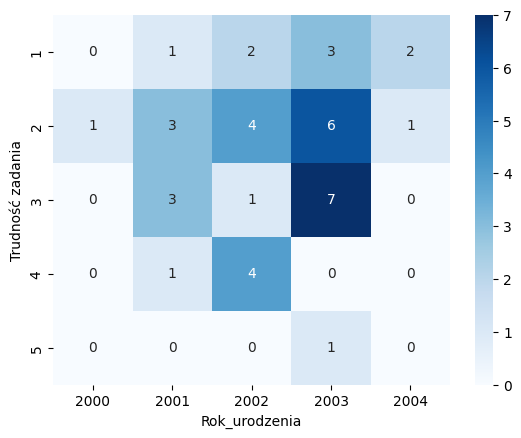

-------------------------------------
2b
Rok_urodzenia  2000  2001  2002  2003  2004
2b_trud                                    
1                 1     4     0     4     3
2                 0     2     6     7     0
3                 0     1     3     3     0
4                 0     1     1     3     0
5                 0     0     1     0     0
Chi2 test conducted...
Chi-squared test statistic value: 18.897886427298193
P-value: 0.2739940350789554
Brak podstaw do odrzucenia H0.


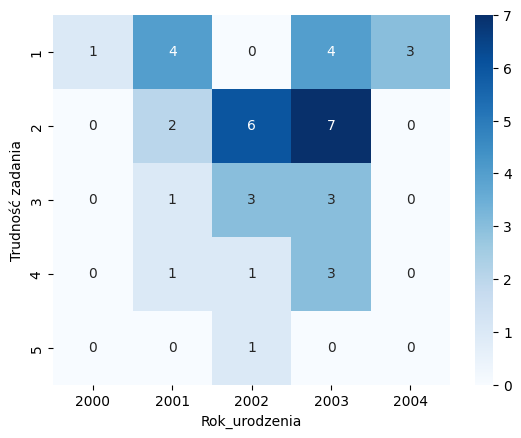

-------------------------------------
3a
Rok_urodzenia  2000  2001  2002  2003  2004
3a_trud                                    
1                 0     2     2     2     1
2                 0     2     2     9     0
3                 1     2     3     3     1
4                 0     2     3     3     1
5                 0     0     1     0     0
Chi2 test conducted...
Chi-squared test statistic value: 11.555420614244142
P-value: 0.7739754583891573
Brak podstaw do odrzucenia H0.


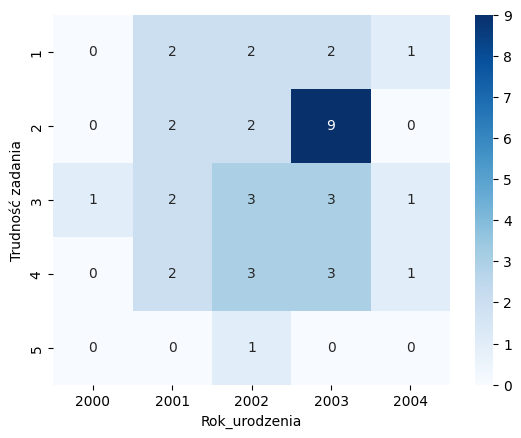

-------------------------------------
3b
Rok_urodzenia  2000  2001  2002  2003  2004
3b_trud                                    
1                 0     2     1     1     0
2                 0     0     1     6     0
3                 0     3     5     4     1
4                 0     3     3     5     1
5                 1     0     1     1     1
Chi2 test conducted...
Chi-squared test statistic value: 20.814765300059417
P-value: 0.1857412038544559
Brak podstaw do odrzucenia H0.


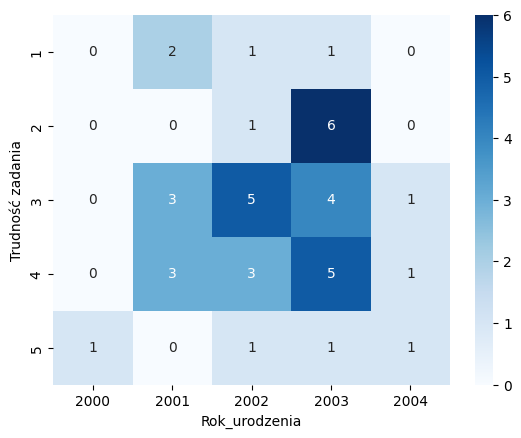

##############################################################
Kierunek_studiów
-------------------------------------
1a
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
1a_trud                                                               
1                         5                        2                 0
2                        12                        0                 2
3                        10                        3                 1
4                         4                        0                 0
5                         1                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 6.976190476190476
P-value: 0.5392037132840312
Brak podstaw do odrzucenia H0.


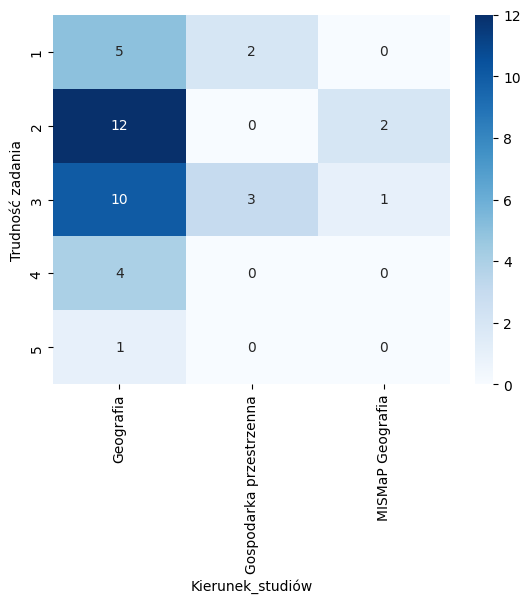

-------------------------------------
1b
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
1b_trud                                                               
1                        11                        1                 1
2                        14                        4                 1
3                         6                        0                 1
4                         1                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 3.192307692307692
P-value: 0.7843519622839663
Brak podstaw do odrzucenia H0.


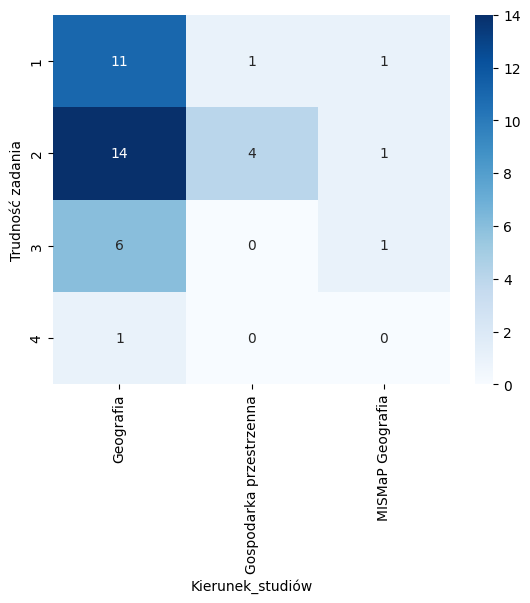

-------------------------------------
2a
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
2a_trud                                                               
1                         7                        1                 0
2                        11                        2                 2
3                        10                        1                 0
4                         3                        1                 1
5                         1                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 4.28604797979798
P-value: 0.8304370971845594
Brak podstaw do odrzucenia H0.


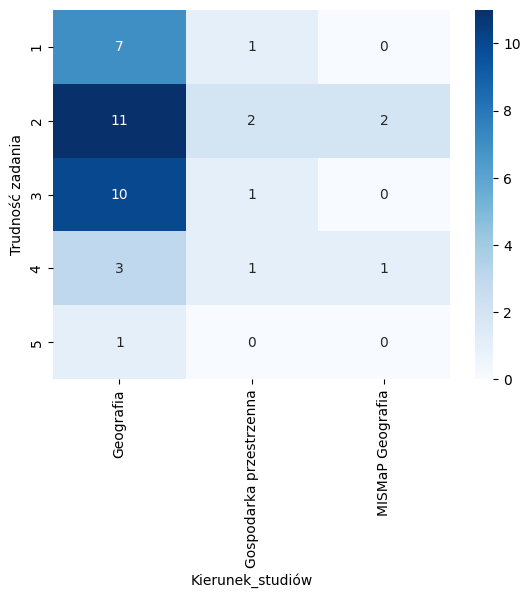

-------------------------------------
2b
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
2b_trud                                                               
1                        10                        1                 1
2                        13                        2                 0
3                         5                        1                 1
4                         4                        1                 0
5                         0                        0                 1
Chi2 test conducted...
Chi-squared test statistic value: 14.856349206349208
P-value: 0.06199958720917219
Brak podstaw do odrzucenia H0.


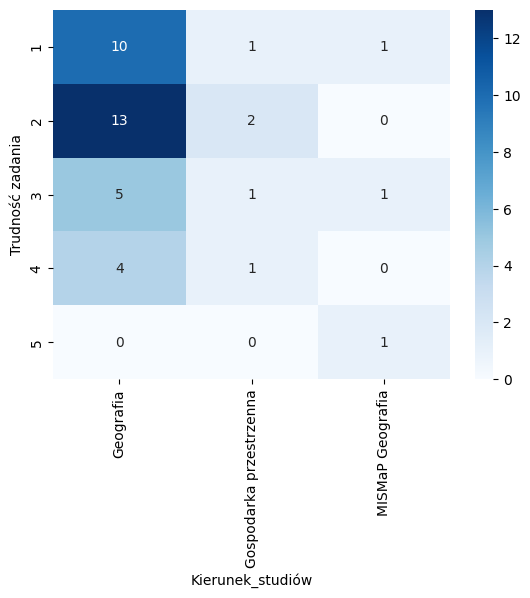

-------------------------------------
3a
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
3a_trud                                                               
1                         6                        1                 0
2                        11                        2                 0
3                         8                        2                 0
4                         6                        0                 3
5                         1                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 12.450915750915751
P-value: 0.13219048655179994
Brak podstaw do odrzucenia H0.


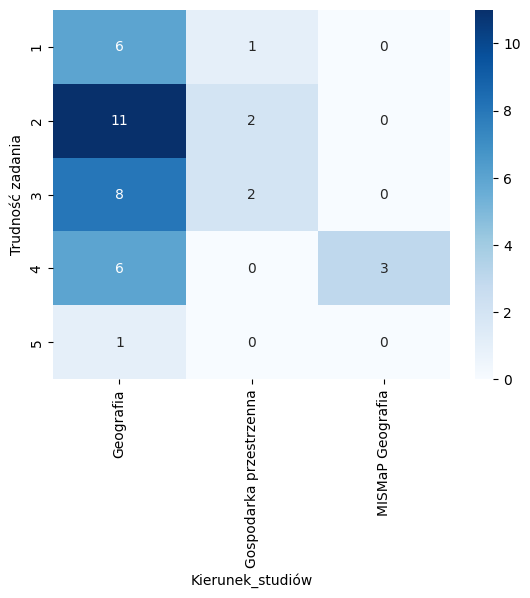

-------------------------------------
3b
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
3b_trud                                                               
1                         3                        1                 0
2                         7                        0                 0
3                        11                        1                 1
4                         7                        3                 2
5                         4                        0                 0
Chi2 test conducted...
Chi-squared test statistic value: 7.386752136752136
P-value: 0.4955366564575008
Brak podstaw do odrzucenia H0.


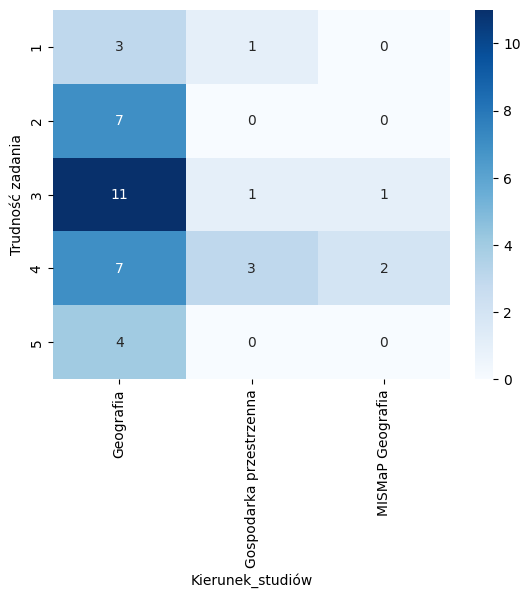

##############################################################
Rok_studiów
-------------------------------------
1a
Rok_studiów  1  2  3
1a_trud             
1            6  1  0
2            7  3  4
3            7  4  3
4            3  0  1
5            0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 8.165976535541754
P-value: 0.4174273971295973
Brak podstaw do odrzucenia H0.


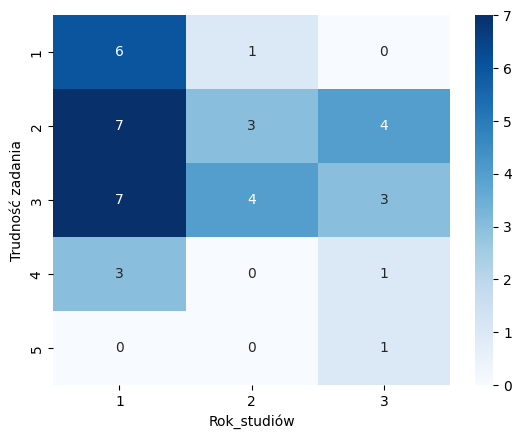

-------------------------------------
1b
Rok_studiów   1  2  3
1b_trud              
1            10  2  1
2             8  4  7
3             4  2  1
4             1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 5.99525569777286
P-value: 0.42372175221252284
Brak podstaw do odrzucenia H0.


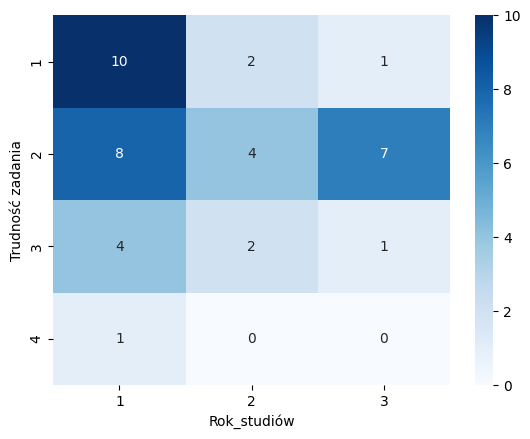

-------------------------------------
2a
Rok_studiów  1  2  3
2a_trud             
1            5  2  1
2            8  3  4
3            7  0  4
4            2  3  0
5            1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 9.993485580442101
P-value: 0.26548344041277083
Brak podstaw do odrzucenia H0.


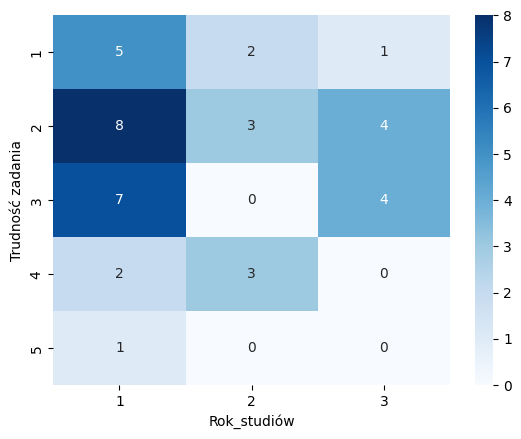

-------------------------------------
2b
Rok_studiów  1  2  3
2b_trud             
1            7  0  5
2            8  4  3
3            3  3  1
4            5  0  0
5            0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 14.776167471819646
P-value: 0.06364668326751986
Brak podstaw do odrzucenia H0.


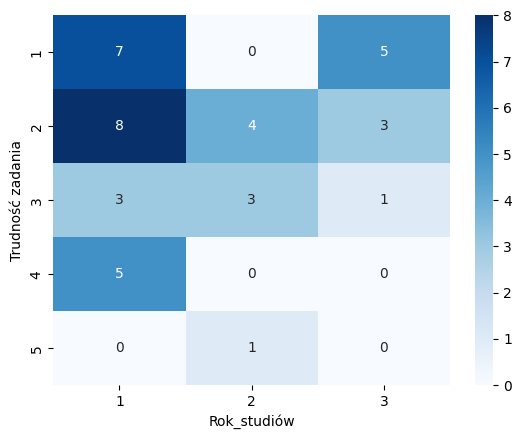

-------------------------------------
3a
Rok_studiów   1  2  3
3a_trud              
1             5  1  1
2            10  1  2
3             4  2  4
4             4  3  2
5             0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 9.651265535323507
P-value: 0.29036034675210143
Brak podstaw do odrzucenia H0.


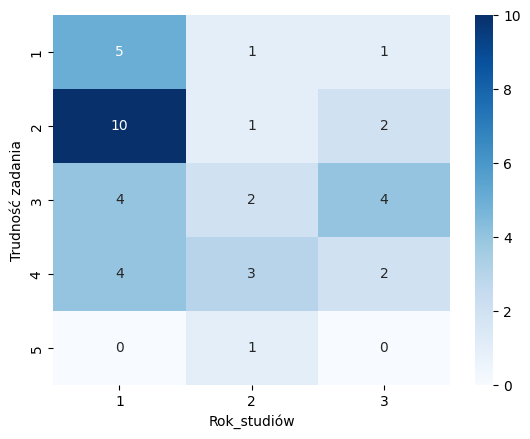

-------------------------------------
3b
Rok_studiów  1  2  3
3b_trud             
1            2  0  2
2            6  1  0
3            7  3  3
4            6  3  3
5            2  1  1
Chi2 test conducted...
Chi-squared test statistic value: 5.336571640919467
P-value: 0.7210713388164783
Brak podstaw do odrzucenia H0.


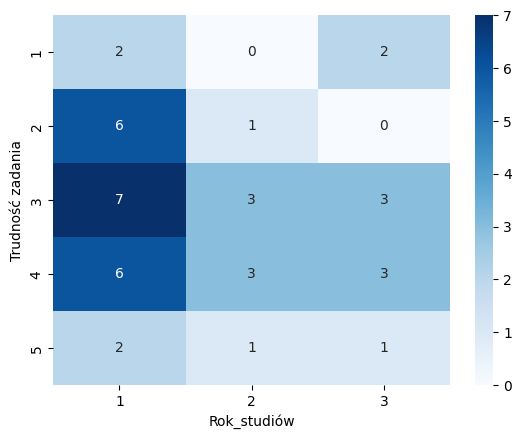

##############################################################
Specjalność
-------------------------------------
1a
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
1a_trud                                     
1               3        1       2         1
2               3        8       0         3
3               2        7       3         2
4               1        1       0         2
5               0        1       0         0
Chi2 test conducted...
Chi-squared test statistic value: 12.055555555555555
P-value: 0.44122827889227567
Brak podstaw do odrzucenia H0.


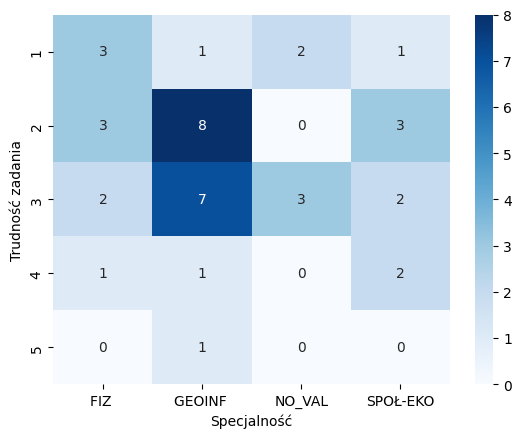

-------------------------------------
1b
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
1b_trud                                     
1               3        5       1         4
2               4       10       4         1
3               1        3       0         3
4               1        0       0         0
Chi2 test conducted...
Chi-squared test statistic value: 10.923333975965555
P-value: 0.2810006518786727
Brak podstaw do odrzucenia H0.


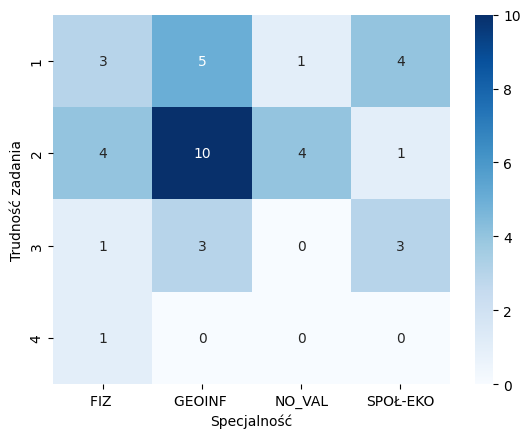

-------------------------------------
2a
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
2a_trud                                     
1               2        4       1         1
2               4        7       2         2
3               2        6       1         2
4               1        1       1         2
5               0        0       0         1
Chi2 test conducted...
Chi-squared test statistic value: 7.126010101010102
P-value: 0.8491750913325641
Brak podstaw do odrzucenia H0.


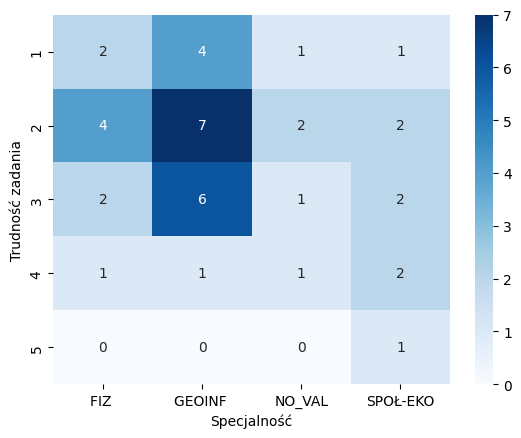

-------------------------------------
2b
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
2b_trud                                     
1               4        6       1         1
2               2        7       2         4
3               1        3       1         2
4               2        1       1         1
5               0        1       0         0
Chi2 test conducted...
Chi-squared test statistic value: 5.901322751322751
P-value: 0.9209742986792073
Brak podstaw do odrzucenia H0.


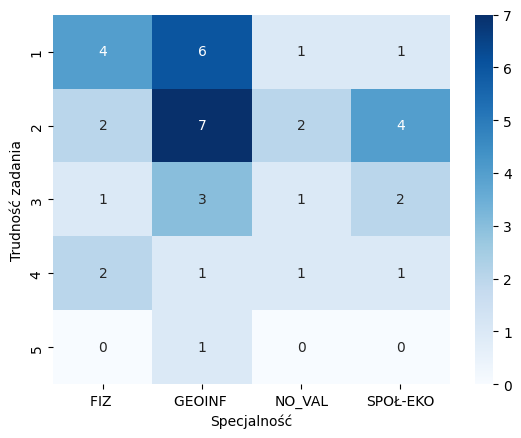

-------------------------------------
3a
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
3a_trud                                     
1               2        3       1         1
2               4        5       2         2
3               1        6       2         1
4               1        4       0         4
5               1        0       0         0
Chi2 test conducted...
Chi-squared test statistic value: 10.919780219780218
P-value: 0.5358057918355774
Brak podstaw do odrzucenia H0.


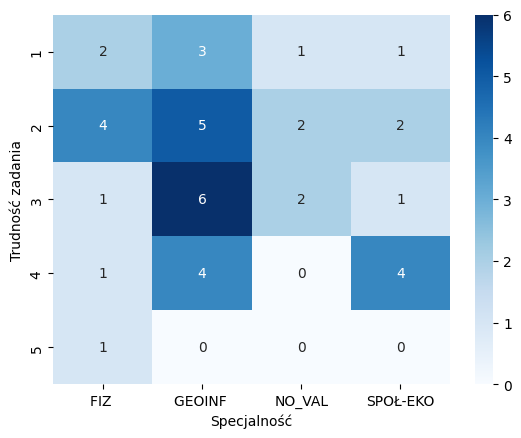

-------------------------------------
3b
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
3b_trud                                     
1               0        2       1         1
2               2        4       0         1
3               4        7       1         1
4               3        3       3         3
5               0        2       0         2
Chi2 test conducted...
Chi-squared test statistic value: 10.623931623931625
P-value: 0.5613925909822473
Brak podstaw do odrzucenia H0.


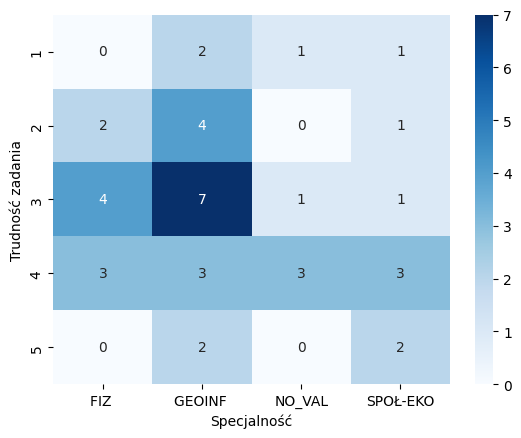

##############################################################
Wady_wzroku
-------------------------------------
1a
Wady_wzroku   0   1
1a_trud            
1             1   6
2            10   4
3             3  11
4             2   2
5             0   1
Chi2 test conducted...
Chi-squared test statistic value: 10.535714285714288
P-value: 0.032308574805647264
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


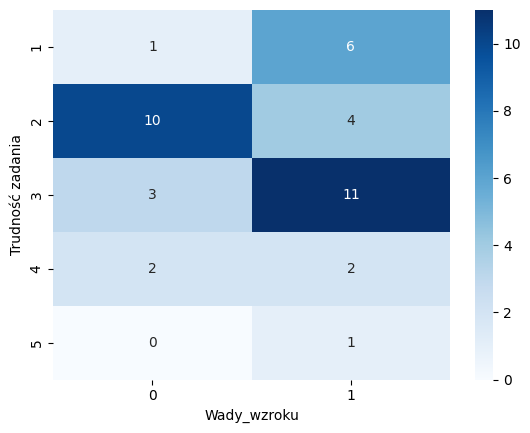

-------------------------------------
1b
Wady_wzroku  0   1
1b_trud           
1            7   6
2            6  13
3            2   5
4            1   0
Chi2 test conducted...
Chi-squared test statistic value: 3.4808174281858486
P-value: 0.3232585714986864
Brak podstaw do odrzucenia H0.


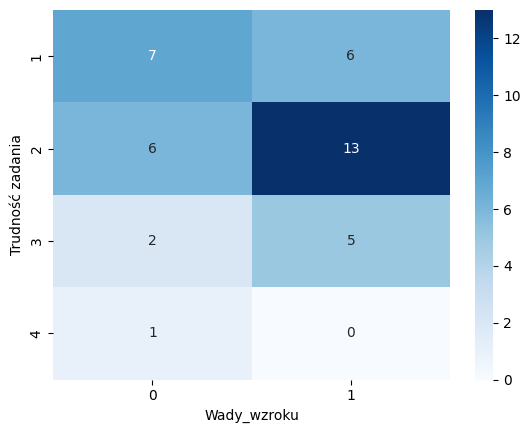

-------------------------------------
2a
Wady_wzroku  0   1
2a_trud           
1            3   5
2            5  10
3            6   5
4            2   3
5            0   1
Chi2 test conducted...
Chi-squared test statistic value: 1.9349747474747474
P-value: 0.7477174673085369
Brak podstaw do odrzucenia H0.


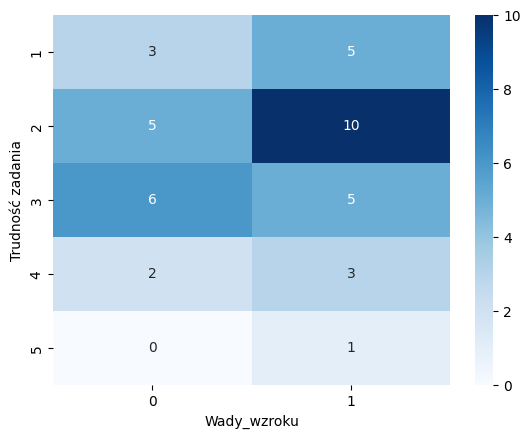

-------------------------------------
2b
Wady_wzroku  0  1
2b_trud          
1            6  6
2            6  9
3            4  3
4            0  5
5            0  1
Chi2 test conducted...
Chi-squared test statistic value: 5.357142857142858
P-value: 0.2525750237802768
Brak podstaw do odrzucenia H0.


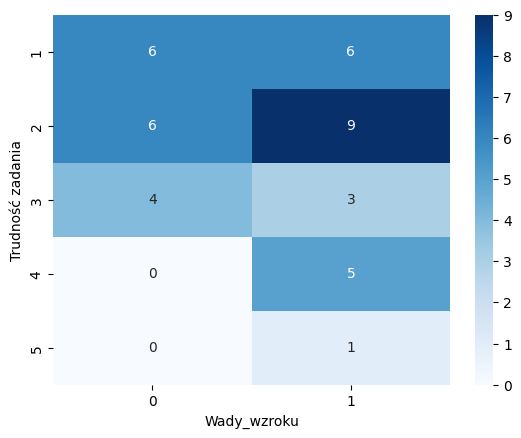

-------------------------------------
3a
Wady_wzroku  0  1
3a_trud          
1            4  3
2            4  9
3            3  7
4            4  5
5            1  0
Chi2 test conducted...
Chi-squared test statistic value: 3.30942205942206
P-value: 0.5074408021020862
Brak podstaw do odrzucenia H0.


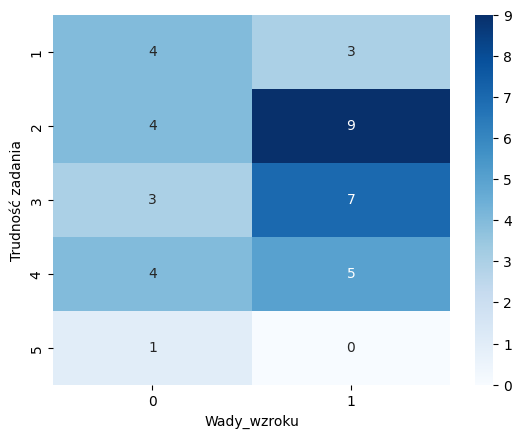

-------------------------------------
3b
Wady_wzroku  0  1
3b_trud          
1            3  1
2            3  4
3            4  9
4            4  8
5            2  2
Chi2 test conducted...
Chi-squared test statistic value: 2.9159035409035403
P-value: 0.571995942613667
Brak podstaw do odrzucenia H0.


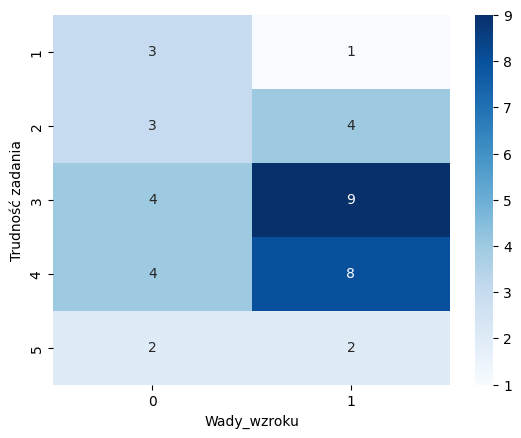

##############################################################
Ilość_snu
-------------------------------------
1a
Ilość_snu  6  7  8  8<  <6
1a_trud                   
1          1  1  1   1   3
2          1  4  2   4   3
3          6  2  1   1   4
4          2  2  0   0   0
5          1  0  0   0   0
Chi2 test conducted...
Chi-squared test statistic value: 15.164502164502164
P-value: 0.512624720018156
Brak podstaw do odrzucenia H0.


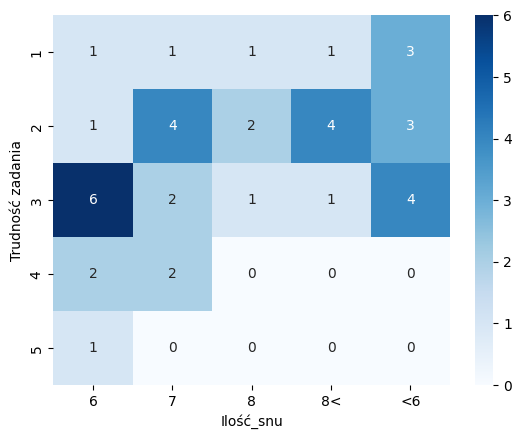

-------------------------------------
1b
Ilość_snu  6  7  8  8<  <6
1b_trud                   
1          4  1  1   4   3
2          6  5  2   0   6
3          1  3  1   1   1
4          0  0  0   1   0
Chi2 test conducted...
Chi-squared test statistic value: 14.83592430960852
P-value: 0.2505322005153277
Brak podstaw do odrzucenia H0.


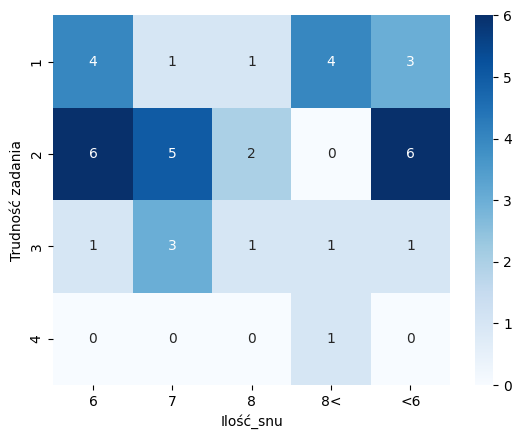

-------------------------------------
2a
Ilość_snu  6  7  8  8<  <6
2a_trud                   
1          2  1  0   1   4
2          5  5  2   2   1
3          1  2  2   3   3
4          3  1  0   0   1
5          0  0  0   0   1
Chi2 test conducted...
Chi-squared test statistic value: 15.930915212733394
P-value: 0.4577927814424452
Brak podstaw do odrzucenia H0.


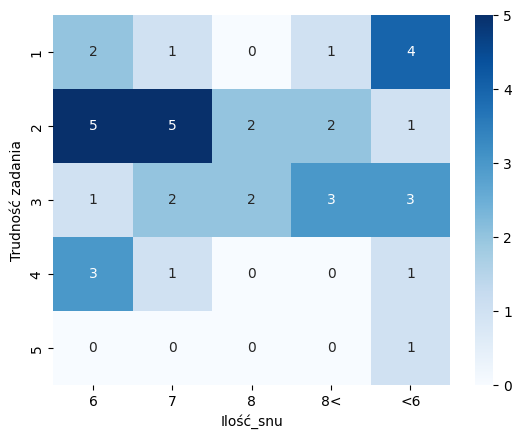

-------------------------------------
2b
Ilość_snu  6  7  8  8<  <6
2b_trud                   
1          3  2  2   1   4
2          2  5  1   3   4
3          2  1  1   1   2
4          3  1  0   1   0
5          1  0  0   0   0
Chi2 test conducted...
Chi-squared test statistic value: 10.524963924963924
P-value: 0.8378152148892573
Brak podstaw do odrzucenia H0.


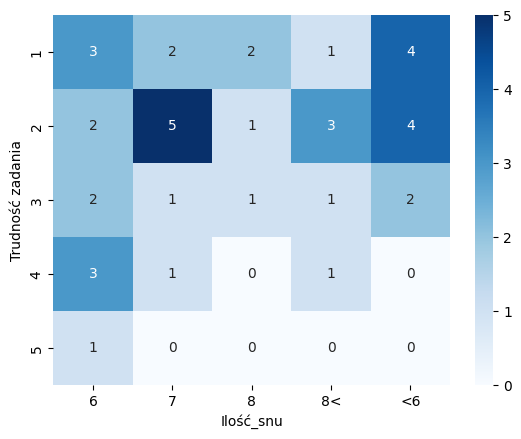

-------------------------------------
3a
Ilość_snu  6  7  8  8<  <6
3a_trud                   
1          4  0  1   2   0
2          1  4  0   3   5
3          2  3  3   1   1
4          4  2  0   0   3
5          0  0  0   0   1
Chi2 test conducted...
Chi-squared test statistic value: 23.568448835115504
P-value: 0.0993629071282242
Brak podstaw do odrzucenia H0.


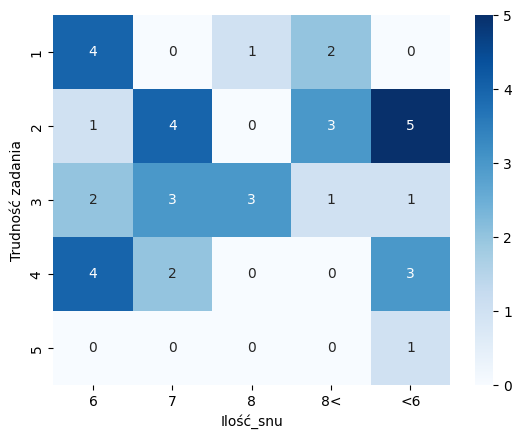

-------------------------------------
3b
Ilość_snu  6  7  8  8<  <6
3b_trud                   
1          2  0  1   0   1
2          1  1  0   4   1
3          2  6  1   2   2
4          6  1  1   0   4
5          0  1  1   0   2
Chi2 test conducted...
Chi-squared test statistic value: 26.635383135383137
P-value: 0.04571804381654682
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


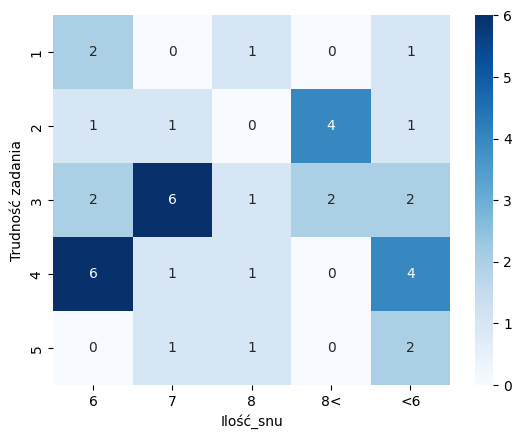

##############################################################
JP_podst
-------------------------------------
1a
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1a_trud                                          
1                1         3         3          0
2                1         5         6          2
3                2         3         7          2
4                1         1         1          1
5                0         1         0          0
Chi2 test conducted...
Chi-squared test statistic value: 5.745313510019392
P-value: 0.9283723259312686
Brak podstaw do odrzucenia H0.


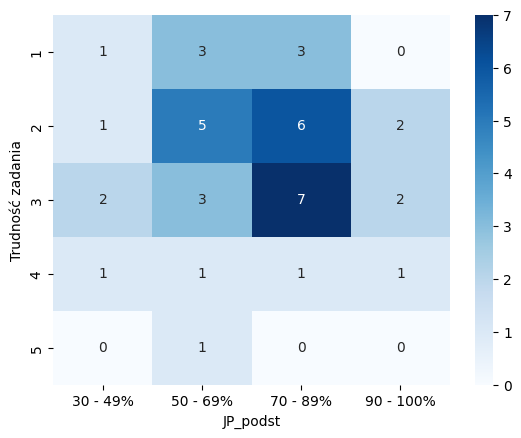

-------------------------------------
1b
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1b_trud                                          
1                3         4         5          1
2                2         7         8          2
3                0         2         3          2
4                0         0         1          0
Chi2 test conducted...
Chi-squared test statistic value: 5.40287718949305
P-value: 0.7978701785062399
Brak podstaw do odrzucenia H0.


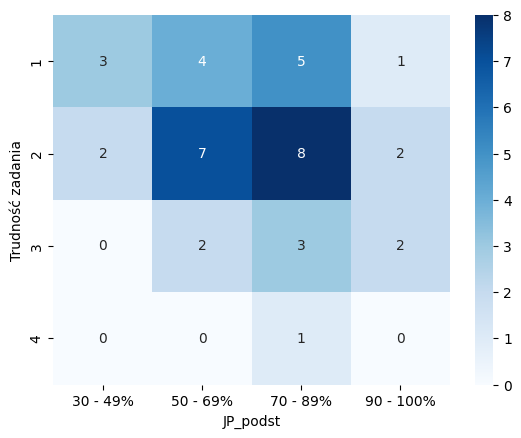

-------------------------------------
2a
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2a_trud                                          
1                2         1         4          1
2                1         4         9          1
3                1         6         2          2
4                1         2         1          1
5                0         0         1          0
Chi2 test conducted...
Chi-squared test statistic value: 10.19207459207459
P-value: 0.5991143732828326
Brak podstaw do odrzucenia H0.


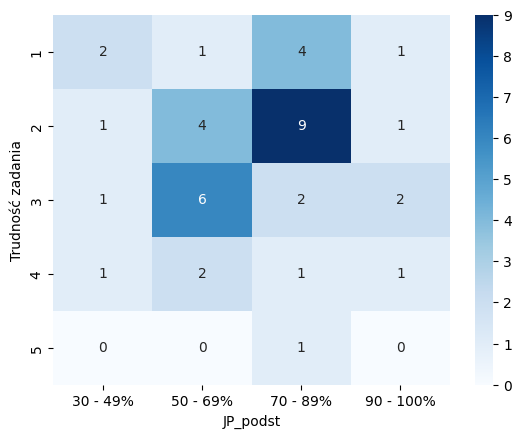

-------------------------------------
2b
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2b_trud                                          
1                1         5         6          0
2                2         5         7          1
3                1         0         4          2
4                1         3         0          1
5                0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 17.44779142426201
P-value: 0.13351500021176244
Brak podstaw do odrzucenia H0.


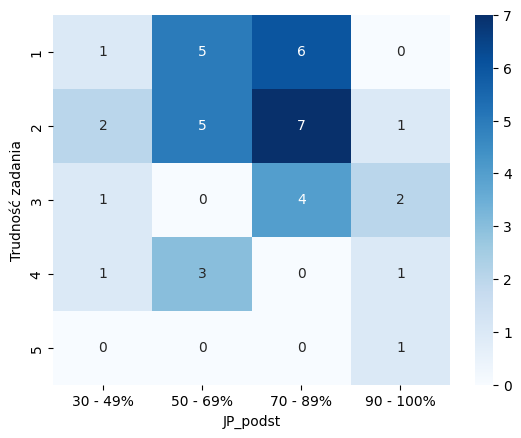

-------------------------------------
3a
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3a_trud                                          
1                2         3         2          0
2                2         3         6          2
3                0         3         6          1
4                1         3         3          2
5                0         1         0          0
Chi2 test conducted...
Chi-squared test statistic value: 8.432152663826873
P-value: 0.7505133767362854
Brak podstaw do odrzucenia H0.


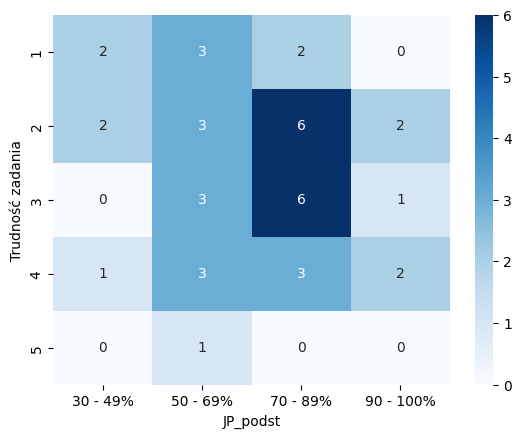

-------------------------------------
3b
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3b_trud                                          
1                1         2         1          0
2                2         1         4          0
3                1         4         6          2
4                0         4         5          3
5                1         2         1          0
Chi2 test conducted...
Chi-squared test statistic value: 10.103724329968674
P-value: 0.6068613487639438
Brak podstaw do odrzucenia H0.


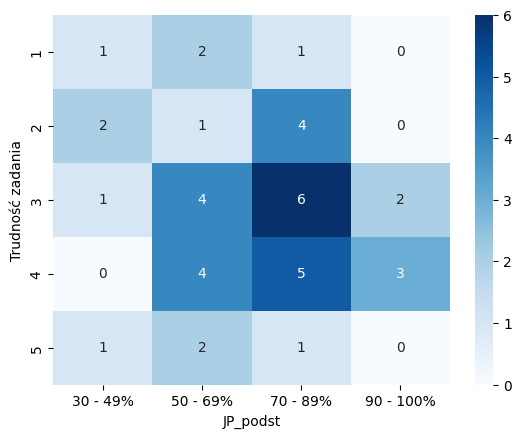

##############################################################
MAT_podst
-------------------------------------
1a
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1a_trud                                           
1                 0         1         2          4
2                 0         0         6          8
3                 0         2         3          9
4                 1         0         1          2
5                 0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 13.571428571428571
P-value: 0.32890857622005615
Brak podstaw do odrzucenia H0.


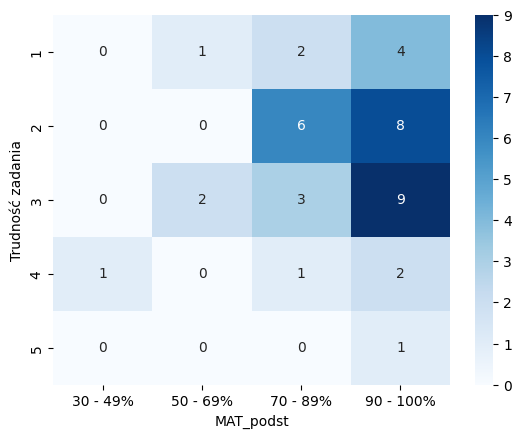

-------------------------------------
1b
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1b_trud                                           
1                 0         1         5          7
2                 0         2         5         12
3                 1         0         2          4
4                 0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 6.637748216695586
P-value: 0.6747765722476402
Brak podstaw do odrzucenia H0.


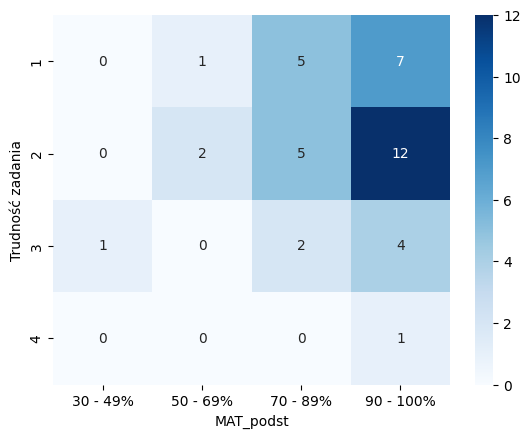

-------------------------------------
2a
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2a_trud                                           
1                 0         1         3          4
2                 0         1         3         11
3                 1         1         4          5
4                 0         0         2          3
5                 0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 5.901515151515151
P-value: 0.9209649198273945
Brak podstaw do odrzucenia H0.


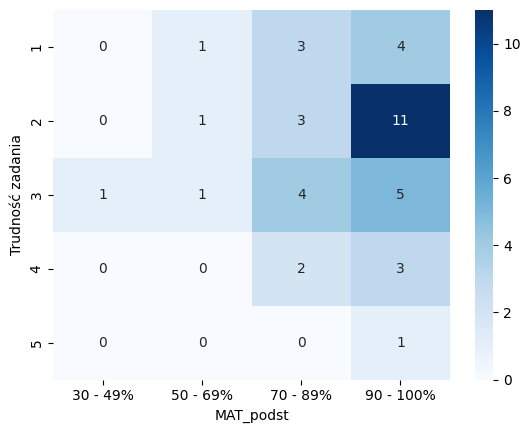

-------------------------------------
2b
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2b_trud                                           
1                 0         2         2          8
2                 0         0         8          7
3                 0         1         1          5
4                 1         0         1          3
5                 0         0         0          1
Chi2 test conducted...
Chi-squared test statistic value: 15.777777777777779
P-value: 0.20162756848265218
Brak podstaw do odrzucenia H0.


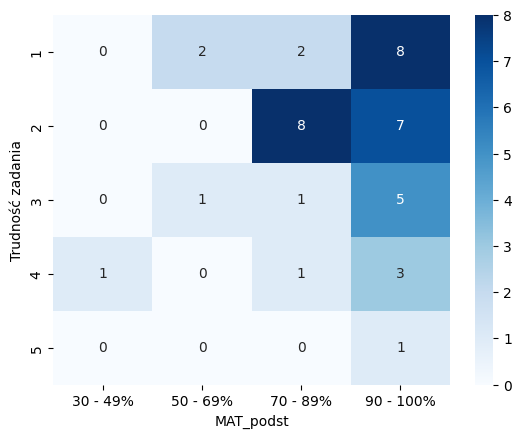

-------------------------------------
3a
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3a_trud                                           
1                 0         1         4          2
2                 1         1         3          8
3                 0         0         3          7
4                 0         1         1          7
5                 0         0         1          0
Chi2 test conducted...
Chi-squared test statistic value: 10.517501017501015
P-value: 0.5706569739743381
Brak podstaw do odrzucenia H0.


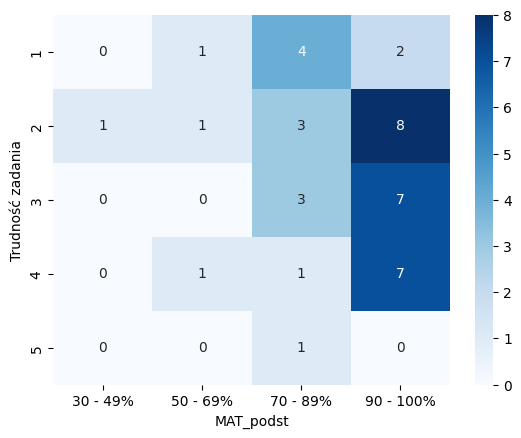

-------------------------------------
3b
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3b_trud                                           
1                 0         0         2          2
2                 0         0         3          4
3                 0         2         4          7
4                 1         0         1         10
5                 0         1         2          1
Chi2 test conducted...
Chi-squared test statistic value: 12.165750915750914
P-value: 0.43246151771240193
Brak podstaw do odrzucenia H0.


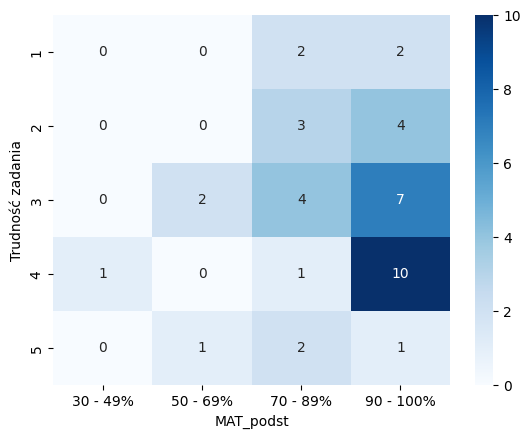

##############################################################
JP_roz
-------------------------------------
1a
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
1a_trud                                         
1               1         1       5            0
2               0         2      11            1
3               0         2      10            2
4               0         0       4            0
5               0         0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 7.6190476190476195
P-value: 0.8141473586407619
Brak podstaw do odrzucenia H0.


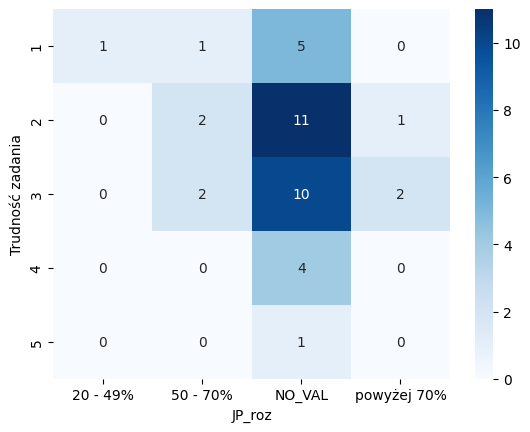

-------------------------------------
1b
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
1b_trud                                         
1               1         0      11            1
2               0         3      14            2
3               0         2       5            0
4               0         0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 6.489723066972642
P-value: 0.6900788542715195
Brak podstaw do odrzucenia H0.


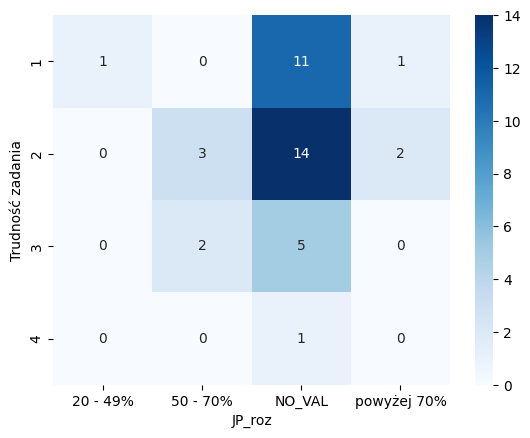

-------------------------------------
2a
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
2a_trud                                         
1               0         0       8            0
2               0         2      12            1
3               1         1       8            1
4               0         1       3            1
5               0         1       0            0
Chi2 test conducted...
Chi-squared test statistic value: 13.404235907461715
P-value: 0.34035621115883313
Brak podstaw do odrzucenia H0.


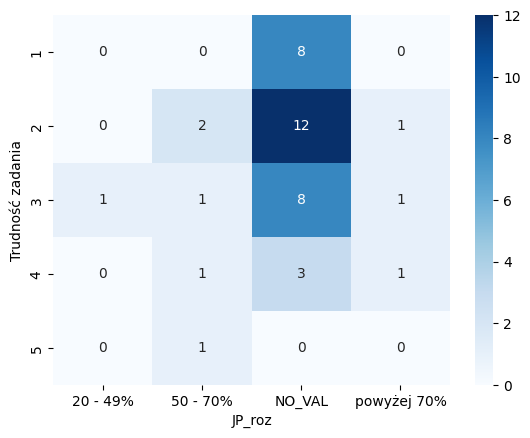

-------------------------------------
2b
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
2b_trud                                         
1               1         2       9            0
2               0         3      10            2
3               0         0       6            1
4               0         0       5            0
5               0         0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 7.9500256016385045
P-value: 0.7890234232817095
Brak podstaw do odrzucenia H0.


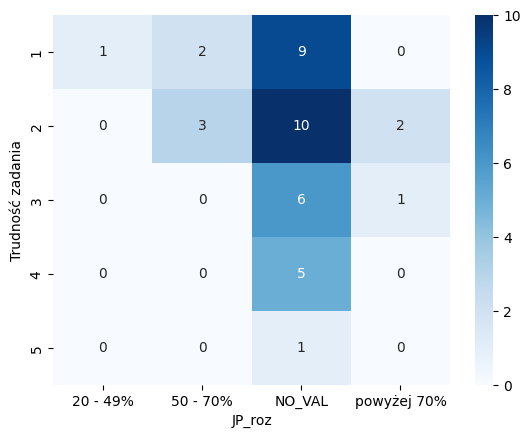

-------------------------------------
3a
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
3a_trud                                         
1               0         0       7            0
2               1         1       9            2
3               0         2       8            0
4               0         2       6            1
5               0         0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 7.813546549030421
P-value: 0.7995260723243849
Brak podstaw do odrzucenia H0.


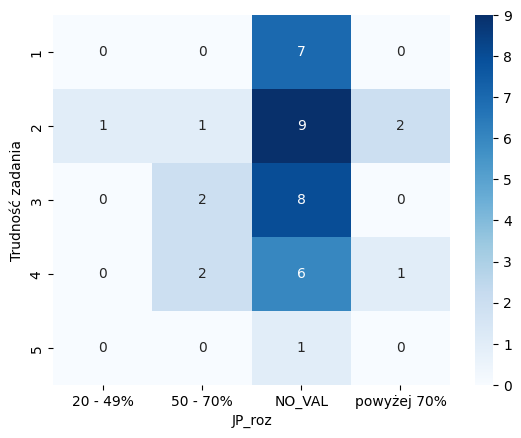

-------------------------------------
3b
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
3b_trud                                         
1               0         0       4            0
2               1         0       6            0
3               0         1      10            2
4               0         1      10            1
5               0         3       1            0
Chi2 test conducted...
Chi-squared test statistic value: 23.008074362913074
P-value: 0.027657471576403705
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


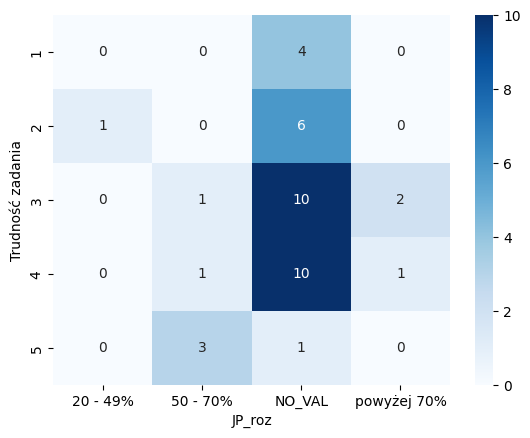

##############################################################
MAT_roz
-------------------------------------
1a
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
1a_trud                                                      
1               1         1       3            2            0
2               1         2       6            1            4
3               0         6       6            1            1
4               0         0       3            1            0
5               0         1       0            0            0
Chi2 test conducted...
Chi-squared test statistic value: 17.0
P-value: 0.3855971018271527
Brak podstaw do odrzucenia H0.


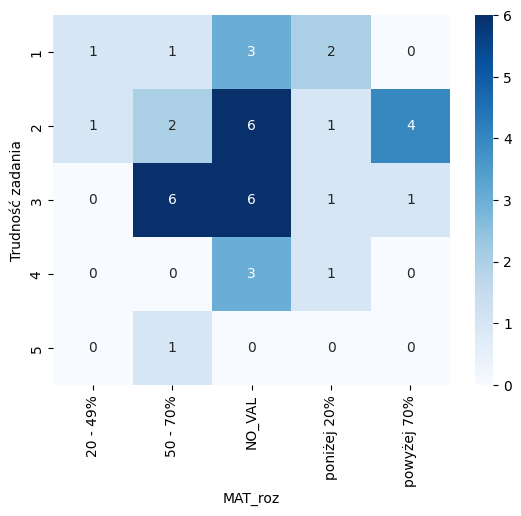

-------------------------------------
1b
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
1b_trud                                                      
1               0         4       5            4            0
2               2         5       9            1            2
3               0         1       4            0            2
4               0         0       0            0            1
Chi2 test conducted...
Chi-squared test statistic value: 18.317588843904634
P-value: 0.1063821988955968
Brak podstaw do odrzucenia H0.


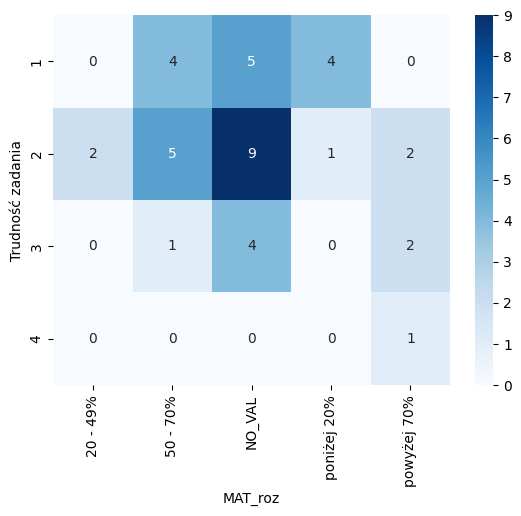

-------------------------------------
2a
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
2a_trud                                                      
1               0         2       3            2            1
2               1         3       7            1            3
3               1         2       6            2            0
4               0         3       1            0            1
5               0         0       1            0            0
Chi2 test conducted...
Chi-squared test statistic value: 10.747138047138048
P-value: 0.8248175963189575
Brak podstaw do odrzucenia H0.


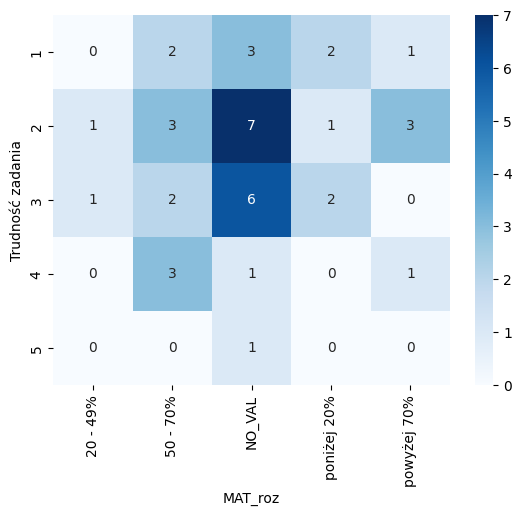

-------------------------------------
2b
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
2b_trud                                                      
1               1         2       4            2            3
2               1         2       9            2            1
3               0         4       2            1            0
4               0         2       3            0            0
5               0         0       0            0            1
Chi2 test conducted...
Chi-squared test statistic value: 18.45185185185185
P-value: 0.2981091207412982
Brak podstaw do odrzucenia H0.


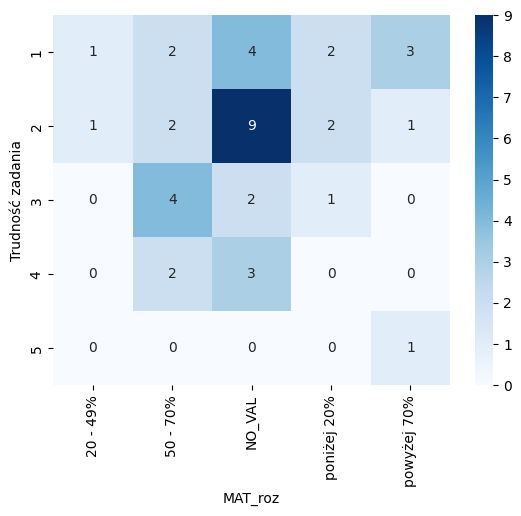

-------------------------------------
3a
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
3a_trud                                                      
1               0         2       3            1            1
2               1         1       7            3            1
3               1         4       5            0            0
4               0         3       2            1            3
5               0         0       1            0            0
Chi2 test conducted...
Chi-squared test statistic value: 13.858960792294125
P-value: 0.6092202021921131
Brak podstaw do odrzucenia H0.


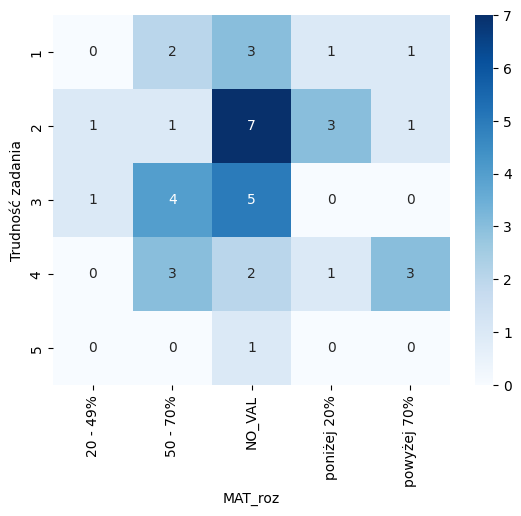

-------------------------------------
3b
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
3b_trud                                                      
1               0         2       0            1            1
2               0         1       4            2            0
3               1         1       8            1            2
4               1         6       4            0            1
5               0         0       2            1            1
Chi2 test conducted...
Chi-squared test statistic value: 17.603988603988604
P-value: 0.3475906983100418
Brak podstaw do odrzucenia H0.


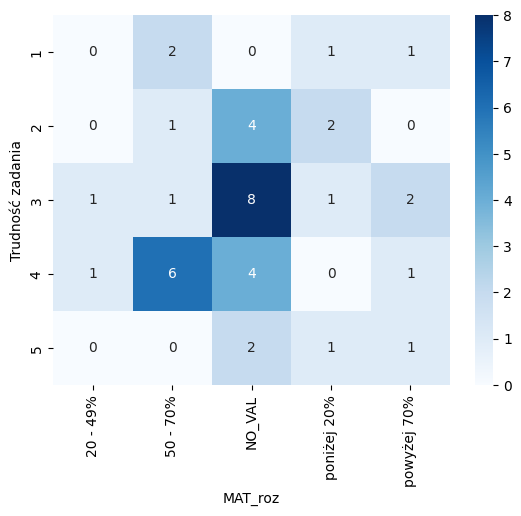

##############################################################
FIZ_roz
-------------------------------------
1a
FIZ_roz  NO_VAL
1a_trud        
1             7
2            14
3            14
4             4
5             1
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


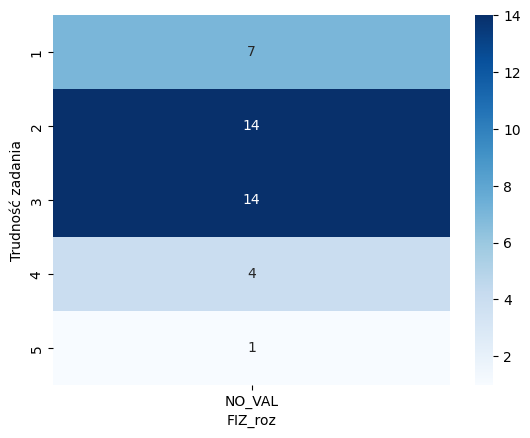

-------------------------------------
1b
FIZ_roz  NO_VAL
1b_trud        
1            13
2            19
3             7
4             1
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


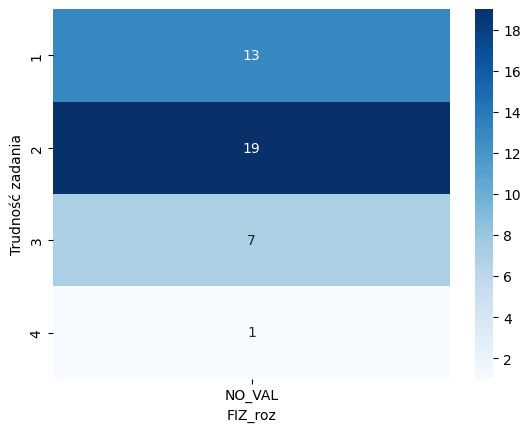

-------------------------------------
2a
FIZ_roz  NO_VAL
2a_trud        
1             8
2            15
3            11
4             5
5             1
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


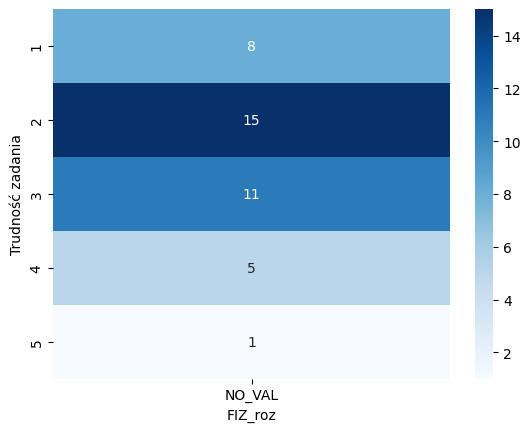

-------------------------------------
2b
FIZ_roz  NO_VAL
2b_trud        
1            12
2            15
3             7
4             5
5             1
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


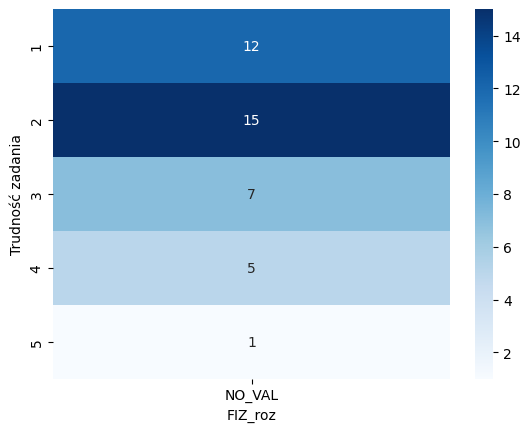

-------------------------------------
3a
FIZ_roz  NO_VAL
3a_trud        
1             7
2            13
3            10
4             9
5             1
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


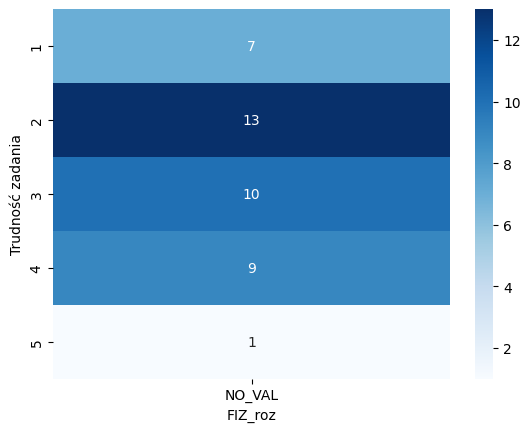

-------------------------------------
3b
FIZ_roz  NO_VAL
3b_trud        
1             4
2             7
3            13
4            12
5             4
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


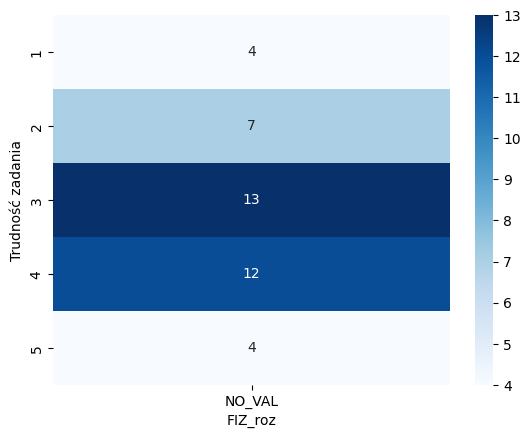

##############################################################
HIST_roz
-------------------------------------
1a
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
1a_trud                                
1                0       7            0
2                1      10            3
3                0      14            0
4                0       4            0
5                0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 8.253968253968253
P-value: 0.40906329927767676
Brak podstaw do odrzucenia H0.


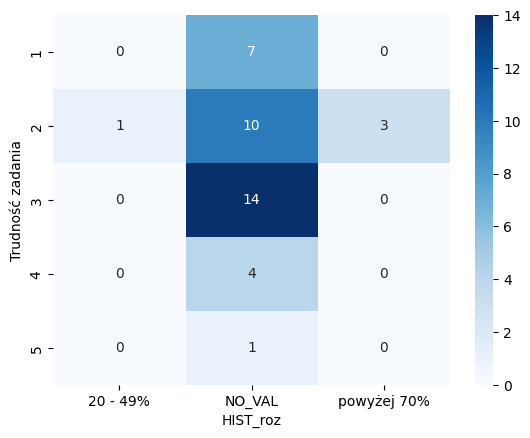

-------------------------------------
1b
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
1b_trud                                
1                0      13            0
2                0      16            3
3                1       6            0
4                0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 8.270676691729323
P-value: 0.2189359853605479
Brak podstaw do odrzucenia H0.


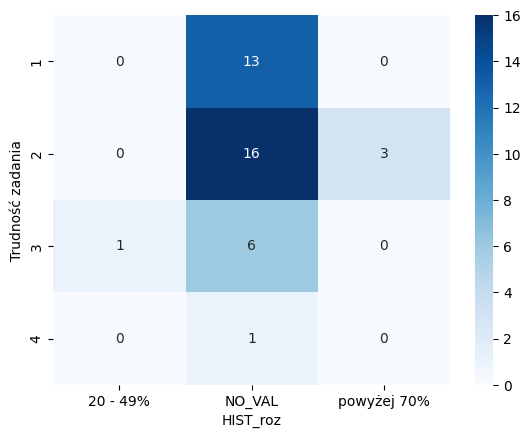

-------------------------------------
2a
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
2a_trud                                
1                0       7            1
2                0      13            2
3                0      11            0
4                1       4            0
5                0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 9.435185185185185
P-value: 0.30692360622141324
Brak podstaw do odrzucenia H0.


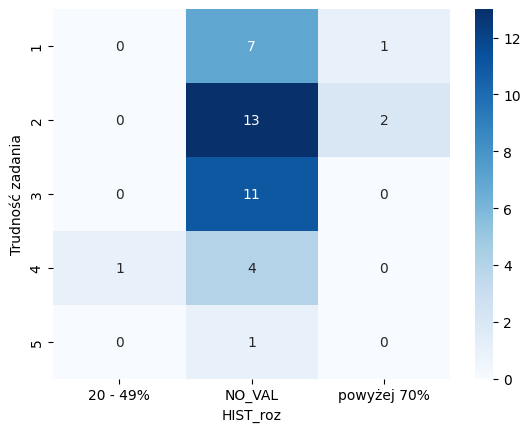

-------------------------------------
2b
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
2b_trud                                
1                0      11            1
2                1      12            2
3                0       7            0
4                0       5            0
5                0       1            0
Chi2 test conducted...
Chi-squared test statistic value: 3.648148148148148
P-value: 0.887392752911242
Brak podstaw do odrzucenia H0.


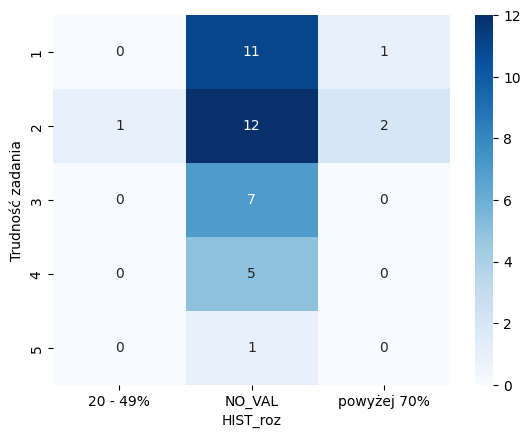

-------------------------------------
3a
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
3a_trud                                
1                0       7            0
2                0      13            0
3                0       9            1
4                1       7            1
5                0       0            1
Chi2 test conducted...
Chi-squared test statistic value: 17.8641975308642
P-value: 0.0222679828973898
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


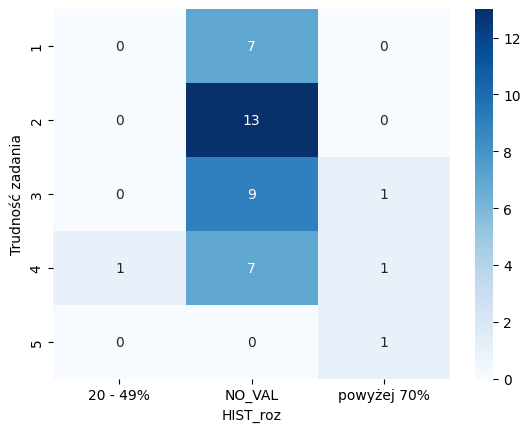

-------------------------------------
3b
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
3b_trud                                
1                0       4            0
2                0       7            0
3                0      11            2
4                0      11            1
5                1       3            0
Chi2 test conducted...
Chi-squared test statistic value: 11.481481481481481
P-value: 0.17588102274151585
Brak podstaw do odrzucenia H0.


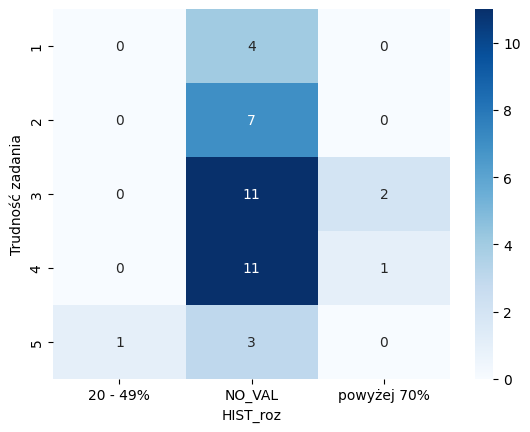

##############################################################
Samopocz
-------------------------------------
1a
Samopocz  2  3  4  5
1a_trud             
1         1  2  3  1
2         1  2  7  4
3         3  2  7  2
4         0  0  2  2
5         0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 6.476190476190476
P-value: 0.8902034844787502
Brak podstaw do odrzucenia H0.


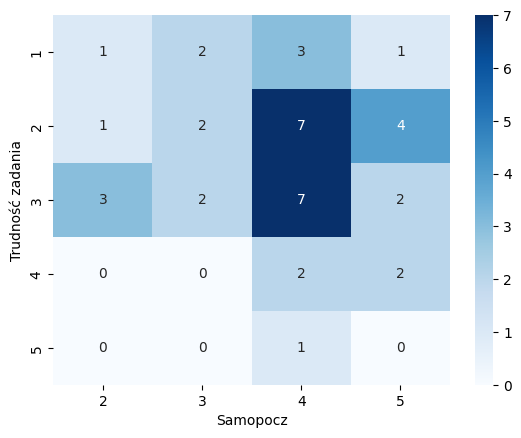

-------------------------------------
1b
Samopocz  2  3   4  5
1b_trud              
1         1  2   5  5
2         4  1  12  2
3         0  3   3  1
4         0  0   0  1
Chi2 test conducted...
Chi-squared test statistic value: 14.463337831758885
P-value: 0.10677166650129805
Brak podstaw do odrzucenia H0.


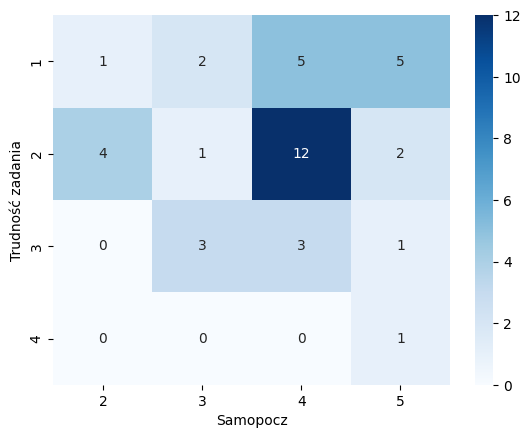

-------------------------------------
2a
Samopocz  2  3  4  5
2a_trud             
1         1  0  6  1
2         1  1  9  4
3         2  2  3  4
4         1  2  2  0
5         0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 15.70841750841751
P-value: 0.20495900405872428
Brak podstaw do odrzucenia H0.


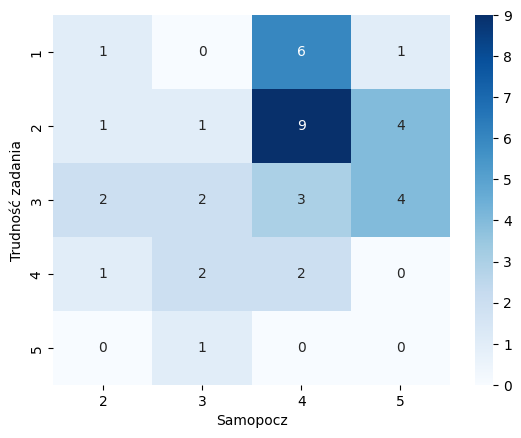

-------------------------------------
2b
Samopocz  2  3  4  5
2b_trud             
1         0  1  8  3
2         1  2  8  4
3         2  0  4  1
4         2  2  0  1
5         0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 19.20740740740741
P-value: 0.08364453562584634
Brak podstaw do odrzucenia H0.


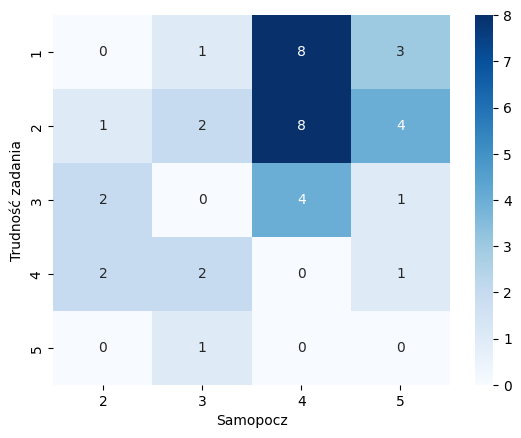

-------------------------------------
3a
Samopocz  2  3  4  5
3a_trud             
1         1  1  0  5
2         3  2  4  4
3         0  1  9  0
4         1  2  6  0
5         0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 24.20814000814001
P-value: 0.01905463454023167
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


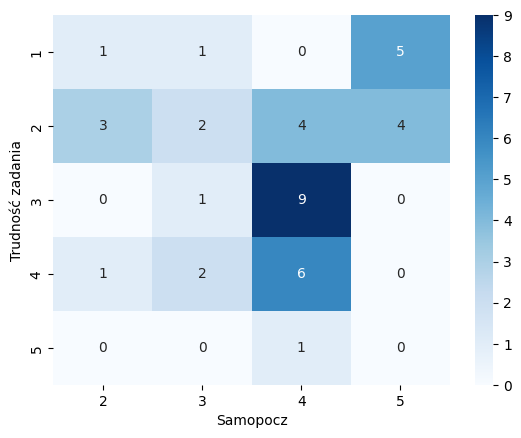

-------------------------------------
3b
Samopocz  2  3  4  5
3b_trud             
1         0  1  1  2
2         1  1  3  2
3         2  1  6  4
4         2  2  7  1
5         0  1  3  0
Chi2 test conducted...
Chi-squared test statistic value: 7.392958892958894
P-value: 0.8305909614588697
Brak podstaw do odrzucenia H0.


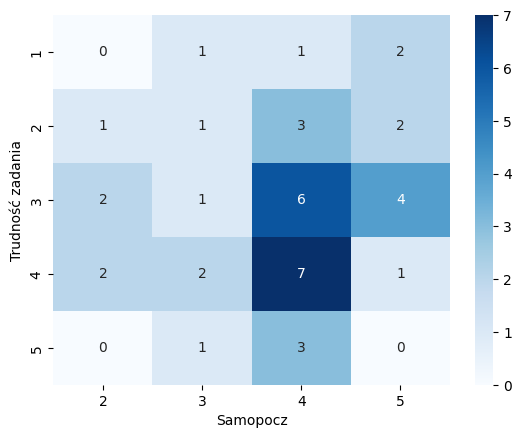

##############################################################
Stres
-------------------------------------
1a
Stres    1  2  3  4  5
1a_trud               
1        2  3  2  0  0
2        4  4  3  2  1
3        1  5  4  3  1
4        2  2  0  0  0
5        0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 9.714285714285715
P-value: 0.881116920274688
Brak podstaw do odrzucenia H0.


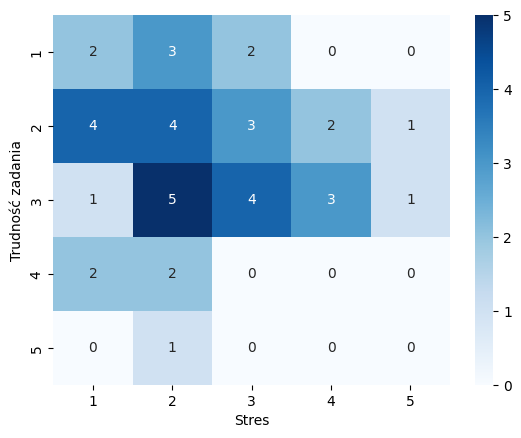

-------------------------------------
1b
Stres    1   2  3  4  5
1b_trud                
1        5   3  3  2  0
2        3  10  3  1  2
3        0   2  3  2  0
4        1   0  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 15.062785168048327
P-value: 0.23802085162542788
Brak podstaw do odrzucenia H0.


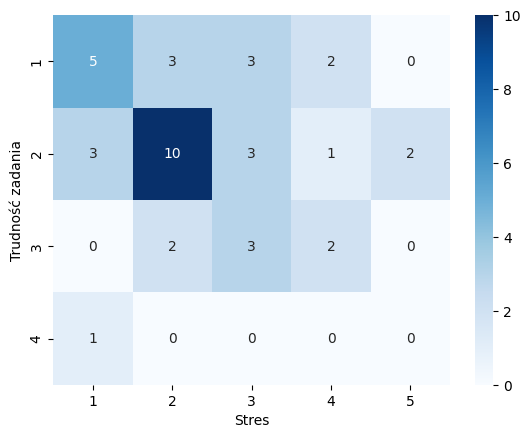

-------------------------------------
2a
Stres    1  2  3  4  5
2a_trud               
1        2  2  3  1  0
2        4  9  0  2  0
3        3  2  4  1  1
4        0  2  1  1  1
5        0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 17.512457912457915
P-value: 0.3532081401915226
Brak podstaw do odrzucenia H0.


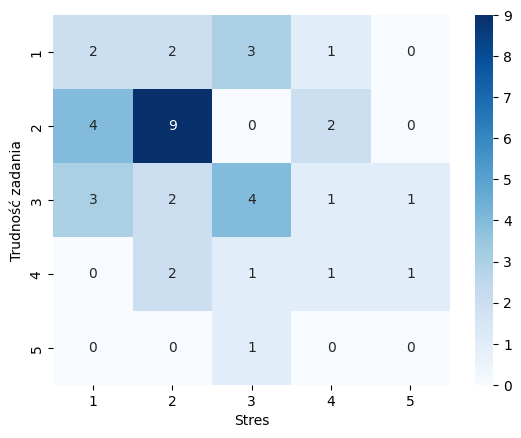

-------------------------------------
2b
Stres    1  2  3  4  5
2b_trud               
1        5  3  4  0  0
2        3  8  2  1  1
3        1  3  3  0  0
4        0  1  0  3  1
5        0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 30.992592592592594
P-value: 0.01348558533431582
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


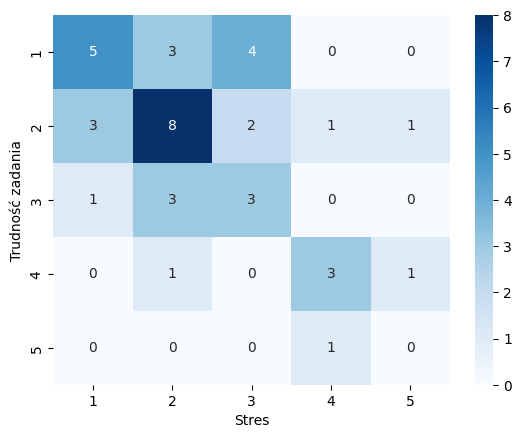

-------------------------------------
3a
Stres    1  2  3  4  5
3a_trud               
1        3  1  1  1  1
2        3  5  3  1  1
3        2  5  2  1  0
4        1  3  3  2  0
5        0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 9.015438882105551
P-value: 0.9127763693246479
Brak podstaw do odrzucenia H0.


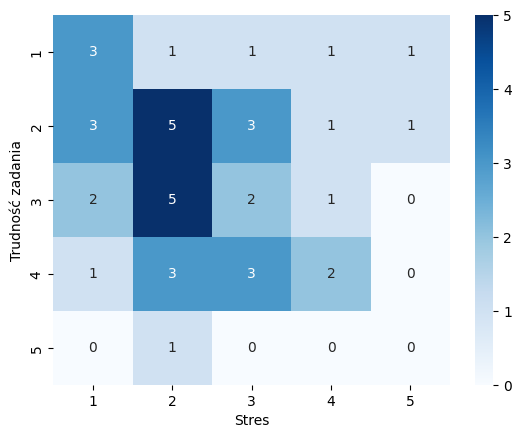

-------------------------------------
3b
Stres    1  2  3  4  5
3b_trud               
1        1  0  2  1  0
2        2  2  2  1  0
3        2  7  1  1  2
4        3  6  1  2  0
5        1  0  3  0  0
Chi2 test conducted...
Chi-squared test statistic value: 19.312983312983313
P-value: 0.2527674148019646
Brak podstaw do odrzucenia H0.


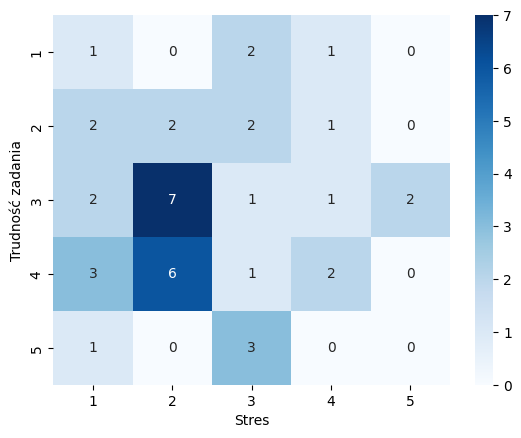

##############################################################
Zmęcz
-------------------------------------
1a
Zmęcz    1  2  3  4  5
1a_trud               
1        1  4  1  0  1
2        4  4  2  2  2
3        1  2  6  5  0
4        0  2  1  1  0
5        0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 18.238095238095237
P-value: 0.31014014753489255
Brak podstaw do odrzucenia H0.


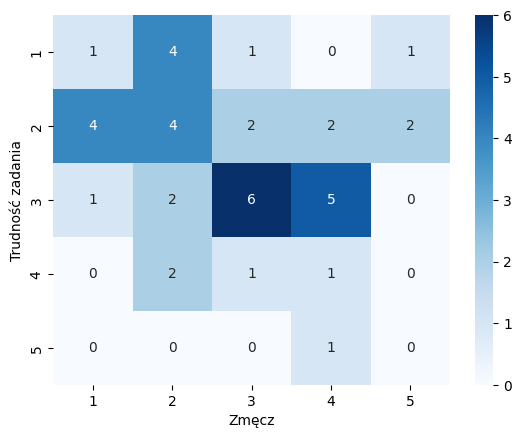

-------------------------------------
1b
Zmęcz    1  2  3  4  5
1b_trud               
1        3  4  3  2  1
2        2  5  7  4  1
3        0  3  0  3  1
4        1  0  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 13.001478054109633
P-value: 0.3689332611867467
Brak podstaw do odrzucenia H0.


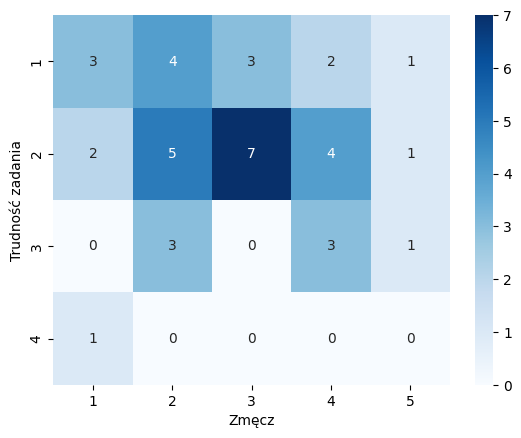

-------------------------------------
2a
Zmęcz    1  2  3  4  5
2a_trud               
1        0  2  4  1  1
2        4  4  3  4  0
3        2  5  2  1  1
4        0  1  1  2  1
5        0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 14.900336700336698
P-value: 0.5319498177510689
Brak podstaw do odrzucenia H0.


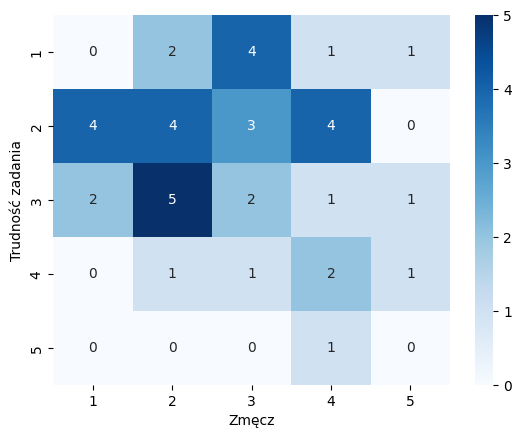

-------------------------------------
2b
Zmęcz    1  2  3  4  5
2b_trud               
1        2  4  3  3  0
2        3  6  3  1  2
3        1  2  3  1  0
4        0  0  1  3  1
5        0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 15.797883597883597
P-value: 0.4671539797656754
Brak podstaw do odrzucenia H0.


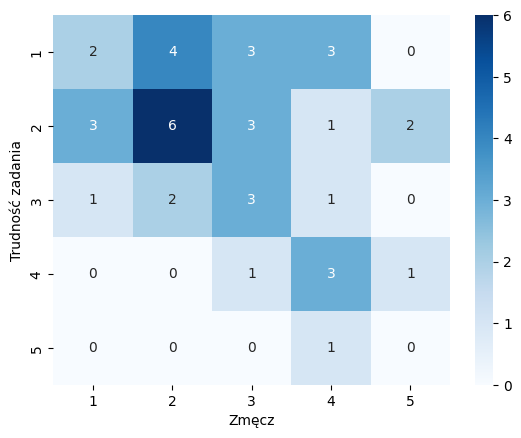

-------------------------------------
3a
Zmęcz    1  2  3  4  5
3a_trud               
1        2  2  1  2  0
2        3  4  4  1  1
3        1  5  2  1  1
4        0  1  3  5  0
5        0  0  0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 26.261104327770997
P-value: 0.05046324304917202
Brak podstaw do odrzucenia H0.


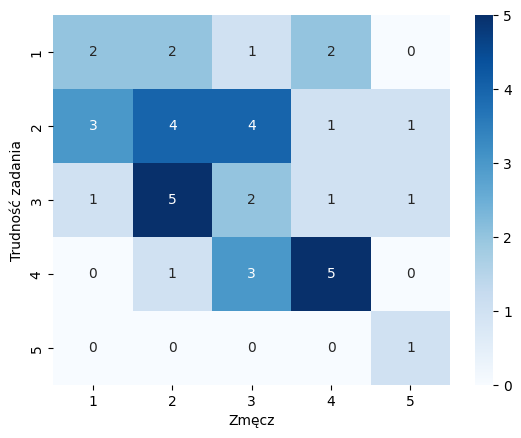

-------------------------------------
3b
Zmęcz    1  2  3  4  5
3b_trud               
1        0  1  2  1  0
2        3  2  1  0  1
3        3  5  3  1  1
4        0  3  4  4  1
5        0  1  0  3  0
Chi2 test conducted...
Chi-squared test statistic value: 19.762922262922263
P-value: 0.23108886028395975
Brak podstaw do odrzucenia H0.


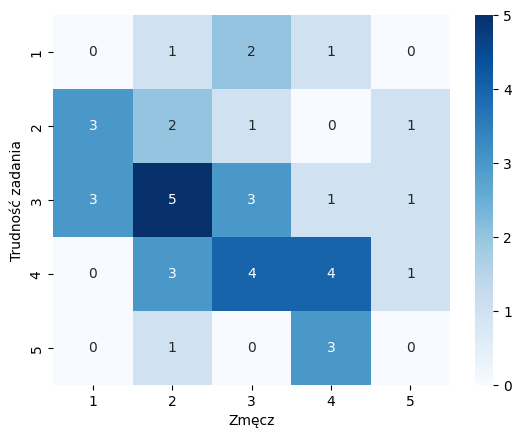

##############################################################
Czyt_map
-------------------------------------
1a
Czyt_map  3  4  5
1a_trud          
1         2  4  1
2         2  9  3
3         1  8  5
4         0  4  0
5         0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 8.342857142857143
P-value: 0.4007153380305086
Brak podstaw do odrzucenia H0.


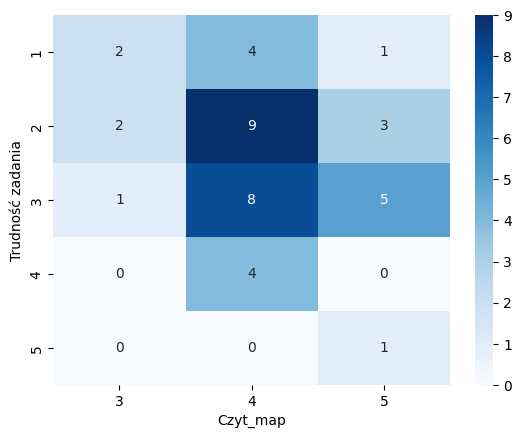

-------------------------------------
1b
Czyt_map  3   4  5
1b_trud           
1         4   5  4
2         0  14  5
3         1   5  1
4         0   1  0
Chi2 test conducted...
Chi-squared test statistic value: 8.643146327356854
P-value: 0.19466410050877528
Brak podstaw do odrzucenia H0.


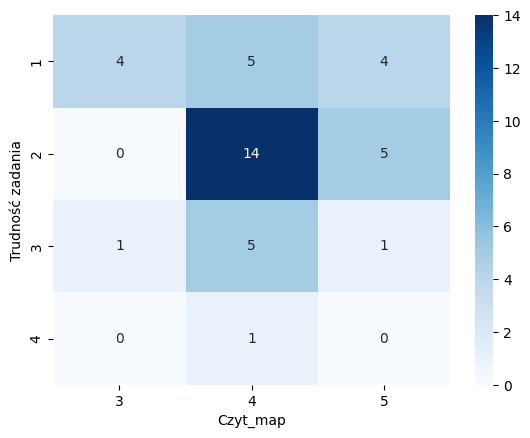

-------------------------------------
2a
Czyt_map  3   4  5
2a_trud           
1         1   5  2
2         1  10  4
3         2   6  3
4         1   3  1
5         0   1  0
Chi2 test conducted...
Chi-squared test statistic value: 1.7648484848484849
P-value: 0.9873917664674815
Brak podstaw do odrzucenia H0.


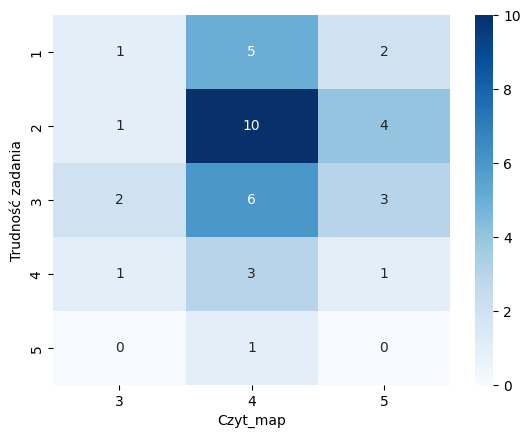

-------------------------------------
2b
Czyt_map  3   4  5
2b_trud           
1         1   7  4
2         2  12  1
3         2   2  3
4         0   4  1
5         0   0  1
Chi2 test conducted...
Chi-squared test statistic value: 10.841904761904763
P-value: 0.21081901305930895
Brak podstaw do odrzucenia H0.


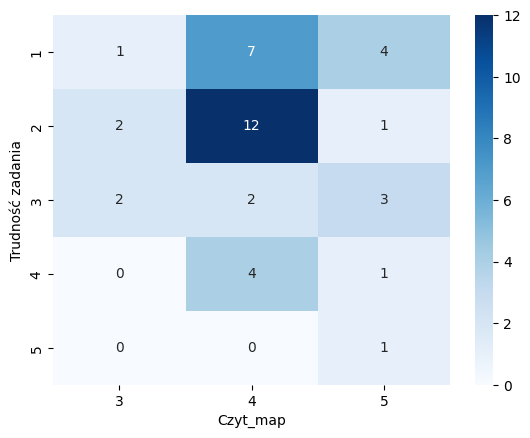

-------------------------------------
3a
Czyt_map  3  4  5
3a_trud          
1         0  3  4
2         2  9  2
3         1  7  2
4         2  5  2
5         0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 6.479316239316239
P-value: 0.5937027979308585
Brak podstaw do odrzucenia H0.


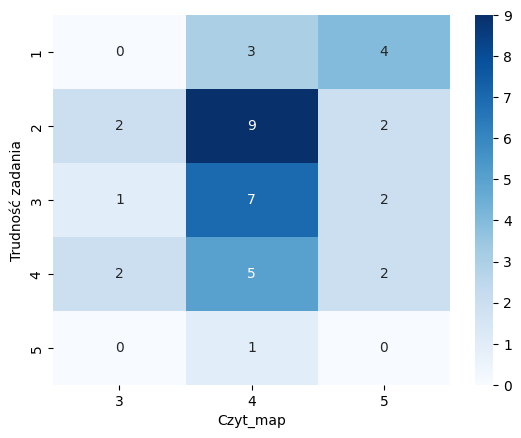

-------------------------------------
3b
Czyt_map  3   4  5
3b_trud           
1         0   2  2
2         2   3  2
3         1  10  2
4         1   8  3
5         1   2  1
Chi2 test conducted...
Chi-squared test statistic value: 5.468131868131868
P-value: 0.7065681018599256
Brak podstaw do odrzucenia H0.


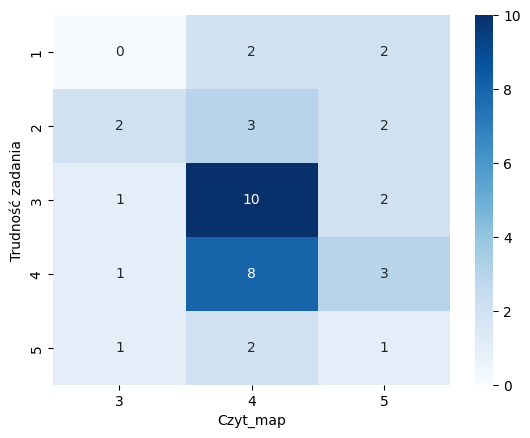

##############################################################
Podziel_uwg
-------------------------------------
1a
Podziel_uwg  1  2  3  4  5
1a_trud                   
1            0  3  1  2  1
2            2  1  5  3  3
3            0  2  5  4  3
4            0  0  3  0  1
5            0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 16.726190476190478
P-value: 0.40352547455225946
Brak podstaw do odrzucenia H0.


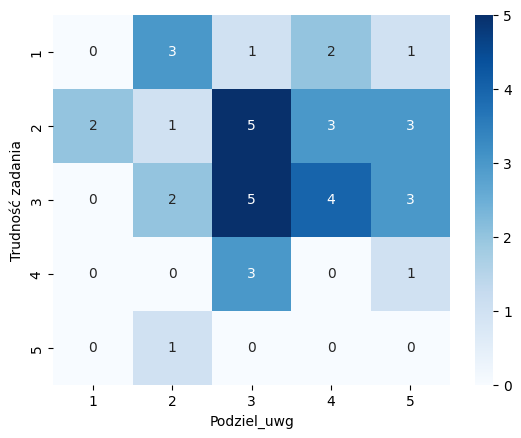

-------------------------------------
1b
Podziel_uwg  1  2  3  4  5
1b_trud                   
1            0  3  4  4  2
2            1  2  5  5  6
3            1  1  5  0  0
4            0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 15.409586236653904
P-value: 0.21979775501860496
Brak podstaw do odrzucenia H0.


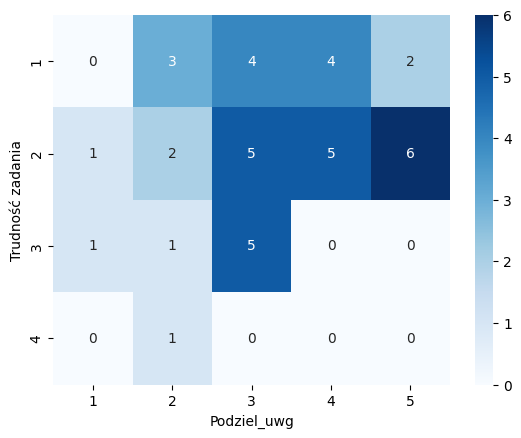

-------------------------------------
2a
Podziel_uwg  1  2  3  4  5
2a_trud                   
1            1  1  3  0  3
2            0  4  2  6  3
3            0  1  7  2  1
4            1  1  1  1  1
5            0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 18.35515873015873
P-value: 0.3035136448610138
Brak podstaw do odrzucenia H0.


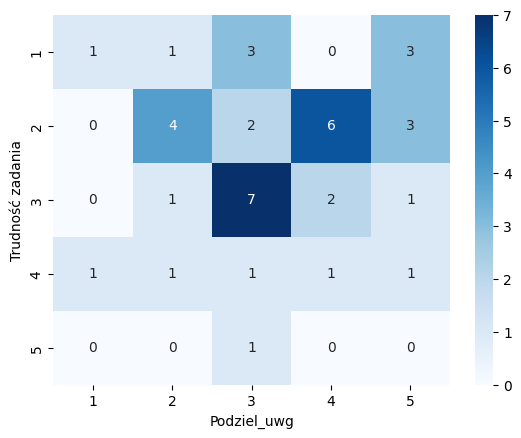

-------------------------------------
2b
Podziel_uwg  1  2  3  4  5
2b_trud                   
1            0  2  3  5  2
2            2  4  4  2  3
3            0  1  2  1  3
4            0  0  4  1  0
5            0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 16.036281179138324
P-value: 0.4504315114345004
Brak podstaw do odrzucenia H0.


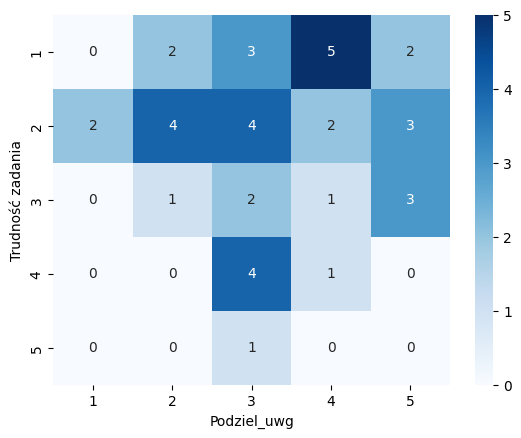

-------------------------------------
3a
Podziel_uwg  1  2  3  4  5
3a_trud                   
1            0  1  4  2  0
2            0  3  4  4  2
3            0  2  2  2  4
4            1  1  4  1  2
5            1  0  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 28.226602321840414
P-value: 0.029704071209318512
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


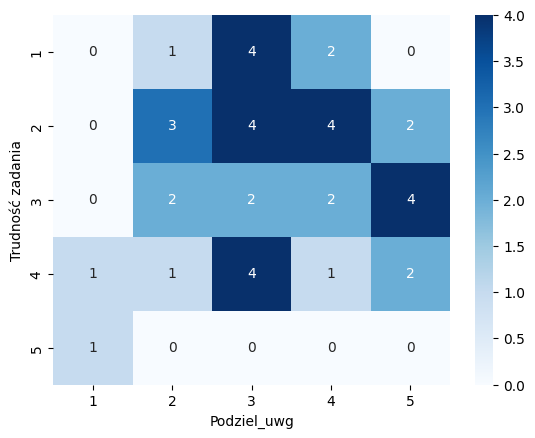

-------------------------------------
3b
Podziel_uwg  1  2  3  4  5
3b_trud                   
1            0  0  2  1  1
2            0  3  1  3  0
3            0  3  4  2  4
4            1  1  5  2  3
5            1  0  2  1  0
Chi2 test conducted...
Chi-squared test statistic value: 15.97651026222455
P-value: 0.4546014348897328
Brak podstaw do odrzucenia H0.


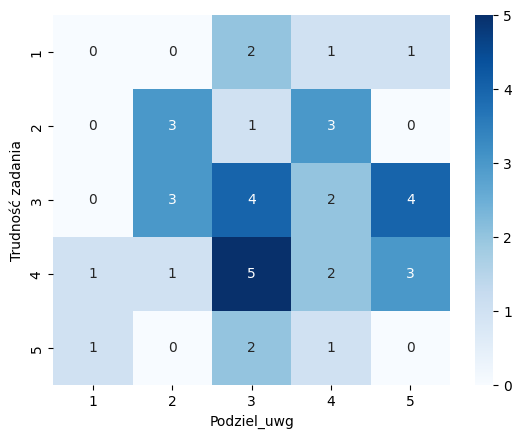

##############################################################
Analit_myśl
-------------------------------------
1a
Analit_myśl  2  3  4  5
1a_trud                
1            1  3  2  1
2            0  5  6  3
3            0  1  8  5
4            0  2  2  0
5            0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 12.65892002734108
P-value: 0.39431134919166877
Brak podstaw do odrzucenia H0.


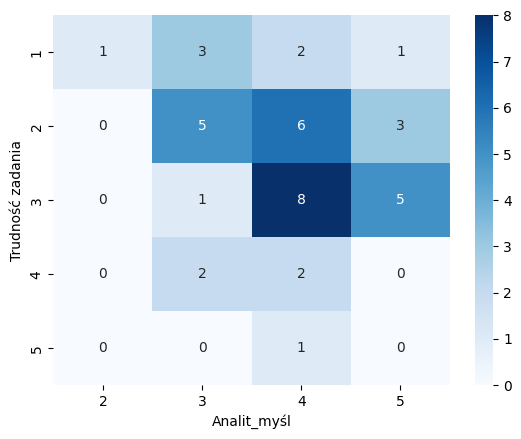

-------------------------------------
1b
Analit_myśl  2  3  4  5
1b_trud                
1            1  2  8  2
2            0  4  9  6
3            0  4  2  1
4            0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 10.172000975325075
P-value: 0.3367411519550436
Brak podstaw do odrzucenia H0.


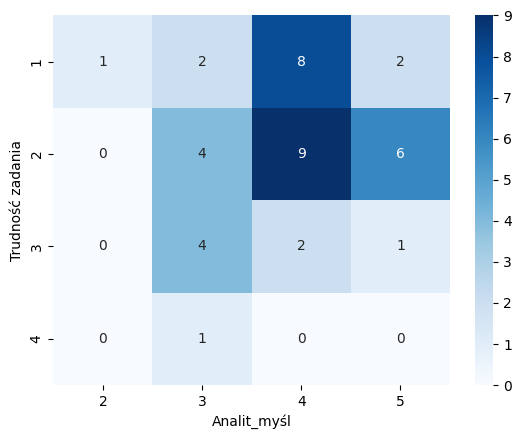

-------------------------------------
2a
Analit_myśl  2  3  4  5
2a_trud                
1            0  1  3  4
2            0  4  7  4
3            1  5  5  0
4            0  1  3  1
5            0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 11.404990897813867
P-value: 0.4945662746989473
Brak podstaw do odrzucenia H0.


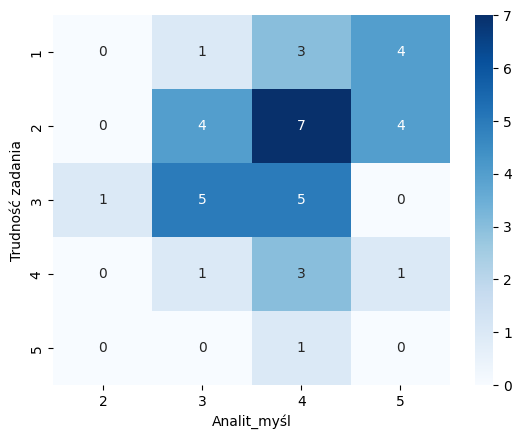

-------------------------------------
2b
Analit_myśl  2  3  4  5
2b_trud                
1            1  4  6  1
2            0  4  8  3
3            0  2  2  3
4            0  1  3  1
5            0  0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 9.241183767499557
P-value: 0.6822037528110961
Brak podstaw do odrzucenia H0.


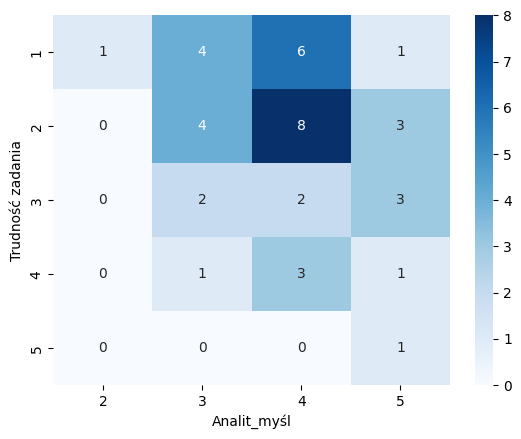

-------------------------------------
3a
Analit_myśl  2  3  4  5
3a_trud                
1            0  2  4  1
2            1  5  6  1
3            0  2  5  3
4            0  2  4  3
5            0  0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 8.73208662682347
P-value: 0.7256274250625137
Brak podstaw do odrzucenia H0.


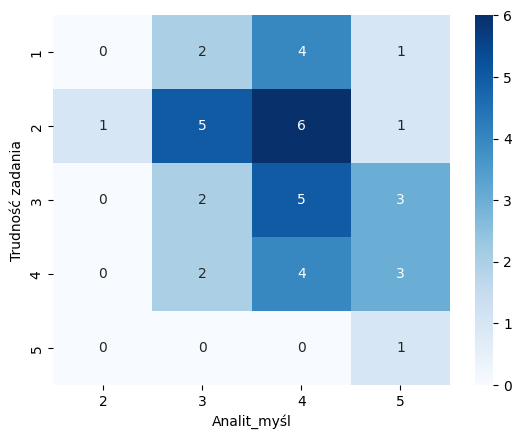

-------------------------------------
3b
Analit_myśl  2  3  4  5
3b_trud                
1            0  0  3  1
2            0  2  5  0
3            1  4  6  2
4            0  4  3  5
5            0  1  2  1
Chi2 test conducted...
Chi-squared test statistic value: 10.006757375178427
P-value: 0.6153678056340299
Brak podstaw do odrzucenia H0.


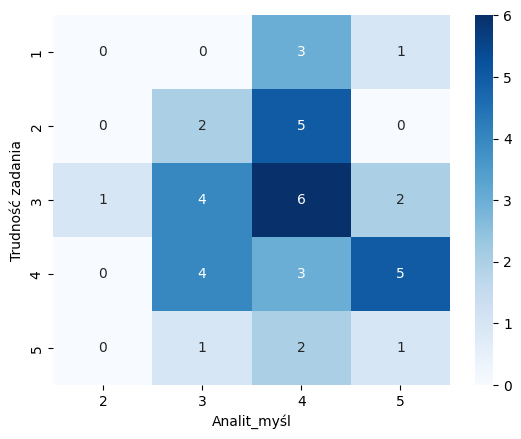

##############################################################
Spostrzeg
-------------------------------------
1a
Spostrzeg  2  3  4  5
1a_trud              
1          0  3  3  1
2          1  2  8  3
3          2  4  5  3
4          0  2  1  1
5          1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 14.042207792207792
P-value: 0.29802108682348066
Brak podstaw do odrzucenia H0.


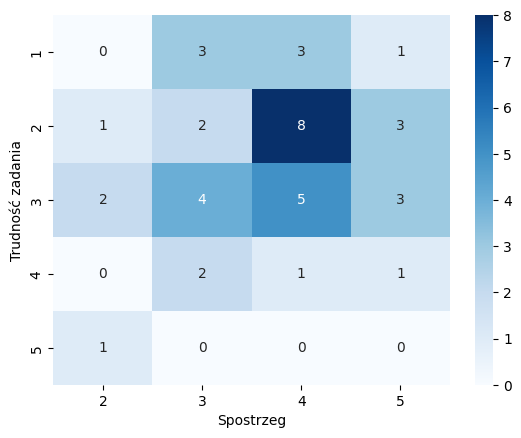

-------------------------------------
1b
Spostrzeg  2  3  4  5
1b_trud              
1          1  2  5  5
2          2  6  8  3
3          1  3  3  0
4          0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 6.799763703788472
P-value: 0.6579578734738867
Brak podstaw do odrzucenia H0.


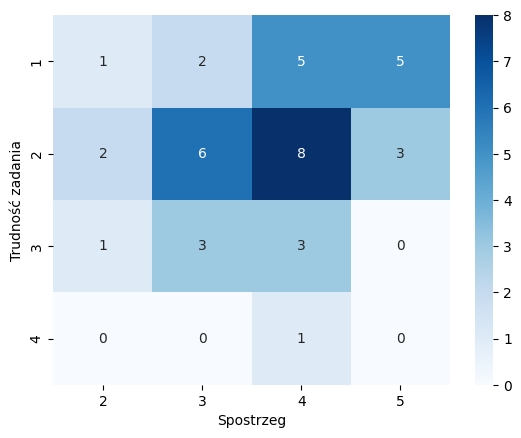

-------------------------------------
2a
Spostrzeg  2  3  4  5
2a_trud              
1          2  3  1  2
2          1  4  8  2
3          0  3  6  2
4          0  1  2  2
5          1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 16.906579160589853
P-value: 0.15314541355568878
Brak podstaw do odrzucenia H0.


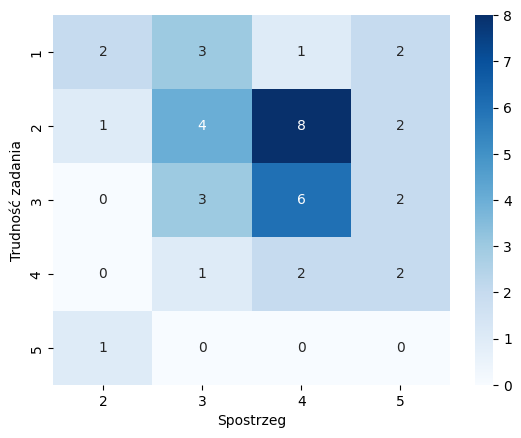

-------------------------------------
2b
Spostrzeg  2  3  4  5
2b_trud              
1          1  4  5  2
2          3  3  6  3
3          0  1  5  1
4          0  3  0  2
5          0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 11.614845938375348
P-value: 0.4770861013810179
Brak podstaw do odrzucenia H0.


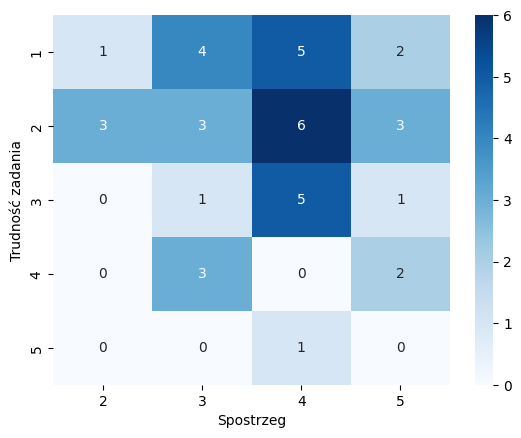

-------------------------------------
3a
Spostrzeg  2  3  4  5
3a_trud              
1          0  0  3  4
2          0  5  5  3
3          1  3  5  1
4          2  3  4  0
5          1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 22.352108675638085
P-value: 0.033757854478293145
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


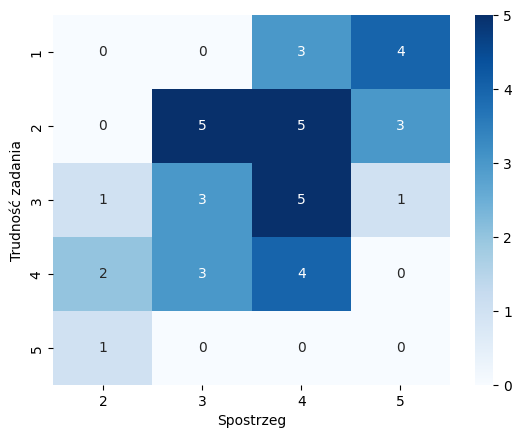

-------------------------------------
3b
Spostrzeg  2  3  4  5
3b_trud              
1          0  1  1  2
2          1  2  1  3
3          0  3  8  2
4          2  4  5  1
5          1  1  2  0
Chi2 test conducted...
Chi-squared test statistic value: 11.670657773598952
P-value: 0.4724787636447644
Brak podstaw do odrzucenia H0.


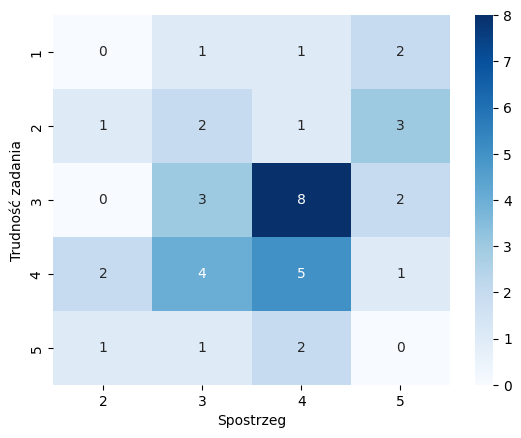

##############################################################
Czyt_ze_zroz
-------------------------------------
1a
Czyt_ze_zroz  1  2  3  4  5
1a_trud                    
1             0  2  1  3  1
2             1  3  5  4  1
3             1  0  0  8  5
4             0  2  0  1  1
5             0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 19.029111644657863
P-value: 0.2671564318940565
Brak podstaw do odrzucenia H0.


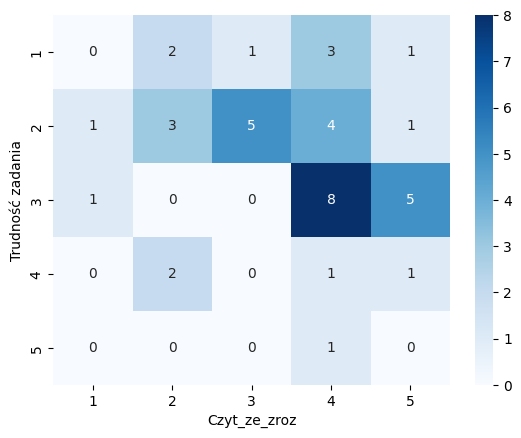

-------------------------------------
1b
Czyt_ze_zroz  1  2  3   4  5
1b_trud                     
1             0  4  2   4  3
2             0  2  2  11  4
3             1  1  2   2  1
4             1  0  0   0  0
Chi2 test conducted...
Chi-squared test statistic value: 26.785094604643476
P-value: 0.008296677621928816
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


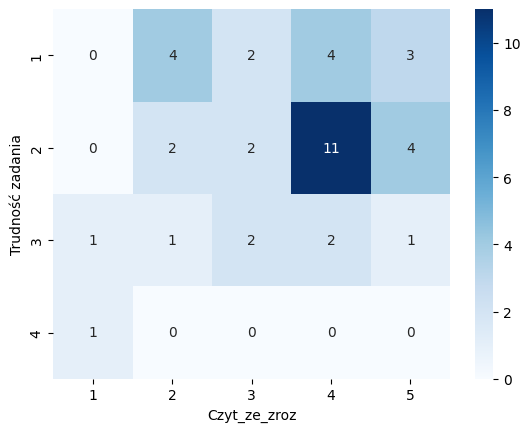

-------------------------------------
2a
Czyt_ze_zroz  1  2  3  4  5
2a_trud                    
1             0  2  0  4  2
2             1  2  2  7  3
3             0  1  4  4  2
4             0  2  0  2  1
5             1  0  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 28.295093795093795
P-value: 0.029146241277036862
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


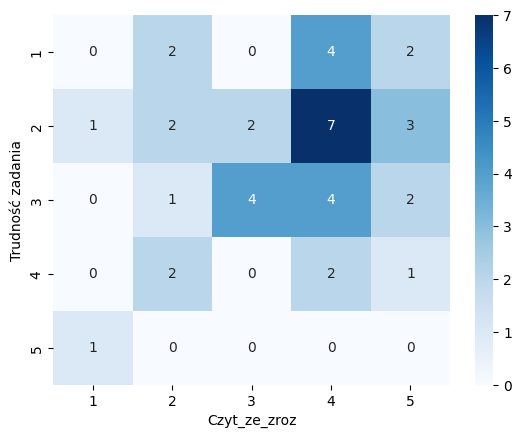

-------------------------------------
2b
Czyt_ze_zroz  1  2  3  4  5
2b_trud                    
1             1  1  1  8  1
2             1  6  2  5  1
3             0  0  2  2  3
4             0  0  1  1  3
5             0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 21.48389355742297
P-value: 0.16065117889021685
Brak podstaw do odrzucenia H0.


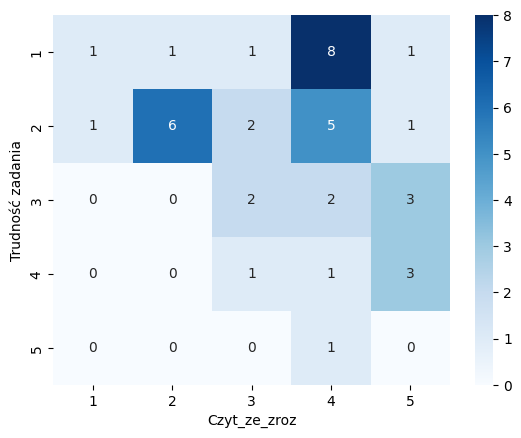

-------------------------------------
3a
Czyt_ze_zroz  1  2  3  4  5
3a_trud                    
1             1  2  0  3  1
2             0  1  4  4  4
3             0  3  2  4  1
4             1  1  0  5  2
5             0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 13.598890838386634
P-value: 0.6285680156097482
Brak podstaw do odrzucenia H0.


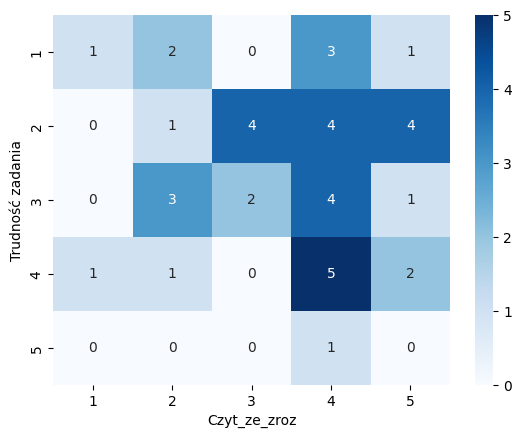

-------------------------------------
3b
Czyt_ze_zroz  1  2  3  4  5
3b_trud                    
1             0  1  0  2  1
2             0  3  2  2  0
3             1  1  3  5  3
4             0  1  1  6  4
5             1  1  0  2  0
Chi2 test conducted...
Chi-squared test statistic value: 15.65109377084167
P-value: 0.47756568786786746
Brak podstaw do odrzucenia H0.


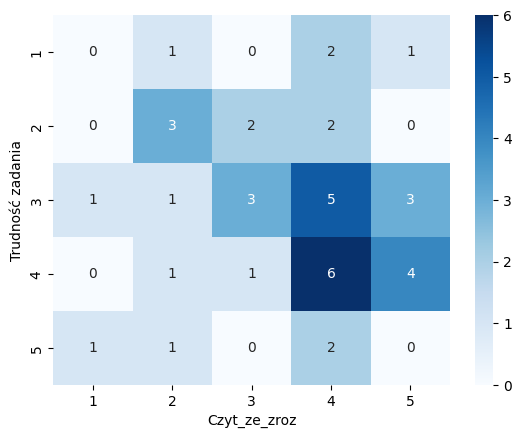

##############################################################
Wzrokowiec
-------------------------------------
1a
Wzrokowiec  2  3  4  5
1a_trud               
1           0  3  3  1
2           1  3  1  9
3           0  1  9  4
4           0  2  2  0
5           1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 36.68027210884354
P-value: 0.0002516895984298529
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


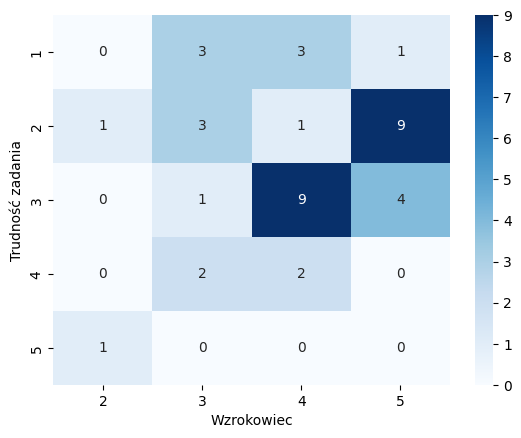

-------------------------------------
1b
Wzrokowiec  2  3  4  5
1b_trud               
1           0  3  4  6
2           1  4  9  5
3           1  2  2  2
4           0  0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 5.604634296363621
P-value: 0.7787426098675406
Brak podstaw do odrzucenia H0.


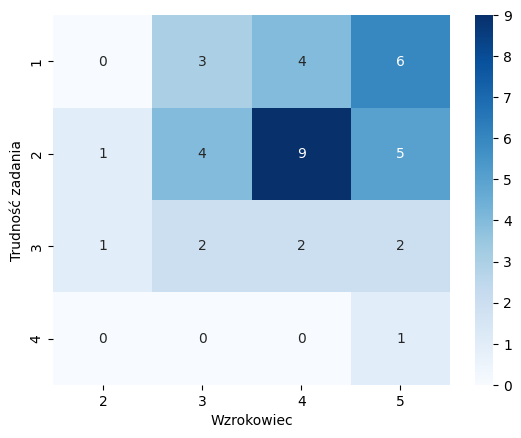

-------------------------------------
2a
Wzrokowiec  2  3  4  5
2a_trud               
1           0  2  4  2
2           1  3  5  6
3           0  4  2  5
4           1  0  3  1
5           0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 10.251659451659451
P-value: 0.5938931466281581
Brak podstaw do odrzucenia H0.


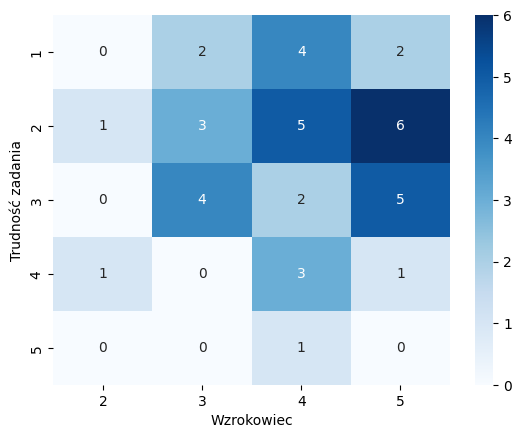

-------------------------------------
2b
Wzrokowiec  2  3  4  5
2b_trud               
1           1  3  4  4
2           1  4  6  4
3           0  1  3  3
4           0  1  2  2
5           0  0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 3.788813303099017
P-value: 0.9869526591193468
Brak podstaw do odrzucenia H0.


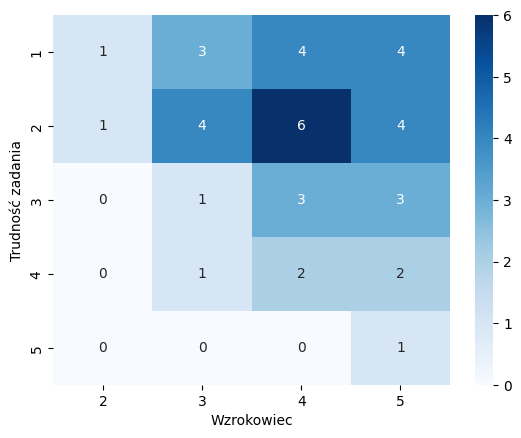

-------------------------------------
3a
Wzrokowiec  2  3  4  5
3a_trud               
1           0  1  1  5
2           0  4  4  5
3           0  3  6  1
4           2  1  4  2
5           0  0  0  1
Chi2 test conducted...
Chi-squared test statistic value: 17.602752097990198
P-value: 0.12829545544079013
Brak podstaw do odrzucenia H0.


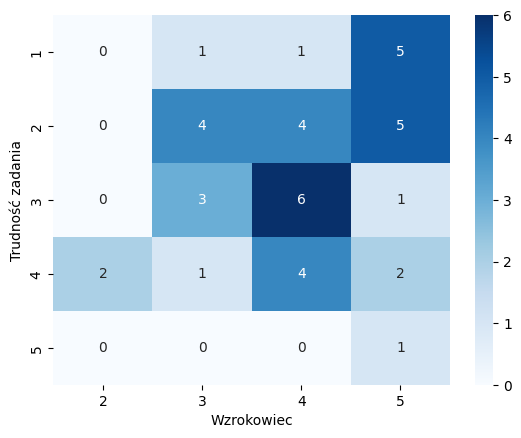

-------------------------------------
3b
Wzrokowiec  2  3  4  5
3b_trud               
1           0  1  1  2
2           0  1  3  3
3           0  3  6  4
4           1  3  3  5
5           1  1  2  0
Chi2 test conducted...
Chi-squared test statistic value: 8.080062794348509
P-value: 0.7788428527830623
Brak podstaw do odrzucenia H0.


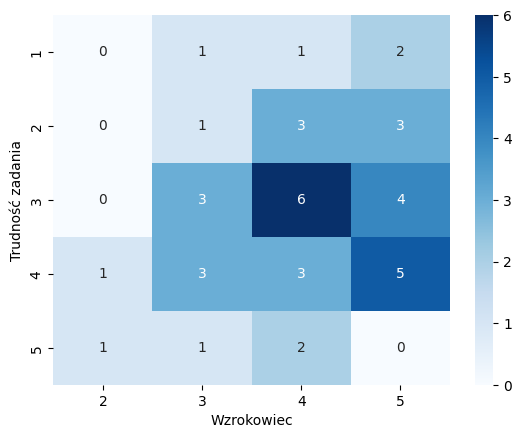

##############################################################
Słuchowiec
-------------------------------------
1a
Słuchowiec  1  2  3  4  5
1a_trud                  
1           0  1  3  3  0
2           1  5  4  2  2
3           3  1  6  1  3
4           0  1  2  0  1
5           0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 17.35204081632653
P-value: 0.3631778631488968
Brak podstaw do odrzucenia H0.


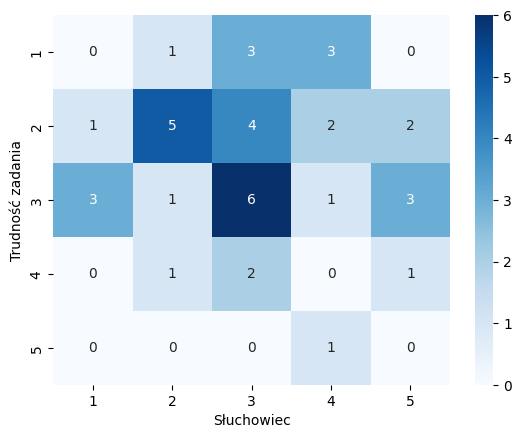

-------------------------------------
1b
Słuchowiec  1  2  3  4  5
1b_trud                  
1           2  3  5  3  0
2           2  3  7  3  4
3           0  1  3  1  2
4           0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 9.06309730369881
P-value: 0.697531841333334
Brak podstaw do odrzucenia H0.


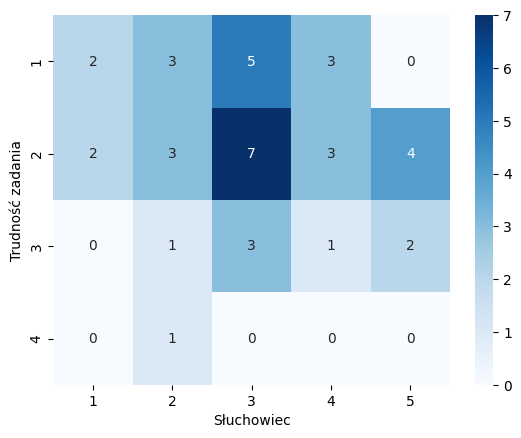

-------------------------------------
2a
Słuchowiec  1  2  3  4  5
2a_trud                  
1           1  2  4  0  1
2           1  3  4  5  2
3           1  3  4  2  1
4           1  0  2  0  2
5           0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 11.425468975468977
P-value: 0.7824934694722311
Brak podstaw do odrzucenia H0.


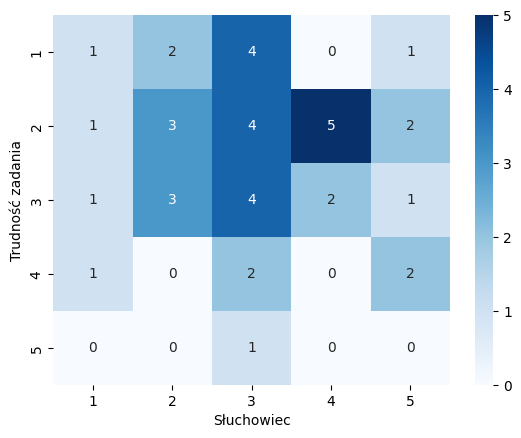

-------------------------------------
2b
Słuchowiec  1  2  3  4  5
2b_trud                  
1           1  1  5  5  0
2           2  3  6  2  2
3           1  2  2  0  2
4           0  2  1  0  2
5           0  0  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 16.23095238095238
P-value: 0.4369615127671917
Brak podstaw do odrzucenia H0.


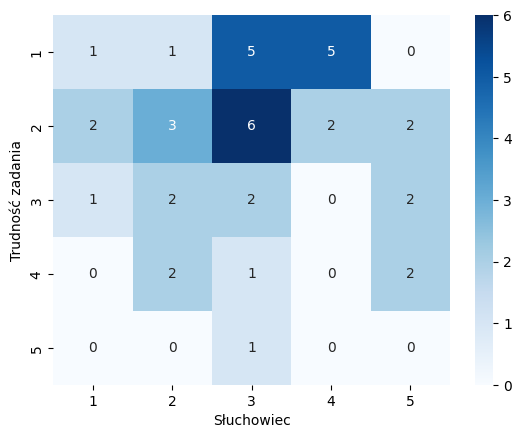

-------------------------------------
3a
Słuchowiec  1  2  3  4  5
3a_trud                  
1           1  2  2  0  2
2           0  3  5  4  1
3           1  0  6  1  2
4           2  2  2  2  1
5           0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 15.724949124949125
P-value: 0.47231669951908506
Brak podstaw do odrzucenia H0.


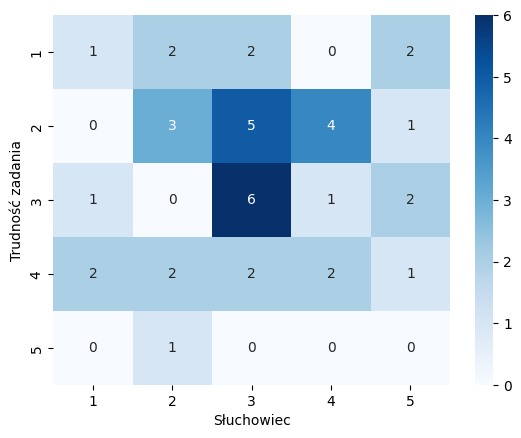

-------------------------------------
3b
Słuchowiec  1  2  3  4  5
3b_trud                  
1           0  1  3  0  0
2           1  1  3  2  0
3           0  3  3  3  4
4           2  3  5  1  1
5           1  0  1  1  1
Chi2 test conducted...
Chi-squared test statistic value: 13.488138845281703
P-value: 0.6367877063283978
Brak podstaw do odrzucenia H0.


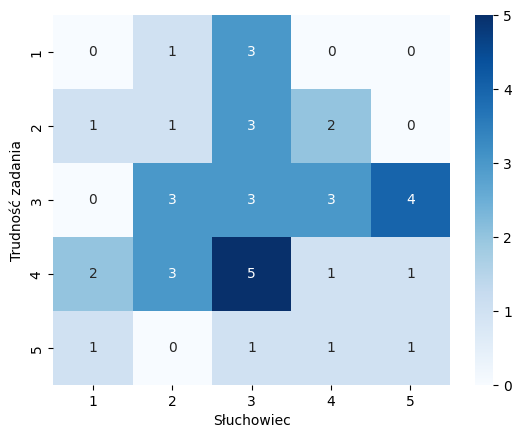

##############################################################
Kinestetyk
-------------------------------------
1a
Kinestetyk  1  2  3  4  5
1a_trud                  
1           1  2  1  3  0
2           3  5  1  5  0
3           4  8  1  0  1
4           1  2  0  1  0
5           0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 12.290382819794585
P-value: 0.7237601563693177
Brak podstaw do odrzucenia H0.


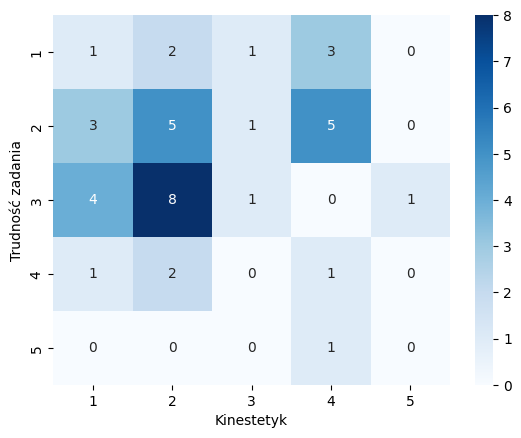

-------------------------------------
1b
Kinestetyk  1   2  3  4  5
1b_trud                   
1           3   4  0  5  1
2           4  12  2  1  0
3           2   1  1  3  0
4           0   0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 15.25856874463686
P-value: 0.22759974503666597
Brak podstaw do odrzucenia H0.


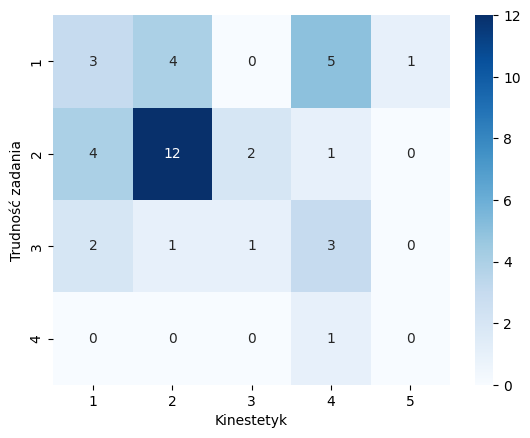

-------------------------------------
2a
Kinestetyk  1  2  3  4  5
2a_trud                  
1           3  4  0  1  0
2           2  8  1  4  0
3           2  3  1  5  0
4           2  1  1  0  1
5           0  1  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 17.475916022974843
P-value: 0.35546529891389494
Brak podstaw do odrzucenia H0.


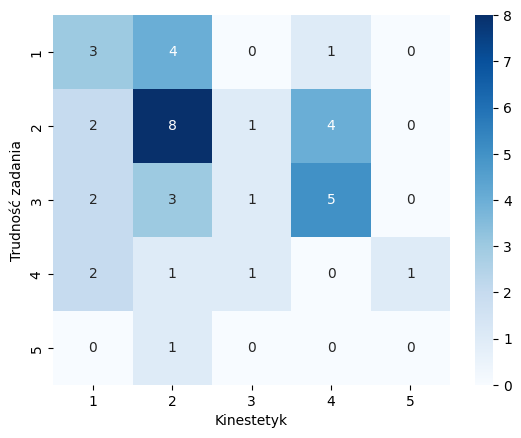

-------------------------------------
2b
Kinestetyk  1  2  3  4  5
2b_trud                  
1           2  5  1  4  0
2           4  7  1  3  0
3           1  4  0  1  1
4           2  1  1  1  0
5           0  0  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 12.335387488328665
P-value: 0.7205877025642184
Brak podstaw do odrzucenia H0.


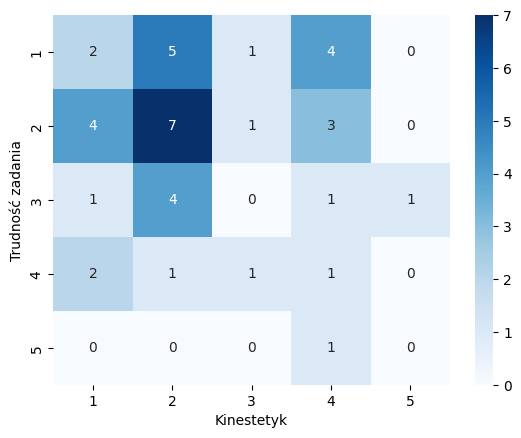

-------------------------------------
3a
Kinestetyk  1  2  3  4  5
3a_trud                  
1           1  2  0  4  0
2           2  6  1  4  0
3           4  6  0  0  0
4           1  3  2  2  1
5           1  0  0  0  0
Chi2 test conducted...
Chi-squared test statistic value: 19.97545228917778
P-value: 0.22132830207653434
Brak podstaw do odrzucenia H0.


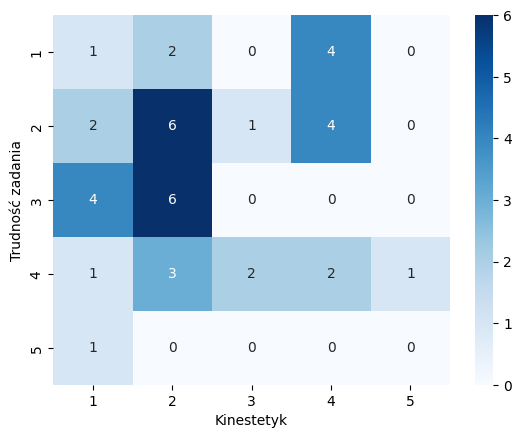

-------------------------------------
3b
Kinestetyk  1  2  3  4  5
3b_trud                  
1           2  0  0  2  0
2           2  3  0  2  0
3           1  8  0  4  0
4           4  3  2  2  1
5           0  3  1  0  0
Chi2 test conducted...
Chi-squared test statistic value: 18.572912925854105
P-value: 0.29143097380171756
Brak podstaw do odrzucenia H0.


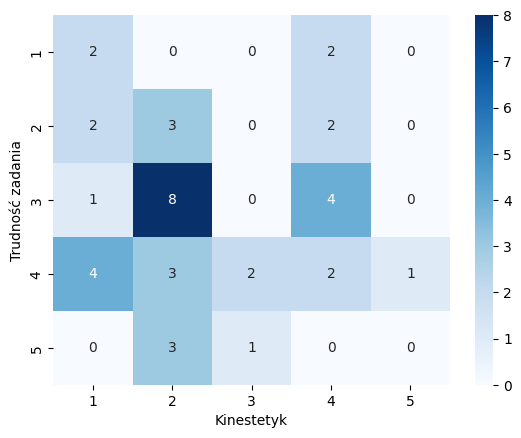

##############################################################
MAT
-------------------------------------
1a
MAT      NO_VAL  VAL
1a_trud             
1             3    4
2             6    8
3             6    8
4             3    1
5             0    1
Chi2 test conducted...
Chi-squared test statistic value: 2.3376623376623376
P-value: 0.6739207353876224
Brak podstaw do odrzucenia H0.


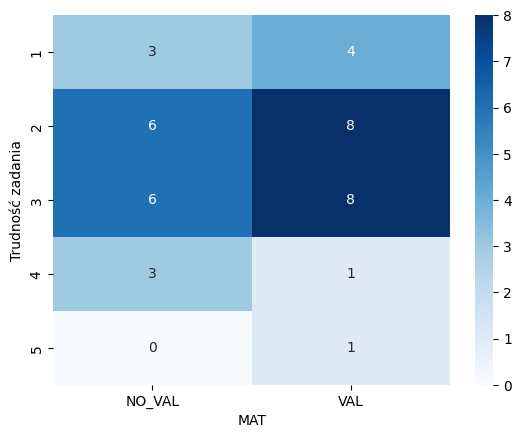

-------------------------------------
1b
MAT      NO_VAL  VAL
1b_trud             
1             5    8
2             9   10
3             4    3
4             0    1
Chi2 test conducted...
Chi-squared test statistic value: 1.5028246607193974
P-value: 0.6816185537242463
Brak podstaw do odrzucenia H0.


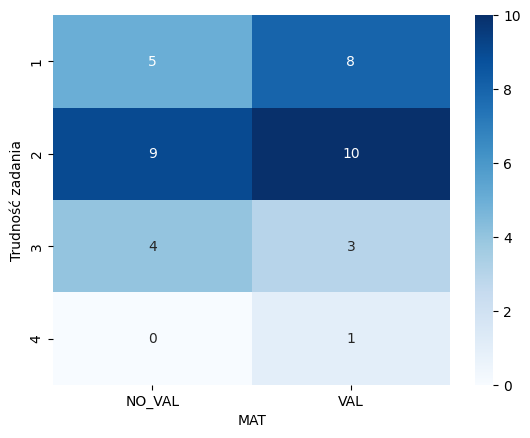

-------------------------------------
2a
MAT      NO_VAL  VAL
2a_trud             
1             3    5
2             7    8
3             6    5
4             1    4
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 3.088460361187633
P-value: 0.5431324536524234
Brak podstaw do odrzucenia H0.


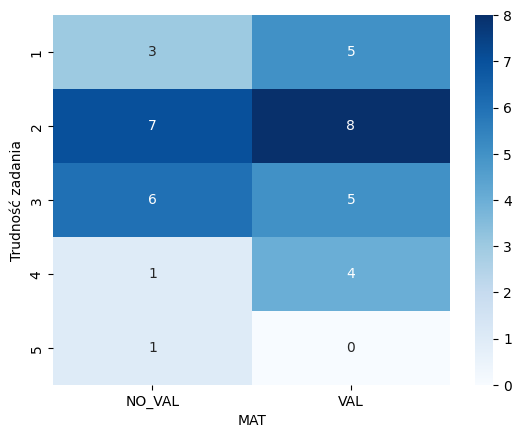

-------------------------------------
2b
MAT      NO_VAL  VAL
2b_trud             
1             4    8
2             9    6
3             2    5
4             3    2
5             0    1
Chi2 test conducted...
Chi-squared test statistic value: 4.05964405964406
P-value: 0.3979940800485828
Brak podstaw do odrzucenia H0.


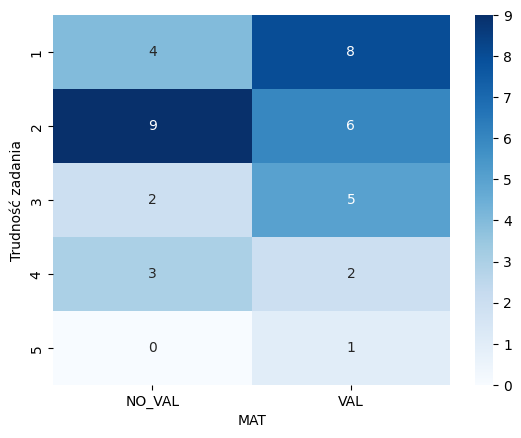

-------------------------------------
3a
MAT      NO_VAL  VAL
3a_trud             
1             3    4
2             7    6
3             5    5
4             2    7
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 3.6338969672303003
P-value: 0.45781308818504163
Brak podstaw do odrzucenia H0.


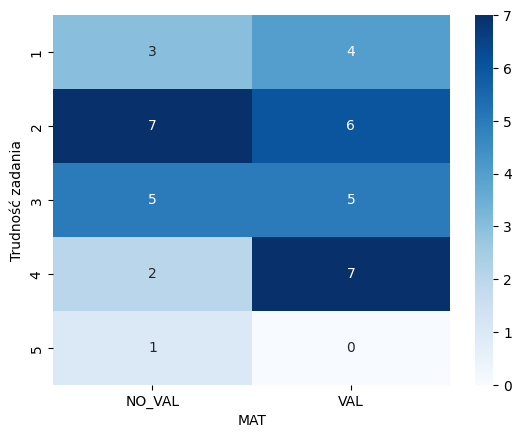

-------------------------------------
3b
MAT      NO_VAL  VAL
3b_trud             
1             0    4
2             4    3
3             8    5
4             4    8
5             2    2
Chi2 test conducted...
Chi-squared test statistic value: 5.826765826765827
P-value: 0.21246442461428933
Brak podstaw do odrzucenia H0.


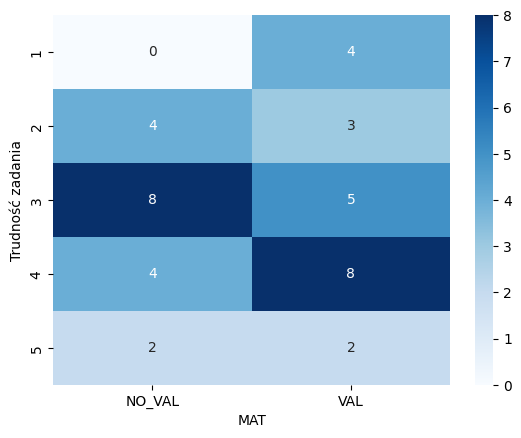

##############################################################
POL
-------------------------------------
1a
POL      NO_VAL  VAL
1a_trud             
1             5    2
2            11    3
3            10    4
4             4    0
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 1.9047619047619047
P-value: 0.753270170475909
Brak podstaw do odrzucenia H0.


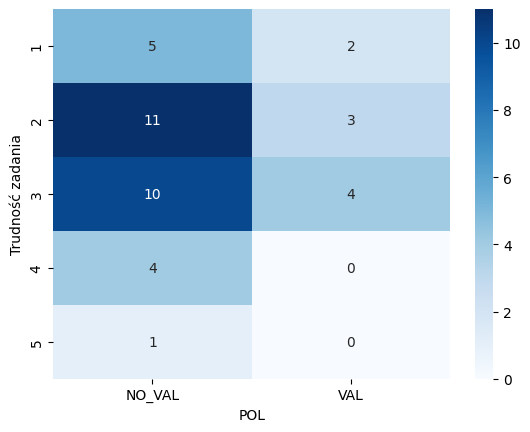

-------------------------------------
1b
POL      NO_VAL  VAL
1b_trud             
1            11    2
2            14    5
3             5    2
4             1    0
Chi2 test conducted...
Chi-squared test statistic value: 0.9743962884879691
P-value: 0.807446962696051
Brak podstaw do odrzucenia H0.


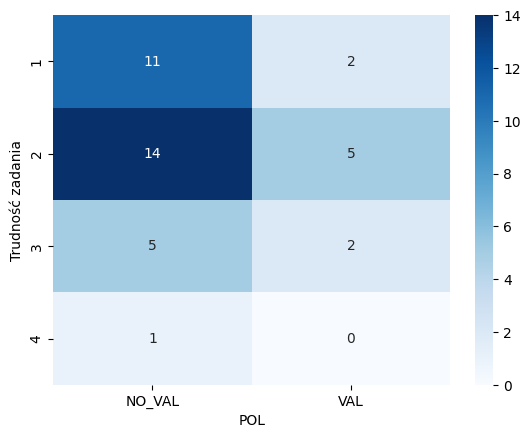

-------------------------------------
2a
POL      NO_VAL  VAL
2a_trud             
1             8    0
2            12    3
3             8    3
4             3    2
5             0    1
Chi2 test conducted...
Chi-squared test statistic value: 6.8426197458455515
P-value: 0.1444424862925862
Brak podstaw do odrzucenia H0.


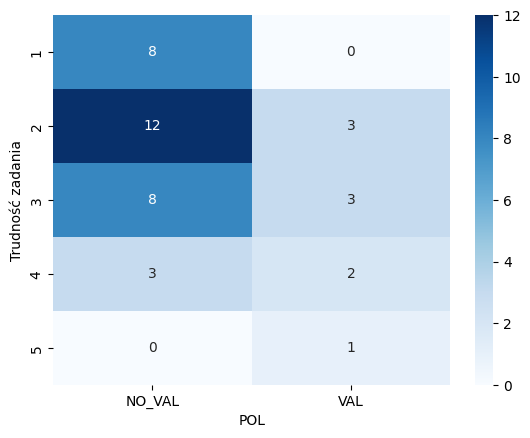

-------------------------------------
2b
POL      NO_VAL  VAL
2b_trud             
1             9    3
2            10    5
3             6    1
4             5    0
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 3.0653695169824204
P-value: 0.5469461929056769
Brak podstaw do odrzucenia H0.


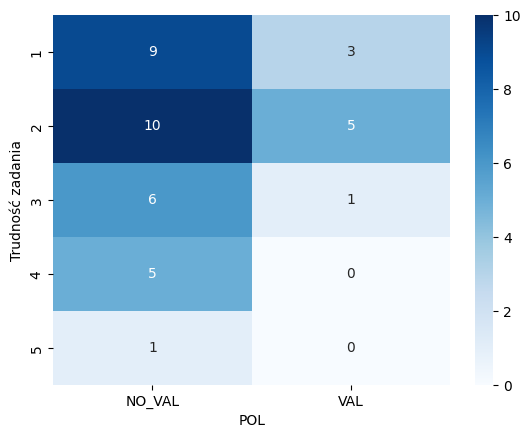

-------------------------------------
3a
POL      NO_VAL  VAL
3a_trud             
1             7    0
2             9    4
3             8    2
4             6    3
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 3.4739454094292808
P-value: 0.48185104526726574
Brak podstaw do odrzucenia H0.


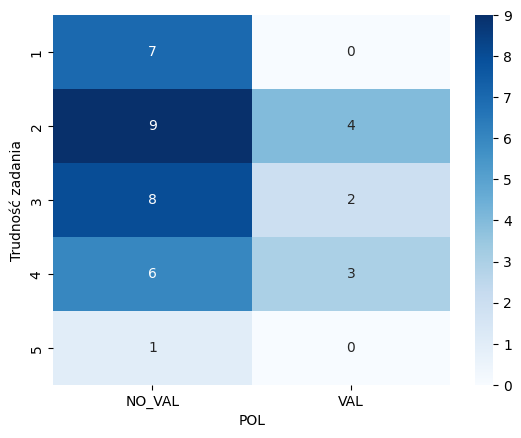

-------------------------------------
3b
POL      NO_VAL  VAL
3b_trud             
1             4    0
2             6    1
3            10    3
4            10    2
5             1    3
Chi2 test conducted...
Chi-squared test statistic value: 7.991387346226056
P-value: 0.09189419692448972
Brak podstaw do odrzucenia H0.


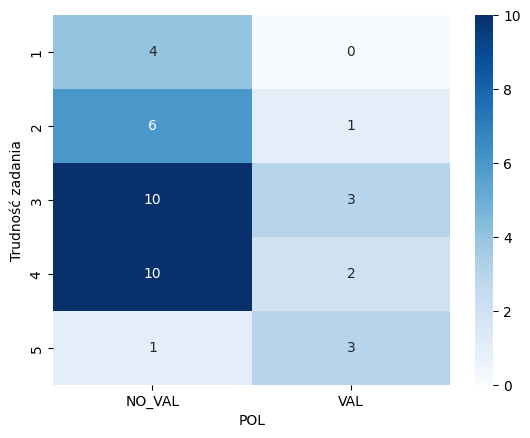

##############################################################
HIST
-------------------------------------
1a
HIST     NO_VAL  VAL
1a_trud             
1             7    0
2            10    4
3            14    0
4             4    0
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 8.253968253968253
P-value: 0.0827057186380282
Brak podstaw do odrzucenia H0.


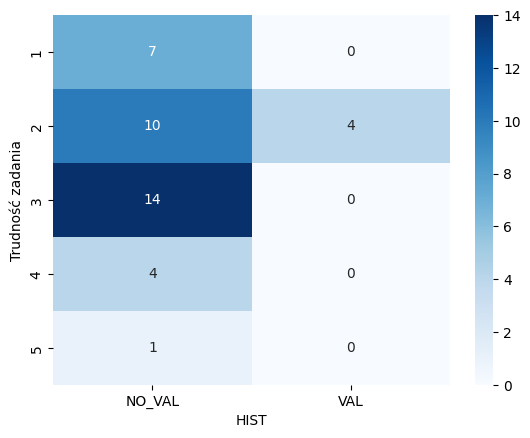

-------------------------------------
1b
HIST     NO_VAL  VAL
1b_trud             
1            13    0
2            16    3
3             6    1
4             1    0
Chi2 test conducted...
Chi-squared test statistic value: 2.4060150375939853
P-value: 0.4925159075524047
Brak podstaw do odrzucenia H0.


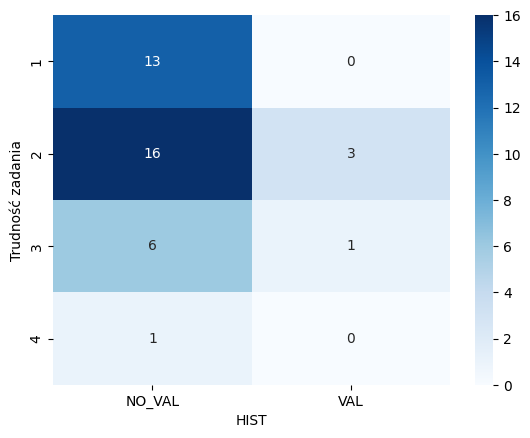

-------------------------------------
2a
HIST     NO_VAL  VAL
2a_trud             
1             7    1
2            13    2
3            11    0
4             4    1
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 2.1296296296296298
P-value: 0.7119310084717607
Brak podstaw do odrzucenia H0.


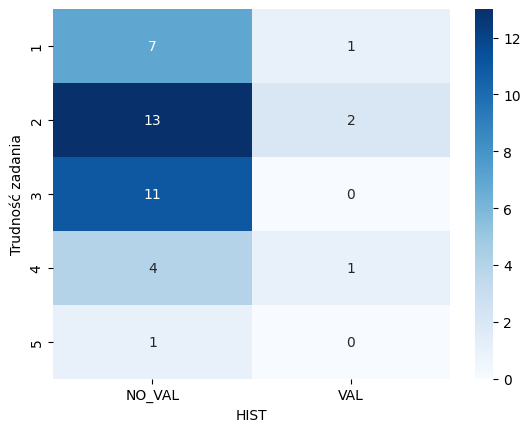

-------------------------------------
2b
HIST     NO_VAL  VAL
2b_trud             
1            11    1
2            12    3
3             7    0
4             5    0
5             1    0
Chi2 test conducted...
Chi-squared test statistic value: 3.1481481481481484
P-value: 0.533346385180884
Brak podstaw do odrzucenia H0.


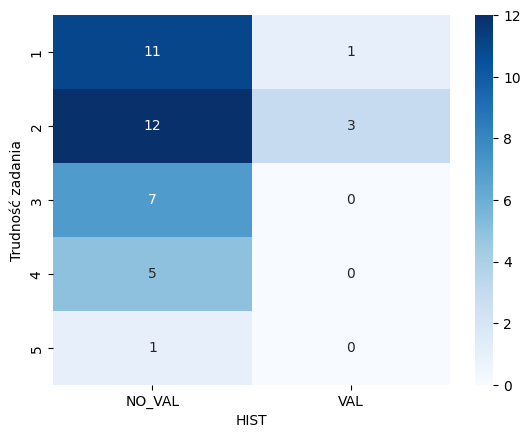

-------------------------------------
3a
HIST     NO_VAL  VAL
3a_trud             
1             7    0
2            13    0
3             9    1
4             7    2
5             0    1
Chi2 test conducted...
Chi-squared test statistic value: 12.716049382716049
P-value: 0.012749883062796754
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


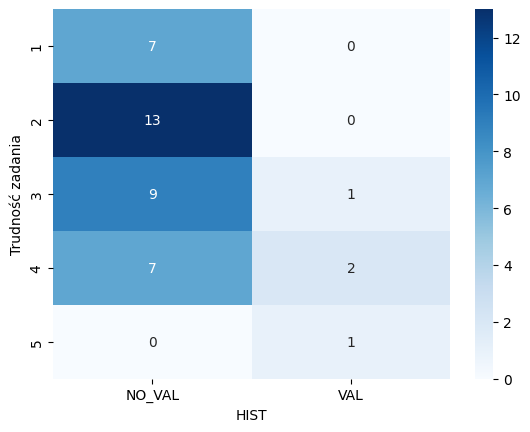

-------------------------------------
3b
HIST     NO_VAL  VAL
3b_trud             
1             4    0
2             7    0
3            11    2
4            11    1
5             3    1
Chi2 test conducted...
Chi-squared test statistic value: 2.6780626780626777
P-value: 0.6130587833890292
Brak podstaw do odrzucenia H0.


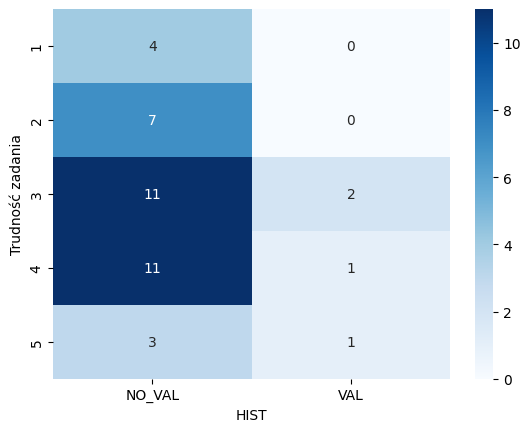

##############################################################
Typ_uczenia
-------------------------------------
1a
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
1a_trud                                                           
1                            5           0           0           2
2                            2           0           3           9
3                            2           1           2           9
4                            0           1           1           2
5                            1           0           0           0
Chi2 test conducted...
Chi-squared test statistic value: 18.753246753246753
P-value: 0.09465988102597182
Brak podstaw do odrzucenia H0.


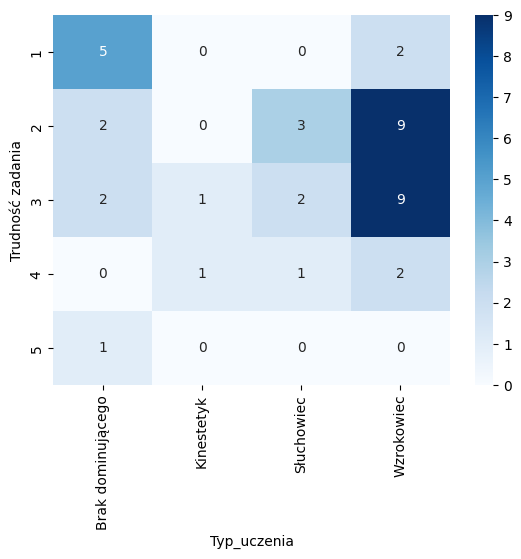

-------------------------------------
1b
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
1b_trud                                                           
1                            2           2           1           8
2                            6           0           3          10
3                            2           0           2           3
4                            0           0           0           1
Chi2 test conducted...
Chi-squared test statistic value: 7.40578719526088
P-value: 0.5949493011923894
Brak podstaw do odrzucenia H0.


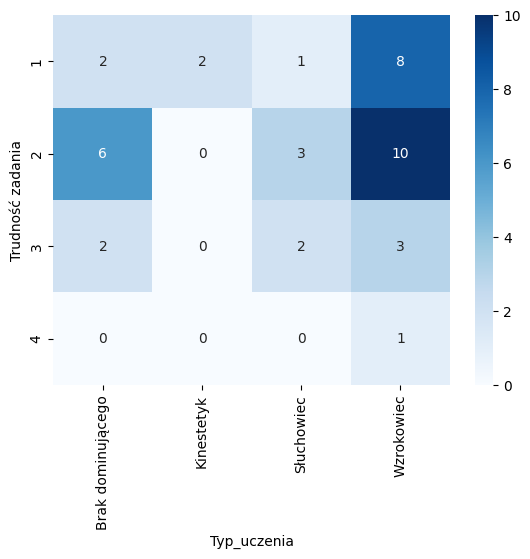

-------------------------------------
2a
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
2a_trud                                                           
1                            0           1           1           6
2                            6           0           2           7
3                            4           0           1           6
4                            0           1           2           2
5                            0           0           0           1
Chi2 test conducted...
Chi-squared test statistic value: 13.813039485766758
P-value: 0.31280630703307316
Brak podstaw do odrzucenia H0.


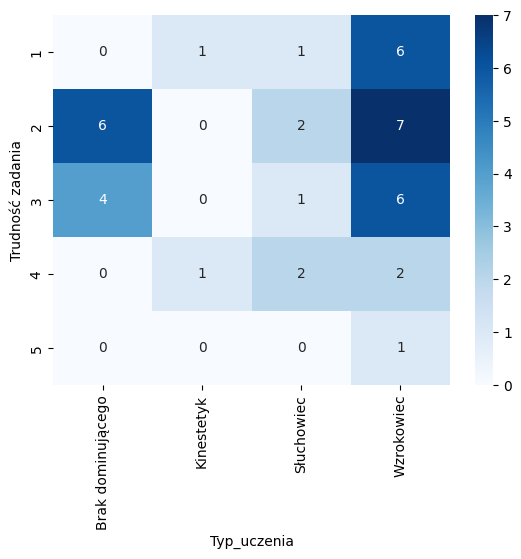

-------------------------------------
2b
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
2b_trud                                                           
1                            5           0           0           7
2                            2           1           3           9
3                            3           1           1           2
4                            0           0           2           3
5                            0           0           0           1
Chi2 test conducted...
Chi-squared test statistic value: 12.39134199134199
P-value: 0.4147840365623921
Brak podstaw do odrzucenia H0.


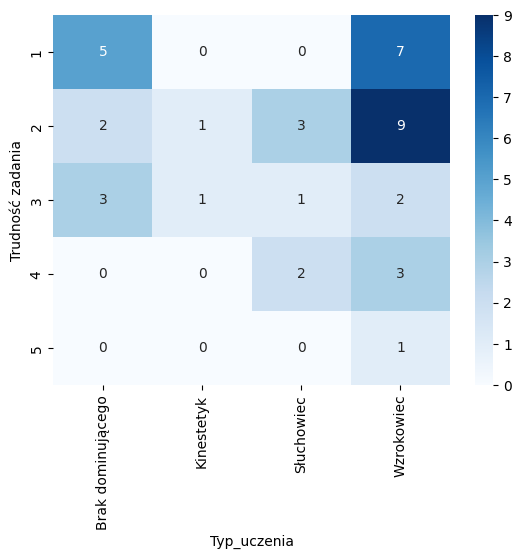

-------------------------------------
3a
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
3a_trud                                                           
1                            1           1           1           4
2                            4           0           2           7
3                            3           0           2           5
4                            2           1           1           5
5                            0           0           0           1
Chi2 test conducted...
Chi-squared test statistic value: 4.785851185851186
P-value: 0.964751709814146
Brak podstaw do odrzucenia H0.


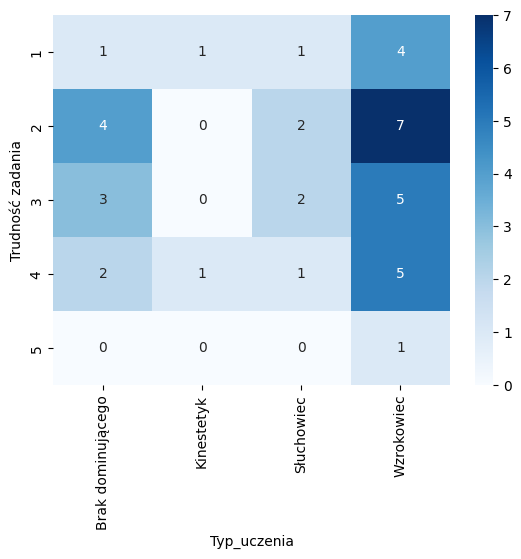

-------------------------------------
3b
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
3b_trud                                                           
1                            0           1           0           3
2                            1           0           1           5
3                            5           0           3           5
4                            3           1           1           7
5                            1           0           1           2
Chi2 test conducted...
Chi-squared test statistic value: 10.043734043734045
P-value: 0.612123767043844
Brak podstaw do odrzucenia H0.


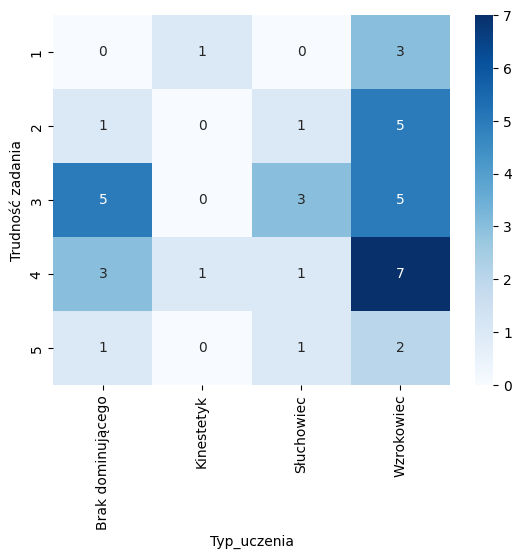

In [52]:
for col in columns:
    print('##############################################################')
    print(col)
    for pref in prefix:
        print('-------------------------------------')
        print(pref)
        two_categorical_variable_test(df_merge, f'{pref}_trud', col, ALPHA)
        plot_heatmap(df_merge, f'{pref}_trud', col, 'Trudność zadania', col, cmap='Blues')

In [53]:
posthocNemenyi_test(df_merge, '3a_trud', 'HIST', ALPHA)
print()
posthocNemenyi_test(df_merge, '1a_trud', 'Wzrokowiec', ALPHA)
print()
posthocNemenyi_test(df_merge, '1b_trud', 'Czyt_ze_zroz', ALPHA)
print()
posthocNemenyi_test(df_merge, '2a_trud', 'Czyt_ze_zroz', ALPHA)
print()
posthocNemenyi_test(df_merge, '3a_trud', 'Spostrzeg', ALPHA)

+--------+----------+----------+
|        |   NO_VAL |      VAL |
+========+==========+==========+
| NO_VAL | 1        | 0.001458 |
+--------+----------+----------+
| VAL    | 0.001458 | 1        |
+--------+----------+----------+

+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.153985 | 0.918911 | 0.107651 |
+----+----------+----------+----------+----------+
|  3 | 0.153985 | 1        | 0.437802 | 0.730081 |
+----+----------+----------+----------+----------+
|  5 | 0.918911 | 0.437802 | 1        | 0.217196 |
+----+----------+----------+----------+----------+
|  2 | 0.107651 | 0.730081 | 0.217196 | 1        |
+----+----------+----------+----------+----------+

+----+----------+----------+----------+----------+----------+
|    |        4 |        2 |        3 |        1 |        5 |
+====+==========+==========+==========+==========+==========+
|  4 | 1        | 0.

In [56]:
posthocNemenyi_test(df_merge, '3a_trud', 'Podziel_uwg', ALPHA)
print()
posthocNemenyi_test(df_merge, '2b_trud', 'Stres', ALPHA)
print()
posthocNemenyi_test(df_merge, '3a_trud', 'Samopocz', ALPHA)
print()
posthocNemenyi_test(df_merge, '3a_trud', 'HIST_roz', ALPHA)
print()
posthocNemenyi_test(df_merge, '3b_trud', 'JP_roz', ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        5 |        4 |        3 |        2 |        1 |
+====+==========+==========+==========+==========+==========+
|  5 | 1        | 0.99888  | 0.648016 | 0.999376 | 0.67615  |
+----+----------+----------+----------+----------+----------+
|  4 | 0.99888  | 1        | 0.801283 | 0.987862 | 0.55616  |
+----+----------+----------+----------+----------+----------+
|  3 | 0.648016 | 0.801283 | 1        | 0.514418 | 0.175025 |
+----+----------+----------+----------+----------+----------+
|  2 | 0.999376 | 0.987862 | 0.514418 | 1        | 0.777687 |
+----+----------+----------+----------+----------+----------+
|  1 | 0.67615  | 0.55616  | 0.175025 | 0.777687 | 1        |
+----+----------+----------+----------+----------+----------+

+----+----------+----------+----------+----------+----------+
|    |        2 |        1 |        3 |        4 |        5 |
+====+==========+==========+==========+==========+==========+
|  2 | 

In [60]:
posthocNemenyi_test(df_merge, '3b_trud', 'Ilość_snu', ALPHA)
print()
posthocNemenyi_test(df_merge, '1a_trud', 'Wady_wzroku', ALPHA)
print()
posthocNemenyi_test(df_merge, '1b_trud', 'Rok_urodzenia', ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        6 |       <6 |        8 |        7 |       8< |
+====+==========+==========+==========+==========+==========+
| 6  | 1        | 0.999188 | 0.28096  | 0.988591 | 0.610589 |
+----+----------+----------+----------+----------+----------+
| <6 | 0.999188 | 1        | 0.400919 | 0.999249 | 0.758044 |
+----+----------+----------+----------+----------+----------+
| 8  | 0.28096  | 0.400919 | 1        | 0.539293 | 0.96791  |
+----+----------+----------+----------+----------+----------+
| 7  | 0.988591 | 0.999249 | 0.539293 | 1        | 0.876912 |
+----+----------+----------+----------+----------+----------+
| 8< | 0.610589 | 0.758044 | 0.96791  | 0.876912 | 1        |
+----+----------+----------+----------+----------+----------+

+----+----------+----------+
|    |        0 |        1 |
+====+==========+==========+
|  0 | 1        | 0.020799 |
+----+----------+----------+
|  1 | 0.020799 | 1        |
+----+----------+--

Podsumowanie - poprawność, każda grafika osobno:
Istotne statystycznie:
- Historia (pisał vs nie pisał): 3a (pisał z nie pisał - tylko dwie grupy)
- Wzrokowiec: 1a (słabo się różnicuje)
- Czytanie ze zrozumieniem: 1b, 2a (słabo się różnicuje)
- Spostrzegawczość: 3a (słabo się różnicuje)
- Podzielność uwagi: 3a (słabo się różnicuje)
- Stres: 2b (słabo się różnicuje)
- Sampopoczucie: 3a (3 vs 4)
- Hist rozszerzona: 3a (powyżej 70% vs nie pisał)
- Polski rozszerzony: 3b (50-70% vs nie pisał)
- Ilość snu: 3b
- Wady wzroku: 1a
- Rok urodzenia: 1b
